## Classificação do Risco de Acidentes Graves em Rodovias Federais através do Aprendizado de Máquina



In [1]:
# Importando as bibliotecas:

import pandas as pd
import statistics  as sts
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import math
%matplotlib inline
import sys
import os
import pandas_profiling
import sweetviz as sv
from scipy.stats import mode
from datetime import datetime, date, time
import warnings
warnings.filterwarnings('ignore')

In [2]:
#!pip install sweetviz

# Coleta de Dados
##### Dados oficiais retirados diretamente da Polícia Rodoviária Federal (PRF), no site: https://portal.prf.gov.br/dados-abertos-acidentes

###### datatran2019.csv:  dados agrupados por ocorrência
###### acidentes2019_PESSOA.csv: dados agrupados por pessoa 

In [3]:
# Leitura dos datasets datatran2019 e acidentes2019_PESSOA.csv  pelo Pandas
# usando o comando parse_dates para organizar a coluna 'data_inversa' em ordem crescente
acidentes = pd.read_csv("datatran2019.csv", sep=';',encoding='latin-1', parse_dates=['data_inversa'])
acidentes_pessoa = pd.read_csv("acidentes2019_PESSOA.csv", sep=';',encoding='latin-1', parse_dates=['data_inversa'])


## USAR O datatran2019_TCC(alterado no calc) ou o datatran2019, DEVIDO AO KM???? 

###### OBSERVAÇÃO: Antes da leitura do dataset, foi feito uma alteração em dois atributos:  'br'e 'km'. Ambos foram transformados em um leitor de planilhas com a retirada das casas decimais. Ou seja, antes da importação dos datasets, já foi feito um "trabalho" nos dados!

In [4]:
# Comando que, ao visualizar o dataframe,  mostra TODAS as colunas dos dataframes utilizados
pd.set_option('display.max_columns', None)

In [5]:
# Verificando as 10 primeiras linhas do Dataframe  "acidentes" 
acidentes.head(10)

,id,data_inversa,dia_semana,horario,uf,br,km,municipio,causa_acidente,tipo_acidente,classificacao_acidente,fase_dia,sentido_via,condicao_metereologica,tipo_pista,tracado_via,uso_solo,pessoas,mortos,feridos_leves,feridos_graves,ilesos,ignorados,feridos,veiculos,latitude,longitude,regional,delegacia,uop
0,182210.0,2019-01-01,terça-feira,01:30:00,SP,116.0,218,GUARULHOS,Falta de Atenção à Condução,Colisão com objeto estático,Com Vítimas Feridas,Plena Noite,Crescente,Céu Claro,Múltipla,Curva,Sim,4,0,4,0,0,0,4,1,"-23,46052014","-46,48772478",SR-SP,DEL6/1,UOP01/SP
1,182211.0,2019-01-01,terça-feira,01:30:00,PR,373.0,"177,3",PONTA GROSSA,Falta de Atenção à Condução,Colisão traseira,Com Vítimas Feridas,Plena Noite,Crescente,Nublado,Dupla,Reta,Sim,1,0,1,0,0,0,1,1,"-25,05533957","-50,22776753",SR-PR,DEL7/3,UOP01/PR
2,182212.0,2019-01-01,terça-feira,00:45:00,SC,101.0,16,GARUVA,Animais na Pista,Colisão com objeto estático,Com Vítimas Feridas,Plena Noite,Decrescente,Céu Claro,Dupla,Reta,Sim,1,0,1,0,0,0,1,1,"-26,1216","-48,8826",SR-SC,DEL8/3,UOP01/SC
3,182214.0,2019-01-01,terça-feira,00:00:00,CE,20.0,"429,5",FORTALEZA,Ingestão de Substâncias Psicoativas,Colisão com objeto estático,Com Vítimas Feridas,Plena Noite,Decrescente,Nublado,Dupla,Viaduto,Sim,1,0,0,1,0,0,1,1,"-3,76999","-38,670063",SR-CE,DEL16/1,UOP02/CE
4,182215.0,2019-01-01,terça-feira,01:00:00,MG,381.0,327,NOVA ERA,Falta de Atenção à Condução,Colisão transversal,Com Vítimas Feridas,Plena Noite,Decrescente,Nublado,Simples,Interseção de vias,Não,2,0,0,1,1,0,1,2,"-19,7609","-43,0306",SR-MG,DEL4/3,UOP01/MG
5,182216.0,2019-01-01,terça-feira,01:50:00,SC,470.0,"42,6",GASPAR,Ingestão de Substâncias Psicoativas,Saída de leito carroçável,Com Vítimas Feridas,Plena Noite,Decrescente,Céu Claro,Simples,Reta,Sim,1,0,1,0,0,0,1,1,"-26,875719","-49,003746",SR-SC,DEL8/4,UOP01/SC
6,182217.0,2019-01-01,terça-feira,01:30:00,MS,163.0,"721,5",COXIM,Animais na Pista,Atropelamento de Animal,Sem Vítimas,Plena Noite,Crescente,Céu Claro,Simples,Reta,Não,1,0,0,0,0,1,0,1,"-18,575739","-54,76353",SR-MS,DEL3/6,UOP01/MS
7,182219.0,2019-01-01,terça-feira,00:50:00,GO,50.0,"280,3",CATALAO,Desobediência às normas de trânsito pelo condutor,Colisão transversal,Com Vítimas Feridas,Plena Noite,Decrescente,Céu Claro,Dupla,Reta,Sim,3,0,1,0,2,0,1,2,"-18,1784","-47,9362",SR-GO,DEL1/6,UOP01/GO
8,182220.0,2019-01-01,terça-feira,02:25:00,GO,60.0,172,GOIANIA,Desobediência às normas de trânsito pelo pedestre,Atropelamento de Pedestre,Com Vítimas Fatais,Plena Noite,Decrescente,Chuva,Dupla,Reta,Não,3,1,0,0,0,2,0,1,"-16,738","-49,4076",SR-GO,DEL1/1,UOP02/GO
9,182223.0,2019-01-01,terça-feira,02:15:00,RS,386.0,"73,7",BOA VISTA DAS MISSOES,Ingestão de Álcool,Colisão frontal,Com Vítimas Feridas,Plena Noite,Decrescente,Nublado,Simples,Curva,Sim,4,0,2,2,0,0,4,2,"-27,693541","-53,300945",SR-RS,DEL08,UOP02/RS


In [6]:
# Verificando as informações sobre os dataframe, incluindo a memória
acidentes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 67446 entries, 0 to 67445
Data columns (total 30 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   id                      67446 non-null  float64       
 1   data_inversa            67446 non-null  datetime64[ns]
 2   dia_semana              67446 non-null  object        
 3   horario                 67446 non-null  object        
 4   uf                      67446 non-null  object        
 5   br                      67351 non-null  float64       
 6   km                      67351 non-null  object        
 7   municipio               67446 non-null  object        
 8   causa_acidente          67446 non-null  object        
 9   tipo_acidente           67446 non-null  object        
 10  classificacao_acidente  67446 non-null  object        
 11  fase_dia                67446 non-null  object        
 12  sentido_via             67446 non-null  object

In [7]:
# Dataframe 'acidentes': linhas e colunas
acidentes.shape


(67446, 30)

In [8]:
# conhecendo o dataframe acidentes_pessoa
acidentes_pessoa.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 162273 entries, 0 to 162272
Data columns (total 35 columns):
 #   Column                  Non-Null Count   Dtype         
---  ------                  --------------   -----         
 0   id                      162273 non-null  float64       
 1   pesid                   162272 non-null  float64       
 2   data_inversa            162273 non-null  datetime64[ns]
 3   dia_semana              162273 non-null  object        
 4   horario                 162273 non-null  object        
 5   uf                      162273 non-null  object        
 6   br                      162042 non-null  float64       
 7   km                      162042 non-null  object        
 8   municipio               162273 non-null  object        
 9   causa_acidente          162273 non-null  object        
 10  tipo_acidente           162273 non-null  object        
 11  classificacao_acidente  162273 non-null  object        
 12  fase_dia                162273

### Os dois datasets possuem vários atributos iguais, entretanto, há uma diferença significativa, em relação ao estudo: o primeiro, datatran2019_TCC tem interesse em separar o nº de acidentes, com os atributos de cada acidente. Já o segundo, acidentes2019_PESSOA, que provém da mesma base, individualiza as pessoas em cada acidente.
acidentes -- linhas 67446 x colunas: 30



acidentes_por_pessoa: linhas: 162273 x colunas: 35


#  Análise Exploratória dos Dados


Focaremos neste momento no estudo do daframe criado "acidentes"

#### Visualização através do SWEETIZ 

In [9]:
insights  = sv.analyze(acidentes) # cria o reporte e chama de insights
insights .show_html()

# sv.anlyze(acidentes).show_html()

                                             |          | [  0%]   00:00 -> (? left)

Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


#### Visualização do dataset com o Pandas Profiling

In [10]:
# Relatorio visual das colunas do dataframe
pandas_profiling.ProfileReport(acidentes,  title = "Relatório de criação de perfil do Pandas")

Summarize dataset:   0%|          | 0/43 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

mortos
0    62854
1     4063
2      389
3       91
4       32
5       12
6        4
7        1
dtype: int64


<AxesSubplot:xlabel='mortos'>

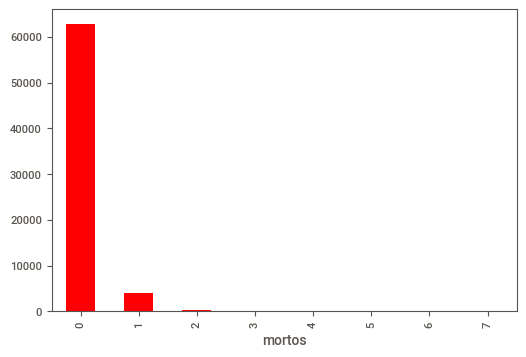

In [11]:
# Agrupando acidentes por mortes

agrupar_morte = acidentes.groupby(['mortos']).size()
print(agrupar_morte)
# verificando em um gráfico de barras
agrupar_morte.plot.bar(color = 'red')

In [12]:
# Verificando o total de mortes
Total_mortos = acidentes['mortos'].sum()
Total_pessoas = acidentes['pessoas'].sum()
print('Mortos = ', Total_mortos)
print('Pessoas envolvidas em acidentes = ', Total_pessoas)

Mortos =  5333
Pessoas envolvidas em acidentes =  162273


In [13]:
#Observando a porcentagem das mortes em relação ao número de pessoas envolvidas em acidentes
todos_envolvidos = acidentes['pessoas'].sum()
acidentes1 = round(acidentes[['ilesos','mortos','feridos_leves','feridos_graves', 'ignorados']].sum()/todos_envolvidos * 100, 1)
acidentes1

ilesos            42.3
mortos             3.3
feridos_leves     37.3
feridos_graves    11.4
ignorados          5.7
dtype: float64

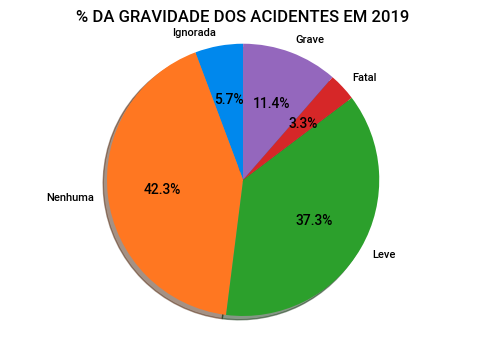

In [14]:
# Verificando em um gráfico de pizza
labels = 'Ignorada','Nenhuma', 'Leve','Fatal','Grave'
percentagem = [ 5.7, 42.3,37.3,3.3,11.4]

fig1, ax1 = plt.subplots()
ax1.pie(percentagem, labels=labels, autopct='%1.1f%%', shadow=True, startangle=90)

ax1.axis('equal')

#Título do gráfico
ax1.set_title('% DA GRAVIDADE DOS ACIDENTES EM 2019')

plt.show()



##### Verificando os dados acima, percebe-se que o número de mortes, em relação ao total de pessoas envolvidas, é relativamente baixo(3,3%), de forma que isso pode prejudicar a classificação nos algoritmos de Machine Learning(ML)


##### Entretanto, percebi que posso agregar os acidentes graves, juntamente aos fatais, fato de maior relevância para todo o estudo.




In [15]:
## Criando um dataset com os atributos 

#### EXPLORANDO OUTROS ATRIBUTOS

dia_semana
domingo          11298
quarta-feira      8374
quinta-feira      8755
segunda-feira     9134
sexta-feira      10381
sábado           11099
terça-feira       8405
dtype: int64


<AxesSubplot:xlabel='dia_semana'>

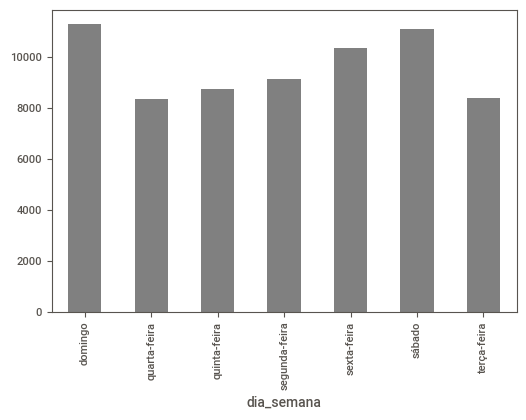

In [16]:
# Agrupando acidentes por dia da semana

agrupar_dia = acidentes.groupby(['dia_semana']).size()
print(agrupar_dia)
# verificando em um gráfico de barras
agrupar_dia.plot.bar(color = 'gray')

uf
AC     254
AL     629
AM     101
AP     128
BA    3471
CE    1694
DF    1090
ES    2842
GO    3354
MA    1075
MG    8720
MS    1435
MT    2137
PA     817
PB    1564
PE    2736
PI    1346
PR    7708
RJ    4606
RN    1437
RO    1533
RR     237
RS    4595
SC    8428
SE     612
SP    4377
TO     520
dtype: int64


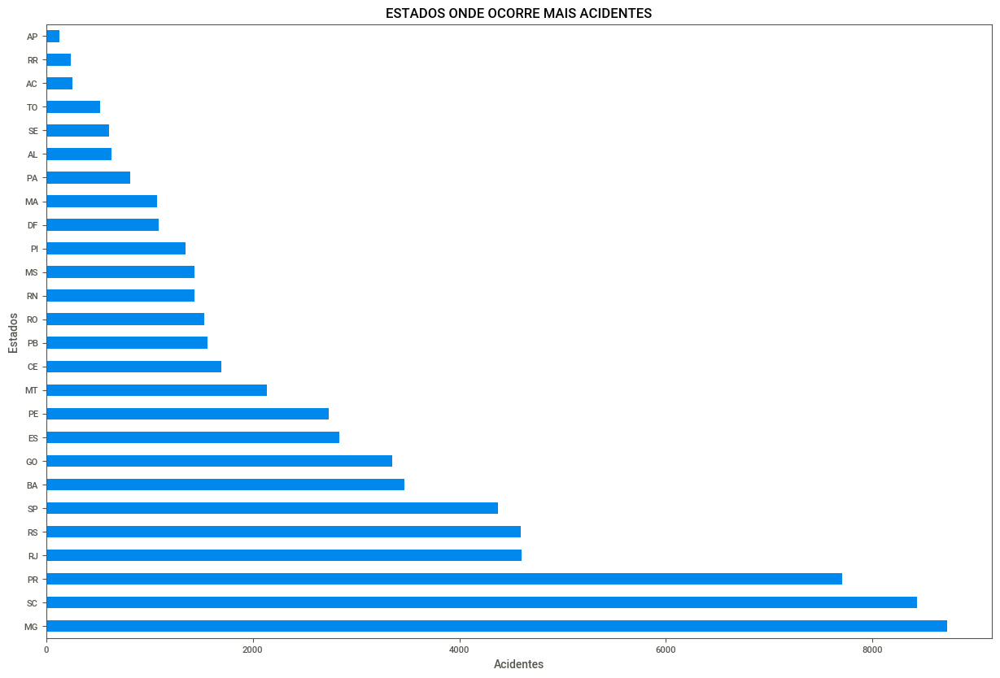

In [17]:
# Agrupando os acidentes por estado

agrupar_estado = acidentes.groupby(['uf']).size()
print(agrupar_estado)
# Estados em um gráfico de barra
fig = plt.figure(figsize=(15,10))
fig = acidentes['uf'].value_counts().head(26).plot.barh()
fig.set_title("ESTADOS ONDE OCORRE MAIS ACIDENTES")
fig.set_xlabel('Acidentes')
fig.set_ylabel('Estados')
plt.show();

br
10.0      366
20.0      933
30.0        7
40.0     3244
50.0      687
         ... 
484.0       2
487.0      17
488.0      30
493.0     261
495.0      19
Length: 115, dtype: int64


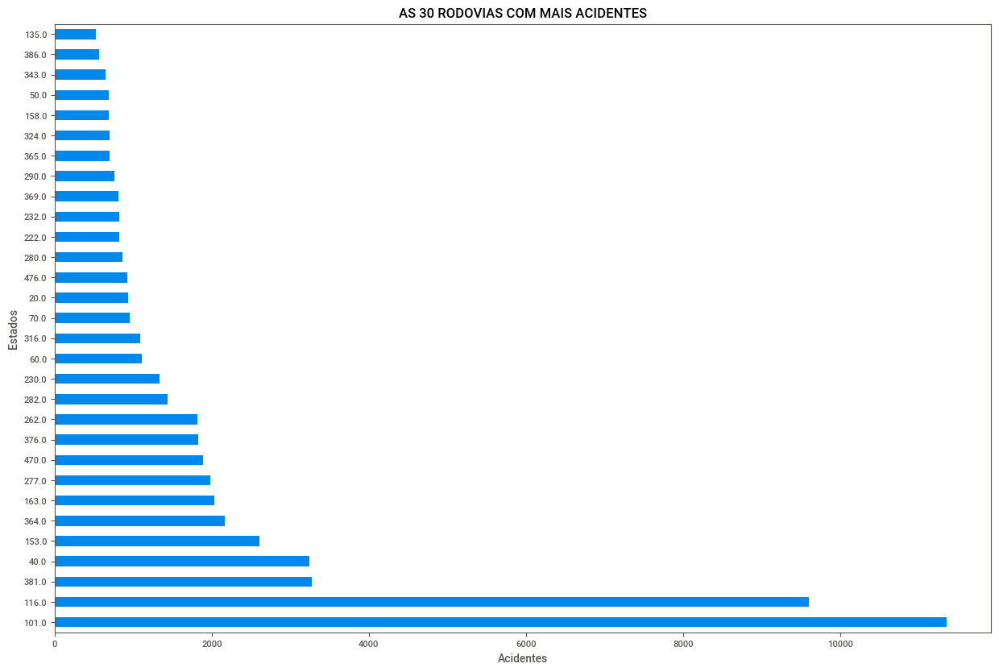

In [18]:
# !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
#Agrupando as estradas

agrupar_rodovia = acidentes.groupby(['br']).size()
print(agrupar_rodovia)
# Número de acidentes nas 30 principais rodovias em um gráfico de barra
fig = plt.figure(figsize=(15,10))
fig = acidentes['br'].value_counts().head(30).plot.barh()
fig.set_title("AS 30 RODOVIAS COM MAIS ACIDENTES")
fig.set_xlabel('Acidentes')
fig.set_ylabel('Estados')
plt.show();

causa_acidente
Agressão Externa                                                                    384
Animais na Pista                                                                   1527
Avarias e/ou desgaste excessivo no pneu                                             799
Carga excessiva e/ou mal acondicionada                                              305
Condutor Dormindo                                                                  2483
Defeito Mecânico no Veículo                                                        3732
Defeito na Via                                                                      973
Deficiência ou não Acionamento do Sistema de Iluminação/Sinalização do Veículo      160
Desobediência às normas de trânsito pelo condutor                                  8098
Desobediência às normas de trânsito pelo pedestre                                   392
Falta de Atenção do Pedestre                                                       1971
Falta de Atenção 

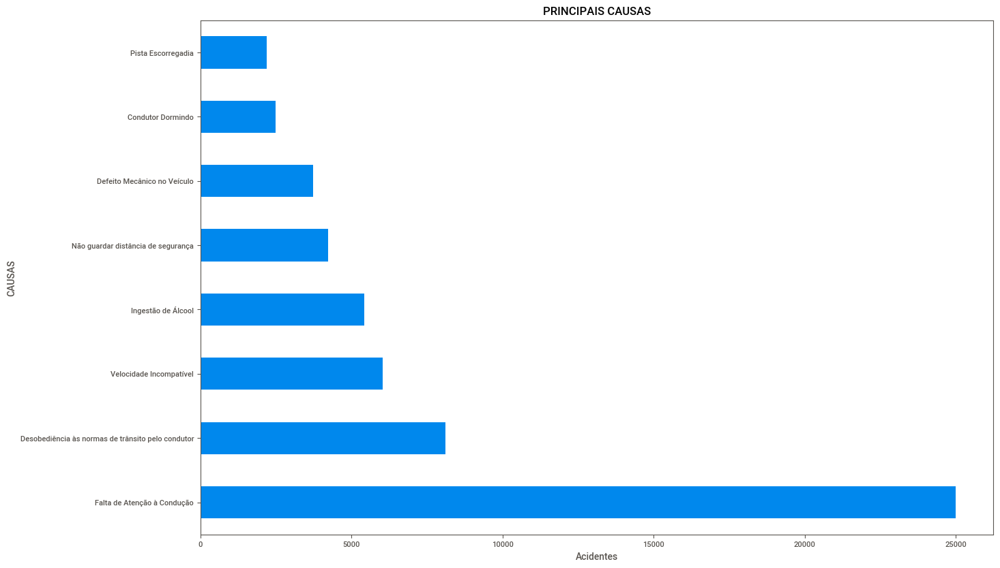

In [19]:
# Agrupando a causa do acidente
agrupandocausa = acidentes.groupby(['causa_acidente']).size()
print(agrupandocausa)

# 10 primeiros "Causas" em um gráfico de barra
fig = plt.figure(figsize=(15,10))
fig = acidentes['causa_acidente'].value_counts().head(8).plot.barh()
fig.set_title("PRINCIPAIS CAUSAS")
fig.set_xlabel('Acidentes')
fig.set_ylabel('CAUSAS')
plt.show();

tipo_acidente
Atropelamento de Animal             1237
Atropelamento de Pedestre           3380
Capotamento                         2274
Colisão com objeto em movimento      313
Colisão com objeto estático         4455
Colisão frontal                     4407
Colisão lateral                     8341
Colisão transversal                 8780
Colisão traseira                   13121
Danos eventuais                      181
Derramamento de carga                166
Engavetamento                        921
Incêndio                            1113
Queda de ocupante de veículo        3300
Saída de leito carroçável          10304
Tombamento                          5153
dtype: int64


<AxesSubplot:xlabel='tipo_acidente'>

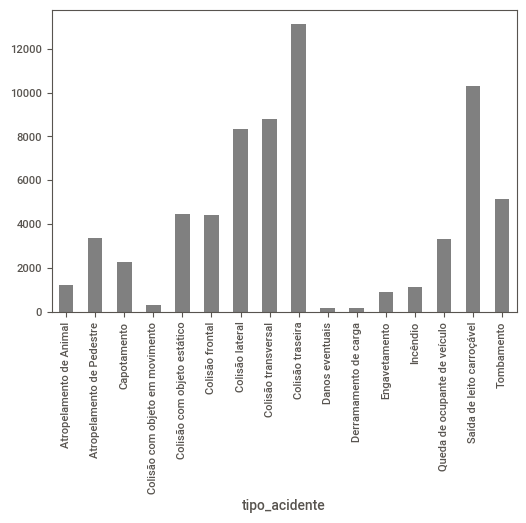

In [20]:
# Agrupando o tipo de acidente
agrupandotipo = acidentes.groupby(['tipo_acidente']).size()
print(agrupandotipo)
# verificando em um gráfico de barras
agrupandotipo.plot.bar(color = 'gray')

classificacao_acidente
Com Vítimas Fatais      4592
Com Vítimas Feridas    51183
Sem Vítimas            11671
dtype: int64


<AxesSubplot:xlabel='classificacao_acidente'>

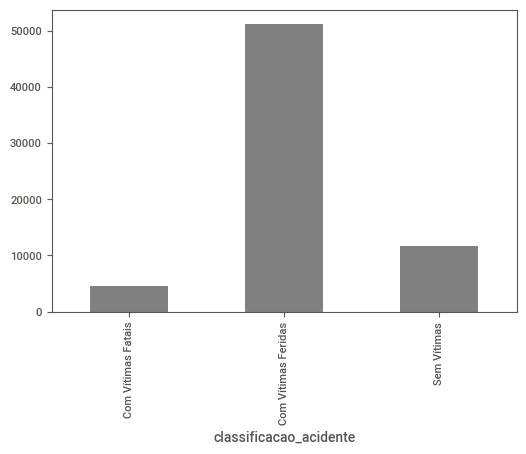

In [21]:
# agrupando a classificação do acidente
agrupandoclassificacao = acidentes.groupby(['classificacao_acidente']).size()
print(agrupandoclassificacao)
agrupandoclassificacao.plot.bar(color = 'gray')


##### Acima, mais uma vez, verifica-se a quantidade consideravel de acidentes com vítimas, o que dá um maior ensejo ao desenvolvimento do trabalho de ter um público alvo as vitimas fatais E os gravemente feridos

fase_dia
Amanhecer       3279
Anoitecer       3684
Plena Noite    23563
Pleno dia      36920
dtype: int64


<AxesSubplot:xlabel='fase_dia'>

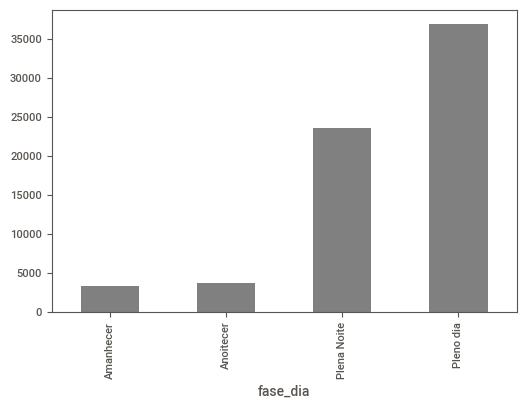

In [22]:
# agrupando a fase do dia do acidente
agrupandodia = acidentes.groupby(['fase_dia']).size()
print(agrupandodia)
agrupandodia.plot.bar(color = 'gray')

condicao_metereologica
Chuva                7216
Céu Claro           39370
Garoa/Chuvisco       2305
Granizo                 4
Ignorado              995
Neve                    1
Nevoeiro/Neblina      554
Nublado             11575
Sol                  5289
Vento                 137
dtype: int64


<AxesSubplot:xlabel='condicao_metereologica'>

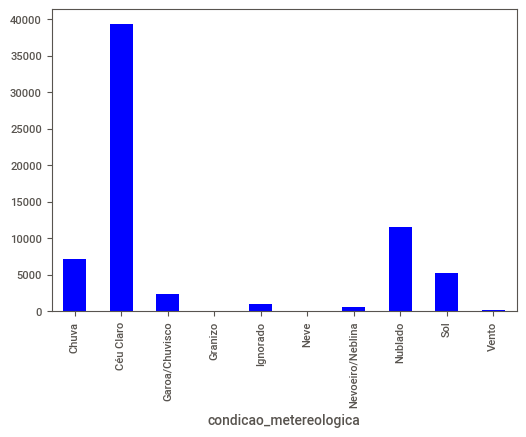

In [23]:
# agrupando a fase do dia do acidente
agrupando_tempo= acidentes.groupby(['condicao_metereologica']).size()
print(agrupando_tempo)
agrupando_tempo.plot.bar(color = 'blue')



tipo_pista
Dupla       27747
Múltipla     5420
Simples     34279
dtype: int64


<AxesSubplot:xlabel='tipo_pista'>

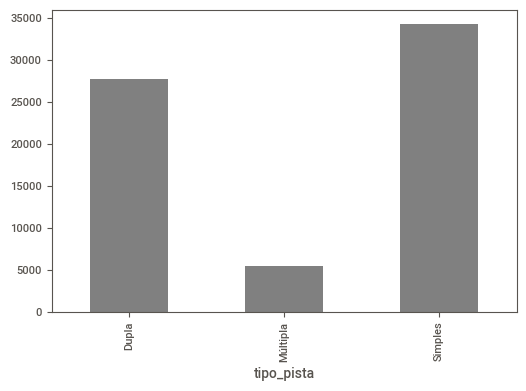

In [24]:
# agrupando o tipo de pista
agrupando_pista= acidentes.groupby(['tipo_pista']).size()
print(agrupando_pista)
agrupando_pista.plot.bar(color = 'gray')



veiculos
1     29974
2     32253
3      3971
4       837
5       270
6        91
7        25
8         9
9         5
10        4
11        4
12        2
14        1
dtype: int64


<AxesSubplot:xlabel='veiculos'>

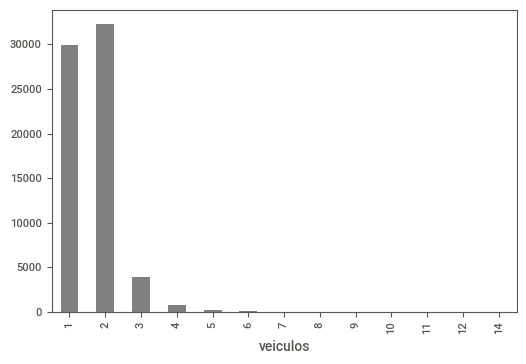

In [25]:
# agrupando o numero de veiculos
agrupando_veiculos= acidentes.groupby(['veiculos']).size()
print(agrupando_veiculos)
agrupando_veiculos.plot.bar(color = 'gray')

In [26]:
acidentes.corr()

,id,br,pessoas,mortos,feridos_leves,feridos_graves,ilesos,ignorados,feridos,veiculos
id,1.000000,0.006823,0.001768,0.006651,-0.005995,0.011893,-0.002728,0.011914,0.000494,0.006417
br,0.006823,1.000000,0.019569,0.014741,0.009176,0.022328,0.005839,0.001937,0.019230,0.014212
pessoas,0.001768,0.019569,1.000000,0.163523,0.532367,0.266335,0.727698,0.144561,0.608227,0.422014
mortos,0.006651,0.014741,0.163523,1.000000,-0.058207,0.092216,-0.016988,0.086468,-0.006677,0.039873
feridos_leves,-0.005995,0.009176,0.532367,-0.058207,1.000000,-0.051631,-0.002240,-0.069949,0.870375,0.072029
feridos_graves,0.011893,0.022328,0.266335,0.092216,-0.051631,1.000000,-0.054733,0.032016,0.446795,0.064686
ilesos,-0.002728,0.005839,0.727698,-0.016988,-0.002240,-0.054733,1.000000,-0.058582,-0.028992,0.439400
ignorados,0.011914,0.001937,0.144561,0.086468,-0.069949,0.032016,-0.058582,1.000000,-0.046877,0.094090
feridos,0.000494,0.019230,0.608227,-0.006677,0.870375,0.446795,-0.028992,-0.046877,1.000000,0.096419
veiculos,0.006417,0.014212,0.422014,0.039873,0.072029,0.064686,0.439400,0.094090,0.096419,1.000000


In [27]:
acidentes.head()

,id,data_inversa,dia_semana,horario,uf,br,km,municipio,causa_acidente,tipo_acidente,classificacao_acidente,fase_dia,sentido_via,condicao_metereologica,tipo_pista,tracado_via,uso_solo,pessoas,mortos,feridos_leves,feridos_graves,ilesos,ignorados,feridos,veiculos,latitude,longitude,regional,delegacia,uop
0,182210.0,2019-01-01,terça-feira,01:30:00,SP,116.0,218,GUARULHOS,Falta de Atenção à Condução,Colisão com objeto estático,Com Vítimas Feridas,Plena Noite,Crescente,Céu Claro,Múltipla,Curva,Sim,4,0,4,0,0,0,4,1,"-23,46052014","-46,48772478",SR-SP,DEL6/1,UOP01/SP
1,182211.0,2019-01-01,terça-feira,01:30:00,PR,373.0,"177,3",PONTA GROSSA,Falta de Atenção à Condução,Colisão traseira,Com Vítimas Feridas,Plena Noite,Crescente,Nublado,Dupla,Reta,Sim,1,0,1,0,0,0,1,1,"-25,05533957","-50,22776753",SR-PR,DEL7/3,UOP01/PR
2,182212.0,2019-01-01,terça-feira,00:45:00,SC,101.0,16,GARUVA,Animais na Pista,Colisão com objeto estático,Com Vítimas Feridas,Plena Noite,Decrescente,Céu Claro,Dupla,Reta,Sim,1,0,1,0,0,0,1,1,"-26,1216","-48,8826",SR-SC,DEL8/3,UOP01/SC
3,182214.0,2019-01-01,terça-feira,00:00:00,CE,20.0,"429,5",FORTALEZA,Ingestão de Substâncias Psicoativas,Colisão com objeto estático,Com Vítimas Feridas,Plena Noite,Decrescente,Nublado,Dupla,Viaduto,Sim,1,0,0,1,0,0,1,1,"-3,76999","-38,670063",SR-CE,DEL16/1,UOP02/CE
4,182215.0,2019-01-01,terça-feira,01:00:00,MG,381.0,327,NOVA ERA,Falta de Atenção à Condução,Colisão transversal,Com Vítimas Feridas,Plena Noite,Decrescente,Nublado,Simples,Interseção de vias,Não,2,0,0,1,1,0,1,2,"-19,7609","-43,0306",SR-MG,DEL4/3,UOP01/MG


### A partir da visualização dos principais atributos, decidi por fazer uma junção de dois atributos do dataset datatran2019_TCC : "mortos" + "feridos_graves". Vejamos:

In [28]:
acidentes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 67446 entries, 0 to 67445
Data columns (total 30 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   id                      67446 non-null  float64       
 1   data_inversa            67446 non-null  datetime64[ns]
 2   dia_semana              67446 non-null  object        
 3   horario                 67446 non-null  object        
 4   uf                      67446 non-null  object        
 5   br                      67351 non-null  float64       
 6   km                      67351 non-null  object        
 7   municipio               67446 non-null  object        
 8   causa_acidente          67446 non-null  object        
 9   tipo_acidente           67446 non-null  object        
 10  classificacao_acidente  67446 non-null  object        
 11  fase_dia                67446 non-null  object        
 12  sentido_via             67446 non-null  object

In [29]:
# ****************** CRIANDO O DATAFRAME 'risco_grave" COM APENAS OS ATRIBUTOS mortos e feridos_graves
risco_grave = pd.read_csv("datatran2019.csv", sep=';',encoding='latin-1', usecols=[18,20])
risco_grave.sample(10)

,mortos,feridos_graves
47236,0,1
51056,0,0
65283,0,0
16746,0,0
25886,0,0
50573,0,0
1149,0,0
6309,0,0
54367,0,0
46310,0,0


In [30]:
risco_grave.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 67446 entries, 0 to 67445
Data columns (total 2 columns):
 #   Column          Non-Null Count  Dtype
---  ------          --------------  -----
 0   mortos          67446 non-null  int64
 1   feridos_graves  67446 non-null  int64
dtypes: int64(2)
memory usage: 1.0 MB


In [31]:
risco_grave.shape
# mesmo número de linhas do dataframe 'acidentes'

(67446, 2)

In [32]:
#criando a coluna 'risco', que será a CLASSE do nosso estudo,  para unir(SOMAR) os valores de 'mortos' + 'feridos_graves'
risco_grave['risco'] = risco_grave.sum(axis=1)
risco_grave.head(10)

,mortos,feridos_graves,risco
0,0,0,0
1,0,0,0
2,0,0,0
3,0,1,1
4,0,1,1
5,0,0,0
6,0,0,0
7,0,0,0
8,1,0,1
9,0,2,2


In [33]:
# agrupando os dados da minha classe, alvo do estudo
agrupar_risco= risco_grave.groupby('risco').size()
print(agrupar_risco)

risco
0     49193
1     14687
2      2476
3       587
4       276
5       134
6        44
7        21
8         6
9         7
10        4
11        1
12        2
13        2
14        2
17        1
20        1
21        1
23        1
dtype: int64


### Interpretando o agrupamento acima, como exemplo, tivemos 44 acidentes em que houve 6 pessoas que ficaram mortas ou com ferimentos graves em 2019.

In [34]:
# Somando as mortes com feridos_graves
total_risco_grave = risco_grave['risco'].sum()
total_mortos = risco_grave['mortos'].sum()
total_feridos_graves = risco_grave['feridos_graves'].sum()
print( f" O número de pessoas que morreram ou tiveram ferimentos graves foi: {total_risco_grave}")
print( f" O número de pessoas que morreram  foi: {total_mortos}")
print( f" O número de pessoas que tiveram ferimentos graves foi: {total_feridos_graves}")


 O número de pessoas que morreram ou tiveram ferimentos graves foi: 23906
 O número de pessoas que morreram  foi: 5333
 O número de pessoas que tiveram ferimentos graves foi: 18573


In [35]:
# RETIRANDO OS ATRIBUTOS 'mortos' e 'feridos_graves'
risco = risco_grave.drop(columns=['mortos', 'feridos_graves'])
risco

,risco
0,0
1,0
2,0
3,1
4,1
...,...
67441,1
67442,0
67443,1
67444,1


In [36]:
risco.head(10)

,risco
0,0
1,0
2,0
3,1
4,1
5,0
6,0
7,0
8,1
9,2


In [37]:
risco_backup = risco.copy()

In [38]:
#TRANSFORMANDO O DATAFRAME EM BOOLEANO
risco2 = risco.astype(bool)
risco2.head(20)

## VALORES = 0 >>>> ASSUMEM O VALOR FALSE
## VALORES DIFERENTES DE 0 >>>> VALOR TRUE >> REPRESENTA OS ACIDENTES FATAIS OU COM RISCO GRAVE

,risco
0,False
1,False
2,False
3,True
4,True
5,False
6,False
7,False
8,True
9,True


In [39]:
agrupar_risco= risco2.groupby('risco').size()
print(agrupar_risco)

risco
False    49193
True     18253
dtype: int64


#### Em relação ao agrupamento acima, impende informar que os valores "True" NÃO INDICAM o número de pessoas que se acidentaram de forma grave ou morreram. Esse valor indica o NUMERO DE ACIDENTES em que houve morte ou pessoas gravemente feridas. 

In [40]:
# UNINDO O DATAFRAME acidentes com o risco2

risco_acidentes = pd.concat([acidentes,risco2], axis=1, join='inner')

In [41]:
risco_acidentes.head()

,id,data_inversa,dia_semana,horario,uf,br,km,municipio,causa_acidente,tipo_acidente,classificacao_acidente,fase_dia,sentido_via,condicao_metereologica,tipo_pista,tracado_via,uso_solo,pessoas,mortos,feridos_leves,feridos_graves,ilesos,ignorados,feridos,veiculos,latitude,longitude,regional,delegacia,uop,risco
0,182210.0,2019-01-01,terça-feira,01:30:00,SP,116.0,218,GUARULHOS,Falta de Atenção à Condução,Colisão com objeto estático,Com Vítimas Feridas,Plena Noite,Crescente,Céu Claro,Múltipla,Curva,Sim,4,0,4,0,0,0,4,1,"-23,46052014","-46,48772478",SR-SP,DEL6/1,UOP01/SP,False
1,182211.0,2019-01-01,terça-feira,01:30:00,PR,373.0,"177,3",PONTA GROSSA,Falta de Atenção à Condução,Colisão traseira,Com Vítimas Feridas,Plena Noite,Crescente,Nublado,Dupla,Reta,Sim,1,0,1,0,0,0,1,1,"-25,05533957","-50,22776753",SR-PR,DEL7/3,UOP01/PR,False
2,182212.0,2019-01-01,terça-feira,00:45:00,SC,101.0,16,GARUVA,Animais na Pista,Colisão com objeto estático,Com Vítimas Feridas,Plena Noite,Decrescente,Céu Claro,Dupla,Reta,Sim,1,0,1,0,0,0,1,1,"-26,1216","-48,8826",SR-SC,DEL8/3,UOP01/SC,False
3,182214.0,2019-01-01,terça-feira,00:00:00,CE,20.0,"429,5",FORTALEZA,Ingestão de Substâncias Psicoativas,Colisão com objeto estático,Com Vítimas Feridas,Plena Noite,Decrescente,Nublado,Dupla,Viaduto,Sim,1,0,0,1,0,0,1,1,"-3,76999","-38,670063",SR-CE,DEL16/1,UOP02/CE,True
4,182215.0,2019-01-01,terça-feira,01:00:00,MG,381.0,327,NOVA ERA,Falta de Atenção à Condução,Colisão transversal,Com Vítimas Feridas,Plena Noite,Decrescente,Nublado,Simples,Interseção de vias,Não,2,0,0,1,1,0,1,2,"-19,7609","-43,0306",SR-MG,DEL4/3,UOP01/MG,True


In [42]:
risco_acidentes.shape
#NOVO DATAFRAME COM UMA COLUNA A MAIS, JUSTAMENTE A COLUNA 'risco' QUE SERÁ A NOSSA CLASSE

(67446, 31)

#####  - COM COMANDOS MAIS SIMPLES, SERIA POSSÍVEL UNIR OS ATRIBUTOS 'mortos' e 'acidentes_graves'. ENTRETANTO, OPTEI POR ESSA FORMA PARA QUE ESSA UNIÃO FOSSE MAIS EXPLICATIVA E DIDÁTICA. 

COMANDO ALTERNATIVO EM UMA LINHA: acidentes['risco'] = acidentes['mortos'] + acidentes['feridos_graves']


Text(0, 0.5, 'Qtide')

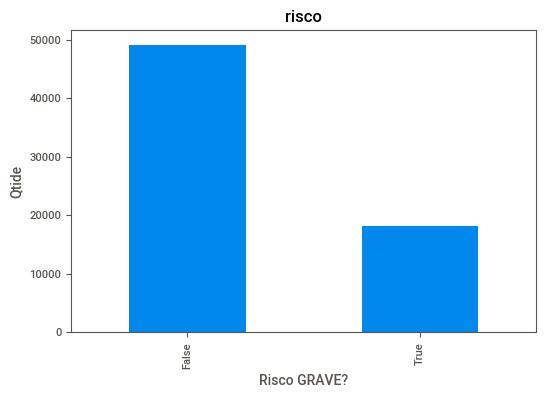

In [43]:
# a coluna alvo é bastante desbalanceada. Isso precisará ser tratado mais adiante
ax = risco_acidentes['risco'].value_counts().plot(kind="bar", title='risco')
ax.set_xlabel("Risco GRAVE?")
ax.set_ylabel("Qtide")

# VERIFICAR ESSE DADO ABAIXO


In [44]:
#Relação entre o tipo de acidentes com número de mortos. 
tipo_de_acidente= risco_acidentes.groupby('tipo_acidente')[['risco']].count().sort_values(by='risco',ascending= False).head(20)
tipo_de_acidente.reset_index(inplace=True)

In [45]:
# ###########################       MODELO ##################
#Relação entre o tipo de acidentes com número de mortos. 
tipo_de_acidente= risco_acidentes.groupby('tipo_acidente')[['mortos']].count().sort_values(by='mortos',ascending= False).head(20)
tipo_de_acidente.reset_index(inplace=True)

In [46]:
tipo_de_acidente

,tipo_acidente,mortos
0,Colisão traseira,13121
1,Saída de leito carroçável,10304
2,Colisão transversal,8780
3,Colisão lateral,8341
4,Tombamento,5153
5,Colisão com objeto estático,4455
6,Colisão frontal,4407
7,Atropelamento de Pedestre,3380
8,Queda de ocupante de veículo,3300
9,Capotamento,2274


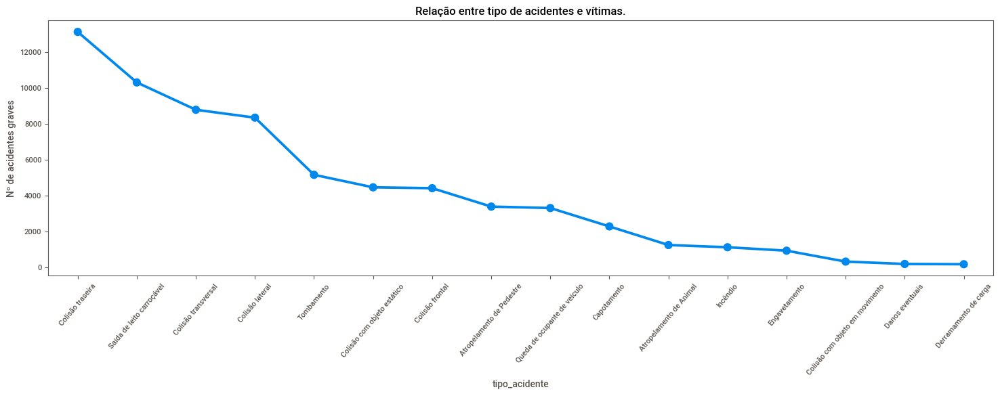

In [47]:
plt.figure(figsize=(18,5))
sns.pointplot(x='tipo_acidente', y='mortos',data=tipo_de_acidente)
plt.xticks(rotation=50)
plt.title('Relação entre tipo de acidentes e vítimas.')
plt.ylabel('Nº de acidentes graves')
plt.show();

##### Trabalhando o dataset >>>> 'acidentes2019_PESSOAS'


In [50]:
acidentes_pessoa.head()

,id,pesid,data_inversa,dia_semana,horario,uf,br,km,municipio,causa_acidente,tipo_acidente,classificacao_acidente,fase_dia,sentido_via,condicao_metereologica,tipo_pista,tracado_via,uso_solo,id_veiculo,tipo_veiculo,marca,ano_fabricacao_veiculo,tipo_envolvido,estado_fisico,idade,sexo,ilesos,feridos_leves,feridos_graves,mortos,latitude,longitude,regional,delegacia,uop
0,182256.0,403856.0,2019-01-01,terça-feira,04:00:00,CE,116.0,"136,9",RUSSAS,Animais na Pista,Atropelamento de Animal,Sem Vítimas,Amanhecer,Decrescente,Vento,Simples,Curva,Não,324937,Caminhão,I/MB 15SPRINT RONTAN AMB,2012.0,Condutor,Ileso,35.0,Masculino,1,0,0,0,"-4,766018","-38,056034",SR-CE,DEL16/3,UOP01/CE
1,182263.0,402859.0,2019-01-01,terça-feira,05:00:00,MT,158.0,"599,5",AGUA BOA,Defeito Mecânico no Veículo,Incêndio,Sem Vítimas,Amanhecer,Decrescente,Garoa/Chuvisco,Simples,Reta,Não,324940,Caminhão,FORD/CARGO 815 N,2011.0,Condutor,Ileso,30.0,Masculino,1,0,0,0,"-14,319","-52,169",SR-MT,DEL2/8,UOP02/MT
2,182277.0,402850.0,2019-01-01,terça-feira,10:00:00,PA,10.0,34,DOM ELISEU,Velocidade Incompatível,Colisão traseira,Sem Vítimas,Pleno dia,Decrescente,Nublado,Simples,Não Informado,Não,324958,Caminhão-trator,VOLVO/FH 540 6X4T,2012.0,Condutor,Ileso,54.0,Masculino,1,0,0,0,"-4,15296734","-47,54608154",SR-PA,DEL19/2,UOP03/PA
3,182289.0,402431.0,2019-01-01,terça-feira,08:30:00,BA,101.0,13,RIO REAL,Ingestão de Álcool,Colisão traseira,Com Vítimas Feridas,Pleno dia,Decrescente,Céu Claro,Dupla,Desvio Temporário,Não,324987,Caminhão-trator,SCANIA/R 440 A6X2,2018.0,Condutor,Ileso,43.0,Masculino,1,0,0,0,"-11,5896","-37,8761",SR-SE,DEL20/2,UOP03/SE
4,182307.0,402642.0,2019-01-01,terça-feira,13:50:00,BA,116.0,440,FEIRA DE SANTANA,Ingestão de Álcool,Saída de leito carroçável,Com Vítimas Feridas,Pleno dia,Decrescente,Céu Claro,Dupla,Curva,Não,325030,Caminhão-trator,VOLVO/FH12 380 4X2T,2003.0,Passageiro,Lesões Graves,37.0,Masculino,0,0,1,0,"-12,344","-39,087",SR-BA,DEL10/2,UOP01/BA


In [51]:
acidentes_pessoa.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 162273 entries, 0 to 162272
Data columns (total 35 columns):
 #   Column                  Non-Null Count   Dtype         
---  ------                  --------------   -----         
 0   id                      162273 non-null  float64       
 1   pesid                   162272 non-null  float64       
 2   data_inversa            162273 non-null  datetime64[ns]
 3   dia_semana              162273 non-null  object        
 4   horario                 162273 non-null  object        
 5   uf                      162273 non-null  object        
 6   br                      162042 non-null  float64       
 7   km                      162042 non-null  object        
 8   municipio               162273 non-null  object        
 9   causa_acidente          162273 non-null  object        
 10  tipo_acidente           162273 non-null  object        
 11  classificacao_acidente  162273 non-null  object        
 12  fase_dia                162273

In [52]:
## NESTE DATAFRAME, TEMOS INTERESSE NO ATRIBUTO tipo_veiculo
acidentes_pessoa[['id' ,'data_inversa','horario','tipo_veiculo' ]].head(15)


,id,data_inversa,horario,tipo_veiculo
0,182256.0,2019-01-01,04:00:00,Caminhão
1,182263.0,2019-01-01,05:00:00,Caminhão
2,182277.0,2019-01-01,10:00:00,Caminhão-trator
3,182289.0,2019-01-01,08:30:00,Caminhão-trator
4,182307.0,2019-01-01,13:50:00,Caminhão-trator
5,182307.0,2019-01-01,13:50:00,Caminhão-trator
6,182316.0,2019-01-01,15:15:00,Caminhão-trator
7,182334.0,2019-01-01,14:45:00,Caminhão
8,182361.0,2019-01-01,10:00:00,Caminhão-trator
9,182362.0,2019-01-01,18:20:00,Caminhão


In [53]:
# ****************** CRIANDO UM DATAFRAME COM APENAS OS ATRIBUTOS tipo veiculo
tipo_veiculo = pd.read_csv("acidentes2019_PESSOA.csv", sep=';',encoding='latin-1',usecols=[0,19])
tipo_veiculo.head(10)

,id,tipo_veiculo
0,182256.0,Caminhão
1,182263.0,Caminhão
2,182277.0,Caminhão-trator
3,182289.0,Caminhão-trator
4,182307.0,Caminhão-trator
5,182307.0,Caminhão-trator
6,182316.0,Caminhão-trator
7,182334.0,Caminhão
8,182361.0,Caminhão-trator
9,182362.0,Caminhão


In [59]:
# INDEXANDO O DATAFRAME COM a "id"

tipo_veiculo.set_index('id', inplace=True)


## VERIFICAR A NECESSIDADE DESSE COMANDO

In [60]:
tipo_veiculo.head()

,tipo_veiculo
id,
182256.0,Caminhão
182263.0,Caminhão
182277.0,Caminhão-trator
182289.0,Caminhão-trator
182307.0,Caminhão-trator


In [61]:
agrupando_tipo= tipo_veiculo.groupby('tipo_veiculo').size()
print(agrupando_tipo)

tipo_veiculo
Automóvel            70650
Bicicleta             2086
Caminhonete          14228
Caminhão             11517
Caminhão-trator      12068
Camioneta             4160
Carro de mão             6
Carroça-charrete        96
Ciclomotor             441
Micro-ônibus          1489
Motocicleta          31858
Motoneta              3746
Não Informado           39
Outros                 662
Quadriciclo              3
Reboque                 43
Semireboque            119
Trator de esteira        1
Trator de rodas         71
Trator misto             5
Trem-bonde               8
Triciclo                23
Utilitário            1900
Ônibus                7054
dtype: int64


In [62]:
tipo_veiculo.info()

<class 'pandas.core.frame.DataFrame'>
Float64Index: 162273 entries, 182256.0 to 266627.0
Data columns (total 1 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   tipo_veiculo  162273 non-null  object
dtypes: object(1)
memory usage: 2.5+ MB


## AGREGANDO ALGUNS VALORES DESSES VEÍCULOS, DA SEGUINTE FORMA:

###### 1 - Bicicleta = Bicileta + Carro de mão  
###### 2 - Carroça = Carroça-charrete 
###### 3 - Reboque = Reboque + Semireboque 
###### 4 - Motocicleta = Motocicleta + Motoneta + Triciclo + Quadriciclo + Ciclomotor 
###### 5 - Automovel 
###### 6 - Caminhonete = Caminhonete + Camioneta 
###### 7 - Trator =  Trator de esteira + Trator de rodas +  Trator misto 
###### 8 - Trem = Trem-bonde
###### 9 - Caminhão = Caminhão + Caminhão-Trator 
###### 10 - Ônibus = Ônibus + Micro-ônibus + Utilitário 


In [63]:
# Tratando a coluna 'tipo_veiculo':
tipo_veiculo.tipo_veiculo.replace(['Carro de mão', 'Carroça-charrete', 'Semireboque'],['Bicicleta', 'Carroça', 'Reboque'], inplace=True)
tipo_veiculo.tipo_veiculo.replace(['Ciclomotor','Triciclo','Quadriciclo', 'Motoneta'],'Motocicleta', inplace=True)
tipo_veiculo.tipo_veiculo.replace(['Caminhão-trator','Camioneta','Trem-bonde'],['Caminhão','Caminhonete','Trem'], inplace=True)
tipo_veiculo.tipo_veiculo.replace(['Trator de rodas','Trator misto','Trator de esteira'],'Trator', inplace=True)
tipo_veiculo.tipo_veiculo.replace(['Utilitário','Micro-ônibus'],'Ônibus', inplace=True)


In [64]:
agrupando_tipo= tipo_veiculo.groupby('tipo_veiculo').size()
print(agrupando_tipo)

tipo_veiculo
Automóvel        70650
Bicicleta         2092
Caminhonete      18388
Caminhão         23585
Carroça             96
Motocicleta      36071
Não Informado       39
Outros             662
Reboque            162
Trator              77
Trem                 8
Ônibus           10443
dtype: int64


In [65]:
## AGREGANDO ALGUNS VALORES DESSES VEÍCULOS, DA SEGUINTE FORMA:
###### 1 - Não Informado
###### 2 - Outros
###### 3 - Bicicleta = Bicileta + Carro de mão  
###### 4 - Carroça = Carroça-charrete 
###### 5 - Reboque = Reboque + Semireboque 
###### 6 - Motocicleta = Motocicleta + Motoneta + Triciclo + Quadriciclo + Ciclomotor 
###### 7 - Automovel 
###### 8 - Caminhonete = Caminhonete + Camioneta 
###### 9 - Trator =  Trator de esteira + Trator de rodas +  Trator misto 
###### 10 - Trem = Trem-bonde
###### 11 - Caminhão = Caminhão + Caminhão-Trator 
###### 12 - Ônibus = Ônibus + Micro-ônibus + Utilitário 

In [236]:
# Tratando a coluna 'tipo_veiculo':
tipo_veiculo.tipo_veiculo.replace(['Não Informado', 'Outros', 'Bicicleta','Carroça'],['1', '2', '3', '4'], inplace=True)
tipo_veiculo.tipo_veiculo.replace(['Reboque','Motocicleta','Automóvel', 'Caminhonete'], ['5','6','7','8'], inplace=True)
tipo_veiculo.tipo_veiculo.replace(['Trator','Trem','Caminhão', 'Ônibus'],['9','10', '11','12'], inplace=True)


In [67]:
tipo_veiculo.head(10)

,tipo_veiculo
id,
182256.0,11
182263.0,11
182277.0,11
182289.0,11
182307.0,11
182307.0,11
182316.0,11
182334.0,11
182361.0,11


#  UNIÃO DE DOIS DATASETS

In [239]:
# Faendo a união de dois datasets diferentes pelo id
dataframesuniao = risco_acidentes.merge(tipo_veiculo, on='id', how='inner' )

In [240]:
dataframesuniao = dataframesuniao.sort_values('tipo_veiculo', ascending=False)

In [241]:
dataframesuniao.head()

,id,data_inversa,dia_semana,horario,uf,br,km,municipio,causa_acidente,tipo_acidente,classificacao_acidente,fase_dia,sentido_via,condicao_metereologica,tipo_pista,tracado_via,uso_solo,pessoas,mortos,feridos_leves,feridos_graves,ilesos,ignorados,feridos,veiculos,latitude,longitude,regional,delegacia,uop,risco,tipo_veiculo
76442,219427.0,2019-07-02,terça-feira,10:00:00,RO,364.0,"381,5",OURO PRETO DO OESTE,Falta de Atenção à Condução,Colisão traseira,Com Vítimas Fatais,Pleno dia,Crescente,Sol,Simples,Reta,Não,4,1,0,1,1,1,1,2,"-10,72665","-62,23386",SR-RO,DEL21/2,UOP01/RO,True,9
140049,250393.0,2019-11-18,segunda-feira,14:10:00,RS,392.0,"651,9",GUARANI DAS MISSOES,Desobediência às normas de trânsito pelo condutor,Colisão traseira,Com Vítimas Feridas,Pleno dia,Crescente,Sol,Simples,Reta,Não,7,0,1,0,6,0,1,3,"-28,11597","-54,69185",SR-RS,DEL9/10,UOP01/RS,False,9
11429,188122.0,2019-01-29,terça-feira,11:50:00,PR,116.0,"87,8",PIRAQUARA,Defeito na Via,Danos eventuais,Com Vítimas Feridas,Pleno dia,Decrescente,Sol,Dupla,Reta,Não,4,0,1,0,3,0,1,2,"-25,44103","-49,09243",SR-PR,DEL7/1,UOP01/PR,False,9
131641,246438.0,2019-11-01,sexta-feira,06:50:00,SP,116.0,"163,2",JACAREI,Falta de Atenção à Condução,Colisão traseira,Com Vítimas Feridas,Pleno dia,Crescente,Céu Claro,Dupla,Reta,Não,2,0,0,1,1,0,1,2,"-23,2865","-45,99199",SR-SP,DEL6/2,UOP01/SP,True,9
27551,195854.0,2019-03-08,sexta-feira,19:10:00,SC,280.0,81,CORUPA,Ingestão de Álcool,Colisão traseira,Com Vítimas Feridas,Anoitecer,Crescente,Céu Claro,Simples,Reta,Sim,2,0,1,0,1,0,1,2,"-26,44057","-49,21706",SR-SC,DEL8/6,UOP03/SC,False,9


In [231]:
dataframesuniao.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 162273 entries, 90967 to 135925
Data columns (total 32 columns):
 #   Column                  Non-Null Count   Dtype         
---  ------                  --------------   -----         
 0   id                      162273 non-null  float64       
 1   data_inversa            162273 non-null  datetime64[ns]
 2   dia_semana              162273 non-null  object        
 3   horario                 162273 non-null  object        
 4   uf                      162273 non-null  object        
 5   br                      162042 non-null  float64       
 6   km                      162042 non-null  object        
 7   municipio               162273 non-null  object        
 8   causa_acidente          162273 non-null  object        
 9   tipo_acidente           162273 non-null  object        
 10  classificacao_acidente  162273 non-null  object        
 11  fase_dia                162273 non-null  object        
 12  sentido_via             16

In [232]:
# deletando os ids duplicados e mantendo o primeiro para existir apenas 1  rgistro para cada id com a coluna nova (tipo_veiculo)
df = dataframesuniao.drop_duplicates(subset='id', keep='first')

In [233]:
df.head(6)

,id,data_inversa,dia_semana,horario,uf,br,km,municipio,causa_acidente,tipo_acidente,classificacao_acidente,fase_dia,sentido_via,condicao_metereologica,tipo_pista,tracado_via,uso_solo,pessoas,mortos,feridos_leves,feridos_graves,ilesos,ignorados,feridos,veiculos,latitude,longitude,regional,delegacia,uop,risco,tipo_veiculo
90967,226239.0,2019-08-02,sexta-feira,19:30:00,PE,101.0,70,RECIFE,Desobediência às normas de trânsito pelo pedestre,Colisão com objeto em movimento,Com Vítimas Feridas,Plena Noite,Decrescente,Chuva,Simples,Curva,Sim,2,0,1,0,1,0,1,2,"-8,067761","-34,94265",SR-PE,DEL11/1,UOP01/PE,False,Carroça
31114,197545.0,2019-03-17,domingo,10:00:00,PE,101.0,"89,5",CABO DE SANTO AGOSTINHO,Animais na Pista,Colisão com objeto em movimento,Com Vítimas Feridas,Pleno dia,Crescente,Céu Claro,Dupla,Viaduto,Não,4,0,1,0,0,3,1,2,"-8,207607","-34,98372",SR-PE,DEL11/1,UOP03/PE,False,Carroça
105292,233156.0,2019-09-04,quarta-feira,16:15:00,RS,116.0,248,SAO LEOPOLDO,Desobediência às normas de trânsito pelo condutor,Colisão transversal,Com Vítimas Feridas,Pleno dia,Decrescente,Céu Claro,Múltipla,Interseção de vias,Sim,5,0,2,0,3,0,2,2,"-29,77606","-51,15509",SR-RS,DEL9/1,UOP02/RS,False,Carroça
118975,240140.0,2019-10-04,sexta-feira,19:15:00,RS,116.0,"302,5",GUAIBA,Deficiência ou não Acionamento do Sistema de I...,Colisão traseira,Com Vítimas Feridas,Plena Noite,Decrescente,Céu Claro,Simples,Reta,Sim,4,0,3,0,1,0,3,2,"-30,1397","-51,35943",SR-RS,DEL9/2,UOP01/RS,False,Carroça
94620,227948.0,2019-08-10,sábado,19:40:00,RJ,493.0,22,MAGE,Desobediência às normas de trânsito pelo condutor,Colisão lateral,Com Vítimas Feridas,Plena Noite,Crescente,Céu Claro,Simples,Reta,Não,2,0,1,0,1,0,1,2,"-22,65931","-43,0533",SR-RJ,DEL5/4,UOP02/RJ,False,Carroça
111172,236017.0,2019-09-17,terça-feira,02:15:00,RS,290.0,"418,5",SAO GABRIEL,Ingestão de Álcool,Colisão traseira,Com Vítimas Feridas,Plena Noite,Crescente,Céu Claro,Simples,Reta,Sim,4,0,1,0,3,0,1,2,"-30,35488","-54,3289",SR-RS,DEL9/11,UOP02/RS,False,Carroça


In [219]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 67446 entries, 0 to 162272
Data columns (total 32 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   id                      67446 non-null  float64       
 1   data_inversa            67446 non-null  datetime64[ns]
 2   dia_semana              67446 non-null  object        
 3   horario                 67446 non-null  object        
 4   uf                      67446 non-null  object        
 5   br                      67351 non-null  float64       
 6   km                      67351 non-null  object        
 7   municipio               67446 non-null  object        
 8   causa_acidente          67446 non-null  object        
 9   tipo_acidente           67446 non-null  object        
 10  classificacao_acidente  67446 non-null  object        
 11  fase_dia                67446 non-null  object        
 12  sentido_via             67446 non-null  objec

### Selecionando os atributos.

In [79]:
## RETIRANDO ATRIBUTOS DESNECESSÁRIOS

In [80]:
#>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>OBSERVAÇÃO BRUNO <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<

## PERGUNTAR PQ AS COLUNAS MORTOS, FERIDOS LEVES E FERIDOS GRAVES QUE TEM GRANDE RELEVANCIA PARA O MODELO FORAM DELETADAS

#acidentes = risco_acidentes.drop(columns=['id', 'data_inversa','municipio','causa_acidente', 'pessoas', 'mortos', 'feridos_leves','feridos_graves','ilesos','ignorados', 'feridos', 'latitude', 'longitude', 'regional', 'delegacia', 'uop'])
acidentes = df.drop(columns=['id', 'data_inversa','municipio','causa_acidente', 'pessoas', 'mortos', 'feridos_leves','feridos_graves','ilesos','ignorados', 'feridos', 'latitude', 'longitude', 'regional', 'delegacia', 'uop'])

In [81]:
# TIRAR id e municipio

In [82]:
acidentes.head()

,dia_semana,horario,uf,br,km,tipo_acidente,classificacao_acidente,fase_dia,sentido_via,condicao_metereologica,tipo_pista,tracado_via,uso_solo,veiculos,risco,tipo_veiculo
0,terça-feira,01:30:00,SP,116.0,218,Colisão com objeto estático,Com Vítimas Feridas,Plena Noite,Crescente,Céu Claro,Múltipla,Curva,Sim,1,False,7
4,terça-feira,01:30:00,PR,373.0,"177,3",Colisão traseira,Com Vítimas Feridas,Plena Noite,Crescente,Nublado,Dupla,Reta,Sim,1,False,4
5,terça-feira,00:45:00,SC,101.0,16,Colisão com objeto estático,Com Vítimas Feridas,Plena Noite,Decrescente,Céu Claro,Dupla,Reta,Sim,1,False,7
6,terça-feira,00:00:00,CE,20.0,"429,5",Colisão com objeto estático,Com Vítimas Feridas,Plena Noite,Decrescente,Nublado,Dupla,Viaduto,Sim,1,True,7
7,terça-feira,01:00:00,MG,381.0,327,Colisão transversal,Com Vítimas Feridas,Plena Noite,Decrescente,Nublado,Simples,Interseção de vias,Não,2,True,3


In [83]:
acidentes.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 67446 entries, 0 to 162272
Data columns (total 16 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   dia_semana              67446 non-null  object 
 1   horario                 67446 non-null  object 
 2   uf                      67446 non-null  object 
 3   br                      67351 non-null  float64
 4   km                      67351 non-null  object 
 5   tipo_acidente           67446 non-null  object 
 6   classificacao_acidente  67446 non-null  object 
 7   fase_dia                67446 non-null  object 
 8   sentido_via             67446 non-null  object 
 9   condicao_metereologica  67446 non-null  object 
 10  tipo_pista              67446 non-null  object 
 11  tracado_via             67446 non-null  object 
 12  uso_solo                67446 non-null  object 
 13  veiculos                67446 non-null  int64  
 14  risco                   67446 non-nul

In [84]:
# salvando acidentes_final em csv -- é o novo dataset que será usado nos algoritmos de aprendizagem de máquina
acidentes.to_csv('TCC_acidentes_risco.csv',sep = ';' ,encoding='latin-1', index=False)

### salvo na pasta Udemy 10.


In [86]:
# Consultando linhas com valore faltantes.
acidentes.isnull().sum().sort_values(ascending=False)

br                        95
km                        95
dia_semana                 0
horario                    0
uf                         0
tipo_acidente              0
classificacao_acidente     0
fase_dia                   0
sentido_via                0
condicao_metereologica     0
tipo_pista                 0
tracado_via                0
uso_solo                   0
veiculos                   0
risco                      0
tipo_veiculo               0
dtype: int64

In [87]:
# Deletando linhas ausentes
acidentes.dropna(subset=['br'],inplace=True)
acidentes.dropna(subset=['km'],inplace=True)

In [88]:
# Consultando linhas com valore faltantes depois de deletar as faltantes em br e km.
acidentes.isnull().sum().sort_values(ascending=False)

dia_semana                0
horario                   0
uf                        0
br                        0
km                        0
tipo_acidente             0
classificacao_acidente    0
fase_dia                  0
sentido_via               0
condicao_metereologica    0
tipo_pista                0
tracado_via               0
uso_solo                  0
veiculos                  0
risco                     0
tipo_veiculo              0
dtype: int64

In [216]:
# Verificando se há registros duplicados.

print(f"O número de registros duplicados é: {acidentes[acidentes.duplicated() == True].shape[0]}")

In [101]:
# # Número de pessoas por idade  e seus respectivos sexos
pd.crosstab(acidentes['br'],acidentes['km'])

km     0  0,1  0,2  0,3  0,4  0,5  0,6  0,7  0,8  0,9   1  1,1  1,2  1,3  1,4  \
br                                                                              
10.0   0    0    0    0    0    0    0    0    0    0   0    0    0    0    0   
20.0   1    2    0    2    2    2    2    0    2    1   6    0    0    0    1   
30.0   0    0    0    0    0    0    0    0    0    0   0    0    0    0    0   
40.0   7    4    6    4    1    4    3    1    3    2  22    2    9    2    1   
50.0   1    1    1    0    0    0    0    0    0    0   0    0    0    0    0   
...   ..  ...  ...  ...  ...  ...  ...  ...  ...  ...  ..  ...  ...  ...  ...   
484.0  0    0    0    0    0    0    0    0    0    0   0    0    0    0    0   
487.0  0    0    0    0    0    0    0    0    0    0   0    0    0    0    0   
488.0  0    1    0    0    0    2    0    1    1    1   5    0    0    2    0   
493.0  2    1    1    0    2    1    0    2    0    0   9    0    0    0    0   
495.0  1    0    0    0    0    0    0    0    0    0   0    0    0    0    0   

km     1,5  1,6  1,7  1,8  1,9  10  10,1  10,2  10,3  10,4  10,5  10,6  10,7  \
br                                                                             
10.0     1    0    0    0    0   1     0     0     0     0     0     0     0   
20.0     1    1    0    2    0   6     2     3     0     2     2     1     0   
30.0     0    0    0    0    0   0     0     0     0     0     0     0     0   
40.0     6    2    3   10    5   7     1     0     0     0     4     0     0   
50.0     0    0    0    0    0   1     0     0     0     0     0     0     0   
...    ...  ...  ...  ...  ...  ..   ...   ...   ...   ...   ...   ...   ...   
484.0    0    0    0    0    0   0     0     0     0     0     0     0     0   
487.0    0    0    0    0    0   0     0     0     0     0     0     0     0   
488.0    1    0    0    0    1   0     0     0     0     0     0     0     0   
493.0    1    0    0    0    0   1     0     0     0     0     0     0     0   
495.0    0    0    0    0    0   0     0     0     0     0     0     0     0   

km     10,8  10,9  100  100,1  100,2  100,3  100,4  100,5  100,6  100,7  \
br                                                                        
10.0      0     0    0      0      0      0      0      0      0      0   
20.0      1     0    0      0      0      0      0      0      0      0   
30.0      0     0    0      0      0      0      0      0      0      0   
40.0      0     2    4      1      0      0      0      0      0      0   
50.0      0     0    5      0      0      0      0      0      0      1   
...     ...   ...  ...    ...    ...    ...    ...    ...    ...    ...   
484.0     0     0    0      0      0      0      0      0      0      0   
487.0     0     0    0      0      0      0      0      0      0      0   
488.0     0     0    0      0      0      0      0      0      0      0   
493.0     0     0    1      0      0      0      0      0      0      0   
495.0     0     0    0      0      0      0      0      0      0      0   

km     100,8  100,9  1000  1000,6  1001  1001,8  1001,9  1002  1002,4  1002,8  \
br                                                                              
10.0       0      0     0       0     0       0       0     0       0       0   
20.0       0      0     0       0     0       0       0     0       0       0   
30.0       0      0     0       0     0       0       0     0       0       0   
40.0       0      0     0       0     0       0       0     0       0       0   
50.0       0      0     0       0     0       0       0     0       0       0   
...      ...    ...   ...     ...   ...     ...     ...   ...     ...     ...   
484.0      0      0     0       0     0       0       0     0       0       0   
487.0      0      0     0       0     0       0       0     0       0       0   
488.0      0      0     0       0     0       0       0     0       0       0   
493.0      0      0     0       0     

In [112]:
acidentes.head()

,dia_semana,horario,uf,br,km,tipo_acidente,classificacao_acidente,fase_dia,sentido_via,condicao_metereologica,tipo_pista,tracado_via,uso_solo,veiculos,risco,tipo_veiculo
0,terça-feira,01:30:00,SP,116.0,218,Colisão com objeto estático,Com Vítimas Feridas,Plena Noite,Crescente,Céu Claro,Múltipla,Curva,Sim,1,False,7
4,terça-feira,01:30:00,PR,373.0,"177,3",Colisão traseira,Com Vítimas Feridas,Plena Noite,Crescente,Nublado,Dupla,Reta,Sim,1,False,4
5,terça-feira,00:45:00,SC,101.0,16,Colisão com objeto estático,Com Vítimas Feridas,Plena Noite,Decrescente,Céu Claro,Dupla,Reta,Sim,1,False,7
6,terça-feira,00:00:00,CE,20.0,"429,5",Colisão com objeto estático,Com Vítimas Feridas,Plena Noite,Decrescente,Nublado,Dupla,Viaduto,Sim,1,True,7
7,terça-feira,01:00:00,MG,381.0,327,Colisão transversal,Com Vítimas Feridas,Plena Noite,Decrescente,Nublado,Simples,Interseção de vias,Não,2,True,3


In [113]:
acidentes.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 67351 entries, 0 to 162272
Data columns (total 16 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   dia_semana              67351 non-null  object 
 1   horario                 67351 non-null  object 
 2   uf                      67351 non-null  object 
 3   br                      67351 non-null  float64
 4   km                      67351 non-null  object 
 5   tipo_acidente           67351 non-null  object 
 6   classificacao_acidente  67351 non-null  object 
 7   fase_dia                67351 non-null  object 
 8   sentido_via             67351 non-null  object 
 9   condicao_metereologica  67351 non-null  object 
 10  tipo_pista              67351 non-null  object 
 11  tracado_via             67351 non-null  object 
 12  uso_solo                67351 non-null  object 
 13  veiculos                67351 non-null  int64  
 14  risco                   67351 non-nul

In [114]:
print(acidentes['tipo_acidente'].unique())

['Colisão com objeto estático' 'Colisão traseira' 'Colisão transversal'
 'Saída de leito carroçável' 'Atropelamento de Animal'
 'Atropelamento de Pedestre' 'Colisão frontal' 'Colisão lateral'
 'Queda de ocupante de veículo' 'Incêndio' 'Capotamento' 'Engavetamento'
 'Tombamento' 'Derramamento de carga' 'Colisão com objeto em movimento'
 'Danos eventuais']


In [115]:
print(acidentes['classificacao_acidente'].unique())

['Com Vítimas Feridas' 'Sem Vítimas' 'Com Vítimas Fatais']


In [116]:
print(acidentes['fase_dia'].unique())

['Plena Noite' 'Amanhecer' 'Pleno dia' 'Anoitecer']


In [117]:
print(acidentes['sentido_via'].unique())

['Crescente' 'Decrescente']


In [118]:
print(acidentes['condicao_metereologica'].unique())

['Céu Claro' 'Nublado' 'Chuva' 'Garoa/Chuvisco' 'Ignorado'
 'Nevoeiro/Neblina' 'Vento' 'Sol' 'Granizo' 'Neve']


In [119]:
print(acidentes['tipo_pista'].unique())

['Múltipla' 'Dupla' 'Simples']


In [120]:
print(acidentes['tracado_via'].unique())

['Curva' 'Reta' 'Viaduto' 'Interseção de vias' 'Não Informado' 'Rotatória'
 'Desvio Temporário' 'Retorno Regulamentado' 'Túnel' 'Ponte']


In [121]:
print(acidentes['uso_solo'].unique())

['Sim' 'Não']


In [122]:
print(acidentes['risco'].unique())

[False  True]


In [123]:
from sklearn.preprocessing import LabelEncoder

In [124]:
dia_semana_values = {'domingo' : 0,
                     'sábado' : 1,
                     'segunda-feira' : 2,
                     'terça-feira' : 3,
                     'quarta-feira' : 4,
                     'quinta-feira' : 5,
                     'sexta-feira' : 6} 

uf_values = {'AC': 0,
    'AL': 1,
    'AP': 2,
    'AM': 3,
    'BA': 4,
    'CE': 5,
    'DF': 6,
    'ES': 7,
    'GO': 8,
    'MA': 9,
    'MT': 10,
    'MS': 11,
    'MG': 12,
    'PA': 13,
    'PB': 14,
    'PR': 15,
    'PE': 16,
    'PI': 17,
    'RJ': 18,
    'RN': 19,
    'RS': 20,
    'RO': 21,
    'RR': 22,
    'SC': 23,
    'SP': 24,
    'SE': 25,
    'TO': 26}

tipo_acidente_values = {'Colisão com objeto estático' : 0,
                        'Colisão traseira' : 1,
                        'Colisão transversal' : 2,
                        'Saída de leito carroçável' : 3,
                        'Atropelamento de Animal' : 4,
                        'Atropelamento de Pedestre' : 5,
                        'Colisão frontal' : 6,
                        'Colisão lateral' : 7,
                        'Queda de ocupante de veículo' : 8,
                        'Incêndio' : 9,
                        'Capotamento' : 10,
                        'Engavetamento' : 11,
                        'Tombamento' : 12,
                        'Derramamento de carga' : 13,
                        'Colisão com objeto em movimento' : 14,
                        'Danos eventuais' : 15}

classificacao_acidente_values = {'Com Vítimas Feridas' : 0, 'Sem Vítimas' : 1, 'Com Vítimas Fatais' : 2}

fase_dia_values = {'Plena Noite' : 0, 'Amanhecer' : 1, 'Pleno dia' : 2, 'Anoitecer' : 3}

sentido_via_values = {'Crescente' : 0, 'Decrescente' : 1, 'Não Informado' : 2}

condicao_metereologica_values = {'Céu Claro' : 0, 'Nublado' : 1, 'Chuva' : 2, 'Garoa/Chuvisco' : 3, 'Ignorado' : 4,
                                 'Nevoeiro/Neblina' : 5, 'Vento' : 6, 'Sol' : 7,  'Granizo' : 8, 'Neve': 9}

tipo_pista_values = {'Múltipla' : 0, 'Dupla' : 1, 'Simples' : 2}

tracado_via_values = {'Curva' : 0, 'Reta' : 1, 'Viaduto' : 2, 'Interseção de vias' : 3, 'Não Informado' : 4, 'Rotatória' : 5,
                         'Desvio Temporário' : 6, 'Retorno Regulamentado' : 7, 'Túnel' : 8, 'Ponte' : 9}

uso_solo_values = { 'Sim' : 1, 'Não' : 0 }

risco_values = { False : 0, True : 1}

tipo_veiculo_values = {'7' : 7, '4' : 4, '3' : 3,  '8' : 8, '12' : 12, '11' : 11,  '5' : 5, '2' : 2, '6' : 6, '1' : 1, '9' : 9}


acidentes.replace({'dia_semana': dia_semana_values,
                 'uf': uf_values, 
                 'tipo_acidente': tipo_acidente_values,
                 'classificacao_acidente': classificacao_acidente_values, 
                 'fase_dia': fase_dia_values,
                 'sentido_via': sentido_via_values,
                 'condicao_metereologica' : condicao_metereologica_values,
                 'tipo_pista' : tipo_pista_values,
                 'tracado_via' : tracado_via_values,
                 'uso_solo' : uso_solo_values,
                 'risco' : risco_values,
                 'tipo_veiculo' : tipo_veiculo_values  
                }, inplace=True)

In [125]:
labelencoder = LabelEncoder()
acidentes['km'] = labelencoder.fit_transform(acidentes['km'])
acidentes['horario'] = labelencoder.fit_transform(acidentes['horario'])

In [126]:
acidentes.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 67351 entries, 0 to 162272
Data columns (total 16 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   dia_semana              67351 non-null  int64  
 1   horario                 67351 non-null  int32  
 2   uf                      67351 non-null  int64  
 3   br                      67351 non-null  float64
 4   km                      67351 non-null  int32  
 5   tipo_acidente           67351 non-null  int64  
 6   classificacao_acidente  67351 non-null  int64  
 7   fase_dia                67351 non-null  int64  
 8   sentido_via             67351 non-null  int64  
 9   condicao_metereologica  67351 non-null  int64  
 10  tipo_pista              67351 non-null  int64  
 11  tracado_via             67351 non-null  int64  
 12  uso_solo                67351 non-null  int64  
 13  veiculos                67351 non-null  int64  
 14  risco                   67351 non-nul

# BALANCEANDO A VARIÁVEL ALVO

In [127]:
# Verifiando a quantidade de valores únicos da coluna risco 
acidentes.risco.value_counts()

0    49108
1    18243
Name: risco, dtype: int64

In [128]:
data2 = acidentes[acidentes.risco==0].sample(18243)

In [129]:
data = data2.append(acidentes[acidentes.risco==1].sample(18243))

In [130]:
data.risco.value_counts()

0    18243
1    18243
Name: risco, dtype: int64

Text(0, 0.5, 'Qtide')

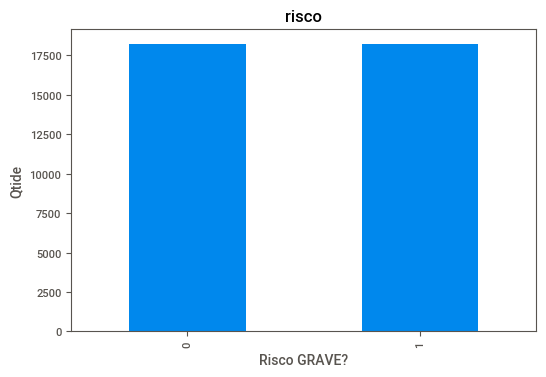

In [131]:
# a coluna alvo depois de ser balanceada
ax = data['risco'].value_counts().plot(kind="bar", title='risco')
ax.set_xlabel("Risco GRAVE?")
ax.set_ylabel("Qtide")

# CRIAÇÃO DE MODELO DE ML

In [132]:
# Importando as bibliotecas e funções utilizadas no modelo
from sklearn.datasets import load_iris
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score
import joblib
from sklearn.ensemble import RandomForestClassifier
from sklearn import svm
from sklearn.neighbors import KNeighborsClassifier

# PIPELINE

In [133]:
pipe_random_forest = Pipeline([
        ('scl', StandardScaler()),
        ('clf', RandomForestClassifier())
        ]
)

In [134]:
pipe_svm = Pipeline([
        ('scl', StandardScaler()),
        ('clf', svm.SVC())
        ]
)

In [135]:
pipe_knn = Pipeline([
        ('scl', StandardScaler()),
        ('clf', KNeighborsClassifier())
        ]
)

# **GridSearch**

O GridSearchCV é uma ferramenta usada para automatizar o processo de ajuste dos parâmetros de um algoritmo, pois ele fará de maneira sistemática diversas combinações dos parâmetros e depois de avaliá-los os armazenará em um único objeto. O GridSearchCV é um módulo do ScikitLearn e é amplamente usado para automatizar grande parte do processo de tuning.

# Valores para Grid

No código abaixo criamos uma lista para alimentar as grids que vão ser utilizadas no parâmetro do GridSearch para testar as combinações.

In [136]:
valores = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]

In [137]:
grid_params_rf = [{
    'clf__criterion': ['gini', 'entropy'],
    'clf__min_samples_leaf': valores,
    'clf__max_depth': valores,
    'clf__min_samples_split': valores[1:]
}]

In [138]:
grid_params_svm = [{
    'clf__kernel': ['linear', 'rbf'], 
    'clf__C': valores
}]

In [139]:
grid_params_knn = [{
    'clf__n_neighbors': valores,
}]

# Construindo GridSearch

In [140]:
gs_rf = GridSearchCV(
    estimator=pipe_random_forest,
    param_grid=grid_params_rf,
    scoring='accuracy',
    verbose=100,
    cv=10 
)

In [141]:
gs_svm = GridSearchCV(
    estimator=pipe_svm,
    param_grid=grid_params_svm,
    scoring='accuracy',
    verbose=100,
    cv=10,
)

In [142]:
gs_knn = GridSearchCV(
    estimator=pipe_knn,
    param_grid=grid_params_knn,
    scoring='accuracy',
    verbose=100,
    cv=10,
)

In [143]:
# Deletando a variável alvo e alimentando a mesma em Y
X_train = data.drop('risco',axis=1)
y = data['risco']

# Computando o GridSearch para Random Forest

O método fit() é utilizado para treinar o algorítimo e verificar seu desempenho.

In [144]:
gs_rf.fit(X_train,y)

Fitting 10 folds for each of 1800 candidates, totalling 18000 fits
[CV 1/10; 1/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=1, clf__min_samples_split=2
[CV 1/10; 1/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=1, clf__min_samples_split=2; total time=   0.7s
[CV 2/10; 1/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=1, clf__min_samples_split=2
[CV 2/10; 1/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=1, clf__min_samples_split=2; total time=   0.5s
[CV 3/10; 1/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=1, clf__min_samples_split=2
[CV 3/10; 1/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=1, clf__min_samples_split=2; total time=   0.5s
[CV 4/10; 1/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=1, clf__min_samples_split=2
[CV 4/10; 1/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=1, cl

[CV 4/10; 4/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=1, clf__min_samples_split=5; total time=   0.5s
[CV 5/10; 4/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=1, clf__min_samples_split=5
[CV 5/10; 4/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=1, clf__min_samples_split=5; total time=   0.5s
[CV 6/10; 4/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=1, clf__min_samples_split=5
[CV 6/10; 4/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=1, clf__min_samples_split=5; total time=   0.5s
[CV 7/10; 4/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=1, clf__min_samples_split=5
[CV 7/10; 4/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=1, clf__min_samples_split=5; total time=   0.5s
[CV 8/10; 4/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=1, clf__min_samples_split=5
[CV 8/10; 4/1800] END cl

[CV 8/10; 7/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=1, clf__min_samples_split=8; total time=   0.5s
[CV 9/10; 7/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=1, clf__min_samples_split=8
[CV 9/10; 7/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=1, clf__min_samples_split=8; total time=   0.7s
[CV 10/10; 7/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=1, clf__min_samples_split=8
[CV 10/10; 7/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=1, clf__min_samples_split=8; total time=   0.5s
[CV 1/10; 8/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=1, clf__min_samples_split=9
[CV 1/10; 8/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=1, clf__min_samples_split=9; total time=   0.5s
[CV 2/10; 8/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=1, clf__min_samples_split=9
[CV 2/10; 8/1800] END 

[CV 2/10; 11/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=2, clf__min_samples_split=3; total time=   0.5s
[CV 3/10; 11/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=2, clf__min_samples_split=3
[CV 3/10; 11/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=2, clf__min_samples_split=3; total time=   0.5s
[CV 4/10; 11/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=2, clf__min_samples_split=3
[CV 4/10; 11/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=2, clf__min_samples_split=3; total time=   0.5s
[CV 5/10; 11/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=2, clf__min_samples_split=3
[CV 5/10; 11/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=2, clf__min_samples_split=3; total time=   0.5s
[CV 6/10; 11/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=2, clf__min_samples_split=3
[CV 6/10; 11/180

[CV 6/10; 14/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=2, clf__min_samples_split=6; total time=   0.5s
[CV 7/10; 14/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=2, clf__min_samples_split=6
[CV 7/10; 14/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=2, clf__min_samples_split=6; total time=   0.5s
[CV 8/10; 14/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=2, clf__min_samples_split=6
[CV 8/10; 14/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=2, clf__min_samples_split=6; total time=   0.5s
[CV 9/10; 14/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=2, clf__min_samples_split=6
[CV 9/10; 14/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=2, clf__min_samples_split=6; total time=   0.5s
[CV 10/10; 14/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=2, clf__min_samples_split=6
[CV 10/10; 14/1

[CV 10/10; 17/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=2, clf__min_samples_split=9; total time=   0.5s
[CV 1/10; 18/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=2, clf__min_samples_split=10
[CV 1/10; 18/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=2, clf__min_samples_split=10; total time=   0.5s
[CV 2/10; 18/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=2, clf__min_samples_split=10
[CV 2/10; 18/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=2, clf__min_samples_split=10; total time=   0.5s
[CV 3/10; 18/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=2, clf__min_samples_split=10
[CV 3/10; 18/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=2, clf__min_samples_split=10; total time=   0.5s
[CV 4/10; 18/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=2, clf__min_samples_split=10
[CV 4/10

[CV 4/10; 21/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=3, clf__min_samples_split=4; total time=   0.5s
[CV 5/10; 21/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=3, clf__min_samples_split=4
[CV 5/10; 21/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=3, clf__min_samples_split=4; total time=   0.5s
[CV 6/10; 21/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=3, clf__min_samples_split=4
[CV 6/10; 21/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=3, clf__min_samples_split=4; total time=   0.5s
[CV 7/10; 21/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=3, clf__min_samples_split=4
[CV 7/10; 21/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=3, clf__min_samples_split=4; total time=   0.5s
[CV 8/10; 21/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=3, clf__min_samples_split=4
[CV 8/10; 21/180

[CV 8/10; 24/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=3, clf__min_samples_split=7; total time=   0.5s
[CV 9/10; 24/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=3, clf__min_samples_split=7
[CV 9/10; 24/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=3, clf__min_samples_split=7; total time=   0.5s
[CV 10/10; 24/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=3, clf__min_samples_split=7
[CV 10/10; 24/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=3, clf__min_samples_split=7; total time=   0.5s
[CV 1/10; 25/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=3, clf__min_samples_split=8
[CV 1/10; 25/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=3, clf__min_samples_split=8; total time=   0.5s
[CV 2/10; 25/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=3, clf__min_samples_split=8
[CV 2/10; 25/1

[CV 2/10; 28/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=4, clf__min_samples_split=2; total time=   0.5s
[CV 3/10; 28/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=4, clf__min_samples_split=2
[CV 3/10; 28/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=4, clf__min_samples_split=2; total time=   0.5s
[CV 4/10; 28/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=4, clf__min_samples_split=2
[CV 4/10; 28/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=4, clf__min_samples_split=2; total time=   0.5s
[CV 5/10; 28/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=4, clf__min_samples_split=2
[CV 5/10; 28/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=4, clf__min_samples_split=2; total time=   0.5s
[CV 6/10; 28/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=4, clf__min_samples_split=2
[CV 6/10; 28/180

[CV 6/10; 31/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=4, clf__min_samples_split=5; total time=   0.5s
[CV 7/10; 31/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=4, clf__min_samples_split=5
[CV 7/10; 31/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=4, clf__min_samples_split=5; total time=   0.5s
[CV 8/10; 31/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=4, clf__min_samples_split=5
[CV 8/10; 31/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=4, clf__min_samples_split=5; total time=   0.5s
[CV 9/10; 31/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=4, clf__min_samples_split=5
[CV 9/10; 31/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=4, clf__min_samples_split=5; total time=   0.5s
[CV 10/10; 31/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=4, clf__min_samples_split=5
[CV 10/10; 31/1

[CV 10/10; 34/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=4, clf__min_samples_split=8; total time=   0.5s
[CV 1/10; 35/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=4, clf__min_samples_split=9
[CV 1/10; 35/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=4, clf__min_samples_split=9; total time=   0.5s
[CV 2/10; 35/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=4, clf__min_samples_split=9
[CV 2/10; 35/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=4, clf__min_samples_split=9; total time=   0.5s
[CV 3/10; 35/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=4, clf__min_samples_split=9
[CV 3/10; 35/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=4, clf__min_samples_split=9; total time=   0.5s
[CV 4/10; 35/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=4, clf__min_samples_split=9
[CV 4/10; 35/18

[CV 4/10; 38/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=5, clf__min_samples_split=3; total time=   0.5s
[CV 5/10; 38/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=5, clf__min_samples_split=3
[CV 5/10; 38/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=5, clf__min_samples_split=3; total time=   0.5s
[CV 6/10; 38/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=5, clf__min_samples_split=3
[CV 6/10; 38/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=5, clf__min_samples_split=3; total time=   0.5s
[CV 7/10; 38/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=5, clf__min_samples_split=3
[CV 7/10; 38/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=5, clf__min_samples_split=3; total time=   0.5s
[CV 8/10; 38/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=5, clf__min_samples_split=3
[CV 8/10; 38/180

[CV 8/10; 41/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=5, clf__min_samples_split=6; total time=   0.4s
[CV 9/10; 41/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=5, clf__min_samples_split=6
[CV 9/10; 41/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=5, clf__min_samples_split=6; total time=   0.5s
[CV 10/10; 41/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=5, clf__min_samples_split=6
[CV 10/10; 41/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=5, clf__min_samples_split=6; total time=   0.5s
[CV 1/10; 42/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=5, clf__min_samples_split=7
[CV 1/10; 42/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=5, clf__min_samples_split=7; total time=   0.5s
[CV 2/10; 42/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=5, clf__min_samples_split=7
[CV 2/10; 42/1

[CV 2/10; 45/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=5, clf__min_samples_split=10; total time=   0.5s
[CV 3/10; 45/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=5, clf__min_samples_split=10
[CV 3/10; 45/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=5, clf__min_samples_split=10; total time=   0.5s
[CV 4/10; 45/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=5, clf__min_samples_split=10
[CV 4/10; 45/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=5, clf__min_samples_split=10; total time=   0.5s
[CV 5/10; 45/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=5, clf__min_samples_split=10
[CV 5/10; 45/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=5, clf__min_samples_split=10; total time=   0.5s
[CV 6/10; 45/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=5, clf__min_samples_split=10
[CV 6/10

[CV 6/10; 48/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=6, clf__min_samples_split=4; total time=   0.5s
[CV 7/10; 48/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=6, clf__min_samples_split=4
[CV 7/10; 48/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=6, clf__min_samples_split=4; total time=   0.5s
[CV 8/10; 48/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=6, clf__min_samples_split=4
[CV 8/10; 48/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=6, clf__min_samples_split=4; total time=   0.5s
[CV 9/10; 48/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=6, clf__min_samples_split=4
[CV 9/10; 48/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=6, clf__min_samples_split=4; total time=   0.5s
[CV 10/10; 48/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=6, clf__min_samples_split=4
[CV 10/10; 48/1

[CV 10/10; 51/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=6, clf__min_samples_split=7; total time=   0.5s
[CV 1/10; 52/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=6, clf__min_samples_split=8
[CV 1/10; 52/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=6, clf__min_samples_split=8; total time=   0.5s
[CV 2/10; 52/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=6, clf__min_samples_split=8
[CV 2/10; 52/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=6, clf__min_samples_split=8; total time=   0.5s
[CV 3/10; 52/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=6, clf__min_samples_split=8
[CV 3/10; 52/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=6, clf__min_samples_split=8; total time=   0.5s
[CV 4/10; 52/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=6, clf__min_samples_split=8
[CV 4/10; 52/18

[CV 4/10; 55/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=7, clf__min_samples_split=2; total time=   0.5s
[CV 5/10; 55/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=7, clf__min_samples_split=2
[CV 5/10; 55/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=7, clf__min_samples_split=2; total time=   0.5s
[CV 6/10; 55/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=7, clf__min_samples_split=2
[CV 6/10; 55/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=7, clf__min_samples_split=2; total time=   0.5s
[CV 7/10; 55/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=7, clf__min_samples_split=2
[CV 7/10; 55/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=7, clf__min_samples_split=2; total time=   0.5s
[CV 8/10; 55/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=7, clf__min_samples_split=2
[CV 8/10; 55/180

[CV 8/10; 58/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=7, clf__min_samples_split=5; total time=   0.5s
[CV 9/10; 58/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=7, clf__min_samples_split=5
[CV 9/10; 58/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=7, clf__min_samples_split=5; total time=   0.5s
[CV 10/10; 58/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=7, clf__min_samples_split=5
[CV 10/10; 58/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=7, clf__min_samples_split=5; total time=   0.5s
[CV 1/10; 59/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=7, clf__min_samples_split=6
[CV 1/10; 59/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=7, clf__min_samples_split=6; total time=   0.5s
[CV 2/10; 59/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=7, clf__min_samples_split=6
[CV 2/10; 59/1

[CV 2/10; 62/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=7, clf__min_samples_split=9; total time=   0.5s
[CV 3/10; 62/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=7, clf__min_samples_split=9
[CV 3/10; 62/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=7, clf__min_samples_split=9; total time=   0.5s
[CV 4/10; 62/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=7, clf__min_samples_split=9
[CV 4/10; 62/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=7, clf__min_samples_split=9; total time=   0.5s
[CV 5/10; 62/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=7, clf__min_samples_split=9
[CV 5/10; 62/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=7, clf__min_samples_split=9; total time=   0.5s
[CV 6/10; 62/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=7, clf__min_samples_split=9
[CV 6/10; 62/180

[CV 6/10; 65/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=8, clf__min_samples_split=3; total time=   0.5s
[CV 7/10; 65/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=8, clf__min_samples_split=3
[CV 7/10; 65/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=8, clf__min_samples_split=3; total time=   0.5s
[CV 8/10; 65/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=8, clf__min_samples_split=3
[CV 8/10; 65/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=8, clf__min_samples_split=3; total time=   0.5s
[CV 9/10; 65/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=8, clf__min_samples_split=3
[CV 9/10; 65/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=8, clf__min_samples_split=3; total time=   0.5s
[CV 10/10; 65/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=8, clf__min_samples_split=3
[CV 10/10; 65/1

[CV 10/10; 68/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=8, clf__min_samples_split=6; total time=   0.5s
[CV 1/10; 69/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=8, clf__min_samples_split=7
[CV 1/10; 69/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=8, clf__min_samples_split=7; total time=   0.5s
[CV 2/10; 69/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=8, clf__min_samples_split=7
[CV 2/10; 69/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=8, clf__min_samples_split=7; total time=   0.5s
[CV 3/10; 69/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=8, clf__min_samples_split=7
[CV 3/10; 69/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=8, clf__min_samples_split=7; total time=   0.4s
[CV 4/10; 69/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=8, clf__min_samples_split=7
[CV 4/10; 69/18

[CV 4/10; 72/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=8, clf__min_samples_split=10; total time=   0.5s
[CV 5/10; 72/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=8, clf__min_samples_split=10
[CV 5/10; 72/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=8, clf__min_samples_split=10; total time=   0.5s
[CV 6/10; 72/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=8, clf__min_samples_split=10
[CV 6/10; 72/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=8, clf__min_samples_split=10; total time=   0.5s
[CV 7/10; 72/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=8, clf__min_samples_split=10
[CV 7/10; 72/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=8, clf__min_samples_split=10; total time=   0.5s
[CV 8/10; 72/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=8, clf__min_samples_split=10
[CV 8/10

[CV 8/10; 75/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=9, clf__min_samples_split=4; total time=   0.5s
[CV 9/10; 75/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=9, clf__min_samples_split=4
[CV 9/10; 75/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=9, clf__min_samples_split=4; total time=   0.5s
[CV 10/10; 75/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=9, clf__min_samples_split=4
[CV 10/10; 75/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=9, clf__min_samples_split=4; total time=   0.5s
[CV 1/10; 76/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=9, clf__min_samples_split=5
[CV 1/10; 76/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=9, clf__min_samples_split=5; total time=   0.5s
[CV 2/10; 76/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=9, clf__min_samples_split=5
[CV 2/10; 76/1

[CV 2/10; 79/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=9, clf__min_samples_split=8; total time=   0.5s
[CV 3/10; 79/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=9, clf__min_samples_split=8
[CV 3/10; 79/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=9, clf__min_samples_split=8; total time=   0.5s
[CV 4/10; 79/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=9, clf__min_samples_split=8
[CV 4/10; 79/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=9, clf__min_samples_split=8; total time=   0.5s
[CV 5/10; 79/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=9, clf__min_samples_split=8
[CV 5/10; 79/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=9, clf__min_samples_split=8; total time=   0.5s
[CV 6/10; 79/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=9, clf__min_samples_split=8
[CV 6/10; 79/180

[CV 6/10; 82/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=10, clf__min_samples_split=2; total time=   0.4s
[CV 7/10; 82/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=10, clf__min_samples_split=2
[CV 7/10; 82/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=10, clf__min_samples_split=2; total time=   0.5s
[CV 8/10; 82/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=10, clf__min_samples_split=2
[CV 8/10; 82/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=10, clf__min_samples_split=2; total time=   0.5s
[CV 9/10; 82/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=10, clf__min_samples_split=2
[CV 9/10; 82/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=10, clf__min_samples_split=2; total time=   0.5s
[CV 10/10; 82/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=10, clf__min_samples_split=2
[CV 10/

[CV 10/10; 85/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=10, clf__min_samples_split=5; total time=   0.5s
[CV 1/10; 86/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=10, clf__min_samples_split=6
[CV 1/10; 86/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=10, clf__min_samples_split=6; total time=   0.5s
[CV 2/10; 86/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=10, clf__min_samples_split=6
[CV 2/10; 86/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=10, clf__min_samples_split=6; total time=   0.5s
[CV 3/10; 86/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=10, clf__min_samples_split=6
[CV 3/10; 86/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=10, clf__min_samples_split=6; total time=   0.5s
[CV 4/10; 86/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=10, clf__min_samples_split=6
[CV 4/1

[CV 4/10; 89/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=10, clf__min_samples_split=9; total time=   0.5s
[CV 5/10; 89/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=10, clf__min_samples_split=9
[CV 5/10; 89/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=10, clf__min_samples_split=9; total time=   0.5s
[CV 6/10; 89/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=10, clf__min_samples_split=9
[CV 6/10; 89/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=10, clf__min_samples_split=9; total time=   0.5s
[CV 7/10; 89/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=10, clf__min_samples_split=9
[CV 7/10; 89/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=10, clf__min_samples_split=9; total time=   0.5s
[CV 8/10; 89/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=10, clf__min_samples_split=9
[CV 8/10

[CV 8/10; 92/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=1, clf__min_samples_split=3; total time=   0.7s
[CV 9/10; 92/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=1, clf__min_samples_split=3
[CV 9/10; 92/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=1, clf__min_samples_split=3; total time=   0.7s
[CV 10/10; 92/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=1, clf__min_samples_split=3
[CV 10/10; 92/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=1, clf__min_samples_split=3; total time=   0.6s
[CV 1/10; 93/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=1, clf__min_samples_split=4
[CV 1/10; 93/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=1, clf__min_samples_split=4; total time=   0.6s
[CV 2/10; 93/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=1, clf__min_samples_split=4
[CV 2/10; 93/1

[CV 2/10; 96/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=1, clf__min_samples_split=7; total time=   0.6s
[CV 3/10; 96/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=1, clf__min_samples_split=7
[CV 3/10; 96/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=1, clf__min_samples_split=7; total time=   0.6s
[CV 4/10; 96/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=1, clf__min_samples_split=7
[CV 4/10; 96/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=1, clf__min_samples_split=7; total time=   0.7s
[CV 5/10; 96/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=1, clf__min_samples_split=7
[CV 5/10; 96/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=1, clf__min_samples_split=7; total time=   0.6s
[CV 6/10; 96/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=1, clf__min_samples_split=7
[CV 6/10; 96/180

[CV 6/10; 99/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=1, clf__min_samples_split=10; total time=   0.6s
[CV 7/10; 99/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=1, clf__min_samples_split=10
[CV 7/10; 99/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=1, clf__min_samples_split=10; total time=   0.7s
[CV 8/10; 99/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=1, clf__min_samples_split=10
[CV 8/10; 99/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=1, clf__min_samples_split=10; total time=   0.6s
[CV 9/10; 99/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=1, clf__min_samples_split=10
[CV 9/10; 99/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=1, clf__min_samples_split=10; total time=   0.6s
[CV 10/10; 99/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=1, clf__min_samples_split=10
[CV 10/

[CV 10/10; 102/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=2, clf__min_samples_split=4; total time=   0.6s
[CV 1/10; 103/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=2, clf__min_samples_split=5
[CV 1/10; 103/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=2, clf__min_samples_split=5; total time=   0.6s
[CV 2/10; 103/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=2, clf__min_samples_split=5
[CV 2/10; 103/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=2, clf__min_samples_split=5; total time=   0.6s
[CV 3/10; 103/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=2, clf__min_samples_split=5
[CV 3/10; 103/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=2, clf__min_samples_split=5; total time=   0.6s
[CV 4/10; 103/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=2, clf__min_samples_split=5
[CV 4/1

[CV 4/10; 106/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=2, clf__min_samples_split=8; total time=   0.6s
[CV 5/10; 106/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=2, clf__min_samples_split=8
[CV 5/10; 106/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=2, clf__min_samples_split=8; total time=   0.6s
[CV 6/10; 106/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=2, clf__min_samples_split=8
[CV 6/10; 106/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=2, clf__min_samples_split=8; total time=   0.6s
[CV 7/10; 106/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=2, clf__min_samples_split=8
[CV 7/10; 106/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=2, clf__min_samples_split=8; total time=   0.6s
[CV 8/10; 106/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=2, clf__min_samples_split=8
[CV 8/10

[CV 7/10; 109/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=3, clf__min_samples_split=2; total time=   0.6s
[CV 8/10; 109/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=3, clf__min_samples_split=2
[CV 8/10; 109/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=3, clf__min_samples_split=2; total time=   0.7s
[CV 9/10; 109/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=3, clf__min_samples_split=2
[CV 9/10; 109/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=3, clf__min_samples_split=2; total time=   0.7s
[CV 10/10; 109/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=3, clf__min_samples_split=2
[CV 10/10; 109/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=3, clf__min_samples_split=2; total time=   0.7s
[CV 1/10; 110/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=3, clf__min_samples_split=3
[CV 1/

[CV 1/10; 113/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=3, clf__min_samples_split=6; total time=   0.6s
[CV 2/10; 113/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=3, clf__min_samples_split=6
[CV 2/10; 113/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=3, clf__min_samples_split=6; total time=   0.6s
[CV 3/10; 113/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=3, clf__min_samples_split=6
[CV 3/10; 113/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=3, clf__min_samples_split=6; total time=   0.6s
[CV 4/10; 113/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=3, clf__min_samples_split=6
[CV 4/10; 113/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=3, clf__min_samples_split=6; total time=   0.6s
[CV 5/10; 113/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=3, clf__min_samples_split=6
[CV 5/10

[CV 5/10; 116/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=3, clf__min_samples_split=9; total time=   0.7s
[CV 6/10; 116/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=3, clf__min_samples_split=9
[CV 6/10; 116/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=3, clf__min_samples_split=9; total time=   0.7s
[CV 7/10; 116/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=3, clf__min_samples_split=9
[CV 7/10; 116/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=3, clf__min_samples_split=9; total time=   0.6s
[CV 8/10; 116/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=3, clf__min_samples_split=9
[CV 8/10; 116/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=3, clf__min_samples_split=9; total time=   0.6s
[CV 9/10; 116/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=3, clf__min_samples_split=9
[CV 9/10

[CV 8/10; 119/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=4, clf__min_samples_split=3; total time=   0.7s
[CV 9/10; 119/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=4, clf__min_samples_split=3
[CV 9/10; 119/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=4, clf__min_samples_split=3; total time=   0.6s
[CV 10/10; 119/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=4, clf__min_samples_split=3
[CV 10/10; 119/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=4, clf__min_samples_split=3; total time=   0.7s
[CV 1/10; 120/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=4, clf__min_samples_split=4
[CV 1/10; 120/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=4, clf__min_samples_split=4; total time=   0.7s
[CV 2/10; 120/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=4, clf__min_samples_split=4
[CV 2/

[CV 2/10; 123/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=4, clf__min_samples_split=7; total time=   0.7s
[CV 3/10; 123/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=4, clf__min_samples_split=7
[CV 3/10; 123/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=4, clf__min_samples_split=7; total time=   0.7s
[CV 4/10; 123/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=4, clf__min_samples_split=7
[CV 4/10; 123/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=4, clf__min_samples_split=7; total time=   0.7s
[CV 5/10; 123/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=4, clf__min_samples_split=7
[CV 5/10; 123/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=4, clf__min_samples_split=7; total time=   0.7s
[CV 6/10; 123/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=4, clf__min_samples_split=7
[CV 6/10

[CV 5/10; 126/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=4, clf__min_samples_split=10; total time=   0.8s
[CV 6/10; 126/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=4, clf__min_samples_split=10
[CV 6/10; 126/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=4, clf__min_samples_split=10; total time=   0.7s
[CV 7/10; 126/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=4, clf__min_samples_split=10
[CV 7/10; 126/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=4, clf__min_samples_split=10; total time=   0.7s
[CV 8/10; 126/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=4, clf__min_samples_split=10
[CV 8/10; 126/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=4, clf__min_samples_split=10; total time=   0.7s
[CV 9/10; 126/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=4, clf__min_samples_split=10


[CV 8/10; 129/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=5, clf__min_samples_split=4; total time=   0.7s
[CV 9/10; 129/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=5, clf__min_samples_split=4
[CV 9/10; 129/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=5, clf__min_samples_split=4; total time=   0.7s
[CV 10/10; 129/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=5, clf__min_samples_split=4
[CV 10/10; 129/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=5, clf__min_samples_split=4; total time=   0.7s
[CV 1/10; 130/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=5, clf__min_samples_split=5
[CV 1/10; 130/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=5, clf__min_samples_split=5; total time=   0.8s
[CV 2/10; 130/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=5, clf__min_samples_split=5
[CV 2/

[CV 2/10; 133/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=5, clf__min_samples_split=8; total time=   0.7s
[CV 3/10; 133/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=5, clf__min_samples_split=8
[CV 3/10; 133/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=5, clf__min_samples_split=8; total time=   0.7s
[CV 4/10; 133/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=5, clf__min_samples_split=8
[CV 4/10; 133/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=5, clf__min_samples_split=8; total time=   0.7s
[CV 5/10; 133/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=5, clf__min_samples_split=8
[CV 5/10; 133/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=5, clf__min_samples_split=8; total time=   0.7s
[CV 6/10; 133/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=5, clf__min_samples_split=8
[CV 6/10

[CV 5/10; 136/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=6, clf__min_samples_split=2; total time=   0.8s
[CV 6/10; 136/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=6, clf__min_samples_split=2
[CV 6/10; 136/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=6, clf__min_samples_split=2; total time=   0.7s
[CV 7/10; 136/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=6, clf__min_samples_split=2
[CV 7/10; 136/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=6, clf__min_samples_split=2; total time=   0.7s
[CV 8/10; 136/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=6, clf__min_samples_split=2
[CV 8/10; 136/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=6, clf__min_samples_split=2; total time=   0.7s
[CV 9/10; 136/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=6, clf__min_samples_split=2
[CV 9/10

[CV 9/10; 139/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=6, clf__min_samples_split=5; total time=   0.7s
[CV 10/10; 139/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=6, clf__min_samples_split=5
[CV 10/10; 139/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=6, clf__min_samples_split=5; total time=   0.7s
[CV 1/10; 140/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=6, clf__min_samples_split=6
[CV 1/10; 140/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=6, clf__min_samples_split=6; total time=   0.7s
[CV 2/10; 140/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=6, clf__min_samples_split=6
[CV 2/10; 140/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=6, clf__min_samples_split=6; total time=   0.7s
[CV 3/10; 140/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=6, clf__min_samples_split=6
[CV 3/

[CV 3/10; 143/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=6, clf__min_samples_split=9; total time=   0.7s
[CV 4/10; 143/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=6, clf__min_samples_split=9
[CV 4/10; 143/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=6, clf__min_samples_split=9; total time=   0.7s
[CV 5/10; 143/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=6, clf__min_samples_split=9
[CV 5/10; 143/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=6, clf__min_samples_split=9; total time=   0.7s
[CV 6/10; 143/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=6, clf__min_samples_split=9
[CV 6/10; 143/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=6, clf__min_samples_split=9; total time=   0.7s
[CV 7/10; 143/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=6, clf__min_samples_split=9
[CV 7/10

[CV 6/10; 146/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=7, clf__min_samples_split=3; total time=   0.7s
[CV 7/10; 146/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=7, clf__min_samples_split=3
[CV 7/10; 146/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=7, clf__min_samples_split=3; total time=   0.7s
[CV 8/10; 146/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=7, clf__min_samples_split=3
[CV 8/10; 146/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=7, clf__min_samples_split=3; total time=   0.7s
[CV 9/10; 146/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=7, clf__min_samples_split=3
[CV 9/10; 146/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=7, clf__min_samples_split=3; total time=   0.7s
[CV 10/10; 146/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=7, clf__min_samples_split=3
[CV 10/

[CV 10/10; 149/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=7, clf__min_samples_split=6; total time=   0.7s
[CV 1/10; 150/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=7, clf__min_samples_split=7
[CV 1/10; 150/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=7, clf__min_samples_split=7; total time=   0.7s
[CV 2/10; 150/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=7, clf__min_samples_split=7
[CV 2/10; 150/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=7, clf__min_samples_split=7; total time=   0.8s
[CV 3/10; 150/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=7, clf__min_samples_split=7
[CV 3/10; 150/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=7, clf__min_samples_split=7; total time=   0.9s
[CV 4/10; 150/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=7, clf__min_samples_split=7
[CV 4/1

[CV 3/10; 153/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=7, clf__min_samples_split=10; total time=   0.7s
[CV 4/10; 153/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=7, clf__min_samples_split=10
[CV 4/10; 153/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=7, clf__min_samples_split=10; total time=   0.7s
[CV 5/10; 153/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=7, clf__min_samples_split=10
[CV 5/10; 153/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=7, clf__min_samples_split=10; total time=   0.7s
[CV 6/10; 153/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=7, clf__min_samples_split=10
[CV 6/10; 153/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=7, clf__min_samples_split=10; total time=   0.7s
[CV 7/10; 153/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=7, clf__min_samples_split=10


[CV 6/10; 156/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=8, clf__min_samples_split=4; total time=   0.7s
[CV 7/10; 156/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=8, clf__min_samples_split=4
[CV 7/10; 156/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=8, clf__min_samples_split=4; total time=   0.7s
[CV 8/10; 156/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=8, clf__min_samples_split=4
[CV 8/10; 156/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=8, clf__min_samples_split=4; total time=   0.7s
[CV 9/10; 156/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=8, clf__min_samples_split=4
[CV 9/10; 156/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=8, clf__min_samples_split=4; total time=   0.7s
[CV 10/10; 156/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=8, clf__min_samples_split=4
[CV 10/

[CV 10/10; 159/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=8, clf__min_samples_split=7; total time=   0.6s
[CV 1/10; 160/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=8, clf__min_samples_split=8
[CV 1/10; 160/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=8, clf__min_samples_split=8; total time=   0.7s
[CV 2/10; 160/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=8, clf__min_samples_split=8
[CV 2/10; 160/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=8, clf__min_samples_split=8; total time=   0.7s
[CV 3/10; 160/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=8, clf__min_samples_split=8
[CV 3/10; 160/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=8, clf__min_samples_split=8; total time=   0.7s
[CV 4/10; 160/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=8, clf__min_samples_split=8
[CV 4/1

[CV 3/10; 163/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=9, clf__min_samples_split=2; total time=   0.7s
[CV 4/10; 163/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=9, clf__min_samples_split=2
[CV 4/10; 163/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=9, clf__min_samples_split=2; total time=   0.7s
[CV 5/10; 163/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=9, clf__min_samples_split=2
[CV 5/10; 163/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=9, clf__min_samples_split=2; total time=   0.7s
[CV 6/10; 163/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=9, clf__min_samples_split=2
[CV 6/10; 163/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=9, clf__min_samples_split=2; total time=   0.7s
[CV 7/10; 163/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=9, clf__min_samples_split=2
[CV 7/10

[CV 7/10; 166/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=9, clf__min_samples_split=5; total time=   0.7s
[CV 8/10; 166/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=9, clf__min_samples_split=5
[CV 8/10; 166/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=9, clf__min_samples_split=5; total time=   0.7s
[CV 9/10; 166/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=9, clf__min_samples_split=5
[CV 9/10; 166/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=9, clf__min_samples_split=5; total time=   0.7s
[CV 10/10; 166/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=9, clf__min_samples_split=5
[CV 10/10; 166/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=9, clf__min_samples_split=5; total time=   0.7s
[CV 1/10; 167/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=9, clf__min_samples_split=6
[CV 1/

[CV 1/10; 170/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=9, clf__min_samples_split=9; total time=   0.6s
[CV 2/10; 170/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=9, clf__min_samples_split=9
[CV 2/10; 170/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=9, clf__min_samples_split=9; total time=   0.7s
[CV 3/10; 170/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=9, clf__min_samples_split=9
[CV 3/10; 170/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=9, clf__min_samples_split=9; total time=   0.7s
[CV 4/10; 170/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=9, clf__min_samples_split=9
[CV 4/10; 170/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=9, clf__min_samples_split=9; total time=   0.7s
[CV 5/10; 170/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=9, clf__min_samples_split=9
[CV 5/10

[CV 4/10; 173/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=10, clf__min_samples_split=3; total time=   0.7s
[CV 5/10; 173/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=10, clf__min_samples_split=3
[CV 5/10; 173/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=10, clf__min_samples_split=3; total time=   0.7s
[CV 6/10; 173/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=10, clf__min_samples_split=3
[CV 6/10; 173/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=10, clf__min_samples_split=3; total time=   0.7s
[CV 7/10; 173/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=10, clf__min_samples_split=3
[CV 7/10; 173/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=10, clf__min_samples_split=3; total time=   0.7s
[CV 8/10; 173/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=10, clf__min_samples_split=3


[CV 7/10; 176/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=10, clf__min_samples_split=6; total time=   0.7s
[CV 8/10; 176/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=10, clf__min_samples_split=6
[CV 8/10; 176/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=10, clf__min_samples_split=6; total time=   0.7s
[CV 9/10; 176/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=10, clf__min_samples_split=6
[CV 9/10; 176/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=10, clf__min_samples_split=6; total time=   0.6s
[CV 10/10; 176/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=10, clf__min_samples_split=6
[CV 10/10; 176/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=10, clf__min_samples_split=6; total time=   0.6s
[CV 1/10; 177/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=10, clf__min_samples_split=

[CV 10/10; 179/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=10, clf__min_samples_split=9; total time=   0.6s
[CV 1/10; 180/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=10, clf__min_samples_split=10
[CV 1/10; 180/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=10, clf__min_samples_split=10; total time=   0.6s
[CV 2/10; 180/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=10, clf__min_samples_split=10
[CV 2/10; 180/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=10, clf__min_samples_split=10; total time=   0.6s
[CV 3/10; 180/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=10, clf__min_samples_split=10
[CV 3/10; 180/1800] END clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=10, clf__min_samples_split=10; total time=   0.7s
[CV 4/10; 180/1800] START clf__criterion=gini, clf__max_depth=2, clf__min_samples_leaf=10, clf__min_samples_s

[CV 3/10; 183/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=1, clf__min_samples_split=4; total time=   0.8s
[CV 4/10; 183/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=1, clf__min_samples_split=4
[CV 4/10; 183/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=1, clf__min_samples_split=4; total time=   0.8s
[CV 5/10; 183/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=1, clf__min_samples_split=4
[CV 5/10; 183/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=1, clf__min_samples_split=4; total time=   0.8s
[CV 6/10; 183/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=1, clf__min_samples_split=4
[CV 6/10; 183/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=1, clf__min_samples_split=4; total time=   0.8s
[CV 7/10; 183/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=1, clf__min_samples_split=4
[CV 7/10

[CV 7/10; 186/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=1, clf__min_samples_split=7; total time=   0.8s
[CV 8/10; 186/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=1, clf__min_samples_split=7
[CV 8/10; 186/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=1, clf__min_samples_split=7; total time=   0.8s
[CV 9/10; 186/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=1, clf__min_samples_split=7
[CV 9/10; 186/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=1, clf__min_samples_split=7; total time=   0.8s
[CV 10/10; 186/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=1, clf__min_samples_split=7
[CV 10/10; 186/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=1, clf__min_samples_split=7; total time=   0.8s
[CV 1/10; 187/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=1, clf__min_samples_split=8
[CV 1/

[CV 10/10; 189/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=1, clf__min_samples_split=10; total time=   0.8s
[CV 1/10; 190/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=2, clf__min_samples_split=2
[CV 1/10; 190/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=2, clf__min_samples_split=2; total time=   0.8s
[CV 2/10; 190/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=2, clf__min_samples_split=2
[CV 2/10; 190/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=2, clf__min_samples_split=2; total time=   0.8s
[CV 3/10; 190/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=2, clf__min_samples_split=2
[CV 3/10; 190/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=2, clf__min_samples_split=2; total time=   0.8s
[CV 4/10; 190/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=2, clf__min_samples_split=2
[CV 4/

[CV 4/10; 193/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=2, clf__min_samples_split=5; total time=   0.8s
[CV 5/10; 193/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=2, clf__min_samples_split=5
[CV 5/10; 193/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=2, clf__min_samples_split=5; total time=   0.8s
[CV 6/10; 193/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=2, clf__min_samples_split=5
[CV 6/10; 193/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=2, clf__min_samples_split=5; total time=   0.9s
[CV 7/10; 193/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=2, clf__min_samples_split=5
[CV 7/10; 193/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=2, clf__min_samples_split=5; total time=   0.8s
[CV 8/10; 193/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=2, clf__min_samples_split=5
[CV 8/10

[CV 8/10; 196/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=2, clf__min_samples_split=8; total time=   0.9s
[CV 9/10; 196/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=2, clf__min_samples_split=8
[CV 9/10; 196/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=2, clf__min_samples_split=8; total time=   0.8s
[CV 10/10; 196/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=2, clf__min_samples_split=8
[CV 10/10; 196/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=2, clf__min_samples_split=8; total time=   0.8s
[CV 1/10; 197/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=2, clf__min_samples_split=9
[CV 1/10; 197/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=2, clf__min_samples_split=9; total time=   0.8s
[CV 2/10; 197/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=2, clf__min_samples_split=9
[CV 2/

[CV 1/10; 200/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=3, clf__min_samples_split=3; total time=   0.8s
[CV 2/10; 200/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=3, clf__min_samples_split=3
[CV 2/10; 200/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=3, clf__min_samples_split=3; total time=   0.8s
[CV 3/10; 200/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=3, clf__min_samples_split=3
[CV 3/10; 200/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=3, clf__min_samples_split=3; total time=   0.8s
[CV 4/10; 200/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=3, clf__min_samples_split=3
[CV 4/10; 200/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=3, clf__min_samples_split=3; total time=   0.8s
[CV 5/10; 200/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=3, clf__min_samples_split=3
[CV 5/10

[CV 5/10; 203/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=3, clf__min_samples_split=6; total time=   0.8s
[CV 6/10; 203/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=3, clf__min_samples_split=6
[CV 6/10; 203/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=3, clf__min_samples_split=6; total time=   0.8s
[CV 7/10; 203/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=3, clf__min_samples_split=6
[CV 7/10; 203/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=3, clf__min_samples_split=6; total time=   0.8s
[CV 8/10; 203/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=3, clf__min_samples_split=6
[CV 8/10; 203/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=3, clf__min_samples_split=6; total time=   0.8s
[CV 9/10; 203/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=3, clf__min_samples_split=6
[CV 9/10

[CV 9/10; 206/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=3, clf__min_samples_split=9; total time=   0.8s
[CV 10/10; 206/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=3, clf__min_samples_split=9
[CV 10/10; 206/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=3, clf__min_samples_split=9; total time=   0.8s
[CV 1/10; 207/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=3, clf__min_samples_split=10
[CV 1/10; 207/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=3, clf__min_samples_split=10; total time=   0.8s
[CV 2/10; 207/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=3, clf__min_samples_split=10
[CV 2/10; 207/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=3, clf__min_samples_split=10; total time=   0.8s
[CV 3/10; 207/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=3, clf__min_samples_split=10
[

[CV 2/10; 210/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=4, clf__min_samples_split=4; total time=   0.8s
[CV 3/10; 210/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=4, clf__min_samples_split=4
[CV 3/10; 210/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=4, clf__min_samples_split=4; total time=   0.8s
[CV 4/10; 210/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=4, clf__min_samples_split=4
[CV 4/10; 210/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=4, clf__min_samples_split=4; total time=   0.8s
[CV 5/10; 210/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=4, clf__min_samples_split=4
[CV 5/10; 210/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=4, clf__min_samples_split=4; total time=   0.8s
[CV 6/10; 210/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=4, clf__min_samples_split=4
[CV 6/10

[CV 6/10; 213/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=4, clf__min_samples_split=7; total time=   0.8s
[CV 7/10; 213/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=4, clf__min_samples_split=7
[CV 7/10; 213/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=4, clf__min_samples_split=7; total time=   0.8s
[CV 8/10; 213/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=4, clf__min_samples_split=7
[CV 8/10; 213/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=4, clf__min_samples_split=7; total time=   0.8s
[CV 9/10; 213/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=4, clf__min_samples_split=7
[CV 9/10; 213/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=4, clf__min_samples_split=7; total time=   0.8s
[CV 10/10; 213/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=4, clf__min_samples_split=7
[CV 10/

[CV 9/10; 216/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=4, clf__min_samples_split=10; total time=   0.8s
[CV 10/10; 216/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=4, clf__min_samples_split=10
[CV 10/10; 216/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=4, clf__min_samples_split=10; total time=   0.8s
[CV 1/10; 217/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=5, clf__min_samples_split=2
[CV 1/10; 217/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=5, clf__min_samples_split=2; total time=   0.8s
[CV 2/10; 217/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=5, clf__min_samples_split=2
[CV 2/10; 217/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=5, clf__min_samples_split=2; total time=   0.8s
[CV 3/10; 217/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=5, clf__min_samples_split=2
[CV

[CV 2/10; 220/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=5, clf__min_samples_split=5; total time=   0.8s
[CV 3/10; 220/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=5, clf__min_samples_split=5
[CV 3/10; 220/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=5, clf__min_samples_split=5; total time=   0.8s
[CV 4/10; 220/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=5, clf__min_samples_split=5
[CV 4/10; 220/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=5, clf__min_samples_split=5; total time=   0.8s
[CV 5/10; 220/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=5, clf__min_samples_split=5
[CV 5/10; 220/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=5, clf__min_samples_split=5; total time=   0.8s
[CV 6/10; 220/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=5, clf__min_samples_split=5
[CV 6/10

[CV 6/10; 223/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=5, clf__min_samples_split=8; total time=   0.8s
[CV 7/10; 223/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=5, clf__min_samples_split=8
[CV 7/10; 223/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=5, clf__min_samples_split=8; total time=   0.8s
[CV 8/10; 223/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=5, clf__min_samples_split=8
[CV 8/10; 223/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=5, clf__min_samples_split=8; total time=   0.8s
[CV 9/10; 223/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=5, clf__min_samples_split=8
[CV 9/10; 223/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=5, clf__min_samples_split=8; total time=   0.8s
[CV 10/10; 223/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=5, clf__min_samples_split=8
[CV 10/

[CV 9/10; 226/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=6, clf__min_samples_split=2; total time=   0.8s
[CV 10/10; 226/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=6, clf__min_samples_split=2
[CV 10/10; 226/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=6, clf__min_samples_split=2; total time=   0.8s
[CV 1/10; 227/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=6, clf__min_samples_split=3
[CV 1/10; 227/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=6, clf__min_samples_split=3; total time=   0.8s
[CV 2/10; 227/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=6, clf__min_samples_split=3
[CV 2/10; 227/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=6, clf__min_samples_split=3; total time=   0.8s
[CV 3/10; 227/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=6, clf__min_samples_split=3
[CV 3/

[CV 3/10; 230/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=6, clf__min_samples_split=6; total time=   0.8s
[CV 4/10; 230/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=6, clf__min_samples_split=6
[CV 4/10; 230/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=6, clf__min_samples_split=6; total time=   0.8s
[CV 5/10; 230/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=6, clf__min_samples_split=6
[CV 5/10; 230/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=6, clf__min_samples_split=6; total time=   0.8s
[CV 6/10; 230/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=6, clf__min_samples_split=6
[CV 6/10; 230/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=6, clf__min_samples_split=6; total time=   0.8s
[CV 7/10; 230/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=6, clf__min_samples_split=6
[CV 7/10

[CV 7/10; 233/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=6, clf__min_samples_split=9; total time=   0.8s
[CV 8/10; 233/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=6, clf__min_samples_split=9
[CV 8/10; 233/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=6, clf__min_samples_split=9; total time=   0.8s
[CV 9/10; 233/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=6, clf__min_samples_split=9
[CV 9/10; 233/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=6, clf__min_samples_split=9; total time=   0.8s
[CV 10/10; 233/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=6, clf__min_samples_split=9
[CV 10/10; 233/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=6, clf__min_samples_split=9; total time=   0.8s
[CV 1/10; 234/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=6, clf__min_samples_split=10
[CV 1

[CV 10/10; 236/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=7, clf__min_samples_split=3; total time=   0.8s
[CV 1/10; 237/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=7, clf__min_samples_split=4
[CV 1/10; 237/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=7, clf__min_samples_split=4; total time=   0.8s
[CV 2/10; 237/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=7, clf__min_samples_split=4
[CV 2/10; 237/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=7, clf__min_samples_split=4; total time=   0.8s
[CV 3/10; 237/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=7, clf__min_samples_split=4
[CV 3/10; 237/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=7, clf__min_samples_split=4; total time=   0.8s
[CV 4/10; 237/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=7, clf__min_samples_split=4
[CV 4/1

[CV 4/10; 240/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=7, clf__min_samples_split=7; total time=   0.8s
[CV 5/10; 240/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=7, clf__min_samples_split=7
[CV 5/10; 240/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=7, clf__min_samples_split=7; total time=   0.8s
[CV 6/10; 240/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=7, clf__min_samples_split=7
[CV 6/10; 240/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=7, clf__min_samples_split=7; total time=   0.8s
[CV 7/10; 240/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=7, clf__min_samples_split=7
[CV 7/10; 240/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=7, clf__min_samples_split=7; total time=   0.8s
[CV 8/10; 240/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=7, clf__min_samples_split=7
[CV 8/10

[CV 7/10; 243/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=7, clf__min_samples_split=10; total time=   0.8s
[CV 8/10; 243/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=7, clf__min_samples_split=10
[CV 8/10; 243/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=7, clf__min_samples_split=10; total time=   0.8s
[CV 9/10; 243/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=7, clf__min_samples_split=10
[CV 9/10; 243/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=7, clf__min_samples_split=10; total time=   0.8s
[CV 10/10; 243/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=7, clf__min_samples_split=10
[CV 10/10; 243/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=7, clf__min_samples_split=10; total time=   0.8s
[CV 1/10; 244/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=8, clf__min_samples_split=2

[CV 10/10; 246/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=8, clf__min_samples_split=4; total time=   0.8s
[CV 1/10; 247/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=8, clf__min_samples_split=5
[CV 1/10; 247/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=8, clf__min_samples_split=5; total time=   0.8s
[CV 2/10; 247/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=8, clf__min_samples_split=5
[CV 2/10; 247/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=8, clf__min_samples_split=5; total time=   0.8s
[CV 3/10; 247/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=8, clf__min_samples_split=5
[CV 3/10; 247/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=8, clf__min_samples_split=5; total time=   0.8s
[CV 4/10; 247/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=8, clf__min_samples_split=5
[CV 4/1

[CV 4/10; 250/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=8, clf__min_samples_split=8; total time=   0.8s
[CV 5/10; 250/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=8, clf__min_samples_split=8
[CV 5/10; 250/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=8, clf__min_samples_split=8; total time=   0.8s
[CV 6/10; 250/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=8, clf__min_samples_split=8
[CV 6/10; 250/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=8, clf__min_samples_split=8; total time=   0.8s
[CV 7/10; 250/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=8, clf__min_samples_split=8
[CV 7/10; 250/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=8, clf__min_samples_split=8; total time=   0.8s
[CV 8/10; 250/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=8, clf__min_samples_split=8
[CV 8/10

[CV 7/10; 253/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=9, clf__min_samples_split=2; total time=   0.8s
[CV 8/10; 253/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=9, clf__min_samples_split=2
[CV 8/10; 253/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=9, clf__min_samples_split=2; total time=   0.8s
[CV 9/10; 253/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=9, clf__min_samples_split=2
[CV 9/10; 253/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=9, clf__min_samples_split=2; total time=   0.8s
[CV 10/10; 253/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=9, clf__min_samples_split=2
[CV 10/10; 253/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=9, clf__min_samples_split=2; total time=   0.8s
[CV 1/10; 254/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=9, clf__min_samples_split=3
[CV 1/

[CV 1/10; 257/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=9, clf__min_samples_split=6; total time=   0.8s
[CV 2/10; 257/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=9, clf__min_samples_split=6
[CV 2/10; 257/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=9, clf__min_samples_split=6; total time=   0.8s
[CV 3/10; 257/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=9, clf__min_samples_split=6
[CV 3/10; 257/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=9, clf__min_samples_split=6; total time=   0.8s
[CV 4/10; 257/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=9, clf__min_samples_split=6
[CV 4/10; 257/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=9, clf__min_samples_split=6; total time=   0.8s
[CV 5/10; 257/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=9, clf__min_samples_split=6
[CV 5/10

[CV 5/10; 260/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=9, clf__min_samples_split=9; total time=   0.8s
[CV 6/10; 260/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=9, clf__min_samples_split=9
[CV 6/10; 260/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=9, clf__min_samples_split=9; total time=   0.8s
[CV 7/10; 260/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=9, clf__min_samples_split=9
[CV 7/10; 260/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=9, clf__min_samples_split=9; total time=   0.9s
[CV 8/10; 260/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=9, clf__min_samples_split=9
[CV 8/10; 260/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=9, clf__min_samples_split=9; total time=   0.8s
[CV 9/10; 260/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=9, clf__min_samples_split=9
[CV 9/10

[CV 8/10; 263/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=10, clf__min_samples_split=3; total time=   0.8s
[CV 9/10; 263/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=10, clf__min_samples_split=3
[CV 9/10; 263/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=10, clf__min_samples_split=3; total time=   0.8s
[CV 10/10; 263/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=10, clf__min_samples_split=3
[CV 10/10; 263/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=10, clf__min_samples_split=3; total time=   0.8s
[CV 1/10; 264/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=10, clf__min_samples_split=4
[CV 1/10; 264/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=10, clf__min_samples_split=4; total time=   0.8s
[CV 2/10; 264/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=10, clf__min_samples_split=

[CV 1/10; 267/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=10, clf__min_samples_split=7; total time=   0.8s
[CV 2/10; 267/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=10, clf__min_samples_split=7
[CV 2/10; 267/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=10, clf__min_samples_split=7; total time=   0.8s
[CV 3/10; 267/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=10, clf__min_samples_split=7
[CV 3/10; 267/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=10, clf__min_samples_split=7; total time=   0.8s
[CV 4/10; 267/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=10, clf__min_samples_split=7
[CV 4/10; 267/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=10, clf__min_samples_split=7; total time=   0.8s
[CV 5/10; 267/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=10, clf__min_samples_split=7


[CV 4/10; 270/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=10, clf__min_samples_split=10; total time=   0.8s
[CV 5/10; 270/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=10, clf__min_samples_split=10
[CV 5/10; 270/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=10, clf__min_samples_split=10; total time=   0.8s
[CV 6/10; 270/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=10, clf__min_samples_split=10
[CV 6/10; 270/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=10, clf__min_samples_split=10; total time=   0.8s
[CV 7/10; 270/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=10, clf__min_samples_split=10
[CV 7/10; 270/1800] END clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=10, clf__min_samples_split=10; total time=   0.8s
[CV 8/10; 270/1800] START clf__criterion=gini, clf__max_depth=3, clf__min_samples_leaf=10, clf__min_samples_s

[CV 7/10; 273/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=1, clf__min_samples_split=4; total time=   1.0s
[CV 8/10; 273/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=1, clf__min_samples_split=4
[CV 8/10; 273/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=1, clf__min_samples_split=4; total time=   1.0s
[CV 9/10; 273/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=1, clf__min_samples_split=4
[CV 9/10; 273/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=1, clf__min_samples_split=4; total time=   1.0s
[CV 10/10; 273/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=1, clf__min_samples_split=4
[CV 10/10; 273/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=1, clf__min_samples_split=4; total time=   1.0s
[CV 1/10; 274/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=1, clf__min_samples_split=5
[CV 1/

[CV 1/10; 277/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=1, clf__min_samples_split=8; total time=   1.0s
[CV 2/10; 277/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=1, clf__min_samples_split=8
[CV 2/10; 277/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=1, clf__min_samples_split=8; total time=   1.0s
[CV 3/10; 277/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=1, clf__min_samples_split=8
[CV 3/10; 277/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=1, clf__min_samples_split=8; total time=   1.0s
[CV 4/10; 277/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=1, clf__min_samples_split=8
[CV 4/10; 277/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=1, clf__min_samples_split=8; total time=   1.0s
[CV 5/10; 277/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=1, clf__min_samples_split=8
[CV 5/10

[CV 4/10; 280/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=2, clf__min_samples_split=2; total time=   1.0s
[CV 5/10; 280/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=2, clf__min_samples_split=2
[CV 5/10; 280/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=2, clf__min_samples_split=2; total time=   1.0s
[CV 6/10; 280/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=2, clf__min_samples_split=2
[CV 6/10; 280/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=2, clf__min_samples_split=2; total time=   1.0s
[CV 7/10; 280/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=2, clf__min_samples_split=2
[CV 7/10; 280/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=2, clf__min_samples_split=2; total time=   1.0s
[CV 8/10; 280/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=2, clf__min_samples_split=2
[CV 8/10

[CV 8/10; 283/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=2, clf__min_samples_split=5; total time=   1.0s
[CV 9/10; 283/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=2, clf__min_samples_split=5
[CV 9/10; 283/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=2, clf__min_samples_split=5; total time=   1.0s
[CV 10/10; 283/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=2, clf__min_samples_split=5
[CV 10/10; 283/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=2, clf__min_samples_split=5; total time=   1.0s
[CV 1/10; 284/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=2, clf__min_samples_split=6
[CV 1/10; 284/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=2, clf__min_samples_split=6; total time=   1.0s
[CV 2/10; 284/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=2, clf__min_samples_split=6
[CV 2/

[CV 2/10; 287/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=2, clf__min_samples_split=9; total time=   1.0s
[CV 3/10; 287/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=2, clf__min_samples_split=9
[CV 3/10; 287/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=2, clf__min_samples_split=9; total time=   1.0s
[CV 4/10; 287/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=2, clf__min_samples_split=9
[CV 4/10; 287/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=2, clf__min_samples_split=9; total time=   1.0s
[CV 5/10; 287/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=2, clf__min_samples_split=9
[CV 5/10; 287/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=2, clf__min_samples_split=9; total time=   1.0s
[CV 6/10; 287/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=2, clf__min_samples_split=9
[CV 6/10

[CV 5/10; 290/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=3, clf__min_samples_split=3; total time=   1.0s
[CV 6/10; 290/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=3, clf__min_samples_split=3
[CV 6/10; 290/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=3, clf__min_samples_split=3; total time=   1.0s
[CV 7/10; 290/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=3, clf__min_samples_split=3
[CV 7/10; 290/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=3, clf__min_samples_split=3; total time=   1.0s
[CV 8/10; 290/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=3, clf__min_samples_split=3
[CV 8/10; 290/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=3, clf__min_samples_split=3; total time=   1.0s
[CV 9/10; 290/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=3, clf__min_samples_split=3
[CV 9/10

[CV 9/10; 293/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=3, clf__min_samples_split=6; total time=   1.0s
[CV 10/10; 293/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=3, clf__min_samples_split=6
[CV 10/10; 293/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=3, clf__min_samples_split=6; total time=   1.0s
[CV 1/10; 294/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=3, clf__min_samples_split=7
[CV 1/10; 294/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=3, clf__min_samples_split=7; total time=   1.0s
[CV 2/10; 294/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=3, clf__min_samples_split=7
[CV 2/10; 294/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=3, clf__min_samples_split=7; total time=   0.9s
[CV 3/10; 294/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=3, clf__min_samples_split=7
[CV 3/

[CV 2/10; 297/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=3, clf__min_samples_split=10; total time=   1.0s
[CV 3/10; 297/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=3, clf__min_samples_split=10
[CV 3/10; 297/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=3, clf__min_samples_split=10; total time=   1.0s
[CV 4/10; 297/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=3, clf__min_samples_split=10
[CV 4/10; 297/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=3, clf__min_samples_split=10; total time=   1.0s
[CV 5/10; 297/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=3, clf__min_samples_split=10
[CV 5/10; 297/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=3, clf__min_samples_split=10; total time=   1.0s
[CV 6/10; 297/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=3, clf__min_samples_split=10


[CV 5/10; 300/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=4, clf__min_samples_split=4; total time=   1.0s
[CV 6/10; 300/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=4, clf__min_samples_split=4
[CV 6/10; 300/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=4, clf__min_samples_split=4; total time=   1.0s
[CV 7/10; 300/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=4, clf__min_samples_split=4
[CV 7/10; 300/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=4, clf__min_samples_split=4; total time=   1.0s
[CV 8/10; 300/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=4, clf__min_samples_split=4
[CV 8/10; 300/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=4, clf__min_samples_split=4; total time=   1.0s
[CV 9/10; 300/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=4, clf__min_samples_split=4
[CV 9/10

[CV 9/10; 303/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=4, clf__min_samples_split=7; total time=   1.0s
[CV 10/10; 303/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=4, clf__min_samples_split=7
[CV 10/10; 303/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=4, clf__min_samples_split=7; total time=   1.0s
[CV 1/10; 304/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=4, clf__min_samples_split=8
[CV 1/10; 304/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=4, clf__min_samples_split=8; total time=   1.0s
[CV 2/10; 304/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=4, clf__min_samples_split=8
[CV 2/10; 304/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=4, clf__min_samples_split=8; total time=   1.0s
[CV 3/10; 304/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=4, clf__min_samples_split=8
[CV 3/

[CV 2/10; 307/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=5, clf__min_samples_split=2; total time=   1.0s
[CV 3/10; 307/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=5, clf__min_samples_split=2
[CV 3/10; 307/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=5, clf__min_samples_split=2; total time=   1.0s
[CV 4/10; 307/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=5, clf__min_samples_split=2
[CV 4/10; 307/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=5, clf__min_samples_split=2; total time=   1.0s
[CV 5/10; 307/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=5, clf__min_samples_split=2
[CV 5/10; 307/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=5, clf__min_samples_split=2; total time=   1.0s
[CV 6/10; 307/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=5, clf__min_samples_split=2
[CV 6/10

[CV 6/10; 310/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=5, clf__min_samples_split=5; total time=   1.0s
[CV 7/10; 310/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=5, clf__min_samples_split=5
[CV 7/10; 310/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=5, clf__min_samples_split=5; total time=   1.0s
[CV 8/10; 310/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=5, clf__min_samples_split=5
[CV 8/10; 310/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=5, clf__min_samples_split=5; total time=   1.0s
[CV 9/10; 310/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=5, clf__min_samples_split=5
[CV 9/10; 310/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=5, clf__min_samples_split=5; total time=   1.0s
[CV 10/10; 310/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=5, clf__min_samples_split=5
[CV 10/

[CV 10/10; 313/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=5, clf__min_samples_split=8; total time=   1.0s
[CV 1/10; 314/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=5, clf__min_samples_split=9
[CV 1/10; 314/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=5, clf__min_samples_split=9; total time=   1.0s
[CV 2/10; 314/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=5, clf__min_samples_split=9
[CV 2/10; 314/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=5, clf__min_samples_split=9; total time=   1.0s
[CV 3/10; 314/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=5, clf__min_samples_split=9
[CV 3/10; 314/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=5, clf__min_samples_split=9; total time=   1.0s
[CV 4/10; 314/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=5, clf__min_samples_split=9
[CV 4/1

[CV 3/10; 317/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=6, clf__min_samples_split=3; total time=   1.0s
[CV 4/10; 317/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=6, clf__min_samples_split=3
[CV 4/10; 317/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=6, clf__min_samples_split=3; total time=   1.0s
[CV 5/10; 317/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=6, clf__min_samples_split=3
[CV 5/10; 317/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=6, clf__min_samples_split=3; total time=   1.0s
[CV 6/10; 317/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=6, clf__min_samples_split=3
[CV 6/10; 317/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=6, clf__min_samples_split=3; total time=   1.0s
[CV 7/10; 317/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=6, clf__min_samples_split=3
[CV 7/10

[CV 7/10; 320/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=6, clf__min_samples_split=6; total time=   1.0s
[CV 8/10; 320/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=6, clf__min_samples_split=6
[CV 8/10; 320/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=6, clf__min_samples_split=6; total time=   1.0s
[CV 9/10; 320/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=6, clf__min_samples_split=6
[CV 9/10; 320/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=6, clf__min_samples_split=6; total time=   1.0s
[CV 10/10; 320/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=6, clf__min_samples_split=6
[CV 10/10; 320/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=6, clf__min_samples_split=6; total time=   1.0s
[CV 1/10; 321/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=6, clf__min_samples_split=7
[CV 1/

[CV 1/10; 324/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=6, clf__min_samples_split=10; total time=   1.0s
[CV 2/10; 324/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=6, clf__min_samples_split=10
[CV 2/10; 324/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=6, clf__min_samples_split=10; total time=   1.0s
[CV 3/10; 324/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=6, clf__min_samples_split=10
[CV 3/10; 324/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=6, clf__min_samples_split=10; total time=   1.0s
[CV 4/10; 324/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=6, clf__min_samples_split=10
[CV 4/10; 324/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=6, clf__min_samples_split=10; total time=   1.0s
[CV 5/10; 324/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=6, clf__min_samples_split=10


[CV 4/10; 327/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=7, clf__min_samples_split=4; total time=   1.0s
[CV 5/10; 327/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=7, clf__min_samples_split=4
[CV 5/10; 327/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=7, clf__min_samples_split=4; total time=   1.0s
[CV 6/10; 327/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=7, clf__min_samples_split=4
[CV 6/10; 327/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=7, clf__min_samples_split=4; total time=   1.0s
[CV 7/10; 327/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=7, clf__min_samples_split=4
[CV 7/10; 327/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=7, clf__min_samples_split=4; total time=   1.0s
[CV 8/10; 327/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=7, clf__min_samples_split=4
[CV 8/10

[CV 8/10; 330/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=7, clf__min_samples_split=7; total time=   1.0s
[CV 9/10; 330/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=7, clf__min_samples_split=7
[CV 9/10; 330/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=7, clf__min_samples_split=7; total time=   1.0s
[CV 10/10; 330/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=7, clf__min_samples_split=7
[CV 10/10; 330/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=7, clf__min_samples_split=7; total time=   1.0s
[CV 1/10; 331/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=7, clf__min_samples_split=8
[CV 1/10; 331/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=7, clf__min_samples_split=8; total time=   0.9s
[CV 2/10; 331/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=7, clf__min_samples_split=8
[CV 2/

[CV 1/10; 334/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=8, clf__min_samples_split=2; total time=   1.0s
[CV 2/10; 334/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=8, clf__min_samples_split=2
[CV 2/10; 334/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=8, clf__min_samples_split=2; total time=   1.0s
[CV 3/10; 334/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=8, clf__min_samples_split=2
[CV 3/10; 334/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=8, clf__min_samples_split=2; total time=   1.0s
[CV 4/10; 334/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=8, clf__min_samples_split=2
[CV 4/10; 334/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=8, clf__min_samples_split=2; total time=   1.0s
[CV 5/10; 334/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=8, clf__min_samples_split=2
[CV 5/10

[CV 5/10; 337/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=8, clf__min_samples_split=5; total time=   1.0s
[CV 6/10; 337/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=8, clf__min_samples_split=5
[CV 6/10; 337/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=8, clf__min_samples_split=5; total time=   1.0s
[CV 7/10; 337/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=8, clf__min_samples_split=5
[CV 7/10; 337/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=8, clf__min_samples_split=5; total time=   1.0s
[CV 8/10; 337/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=8, clf__min_samples_split=5
[CV 8/10; 337/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=8, clf__min_samples_split=5; total time=   1.0s
[CV 9/10; 337/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=8, clf__min_samples_split=5
[CV 9/10

[CV 9/10; 340/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=8, clf__min_samples_split=8; total time=   1.0s
[CV 10/10; 340/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=8, clf__min_samples_split=8
[CV 10/10; 340/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=8, clf__min_samples_split=8; total time=   1.0s
[CV 1/10; 341/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=8, clf__min_samples_split=9
[CV 1/10; 341/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=8, clf__min_samples_split=9; total time=   1.0s
[CV 2/10; 341/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=8, clf__min_samples_split=9
[CV 2/10; 341/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=8, clf__min_samples_split=9; total time=   1.0s
[CV 3/10; 341/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=8, clf__min_samples_split=9
[CV 3/

[CV 2/10; 344/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=9, clf__min_samples_split=3; total time=   1.0s
[CV 3/10; 344/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=9, clf__min_samples_split=3
[CV 3/10; 344/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=9, clf__min_samples_split=3; total time=   1.0s
[CV 4/10; 344/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=9, clf__min_samples_split=3
[CV 4/10; 344/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=9, clf__min_samples_split=3; total time=   1.0s
[CV 5/10; 344/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=9, clf__min_samples_split=3
[CV 5/10; 344/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=9, clf__min_samples_split=3; total time=   0.9s
[CV 6/10; 344/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=9, clf__min_samples_split=3
[CV 6/10

[CV 6/10; 347/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=9, clf__min_samples_split=6; total time=   1.0s
[CV 7/10; 347/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=9, clf__min_samples_split=6
[CV 7/10; 347/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=9, clf__min_samples_split=6; total time=   1.0s
[CV 8/10; 347/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=9, clf__min_samples_split=6
[CV 8/10; 347/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=9, clf__min_samples_split=6; total time=   1.0s
[CV 9/10; 347/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=9, clf__min_samples_split=6
[CV 9/10; 347/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=9, clf__min_samples_split=6; total time=   1.0s
[CV 10/10; 347/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=9, clf__min_samples_split=6
[CV 10/

[CV 10/10; 350/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=9, clf__min_samples_split=9; total time=   1.0s
[CV 1/10; 351/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=9, clf__min_samples_split=10
[CV 1/10; 351/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=9, clf__min_samples_split=10; total time=   1.0s
[CV 2/10; 351/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=9, clf__min_samples_split=10
[CV 2/10; 351/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=9, clf__min_samples_split=10; total time=   1.0s
[CV 3/10; 351/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=9, clf__min_samples_split=10
[CV 3/10; 351/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=9, clf__min_samples_split=10; total time=   1.0s
[CV 4/10; 351/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=9, clf__min_samples_split=10


[CV 3/10; 354/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=10, clf__min_samples_split=4; total time=   1.0s
[CV 4/10; 354/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=10, clf__min_samples_split=4
[CV 4/10; 354/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=10, clf__min_samples_split=4; total time=   0.9s
[CV 5/10; 354/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=10, clf__min_samples_split=4
[CV 5/10; 354/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=10, clf__min_samples_split=4; total time=   1.0s
[CV 6/10; 354/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=10, clf__min_samples_split=4
[CV 6/10; 354/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=10, clf__min_samples_split=4; total time=   1.0s
[CV 7/10; 354/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=10, clf__min_samples_split=4


[CV 6/10; 357/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=10, clf__min_samples_split=7; total time=   1.0s
[CV 7/10; 357/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=10, clf__min_samples_split=7
[CV 7/10; 357/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=10, clf__min_samples_split=7; total time=   1.0s
[CV 8/10; 357/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=10, clf__min_samples_split=7
[CV 8/10; 357/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=10, clf__min_samples_split=7; total time=   1.0s
[CV 9/10; 357/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=10, clf__min_samples_split=7
[CV 9/10; 357/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=10, clf__min_samples_split=7; total time=   1.0s
[CV 10/10; 357/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=10, clf__min_samples_split=7

[CV 9/10; 360/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=10, clf__min_samples_split=10; total time=   1.0s
[CV 10/10; 360/1800] START clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=10, clf__min_samples_split=10
[CV 10/10; 360/1800] END clf__criterion=gini, clf__max_depth=4, clf__min_samples_leaf=10, clf__min_samples_split=10; total time=   1.0s
[CV 1/10; 361/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=1, clf__min_samples_split=2
[CV 1/10; 361/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=1, clf__min_samples_split=2; total time=   1.1s
[CV 2/10; 361/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=1, clf__min_samples_split=2
[CV 2/10; 361/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=1, clf__min_samples_split=2; total time=   1.2s
[CV 3/10; 361/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=1, clf__min_samples_split=2


[CV 2/10; 364/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=1, clf__min_samples_split=5; total time=   1.1s
[CV 3/10; 364/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=1, clf__min_samples_split=5
[CV 3/10; 364/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=1, clf__min_samples_split=5; total time=   1.2s
[CV 4/10; 364/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=1, clf__min_samples_split=5
[CV 4/10; 364/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=1, clf__min_samples_split=5; total time=   1.1s
[CV 5/10; 364/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=1, clf__min_samples_split=5
[CV 5/10; 364/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=1, clf__min_samples_split=5; total time=   1.1s
[CV 6/10; 364/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=1, clf__min_samples_split=5
[CV 6/10

[CV 6/10; 367/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=1, clf__min_samples_split=8; total time=   1.1s
[CV 7/10; 367/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=1, clf__min_samples_split=8
[CV 7/10; 367/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=1, clf__min_samples_split=8; total time=   1.1s
[CV 8/10; 367/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=1, clf__min_samples_split=8
[CV 8/10; 367/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=1, clf__min_samples_split=8; total time=   1.2s
[CV 9/10; 367/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=1, clf__min_samples_split=8
[CV 9/10; 367/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=1, clf__min_samples_split=8; total time=   1.2s
[CV 10/10; 367/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=1, clf__min_samples_split=8
[CV 10/

[CV 9/10; 370/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=2, clf__min_samples_split=2; total time=   1.1s
[CV 10/10; 370/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=2, clf__min_samples_split=2
[CV 10/10; 370/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=2, clf__min_samples_split=2; total time=   1.1s
[CV 1/10; 371/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=2, clf__min_samples_split=3
[CV 1/10; 371/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=2, clf__min_samples_split=3; total time=   1.1s
[CV 2/10; 371/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=2, clf__min_samples_split=3
[CV 2/10; 371/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=2, clf__min_samples_split=3; total time=   1.1s
[CV 3/10; 371/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=2, clf__min_samples_split=3
[CV 3/

[CV 3/10; 374/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=2, clf__min_samples_split=6; total time=   1.1s
[CV 4/10; 374/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=2, clf__min_samples_split=6
[CV 4/10; 374/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=2, clf__min_samples_split=6; total time=   1.1s
[CV 5/10; 374/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=2, clf__min_samples_split=6
[CV 5/10; 374/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=2, clf__min_samples_split=6; total time=   1.1s
[CV 6/10; 374/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=2, clf__min_samples_split=6
[CV 6/10; 374/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=2, clf__min_samples_split=6; total time=   1.1s
[CV 7/10; 374/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=2, clf__min_samples_split=6
[CV 7/10

[CV 7/10; 377/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=2, clf__min_samples_split=9; total time=   1.1s
[CV 8/10; 377/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=2, clf__min_samples_split=9
[CV 8/10; 377/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=2, clf__min_samples_split=9; total time=   1.1s
[CV 9/10; 377/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=2, clf__min_samples_split=9
[CV 9/10; 377/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=2, clf__min_samples_split=9; total time=   1.1s
[CV 10/10; 377/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=2, clf__min_samples_split=9
[CV 10/10; 377/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=2, clf__min_samples_split=9; total time=   1.1s
[CV 1/10; 378/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=2, clf__min_samples_split=10
[CV 1

[CV 10/10; 380/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=3, clf__min_samples_split=3; total time=   1.1s
[CV 1/10; 381/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=3, clf__min_samples_split=4
[CV 1/10; 381/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=3, clf__min_samples_split=4; total time=   1.1s
[CV 2/10; 381/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=3, clf__min_samples_split=4
[CV 2/10; 381/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=3, clf__min_samples_split=4; total time=   1.1s
[CV 3/10; 381/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=3, clf__min_samples_split=4
[CV 3/10; 381/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=3, clf__min_samples_split=4; total time=   1.1s
[CV 4/10; 381/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=3, clf__min_samples_split=4
[CV 4/1

[CV 4/10; 384/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=3, clf__min_samples_split=7; total time=   1.1s
[CV 5/10; 384/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=3, clf__min_samples_split=7
[CV 5/10; 384/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=3, clf__min_samples_split=7; total time=   1.1s
[CV 6/10; 384/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=3, clf__min_samples_split=7
[CV 6/10; 384/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=3, clf__min_samples_split=7; total time=   1.2s
[CV 7/10; 384/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=3, clf__min_samples_split=7
[CV 7/10; 384/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=3, clf__min_samples_split=7; total time=   1.1s
[CV 8/10; 384/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=3, clf__min_samples_split=7
[CV 8/10

[CV 7/10; 387/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=3, clf__min_samples_split=10; total time=   1.1s
[CV 8/10; 387/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=3, clf__min_samples_split=10
[CV 8/10; 387/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=3, clf__min_samples_split=10; total time=   1.1s
[CV 9/10; 387/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=3, clf__min_samples_split=10
[CV 9/10; 387/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=3, clf__min_samples_split=10; total time=   1.1s
[CV 10/10; 387/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=3, clf__min_samples_split=10
[CV 10/10; 387/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=3, clf__min_samples_split=10; total time=   1.1s
[CV 1/10; 388/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=4, clf__min_samples_split=2

[CV 10/10; 390/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=4, clf__min_samples_split=4; total time=   1.2s
[CV 1/10; 391/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=4, clf__min_samples_split=5
[CV 1/10; 391/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=4, clf__min_samples_split=5; total time=   1.1s
[CV 2/10; 391/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=4, clf__min_samples_split=5
[CV 2/10; 391/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=4, clf__min_samples_split=5; total time=   1.2s
[CV 3/10; 391/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=4, clf__min_samples_split=5
[CV 3/10; 391/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=4, clf__min_samples_split=5; total time=   1.1s
[CV 4/10; 391/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=4, clf__min_samples_split=5
[CV 4/1

[CV 4/10; 394/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=4, clf__min_samples_split=8; total time=   1.2s
[CV 5/10; 394/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=4, clf__min_samples_split=8
[CV 5/10; 394/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=4, clf__min_samples_split=8; total time=   1.1s
[CV 6/10; 394/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=4, clf__min_samples_split=8
[CV 6/10; 394/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=4, clf__min_samples_split=8; total time=   1.1s
[CV 7/10; 394/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=4, clf__min_samples_split=8
[CV 7/10; 394/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=4, clf__min_samples_split=8; total time=   1.1s
[CV 8/10; 394/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=4, clf__min_samples_split=8
[CV 8/10

[CV 7/10; 397/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=5, clf__min_samples_split=2; total time=   1.1s
[CV 8/10; 397/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=5, clf__min_samples_split=2
[CV 8/10; 397/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=5, clf__min_samples_split=2; total time=   1.1s
[CV 9/10; 397/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=5, clf__min_samples_split=2
[CV 9/10; 397/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=5, clf__min_samples_split=2; total time=   1.1s
[CV 10/10; 397/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=5, clf__min_samples_split=2
[CV 10/10; 397/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=5, clf__min_samples_split=2; total time=   1.2s
[CV 1/10; 398/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=5, clf__min_samples_split=3
[CV 1/

[CV 1/10; 401/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=5, clf__min_samples_split=6; total time=   1.2s
[CV 2/10; 401/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=5, clf__min_samples_split=6
[CV 2/10; 401/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=5, clf__min_samples_split=6; total time=   1.1s
[CV 3/10; 401/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=5, clf__min_samples_split=6
[CV 3/10; 401/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=5, clf__min_samples_split=6; total time=   1.1s
[CV 4/10; 401/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=5, clf__min_samples_split=6
[CV 4/10; 401/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=5, clf__min_samples_split=6; total time=   1.2s
[CV 5/10; 401/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=5, clf__min_samples_split=6
[CV 5/10

[CV 5/10; 404/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=5, clf__min_samples_split=9; total time=   1.1s
[CV 6/10; 404/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=5, clf__min_samples_split=9
[CV 6/10; 404/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=5, clf__min_samples_split=9; total time=   1.1s
[CV 7/10; 404/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=5, clf__min_samples_split=9
[CV 7/10; 404/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=5, clf__min_samples_split=9; total time=   1.1s
[CV 8/10; 404/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=5, clf__min_samples_split=9
[CV 8/10; 404/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=5, clf__min_samples_split=9; total time=   1.2s
[CV 9/10; 404/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=5, clf__min_samples_split=9
[CV 9/10

[CV 8/10; 407/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=6, clf__min_samples_split=3; total time=   1.2s
[CV 9/10; 407/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=6, clf__min_samples_split=3
[CV 9/10; 407/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=6, clf__min_samples_split=3; total time=   1.1s
[CV 10/10; 407/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=6, clf__min_samples_split=3
[CV 10/10; 407/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=6, clf__min_samples_split=3; total time=   1.1s
[CV 1/10; 408/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=6, clf__min_samples_split=4
[CV 1/10; 408/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=6, clf__min_samples_split=4; total time=   1.2s
[CV 2/10; 408/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=6, clf__min_samples_split=4
[CV 2/

[CV 2/10; 411/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=6, clf__min_samples_split=7; total time=   1.1s
[CV 3/10; 411/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=6, clf__min_samples_split=7
[CV 3/10; 411/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=6, clf__min_samples_split=7; total time=   1.2s
[CV 4/10; 411/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=6, clf__min_samples_split=7
[CV 4/10; 411/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=6, clf__min_samples_split=7; total time=   1.2s
[CV 5/10; 411/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=6, clf__min_samples_split=7
[CV 5/10; 411/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=6, clf__min_samples_split=7; total time=   1.1s
[CV 6/10; 411/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=6, clf__min_samples_split=7
[CV 6/10

[CV 5/10; 414/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=6, clf__min_samples_split=10; total time=   1.1s
[CV 6/10; 414/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=6, clf__min_samples_split=10
[CV 6/10; 414/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=6, clf__min_samples_split=10; total time=   1.1s
[CV 7/10; 414/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=6, clf__min_samples_split=10
[CV 7/10; 414/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=6, clf__min_samples_split=10; total time=   1.1s
[CV 8/10; 414/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=6, clf__min_samples_split=10
[CV 8/10; 414/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=6, clf__min_samples_split=10; total time=   1.1s
[CV 9/10; 414/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=6, clf__min_samples_split=10


[CV 8/10; 417/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=7, clf__min_samples_split=4; total time=   1.1s
[CV 9/10; 417/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=7, clf__min_samples_split=4
[CV 9/10; 417/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=7, clf__min_samples_split=4; total time=   1.1s
[CV 10/10; 417/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=7, clf__min_samples_split=4
[CV 10/10; 417/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=7, clf__min_samples_split=4; total time=   1.1s
[CV 1/10; 418/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=7, clf__min_samples_split=5
[CV 1/10; 418/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=7, clf__min_samples_split=5; total time=   1.2s
[CV 2/10; 418/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=7, clf__min_samples_split=5
[CV 2/

[CV 2/10; 421/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=7, clf__min_samples_split=8; total time=   1.1s
[CV 3/10; 421/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=7, clf__min_samples_split=8
[CV 3/10; 421/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=7, clf__min_samples_split=8; total time=   1.1s
[CV 4/10; 421/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=7, clf__min_samples_split=8
[CV 4/10; 421/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=7, clf__min_samples_split=8; total time=   1.2s
[CV 5/10; 421/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=7, clf__min_samples_split=8
[CV 5/10; 421/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=7, clf__min_samples_split=8; total time=   1.1s
[CV 6/10; 421/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=7, clf__min_samples_split=8
[CV 6/10

[CV 5/10; 424/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=8, clf__min_samples_split=2; total time=   1.1s
[CV 6/10; 424/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=8, clf__min_samples_split=2
[CV 6/10; 424/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=8, clf__min_samples_split=2; total time=   1.2s
[CV 7/10; 424/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=8, clf__min_samples_split=2
[CV 7/10; 424/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=8, clf__min_samples_split=2; total time=   1.1s
[CV 8/10; 424/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=8, clf__min_samples_split=2
[CV 8/10; 424/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=8, clf__min_samples_split=2; total time=   1.1s
[CV 9/10; 424/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=8, clf__min_samples_split=2
[CV 9/10

[CV 9/10; 427/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=8, clf__min_samples_split=5; total time=   1.1s
[CV 10/10; 427/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=8, clf__min_samples_split=5
[CV 10/10; 427/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=8, clf__min_samples_split=5; total time=   1.1s
[CV 1/10; 428/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=8, clf__min_samples_split=6
[CV 1/10; 428/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=8, clf__min_samples_split=6; total time=   1.2s
[CV 2/10; 428/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=8, clf__min_samples_split=6
[CV 2/10; 428/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=8, clf__min_samples_split=6; total time=   1.1s
[CV 3/10; 428/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=8, clf__min_samples_split=6
[CV 3/

[CV 3/10; 431/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=8, clf__min_samples_split=9; total time=   1.1s
[CV 4/10; 431/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=8, clf__min_samples_split=9
[CV 4/10; 431/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=8, clf__min_samples_split=9; total time=   1.2s
[CV 5/10; 431/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=8, clf__min_samples_split=9
[CV 5/10; 431/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=8, clf__min_samples_split=9; total time=   1.1s
[CV 6/10; 431/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=8, clf__min_samples_split=9
[CV 6/10; 431/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=8, clf__min_samples_split=9; total time=   1.1s
[CV 7/10; 431/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=8, clf__min_samples_split=9
[CV 7/10

[CV 6/10; 434/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=9, clf__min_samples_split=3; total time=   1.1s
[CV 7/10; 434/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=9, clf__min_samples_split=3
[CV 7/10; 434/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=9, clf__min_samples_split=3; total time=   1.1s
[CV 8/10; 434/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=9, clf__min_samples_split=3
[CV 8/10; 434/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=9, clf__min_samples_split=3; total time=   1.1s
[CV 9/10; 434/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=9, clf__min_samples_split=3
[CV 9/10; 434/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=9, clf__min_samples_split=3; total time=   1.1s
[CV 10/10; 434/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=9, clf__min_samples_split=3
[CV 10/

[CV 10/10; 437/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=9, clf__min_samples_split=6; total time=   1.1s
[CV 1/10; 438/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=9, clf__min_samples_split=7
[CV 1/10; 438/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=9, clf__min_samples_split=7; total time=   1.1s
[CV 2/10; 438/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=9, clf__min_samples_split=7
[CV 2/10; 438/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=9, clf__min_samples_split=7; total time=   1.1s
[CV 3/10; 438/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=9, clf__min_samples_split=7
[CV 3/10; 438/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=9, clf__min_samples_split=7; total time=   1.1s
[CV 4/10; 438/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=9, clf__min_samples_split=7
[CV 4/1

[CV 3/10; 441/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=9, clf__min_samples_split=10; total time=   1.1s
[CV 4/10; 441/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=9, clf__min_samples_split=10
[CV 4/10; 441/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=9, clf__min_samples_split=10; total time=   1.2s
[CV 5/10; 441/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=9, clf__min_samples_split=10
[CV 5/10; 441/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=9, clf__min_samples_split=10; total time=   1.1s
[CV 6/10; 441/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=9, clf__min_samples_split=10
[CV 6/10; 441/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=9, clf__min_samples_split=10; total time=   1.1s
[CV 7/10; 441/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=9, clf__min_samples_split=10


[CV 6/10; 444/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=10, clf__min_samples_split=4; total time=   1.1s
[CV 7/10; 444/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=10, clf__min_samples_split=4
[CV 7/10; 444/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=10, clf__min_samples_split=4; total time=   1.1s
[CV 8/10; 444/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=10, clf__min_samples_split=4
[CV 8/10; 444/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=10, clf__min_samples_split=4; total time=   1.1s
[CV 9/10; 444/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=10, clf__min_samples_split=4
[CV 9/10; 444/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=10, clf__min_samples_split=4; total time=   1.1s
[CV 10/10; 444/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=10, clf__min_samples_split=4

[CV 9/10; 447/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=10, clf__min_samples_split=7; total time=   1.1s
[CV 10/10; 447/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=10, clf__min_samples_split=7
[CV 10/10; 447/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=10, clf__min_samples_split=7; total time=   1.1s
[CV 1/10; 448/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=10, clf__min_samples_split=8
[CV 1/10; 448/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=10, clf__min_samples_split=8; total time=   1.1s
[CV 2/10; 448/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=10, clf__min_samples_split=8
[CV 2/10; 448/1800] END clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=10, clf__min_samples_split=8; total time=   1.1s
[CV 3/10; 448/1800] START clf__criterion=gini, clf__max_depth=5, clf__min_samples_leaf=10, clf__min_samples_split=

[CV 2/10; 451/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=1, clf__min_samples_split=2; total time=   1.3s
[CV 3/10; 451/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=1, clf__min_samples_split=2
[CV 3/10; 451/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=1, clf__min_samples_split=2; total time=   1.3s
[CV 4/10; 451/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=1, clf__min_samples_split=2
[CV 4/10; 451/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=1, clf__min_samples_split=2; total time=   1.3s
[CV 5/10; 451/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=1, clf__min_samples_split=2
[CV 5/10; 451/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=1, clf__min_samples_split=2; total time=   1.3s
[CV 6/10; 451/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=1, clf__min_samples_split=2
[CV 6/10

[CV 6/10; 454/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=1, clf__min_samples_split=5; total time=   1.3s
[CV 7/10; 454/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=1, clf__min_samples_split=5
[CV 7/10; 454/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=1, clf__min_samples_split=5; total time=   1.3s
[CV 8/10; 454/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=1, clf__min_samples_split=5
[CV 8/10; 454/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=1, clf__min_samples_split=5; total time=   1.3s
[CV 9/10; 454/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=1, clf__min_samples_split=5
[CV 9/10; 454/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=1, clf__min_samples_split=5; total time=   1.3s
[CV 10/10; 454/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=1, clf__min_samples_split=5
[CV 10/

[CV 10/10; 457/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=1, clf__min_samples_split=8; total time=   1.3s
[CV 1/10; 458/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=1, clf__min_samples_split=9
[CV 1/10; 458/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=1, clf__min_samples_split=9; total time=   1.3s
[CV 2/10; 458/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=1, clf__min_samples_split=9
[CV 2/10; 458/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=1, clf__min_samples_split=9; total time=   1.3s
[CV 3/10; 458/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=1, clf__min_samples_split=9
[CV 3/10; 458/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=1, clf__min_samples_split=9; total time=   1.3s
[CV 4/10; 458/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=1, clf__min_samples_split=9
[CV 4/1

[CV 3/10; 461/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=2, clf__min_samples_split=3; total time=   1.3s
[CV 4/10; 461/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=2, clf__min_samples_split=3
[CV 4/10; 461/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=2, clf__min_samples_split=3; total time=   1.3s
[CV 5/10; 461/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=2, clf__min_samples_split=3
[CV 5/10; 461/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=2, clf__min_samples_split=3; total time=   1.3s
[CV 6/10; 461/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=2, clf__min_samples_split=3
[CV 6/10; 461/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=2, clf__min_samples_split=3; total time=   1.3s
[CV 7/10; 461/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=2, clf__min_samples_split=3
[CV 7/10

[CV 7/10; 464/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=2, clf__min_samples_split=6; total time=   1.2s
[CV 8/10; 464/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=2, clf__min_samples_split=6
[CV 8/10; 464/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=2, clf__min_samples_split=6; total time=   1.3s
[CV 9/10; 464/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=2, clf__min_samples_split=6
[CV 9/10; 464/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=2, clf__min_samples_split=6; total time=   1.3s
[CV 10/10; 464/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=2, clf__min_samples_split=6
[CV 10/10; 464/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=2, clf__min_samples_split=6; total time=   1.3s
[CV 1/10; 465/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=2, clf__min_samples_split=7
[CV 1/

[CV 1/10; 468/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=2, clf__min_samples_split=10; total time=   1.3s
[CV 2/10; 468/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=2, clf__min_samples_split=10
[CV 2/10; 468/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=2, clf__min_samples_split=10; total time=   1.3s
[CV 3/10; 468/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=2, clf__min_samples_split=10
[CV 3/10; 468/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=2, clf__min_samples_split=10; total time=   1.3s
[CV 4/10; 468/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=2, clf__min_samples_split=10
[CV 4/10; 468/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=2, clf__min_samples_split=10; total time=   1.3s
[CV 5/10; 468/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=2, clf__min_samples_split=10


[CV 4/10; 471/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=3, clf__min_samples_split=4; total time=   1.3s
[CV 5/10; 471/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=3, clf__min_samples_split=4
[CV 5/10; 471/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=3, clf__min_samples_split=4; total time=   1.3s
[CV 6/10; 471/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=3, clf__min_samples_split=4
[CV 6/10; 471/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=3, clf__min_samples_split=4; total time=   1.3s
[CV 7/10; 471/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=3, clf__min_samples_split=4
[CV 7/10; 471/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=3, clf__min_samples_split=4; total time=   1.3s
[CV 8/10; 471/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=3, clf__min_samples_split=4
[CV 8/10

[CV 8/10; 474/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=3, clf__min_samples_split=7; total time=   1.3s
[CV 9/10; 474/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=3, clf__min_samples_split=7
[CV 9/10; 474/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=3, clf__min_samples_split=7; total time=   1.3s
[CV 10/10; 474/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=3, clf__min_samples_split=7
[CV 10/10; 474/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=3, clf__min_samples_split=7; total time=   1.3s
[CV 1/10; 475/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=3, clf__min_samples_split=8
[CV 1/10; 475/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=3, clf__min_samples_split=8; total time=   1.3s
[CV 2/10; 475/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=3, clf__min_samples_split=8
[CV 2/

[CV 1/10; 478/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=4, clf__min_samples_split=2; total time=   1.3s
[CV 2/10; 478/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=4, clf__min_samples_split=2
[CV 2/10; 478/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=4, clf__min_samples_split=2; total time=   1.3s
[CV 3/10; 478/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=4, clf__min_samples_split=2
[CV 3/10; 478/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=4, clf__min_samples_split=2; total time=   1.3s
[CV 4/10; 478/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=4, clf__min_samples_split=2
[CV 4/10; 478/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=4, clf__min_samples_split=2; total time=   1.3s
[CV 5/10; 478/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=4, clf__min_samples_split=2
[CV 5/10

[CV 5/10; 481/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=4, clf__min_samples_split=5; total time=   1.3s
[CV 6/10; 481/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=4, clf__min_samples_split=5
[CV 6/10; 481/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=4, clf__min_samples_split=5; total time=   1.3s
[CV 7/10; 481/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=4, clf__min_samples_split=5
[CV 7/10; 481/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=4, clf__min_samples_split=5; total time=   1.3s
[CV 8/10; 481/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=4, clf__min_samples_split=5
[CV 8/10; 481/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=4, clf__min_samples_split=5; total time=   1.3s
[CV 9/10; 481/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=4, clf__min_samples_split=5
[CV 9/10

[CV 9/10; 484/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=4, clf__min_samples_split=8; total time=   1.3s
[CV 10/10; 484/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=4, clf__min_samples_split=8
[CV 10/10; 484/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=4, clf__min_samples_split=8; total time=   1.3s
[CV 1/10; 485/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=4, clf__min_samples_split=9
[CV 1/10; 485/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=4, clf__min_samples_split=9; total time=   1.3s
[CV 2/10; 485/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=4, clf__min_samples_split=9
[CV 2/10; 485/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=4, clf__min_samples_split=9; total time=   1.3s
[CV 3/10; 485/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=4, clf__min_samples_split=9
[CV 3/

[CV 2/10; 488/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=5, clf__min_samples_split=3; total time=   1.3s
[CV 3/10; 488/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=5, clf__min_samples_split=3
[CV 3/10; 488/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=5, clf__min_samples_split=3; total time=   1.3s
[CV 4/10; 488/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=5, clf__min_samples_split=3
[CV 4/10; 488/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=5, clf__min_samples_split=3; total time=   1.3s
[CV 5/10; 488/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=5, clf__min_samples_split=3
[CV 5/10; 488/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=5, clf__min_samples_split=3; total time=   1.3s
[CV 6/10; 488/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=5, clf__min_samples_split=3
[CV 6/10

[CV 6/10; 491/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=5, clf__min_samples_split=6; total time=   1.3s
[CV 7/10; 491/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=5, clf__min_samples_split=6
[CV 7/10; 491/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=5, clf__min_samples_split=6; total time=   1.3s
[CV 8/10; 491/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=5, clf__min_samples_split=6
[CV 8/10; 491/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=5, clf__min_samples_split=6; total time=   1.3s
[CV 9/10; 491/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=5, clf__min_samples_split=6
[CV 9/10; 491/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=5, clf__min_samples_split=6; total time=   1.3s
[CV 10/10; 491/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=5, clf__min_samples_split=6
[CV 10/

[CV 10/10; 494/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=5, clf__min_samples_split=9; total time=   1.3s
[CV 1/10; 495/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=5, clf__min_samples_split=10
[CV 1/10; 495/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=5, clf__min_samples_split=10; total time=   1.3s
[CV 2/10; 495/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=5, clf__min_samples_split=10
[CV 2/10; 495/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=5, clf__min_samples_split=10; total time=   1.3s
[CV 3/10; 495/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=5, clf__min_samples_split=10
[CV 3/10; 495/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=5, clf__min_samples_split=10; total time=   1.3s
[CV 4/10; 495/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=5, clf__min_samples_split=10


[CV 3/10; 498/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=6, clf__min_samples_split=4; total time=   1.3s
[CV 4/10; 498/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=6, clf__min_samples_split=4
[CV 4/10; 498/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=6, clf__min_samples_split=4; total time=   1.3s
[CV 5/10; 498/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=6, clf__min_samples_split=4
[CV 5/10; 498/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=6, clf__min_samples_split=4; total time=   1.3s
[CV 6/10; 498/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=6, clf__min_samples_split=4
[CV 6/10; 498/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=6, clf__min_samples_split=4; total time=   1.3s
[CV 7/10; 498/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=6, clf__min_samples_split=4
[CV 7/10

[CV 7/10; 501/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=6, clf__min_samples_split=7; total time=   1.3s
[CV 8/10; 501/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=6, clf__min_samples_split=7
[CV 8/10; 501/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=6, clf__min_samples_split=7; total time=   1.3s
[CV 9/10; 501/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=6, clf__min_samples_split=7
[CV 9/10; 501/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=6, clf__min_samples_split=7; total time=   1.3s
[CV 10/10; 501/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=6, clf__min_samples_split=7
[CV 10/10; 501/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=6, clf__min_samples_split=7; total time=   1.3s
[CV 1/10; 502/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=6, clf__min_samples_split=8
[CV 1/

[CV 10/10; 504/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=6, clf__min_samples_split=10; total time=   1.3s
[CV 1/10; 505/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=7, clf__min_samples_split=2
[CV 1/10; 505/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=7, clf__min_samples_split=2; total time=   1.3s
[CV 2/10; 505/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=7, clf__min_samples_split=2
[CV 2/10; 505/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=7, clf__min_samples_split=2; total time=   1.3s
[CV 3/10; 505/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=7, clf__min_samples_split=2
[CV 3/10; 505/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=7, clf__min_samples_split=2; total time=   1.3s
[CV 4/10; 505/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=7, clf__min_samples_split=2
[CV 4/

[CV 4/10; 508/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=7, clf__min_samples_split=5; total time=   1.3s
[CV 5/10; 508/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=7, clf__min_samples_split=5
[CV 5/10; 508/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=7, clf__min_samples_split=5; total time=   1.3s
[CV 6/10; 508/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=7, clf__min_samples_split=5
[CV 6/10; 508/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=7, clf__min_samples_split=5; total time=   1.3s
[CV 7/10; 508/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=7, clf__min_samples_split=5
[CV 7/10; 508/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=7, clf__min_samples_split=5; total time=   1.3s
[CV 8/10; 508/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=7, clf__min_samples_split=5
[CV 8/10

[CV 8/10; 511/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=7, clf__min_samples_split=8; total time=   1.3s
[CV 9/10; 511/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=7, clf__min_samples_split=8
[CV 9/10; 511/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=7, clf__min_samples_split=8; total time=   1.3s
[CV 10/10; 511/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=7, clf__min_samples_split=8
[CV 10/10; 511/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=7, clf__min_samples_split=8; total time=   1.3s
[CV 1/10; 512/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=7, clf__min_samples_split=9
[CV 1/10; 512/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=7, clf__min_samples_split=9; total time=   1.3s
[CV 2/10; 512/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=7, clf__min_samples_split=9
[CV 2/

[CV 1/10; 515/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=8, clf__min_samples_split=3; total time=   1.3s
[CV 2/10; 515/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=8, clf__min_samples_split=3
[CV 2/10; 515/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=8, clf__min_samples_split=3; total time=   1.3s
[CV 3/10; 515/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=8, clf__min_samples_split=3
[CV 3/10; 515/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=8, clf__min_samples_split=3; total time=   1.3s
[CV 4/10; 515/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=8, clf__min_samples_split=3
[CV 4/10; 515/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=8, clf__min_samples_split=3; total time=   1.3s
[CV 5/10; 515/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=8, clf__min_samples_split=3
[CV 5/10

[CV 5/10; 518/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=8, clf__min_samples_split=6; total time=   1.4s
[CV 6/10; 518/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=8, clf__min_samples_split=6
[CV 6/10; 518/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=8, clf__min_samples_split=6; total time=   1.4s
[CV 7/10; 518/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=8, clf__min_samples_split=6
[CV 7/10; 518/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=8, clf__min_samples_split=6; total time=   1.3s
[CV 8/10; 518/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=8, clf__min_samples_split=6
[CV 8/10; 518/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=8, clf__min_samples_split=6; total time=   1.3s
[CV 9/10; 518/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=8, clf__min_samples_split=6
[CV 9/10

[CV 9/10; 521/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=8, clf__min_samples_split=9; total time=   1.3s
[CV 10/10; 521/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=8, clf__min_samples_split=9
[CV 10/10; 521/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=8, clf__min_samples_split=9; total time=   1.3s
[CV 1/10; 522/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=8, clf__min_samples_split=10
[CV 1/10; 522/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=8, clf__min_samples_split=10; total time=   1.3s
[CV 2/10; 522/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=8, clf__min_samples_split=10
[CV 2/10; 522/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=8, clf__min_samples_split=10; total time=   1.3s
[CV 3/10; 522/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=8, clf__min_samples_split=10
[

[CV 2/10; 525/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=9, clf__min_samples_split=4; total time=   1.3s
[CV 3/10; 525/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=9, clf__min_samples_split=4
[CV 3/10; 525/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=9, clf__min_samples_split=4; total time=   1.3s
[CV 4/10; 525/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=9, clf__min_samples_split=4
[CV 4/10; 525/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=9, clf__min_samples_split=4; total time=   1.3s
[CV 5/10; 525/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=9, clf__min_samples_split=4
[CV 5/10; 525/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=9, clf__min_samples_split=4; total time=   1.3s
[CV 6/10; 525/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=9, clf__min_samples_split=4
[CV 6/10

[CV 6/10; 528/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=9, clf__min_samples_split=7; total time=   1.3s
[CV 7/10; 528/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=9, clf__min_samples_split=7
[CV 7/10; 528/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=9, clf__min_samples_split=7; total time=   1.3s
[CV 8/10; 528/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=9, clf__min_samples_split=7
[CV 8/10; 528/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=9, clf__min_samples_split=7; total time=   1.3s
[CV 9/10; 528/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=9, clf__min_samples_split=7
[CV 9/10; 528/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=9, clf__min_samples_split=7; total time=   1.3s
[CV 10/10; 528/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=9, clf__min_samples_split=7
[CV 10/

[CV 9/10; 531/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=9, clf__min_samples_split=10; total time=   1.3s
[CV 10/10; 531/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=9, clf__min_samples_split=10
[CV 10/10; 531/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=9, clf__min_samples_split=10; total time=   1.3s
[CV 1/10; 532/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=10, clf__min_samples_split=2
[CV 1/10; 532/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=10, clf__min_samples_split=2; total time=   1.3s
[CV 2/10; 532/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=10, clf__min_samples_split=2
[CV 2/10; 532/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=10, clf__min_samples_split=2; total time=   1.3s
[CV 3/10; 532/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=10, clf__min_samples_split=

[CV 2/10; 535/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=10, clf__min_samples_split=5; total time=   1.3s
[CV 3/10; 535/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=10, clf__min_samples_split=5
[CV 3/10; 535/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=10, clf__min_samples_split=5; total time=   1.3s
[CV 4/10; 535/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=10, clf__min_samples_split=5
[CV 4/10; 535/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=10, clf__min_samples_split=5; total time=   1.4s
[CV 5/10; 535/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=10, clf__min_samples_split=5
[CV 5/10; 535/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=10, clf__min_samples_split=5; total time=   1.3s
[CV 6/10; 535/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=10, clf__min_samples_split=5


[CV 5/10; 538/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=10, clf__min_samples_split=8; total time=   1.3s
[CV 6/10; 538/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=10, clf__min_samples_split=8
[CV 6/10; 538/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=10, clf__min_samples_split=8; total time=   1.3s
[CV 7/10; 538/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=10, clf__min_samples_split=8
[CV 7/10; 538/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=10, clf__min_samples_split=8; total time=   1.3s
[CV 8/10; 538/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=10, clf__min_samples_split=8
[CV 8/10; 538/1800] END clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=10, clf__min_samples_split=8; total time=   1.3s
[CV 9/10; 538/1800] START clf__criterion=gini, clf__max_depth=6, clf__min_samples_leaf=10, clf__min_samples_split=8


[CV 8/10; 541/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=1, clf__min_samples_split=2; total time=   1.4s
[CV 9/10; 541/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=1, clf__min_samples_split=2
[CV 9/10; 541/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=1, clf__min_samples_split=2; total time=   1.4s
[CV 10/10; 541/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=1, clf__min_samples_split=2
[CV 10/10; 541/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=1, clf__min_samples_split=2; total time=   1.5s
[CV 1/10; 542/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=1, clf__min_samples_split=3
[CV 1/10; 542/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=1, clf__min_samples_split=3; total time=   1.5s
[CV 2/10; 542/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=1, clf__min_samples_split=3
[CV 2/

[CV 2/10; 545/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=1, clf__min_samples_split=6; total time=   1.5s
[CV 3/10; 545/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=1, clf__min_samples_split=6
[CV 3/10; 545/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=1, clf__min_samples_split=6; total time=   1.5s
[CV 4/10; 545/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=1, clf__min_samples_split=6
[CV 4/10; 545/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=1, clf__min_samples_split=6; total time=   1.4s
[CV 5/10; 545/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=1, clf__min_samples_split=6
[CV 5/10; 545/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=1, clf__min_samples_split=6; total time=   1.4s
[CV 6/10; 545/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=1, clf__min_samples_split=6
[CV 6/10

[CV 6/10; 548/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=1, clf__min_samples_split=9; total time=   1.5s
[CV 7/10; 548/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=1, clf__min_samples_split=9
[CV 7/10; 548/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=1, clf__min_samples_split=9; total time=   1.4s
[CV 8/10; 548/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=1, clf__min_samples_split=9
[CV 8/10; 548/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=1, clf__min_samples_split=9; total time=   1.4s
[CV 9/10; 548/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=1, clf__min_samples_split=9
[CV 9/10; 548/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=1, clf__min_samples_split=9; total time=   1.4s
[CV 10/10; 548/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=1, clf__min_samples_split=9
[CV 10/

[CV 9/10; 551/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=2, clf__min_samples_split=3; total time=   1.4s
[CV 10/10; 551/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=2, clf__min_samples_split=3
[CV 10/10; 551/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=2, clf__min_samples_split=3; total time=   1.4s
[CV 1/10; 552/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=2, clf__min_samples_split=4
[CV 1/10; 552/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=2, clf__min_samples_split=4; total time=   1.4s
[CV 2/10; 552/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=2, clf__min_samples_split=4
[CV 2/10; 552/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=2, clf__min_samples_split=4; total time=   1.4s
[CV 3/10; 552/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=2, clf__min_samples_split=4
[CV 3/

[CV 3/10; 555/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=2, clf__min_samples_split=7; total time=   1.5s
[CV 4/10; 555/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=2, clf__min_samples_split=7
[CV 4/10; 555/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=2, clf__min_samples_split=7; total time=   1.4s
[CV 5/10; 555/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=2, clf__min_samples_split=7
[CV 5/10; 555/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=2, clf__min_samples_split=7; total time=   1.4s
[CV 6/10; 555/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=2, clf__min_samples_split=7
[CV 6/10; 555/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=2, clf__min_samples_split=7; total time=   1.4s
[CV 7/10; 555/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=2, clf__min_samples_split=7
[CV 7/10

[CV 6/10; 558/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=2, clf__min_samples_split=10; total time=   1.4s
[CV 7/10; 558/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=2, clf__min_samples_split=10
[CV 7/10; 558/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=2, clf__min_samples_split=10; total time=   1.5s
[CV 8/10; 558/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=2, clf__min_samples_split=10
[CV 8/10; 558/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=2, clf__min_samples_split=10; total time=   1.5s
[CV 9/10; 558/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=2, clf__min_samples_split=10
[CV 9/10; 558/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=2, clf__min_samples_split=10; total time=   1.4s
[CV 10/10; 558/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=2, clf__min_samples_split=10

[CV 9/10; 561/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=3, clf__min_samples_split=4; total time=   1.4s
[CV 10/10; 561/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=3, clf__min_samples_split=4
[CV 10/10; 561/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=3, clf__min_samples_split=4; total time=   1.5s
[CV 1/10; 562/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=3, clf__min_samples_split=5
[CV 1/10; 562/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=3, clf__min_samples_split=5; total time=   1.5s
[CV 2/10; 562/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=3, clf__min_samples_split=5
[CV 2/10; 562/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=3, clf__min_samples_split=5; total time=   1.4s
[CV 3/10; 562/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=3, clf__min_samples_split=5
[CV 3/

[CV 3/10; 565/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=3, clf__min_samples_split=8; total time=   1.4s
[CV 4/10; 565/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=3, clf__min_samples_split=8
[CV 4/10; 565/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=3, clf__min_samples_split=8; total time=   1.5s
[CV 5/10; 565/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=3, clf__min_samples_split=8
[CV 5/10; 565/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=3, clf__min_samples_split=8; total time=   1.5s
[CV 6/10; 565/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=3, clf__min_samples_split=8
[CV 6/10; 565/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=3, clf__min_samples_split=8; total time=   1.4s
[CV 7/10; 565/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=3, clf__min_samples_split=8
[CV 7/10

[CV 6/10; 568/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=4, clf__min_samples_split=2; total time=   1.4s
[CV 7/10; 568/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=4, clf__min_samples_split=2
[CV 7/10; 568/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=4, clf__min_samples_split=2; total time=   1.4s
[CV 8/10; 568/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=4, clf__min_samples_split=2
[CV 8/10; 568/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=4, clf__min_samples_split=2; total time=   1.4s
[CV 9/10; 568/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=4, clf__min_samples_split=2
[CV 9/10; 568/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=4, clf__min_samples_split=2; total time=   1.4s
[CV 10/10; 568/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=4, clf__min_samples_split=2
[CV 10/

[CV 10/10; 571/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=4, clf__min_samples_split=5; total time=   1.5s
[CV 1/10; 572/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=4, clf__min_samples_split=6
[CV 1/10; 572/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=4, clf__min_samples_split=6; total time=   1.4s
[CV 2/10; 572/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=4, clf__min_samples_split=6
[CV 2/10; 572/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=4, clf__min_samples_split=6; total time=   1.4s
[CV 3/10; 572/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=4, clf__min_samples_split=6
[CV 3/10; 572/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=4, clf__min_samples_split=6; total time=   1.5s
[CV 4/10; 572/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=4, clf__min_samples_split=6
[CV 4/1

[CV 4/10; 575/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=4, clf__min_samples_split=9; total time=   1.5s
[CV 5/10; 575/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=4, clf__min_samples_split=9
[CV 5/10; 575/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=4, clf__min_samples_split=9; total time=   1.4s
[CV 6/10; 575/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=4, clf__min_samples_split=9
[CV 6/10; 575/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=4, clf__min_samples_split=9; total time=   1.4s
[CV 7/10; 575/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=4, clf__min_samples_split=9
[CV 7/10; 575/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=4, clf__min_samples_split=9; total time=   1.5s
[CV 8/10; 575/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=4, clf__min_samples_split=9
[CV 8/10

[CV 7/10; 578/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=5, clf__min_samples_split=3; total time=   1.4s
[CV 8/10; 578/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=5, clf__min_samples_split=3
[CV 8/10; 578/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=5, clf__min_samples_split=3; total time=   1.4s
[CV 9/10; 578/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=5, clf__min_samples_split=3
[CV 9/10; 578/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=5, clf__min_samples_split=3; total time=   1.4s
[CV 10/10; 578/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=5, clf__min_samples_split=3
[CV 10/10; 578/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=5, clf__min_samples_split=3; total time=   1.4s
[CV 1/10; 579/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=5, clf__min_samples_split=4
[CV 1/

[CV 1/10; 582/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=5, clf__min_samples_split=7; total time=   1.5s
[CV 2/10; 582/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=5, clf__min_samples_split=7
[CV 2/10; 582/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=5, clf__min_samples_split=7; total time=   1.4s
[CV 3/10; 582/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=5, clf__min_samples_split=7
[CV 3/10; 582/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=5, clf__min_samples_split=7; total time=   1.4s
[CV 4/10; 582/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=5, clf__min_samples_split=7
[CV 4/10; 582/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=5, clf__min_samples_split=7; total time=   1.4s
[CV 5/10; 582/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=5, clf__min_samples_split=7
[CV 5/10

[CV 4/10; 585/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=5, clf__min_samples_split=10; total time=   1.4s
[CV 5/10; 585/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=5, clf__min_samples_split=10
[CV 5/10; 585/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=5, clf__min_samples_split=10; total time=   1.4s
[CV 6/10; 585/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=5, clf__min_samples_split=10
[CV 6/10; 585/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=5, clf__min_samples_split=10; total time=   1.4s
[CV 7/10; 585/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=5, clf__min_samples_split=10
[CV 7/10; 585/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=5, clf__min_samples_split=10; total time=   1.4s
[CV 8/10; 585/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=5, clf__min_samples_split=10


[CV 7/10; 588/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=6, clf__min_samples_split=4; total time=   1.4s
[CV 8/10; 588/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=6, clf__min_samples_split=4
[CV 8/10; 588/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=6, clf__min_samples_split=4; total time=   1.5s
[CV 9/10; 588/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=6, clf__min_samples_split=4
[CV 9/10; 588/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=6, clf__min_samples_split=4; total time=   1.5s
[CV 10/10; 588/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=6, clf__min_samples_split=4
[CV 10/10; 588/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=6, clf__min_samples_split=4; total time=   1.5s
[CV 1/10; 589/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=6, clf__min_samples_split=5
[CV 1/

[CV 1/10; 592/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=6, clf__min_samples_split=8; total time=   1.5s
[CV 2/10; 592/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=6, clf__min_samples_split=8
[CV 2/10; 592/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=6, clf__min_samples_split=8; total time=   1.4s
[CV 3/10; 592/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=6, clf__min_samples_split=8
[CV 3/10; 592/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=6, clf__min_samples_split=8; total time=   1.4s
[CV 4/10; 592/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=6, clf__min_samples_split=8
[CV 4/10; 592/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=6, clf__min_samples_split=8; total time=   1.4s
[CV 5/10; 592/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=6, clf__min_samples_split=8
[CV 5/10

[CV 4/10; 595/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=7, clf__min_samples_split=2; total time=   1.4s
[CV 5/10; 595/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=7, clf__min_samples_split=2
[CV 5/10; 595/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=7, clf__min_samples_split=2; total time=   1.4s
[CV 6/10; 595/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=7, clf__min_samples_split=2
[CV 6/10; 595/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=7, clf__min_samples_split=2; total time=   1.4s
[CV 7/10; 595/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=7, clf__min_samples_split=2
[CV 7/10; 595/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=7, clf__min_samples_split=2; total time=   1.4s
[CV 8/10; 595/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=7, clf__min_samples_split=2
[CV 8/10

[CV 8/10; 598/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=7, clf__min_samples_split=5; total time=   1.4s
[CV 9/10; 598/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=7, clf__min_samples_split=5
[CV 9/10; 598/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=7, clf__min_samples_split=5; total time=   1.4s
[CV 10/10; 598/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=7, clf__min_samples_split=5
[CV 10/10; 598/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=7, clf__min_samples_split=5; total time=   1.4s
[CV 1/10; 599/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=7, clf__min_samples_split=6
[CV 1/10; 599/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=7, clf__min_samples_split=6; total time=   1.5s
[CV 2/10; 599/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=7, clf__min_samples_split=6
[CV 2/

[CV 2/10; 602/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=7, clf__min_samples_split=9; total time=   1.4s
[CV 3/10; 602/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=7, clf__min_samples_split=9
[CV 3/10; 602/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=7, clf__min_samples_split=9; total time=   1.4s
[CV 4/10; 602/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=7, clf__min_samples_split=9
[CV 4/10; 602/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=7, clf__min_samples_split=9; total time=   1.4s
[CV 5/10; 602/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=7, clf__min_samples_split=9
[CV 5/10; 602/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=7, clf__min_samples_split=9; total time=   1.5s
[CV 6/10; 602/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=7, clf__min_samples_split=9
[CV 6/10

[CV 5/10; 605/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=8, clf__min_samples_split=3; total time=   1.5s
[CV 6/10; 605/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=8, clf__min_samples_split=3
[CV 6/10; 605/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=8, clf__min_samples_split=3; total time=   1.5s
[CV 7/10; 605/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=8, clf__min_samples_split=3
[CV 7/10; 605/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=8, clf__min_samples_split=3; total time=   1.4s
[CV 8/10; 605/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=8, clf__min_samples_split=3
[CV 8/10; 605/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=8, clf__min_samples_split=3; total time=   1.4s
[CV 9/10; 605/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=8, clf__min_samples_split=3
[CV 9/10

[CV 9/10; 608/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=8, clf__min_samples_split=6; total time=   1.4s
[CV 10/10; 608/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=8, clf__min_samples_split=6
[CV 10/10; 608/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=8, clf__min_samples_split=6; total time=   1.4s
[CV 1/10; 609/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=8, clf__min_samples_split=7
[CV 1/10; 609/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=8, clf__min_samples_split=7; total time=   1.4s
[CV 2/10; 609/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=8, clf__min_samples_split=7
[CV 2/10; 609/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=8, clf__min_samples_split=7; total time=   1.4s
[CV 3/10; 609/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=8, clf__min_samples_split=7
[CV 3/

[CV 2/10; 612/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=8, clf__min_samples_split=10; total time=   1.5s
[CV 3/10; 612/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=8, clf__min_samples_split=10
[CV 3/10; 612/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=8, clf__min_samples_split=10; total time=   1.4s
[CV 4/10; 612/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=8, clf__min_samples_split=10
[CV 4/10; 612/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=8, clf__min_samples_split=10; total time=   1.4s
[CV 5/10; 612/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=8, clf__min_samples_split=10
[CV 5/10; 612/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=8, clf__min_samples_split=10; total time=   1.4s
[CV 6/10; 612/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=8, clf__min_samples_split=10


[CV 5/10; 615/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=9, clf__min_samples_split=4; total time=   1.4s
[CV 6/10; 615/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=9, clf__min_samples_split=4
[CV 6/10; 615/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=9, clf__min_samples_split=4; total time=   1.4s
[CV 7/10; 615/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=9, clf__min_samples_split=4
[CV 7/10; 615/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=9, clf__min_samples_split=4; total time=   1.4s
[CV 8/10; 615/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=9, clf__min_samples_split=4
[CV 8/10; 615/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=9, clf__min_samples_split=4; total time=   1.4s
[CV 9/10; 615/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=9, clf__min_samples_split=4
[CV 9/10

[CV 9/10; 618/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=9, clf__min_samples_split=7; total time=   1.4s
[CV 10/10; 618/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=9, clf__min_samples_split=7
[CV 10/10; 618/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=9, clf__min_samples_split=7; total time=   1.4s
[CV 1/10; 619/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=9, clf__min_samples_split=8
[CV 1/10; 619/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=9, clf__min_samples_split=8; total time=   1.4s
[CV 2/10; 619/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=9, clf__min_samples_split=8
[CV 2/10; 619/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=9, clf__min_samples_split=8; total time=   1.4s
[CV 3/10; 619/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=9, clf__min_samples_split=8
[CV 3/

[CV 2/10; 622/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=10, clf__min_samples_split=2; total time=   1.5s
[CV 3/10; 622/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=10, clf__min_samples_split=2
[CV 3/10; 622/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=10, clf__min_samples_split=2; total time=   1.4s
[CV 4/10; 622/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=10, clf__min_samples_split=2
[CV 4/10; 622/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=10, clf__min_samples_split=2; total time=   1.4s
[CV 5/10; 622/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=10, clf__min_samples_split=2
[CV 5/10; 622/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=10, clf__min_samples_split=2; total time=   1.5s
[CV 6/10; 622/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=10, clf__min_samples_split=2


[CV 5/10; 625/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=10, clf__min_samples_split=5; total time=   1.4s
[CV 6/10; 625/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=10, clf__min_samples_split=5
[CV 6/10; 625/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=10, clf__min_samples_split=5; total time=   1.4s
[CV 7/10; 625/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=10, clf__min_samples_split=5
[CV 7/10; 625/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=10, clf__min_samples_split=5; total time=   1.4s
[CV 8/10; 625/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=10, clf__min_samples_split=5
[CV 8/10; 625/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=10, clf__min_samples_split=5; total time=   1.4s
[CV 9/10; 625/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=10, clf__min_samples_split=5


[CV 8/10; 628/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=10, clf__min_samples_split=8; total time=   1.5s
[CV 9/10; 628/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=10, clf__min_samples_split=8
[CV 9/10; 628/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=10, clf__min_samples_split=8; total time=   1.5s
[CV 10/10; 628/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=10, clf__min_samples_split=8
[CV 10/10; 628/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=10, clf__min_samples_split=8; total time=   1.4s
[CV 1/10; 629/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=10, clf__min_samples_split=9
[CV 1/10; 629/1800] END clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=10, clf__min_samples_split=9; total time=   1.4s
[CV 2/10; 629/1800] START clf__criterion=gini, clf__max_depth=7, clf__min_samples_leaf=10, clf__min_samples_split=

[CV 1/10; 632/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=1, clf__min_samples_split=3; total time=   1.6s
[CV 2/10; 632/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=1, clf__min_samples_split=3
[CV 2/10; 632/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=1, clf__min_samples_split=3; total time=   1.6s
[CV 3/10; 632/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=1, clf__min_samples_split=3
[CV 3/10; 632/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=1, clf__min_samples_split=3; total time=   1.6s
[CV 4/10; 632/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=1, clf__min_samples_split=3
[CV 4/10; 632/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=1, clf__min_samples_split=3; total time=   1.6s
[CV 5/10; 632/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=1, clf__min_samples_split=3
[CV 5/10

[CV 5/10; 635/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=1, clf__min_samples_split=6; total time=   1.6s
[CV 6/10; 635/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=1, clf__min_samples_split=6
[CV 6/10; 635/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=1, clf__min_samples_split=6; total time=   1.6s
[CV 7/10; 635/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=1, clf__min_samples_split=6
[CV 7/10; 635/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=1, clf__min_samples_split=6; total time=   1.6s
[CV 8/10; 635/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=1, clf__min_samples_split=6
[CV 8/10; 635/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=1, clf__min_samples_split=6; total time=   1.6s
[CV 9/10; 635/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=1, clf__min_samples_split=6
[CV 9/10

[CV 9/10; 638/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=1, clf__min_samples_split=9; total time=   1.6s
[CV 10/10; 638/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=1, clf__min_samples_split=9
[CV 10/10; 638/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=1, clf__min_samples_split=9; total time=   1.6s
[CV 1/10; 639/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=1, clf__min_samples_split=10
[CV 1/10; 639/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=1, clf__min_samples_split=10; total time=   1.6s
[CV 2/10; 639/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=1, clf__min_samples_split=10
[CV 2/10; 639/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=1, clf__min_samples_split=10; total time=   1.6s
[CV 3/10; 639/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=1, clf__min_samples_split=10
[

[CV 2/10; 642/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=2, clf__min_samples_split=4; total time=   1.6s
[CV 3/10; 642/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=2, clf__min_samples_split=4
[CV 3/10; 642/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=2, clf__min_samples_split=4; total time=   1.5s
[CV 4/10; 642/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=2, clf__min_samples_split=4
[CV 4/10; 642/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=2, clf__min_samples_split=4; total time=   1.6s
[CV 5/10; 642/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=2, clf__min_samples_split=4
[CV 5/10; 642/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=2, clf__min_samples_split=4; total time=   1.5s
[CV 6/10; 642/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=2, clf__min_samples_split=4
[CV 6/10

[CV 6/10; 645/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=2, clf__min_samples_split=7; total time=   1.6s
[CV 7/10; 645/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=2, clf__min_samples_split=7
[CV 7/10; 645/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=2, clf__min_samples_split=7; total time=   1.6s
[CV 8/10; 645/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=2, clf__min_samples_split=7
[CV 8/10; 645/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=2, clf__min_samples_split=7; total time=   1.6s
[CV 9/10; 645/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=2, clf__min_samples_split=7
[CV 9/10; 645/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=2, clf__min_samples_split=7; total time=   1.5s
[CV 10/10; 645/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=2, clf__min_samples_split=7
[CV 10/

[CV 9/10; 648/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=2, clf__min_samples_split=10; total time=   1.6s
[CV 10/10; 648/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=2, clf__min_samples_split=10
[CV 10/10; 648/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=2, clf__min_samples_split=10; total time=   1.6s
[CV 1/10; 649/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=3, clf__min_samples_split=2
[CV 1/10; 649/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=3, clf__min_samples_split=2; total time=   1.6s
[CV 2/10; 649/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=3, clf__min_samples_split=2
[CV 2/10; 649/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=3, clf__min_samples_split=2; total time=   1.6s
[CV 3/10; 649/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=3, clf__min_samples_split=2
[CV

[CV 2/10; 652/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=3, clf__min_samples_split=5; total time=   1.6s
[CV 3/10; 652/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=3, clf__min_samples_split=5
[CV 3/10; 652/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=3, clf__min_samples_split=5; total time=   1.6s
[CV 4/10; 652/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=3, clf__min_samples_split=5
[CV 4/10; 652/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=3, clf__min_samples_split=5; total time=   1.6s
[CV 5/10; 652/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=3, clf__min_samples_split=5
[CV 5/10; 652/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=3, clf__min_samples_split=5; total time=   1.6s
[CV 6/10; 652/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=3, clf__min_samples_split=5
[CV 6/10

[CV 6/10; 655/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=3, clf__min_samples_split=8; total time=   1.6s
[CV 7/10; 655/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=3, clf__min_samples_split=8
[CV 7/10; 655/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=3, clf__min_samples_split=8; total time=   1.5s
[CV 8/10; 655/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=3, clf__min_samples_split=8
[CV 8/10; 655/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=3, clf__min_samples_split=8; total time=   1.6s
[CV 9/10; 655/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=3, clf__min_samples_split=8
[CV 9/10; 655/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=3, clf__min_samples_split=8; total time=   1.6s
[CV 10/10; 655/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=3, clf__min_samples_split=8
[CV 10/

[CV 9/10; 658/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=4, clf__min_samples_split=2; total time=   1.6s
[CV 10/10; 658/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=4, clf__min_samples_split=2
[CV 10/10; 658/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=4, clf__min_samples_split=2; total time=   1.6s
[CV 1/10; 659/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=4, clf__min_samples_split=3
[CV 1/10; 659/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=4, clf__min_samples_split=3; total time=   1.6s
[CV 2/10; 659/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=4, clf__min_samples_split=3
[CV 2/10; 659/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=4, clf__min_samples_split=3; total time=   1.6s
[CV 3/10; 659/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=4, clf__min_samples_split=3
[CV 3/

[CV 3/10; 662/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=4, clf__min_samples_split=6; total time=   1.6s
[CV 4/10; 662/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=4, clf__min_samples_split=6
[CV 4/10; 662/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=4, clf__min_samples_split=6; total time=   1.6s
[CV 5/10; 662/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=4, clf__min_samples_split=6
[CV 5/10; 662/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=4, clf__min_samples_split=6; total time=   1.6s
[CV 6/10; 662/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=4, clf__min_samples_split=6
[CV 6/10; 662/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=4, clf__min_samples_split=6; total time=   1.6s
[CV 7/10; 662/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=4, clf__min_samples_split=6
[CV 7/10

[CV 7/10; 665/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=4, clf__min_samples_split=9; total time=   1.6s
[CV 8/10; 665/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=4, clf__min_samples_split=9
[CV 8/10; 665/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=4, clf__min_samples_split=9; total time=   1.6s
[CV 9/10; 665/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=4, clf__min_samples_split=9
[CV 9/10; 665/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=4, clf__min_samples_split=9; total time=   1.6s
[CV 10/10; 665/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=4, clf__min_samples_split=9
[CV 10/10; 665/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=4, clf__min_samples_split=9; total time=   1.7s
[CV 1/10; 666/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=4, clf__min_samples_split=10
[CV 1

[CV 10/10; 668/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=5, clf__min_samples_split=3; total time=   1.5s
[CV 1/10; 669/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=5, clf__min_samples_split=4
[CV 1/10; 669/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=5, clf__min_samples_split=4; total time=   1.6s
[CV 2/10; 669/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=5, clf__min_samples_split=4
[CV 2/10; 669/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=5, clf__min_samples_split=4; total time=   1.6s
[CV 3/10; 669/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=5, clf__min_samples_split=4
[CV 3/10; 669/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=5, clf__min_samples_split=4; total time=   1.6s
[CV 4/10; 669/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=5, clf__min_samples_split=4
[CV 4/1

[CV 4/10; 672/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=5, clf__min_samples_split=7; total time=   1.6s
[CV 5/10; 672/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=5, clf__min_samples_split=7
[CV 5/10; 672/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=5, clf__min_samples_split=7; total time=   1.5s
[CV 6/10; 672/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=5, clf__min_samples_split=7
[CV 6/10; 672/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=5, clf__min_samples_split=7; total time=   1.6s
[CV 7/10; 672/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=5, clf__min_samples_split=7
[CV 7/10; 672/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=5, clf__min_samples_split=7; total time=   1.6s
[CV 8/10; 672/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=5, clf__min_samples_split=7
[CV 8/10

[CV 7/10; 675/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=5, clf__min_samples_split=10; total time=   1.6s
[CV 8/10; 675/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=5, clf__min_samples_split=10
[CV 8/10; 675/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=5, clf__min_samples_split=10; total time=   1.5s
[CV 9/10; 675/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=5, clf__min_samples_split=10
[CV 9/10; 675/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=5, clf__min_samples_split=10; total time=   1.6s
[CV 10/10; 675/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=5, clf__min_samples_split=10
[CV 10/10; 675/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=5, clf__min_samples_split=10; total time=   1.6s
[CV 1/10; 676/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=6, clf__min_samples_split=2

[CV 10/10; 678/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=6, clf__min_samples_split=4; total time=   1.6s
[CV 1/10; 679/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=6, clf__min_samples_split=5
[CV 1/10; 679/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=6, clf__min_samples_split=5; total time=   1.6s
[CV 2/10; 679/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=6, clf__min_samples_split=5
[CV 2/10; 679/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=6, clf__min_samples_split=5; total time=   1.6s
[CV 3/10; 679/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=6, clf__min_samples_split=5
[CV 3/10; 679/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=6, clf__min_samples_split=5; total time=   1.6s
[CV 4/10; 679/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=6, clf__min_samples_split=5
[CV 4/1

[CV 4/10; 682/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=6, clf__min_samples_split=8; total time=   1.6s
[CV 5/10; 682/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=6, clf__min_samples_split=8
[CV 5/10; 682/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=6, clf__min_samples_split=8; total time=   1.6s
[CV 6/10; 682/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=6, clf__min_samples_split=8
[CV 6/10; 682/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=6, clf__min_samples_split=8; total time=   1.6s
[CV 7/10; 682/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=6, clf__min_samples_split=8
[CV 7/10; 682/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=6, clf__min_samples_split=8; total time=   1.6s
[CV 8/10; 682/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=6, clf__min_samples_split=8
[CV 8/10

[CV 7/10; 685/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=7, clf__min_samples_split=2; total time=   1.6s
[CV 8/10; 685/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=7, clf__min_samples_split=2
[CV 8/10; 685/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=7, clf__min_samples_split=2; total time=   1.6s
[CV 9/10; 685/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=7, clf__min_samples_split=2
[CV 9/10; 685/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=7, clf__min_samples_split=2; total time=   1.6s
[CV 10/10; 685/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=7, clf__min_samples_split=2
[CV 10/10; 685/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=7, clf__min_samples_split=2; total time=   1.6s
[CV 1/10; 686/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=7, clf__min_samples_split=3
[CV 1/

[CV 1/10; 689/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=7, clf__min_samples_split=6; total time=   1.7s
[CV 2/10; 689/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=7, clf__min_samples_split=6
[CV 2/10; 689/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=7, clf__min_samples_split=6; total time=   1.6s
[CV 3/10; 689/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=7, clf__min_samples_split=6
[CV 3/10; 689/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=7, clf__min_samples_split=6; total time=   1.6s
[CV 4/10; 689/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=7, clf__min_samples_split=6
[CV 4/10; 689/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=7, clf__min_samples_split=6; total time=   1.6s
[CV 5/10; 689/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=7, clf__min_samples_split=6
[CV 5/10

[CV 5/10; 692/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=7, clf__min_samples_split=9; total time=   1.6s
[CV 6/10; 692/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=7, clf__min_samples_split=9
[CV 6/10; 692/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=7, clf__min_samples_split=9; total time=   1.6s
[CV 7/10; 692/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=7, clf__min_samples_split=9
[CV 7/10; 692/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=7, clf__min_samples_split=9; total time=   1.6s
[CV 8/10; 692/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=7, clf__min_samples_split=9
[CV 8/10; 692/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=7, clf__min_samples_split=9; total time=   1.6s
[CV 9/10; 692/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=7, clf__min_samples_split=9
[CV 9/10

[CV 8/10; 695/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=8, clf__min_samples_split=3; total time=   1.6s
[CV 9/10; 695/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=8, clf__min_samples_split=3
[CV 9/10; 695/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=8, clf__min_samples_split=3; total time=   1.6s
[CV 10/10; 695/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=8, clf__min_samples_split=3
[CV 10/10; 695/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=8, clf__min_samples_split=3; total time=   1.6s
[CV 1/10; 696/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=8, clf__min_samples_split=4
[CV 1/10; 696/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=8, clf__min_samples_split=4; total time=   1.6s
[CV 2/10; 696/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=8, clf__min_samples_split=4
[CV 2/

[CV 2/10; 699/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=8, clf__min_samples_split=7; total time=   1.6s
[CV 3/10; 699/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=8, clf__min_samples_split=7
[CV 3/10; 699/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=8, clf__min_samples_split=7; total time=   1.6s
[CV 4/10; 699/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=8, clf__min_samples_split=7
[CV 4/10; 699/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=8, clf__min_samples_split=7; total time=   1.6s
[CV 5/10; 699/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=8, clf__min_samples_split=7
[CV 5/10; 699/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=8, clf__min_samples_split=7; total time=   1.6s
[CV 6/10; 699/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=8, clf__min_samples_split=7
[CV 6/10

[CV 5/10; 702/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=8, clf__min_samples_split=10; total time=   1.6s
[CV 6/10; 702/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=8, clf__min_samples_split=10
[CV 6/10; 702/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=8, clf__min_samples_split=10; total time=   1.6s
[CV 7/10; 702/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=8, clf__min_samples_split=10
[CV 7/10; 702/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=8, clf__min_samples_split=10; total time=   1.6s
[CV 8/10; 702/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=8, clf__min_samples_split=10
[CV 8/10; 702/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=8, clf__min_samples_split=10; total time=   1.6s
[CV 9/10; 702/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=8, clf__min_samples_split=10


[CV 8/10; 705/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=9, clf__min_samples_split=4; total time=   1.5s
[CV 9/10; 705/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=9, clf__min_samples_split=4
[CV 9/10; 705/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=9, clf__min_samples_split=4; total time=   1.6s
[CV 10/10; 705/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=9, clf__min_samples_split=4
[CV 10/10; 705/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=9, clf__min_samples_split=4; total time=   1.6s
[CV 1/10; 706/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=9, clf__min_samples_split=5
[CV 1/10; 706/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=9, clf__min_samples_split=5; total time=   1.6s
[CV 2/10; 706/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=9, clf__min_samples_split=5
[CV 2/

[CV 2/10; 709/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=9, clf__min_samples_split=8; total time=   1.6s
[CV 3/10; 709/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=9, clf__min_samples_split=8
[CV 3/10; 709/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=9, clf__min_samples_split=8; total time=   1.5s
[CV 4/10; 709/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=9, clf__min_samples_split=8
[CV 4/10; 709/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=9, clf__min_samples_split=8; total time=   1.6s
[CV 5/10; 709/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=9, clf__min_samples_split=8
[CV 5/10; 709/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=9, clf__min_samples_split=8; total time=   1.6s
[CV 6/10; 709/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=9, clf__min_samples_split=8
[CV 6/10

[CV 5/10; 712/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=10, clf__min_samples_split=2; total time=   1.6s
[CV 6/10; 712/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=10, clf__min_samples_split=2
[CV 6/10; 712/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=10, clf__min_samples_split=2; total time=   1.6s
[CV 7/10; 712/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=10, clf__min_samples_split=2
[CV 7/10; 712/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=10, clf__min_samples_split=2; total time=   1.6s
[CV 8/10; 712/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=10, clf__min_samples_split=2
[CV 8/10; 712/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=10, clf__min_samples_split=2; total time=   1.6s
[CV 9/10; 712/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=10, clf__min_samples_split=2


[CV 8/10; 715/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=10, clf__min_samples_split=5; total time=   1.7s
[CV 9/10; 715/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=10, clf__min_samples_split=5
[CV 9/10; 715/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=10, clf__min_samples_split=5; total time=   1.6s
[CV 10/10; 715/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=10, clf__min_samples_split=5
[CV 10/10; 715/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=10, clf__min_samples_split=5; total time=   1.6s
[CV 1/10; 716/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=10, clf__min_samples_split=6
[CV 1/10; 716/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=10, clf__min_samples_split=6; total time=   1.6s
[CV 2/10; 716/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=10, clf__min_samples_split=

[CV 1/10; 719/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=10, clf__min_samples_split=9; total time=   1.6s
[CV 2/10; 719/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=10, clf__min_samples_split=9
[CV 2/10; 719/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=10, clf__min_samples_split=9; total time=   1.6s
[CV 3/10; 719/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=10, clf__min_samples_split=9
[CV 3/10; 719/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=10, clf__min_samples_split=9; total time=   1.6s
[CV 4/10; 719/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=10, clf__min_samples_split=9
[CV 4/10; 719/1800] END clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=10, clf__min_samples_split=9; total time=   1.6s
[CV 5/10; 719/1800] START clf__criterion=gini, clf__max_depth=8, clf__min_samples_leaf=10, clf__min_samples_split=9


[CV 4/10; 722/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=1, clf__min_samples_split=3; total time=   1.7s
[CV 5/10; 722/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=1, clf__min_samples_split=3
[CV 5/10; 722/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=1, clf__min_samples_split=3; total time=   1.7s
[CV 6/10; 722/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=1, clf__min_samples_split=3
[CV 6/10; 722/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=1, clf__min_samples_split=3; total time=   1.8s
[CV 7/10; 722/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=1, clf__min_samples_split=3
[CV 7/10; 722/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=1, clf__min_samples_split=3; total time=   1.7s
[CV 8/10; 722/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=1, clf__min_samples_split=3
[CV 8/10

[CV 8/10; 725/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=1, clf__min_samples_split=6; total time=   1.7s
[CV 9/10; 725/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=1, clf__min_samples_split=6
[CV 9/10; 725/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=1, clf__min_samples_split=6; total time=   1.7s
[CV 10/10; 725/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=1, clf__min_samples_split=6
[CV 10/10; 725/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=1, clf__min_samples_split=6; total time=   1.7s
[CV 1/10; 726/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=1, clf__min_samples_split=7
[CV 1/10; 726/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=1, clf__min_samples_split=7; total time=   1.8s
[CV 2/10; 726/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=1, clf__min_samples_split=7
[CV 2/

[CV 1/10; 729/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=1, clf__min_samples_split=10; total time=   1.8s
[CV 2/10; 729/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=1, clf__min_samples_split=10
[CV 2/10; 729/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=1, clf__min_samples_split=10; total time=   1.8s
[CV 3/10; 729/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=1, clf__min_samples_split=10
[CV 3/10; 729/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=1, clf__min_samples_split=10; total time=   1.8s
[CV 4/10; 729/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=1, clf__min_samples_split=10
[CV 4/10; 729/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=1, clf__min_samples_split=10; total time=   1.7s
[CV 5/10; 729/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=1, clf__min_samples_split=10


[CV 4/10; 732/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=2, clf__min_samples_split=4; total time=   1.7s
[CV 5/10; 732/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=2, clf__min_samples_split=4
[CV 5/10; 732/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=2, clf__min_samples_split=4; total time=   1.7s
[CV 6/10; 732/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=2, clf__min_samples_split=4
[CV 6/10; 732/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=2, clf__min_samples_split=4; total time=   1.7s
[CV 7/10; 732/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=2, clf__min_samples_split=4
[CV 7/10; 732/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=2, clf__min_samples_split=4; total time=   1.7s
[CV 8/10; 732/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=2, clf__min_samples_split=4
[CV 8/10

[CV 8/10; 735/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=2, clf__min_samples_split=7; total time=   1.7s
[CV 9/10; 735/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=2, clf__min_samples_split=7
[CV 9/10; 735/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=2, clf__min_samples_split=7; total time=   1.8s
[CV 10/10; 735/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=2, clf__min_samples_split=7
[CV 10/10; 735/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=2, clf__min_samples_split=7; total time=   1.7s
[CV 1/10; 736/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=2, clf__min_samples_split=8
[CV 1/10; 736/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=2, clf__min_samples_split=8; total time=   1.8s
[CV 2/10; 736/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=2, clf__min_samples_split=8
[CV 2/

[CV 1/10; 739/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=3, clf__min_samples_split=2; total time=   1.7s
[CV 2/10; 739/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=3, clf__min_samples_split=2
[CV 2/10; 739/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=3, clf__min_samples_split=2; total time=   1.8s
[CV 3/10; 739/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=3, clf__min_samples_split=2
[CV 3/10; 739/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=3, clf__min_samples_split=2; total time=   1.7s
[CV 4/10; 739/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=3, clf__min_samples_split=2
[CV 4/10; 739/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=3, clf__min_samples_split=2; total time=   1.7s
[CV 5/10; 739/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=3, clf__min_samples_split=2
[CV 5/10

[CV 5/10; 742/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=3, clf__min_samples_split=5; total time=   1.8s
[CV 6/10; 742/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=3, clf__min_samples_split=5
[CV 6/10; 742/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=3, clf__min_samples_split=5; total time=   1.7s
[CV 7/10; 742/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=3, clf__min_samples_split=5
[CV 7/10; 742/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=3, clf__min_samples_split=5; total time=   1.8s
[CV 8/10; 742/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=3, clf__min_samples_split=5
[CV 8/10; 742/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=3, clf__min_samples_split=5; total time=   1.7s
[CV 9/10; 742/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=3, clf__min_samples_split=5
[CV 9/10

[CV 9/10; 745/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=3, clf__min_samples_split=8; total time=   1.7s
[CV 10/10; 745/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=3, clf__min_samples_split=8
[CV 10/10; 745/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=3, clf__min_samples_split=8; total time=   1.7s
[CV 1/10; 746/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=3, clf__min_samples_split=9
[CV 1/10; 746/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=3, clf__min_samples_split=9; total time=   1.7s
[CV 2/10; 746/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=3, clf__min_samples_split=9
[CV 2/10; 746/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=3, clf__min_samples_split=9; total time=   1.8s
[CV 3/10; 746/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=3, clf__min_samples_split=9
[CV 3/

[CV 2/10; 749/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=4, clf__min_samples_split=3; total time=   1.7s
[CV 3/10; 749/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=4, clf__min_samples_split=3
[CV 3/10; 749/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=4, clf__min_samples_split=3; total time=   1.7s
[CV 4/10; 749/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=4, clf__min_samples_split=3
[CV 4/10; 749/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=4, clf__min_samples_split=3; total time=   1.7s
[CV 5/10; 749/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=4, clf__min_samples_split=3
[CV 5/10; 749/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=4, clf__min_samples_split=3; total time=   1.7s
[CV 6/10; 749/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=4, clf__min_samples_split=3
[CV 6/10

[CV 6/10; 752/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=4, clf__min_samples_split=6; total time=   1.7s
[CV 7/10; 752/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=4, clf__min_samples_split=6
[CV 7/10; 752/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=4, clf__min_samples_split=6; total time=   1.7s
[CV 8/10; 752/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=4, clf__min_samples_split=6
[CV 8/10; 752/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=4, clf__min_samples_split=6; total time=   1.7s
[CV 9/10; 752/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=4, clf__min_samples_split=6
[CV 9/10; 752/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=4, clf__min_samples_split=6; total time=   1.7s
[CV 10/10; 752/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=4, clf__min_samples_split=6
[CV 10/

[CV 10/10; 755/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=4, clf__min_samples_split=9; total time=   1.7s
[CV 1/10; 756/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=4, clf__min_samples_split=10
[CV 1/10; 756/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=4, clf__min_samples_split=10; total time=   1.7s
[CV 2/10; 756/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=4, clf__min_samples_split=10
[CV 2/10; 756/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=4, clf__min_samples_split=10; total time=   1.7s
[CV 3/10; 756/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=4, clf__min_samples_split=10
[CV 3/10; 756/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=4, clf__min_samples_split=10; total time=   1.7s
[CV 4/10; 756/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=4, clf__min_samples_split=10


[CV 3/10; 759/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=5, clf__min_samples_split=4; total time=   1.8s
[CV 4/10; 759/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=5, clf__min_samples_split=4
[CV 4/10; 759/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=5, clf__min_samples_split=4; total time=   1.7s
[CV 5/10; 759/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=5, clf__min_samples_split=4
[CV 5/10; 759/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=5, clf__min_samples_split=4; total time=   1.7s
[CV 6/10; 759/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=5, clf__min_samples_split=4
[CV 6/10; 759/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=5, clf__min_samples_split=4; total time=   1.7s
[CV 7/10; 759/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=5, clf__min_samples_split=4
[CV 7/10

[CV 7/10; 762/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=5, clf__min_samples_split=7; total time=   1.7s
[CV 8/10; 762/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=5, clf__min_samples_split=7
[CV 8/10; 762/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=5, clf__min_samples_split=7; total time=   1.7s
[CV 9/10; 762/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=5, clf__min_samples_split=7
[CV 9/10; 762/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=5, clf__min_samples_split=7; total time=   1.8s
[CV 10/10; 762/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=5, clf__min_samples_split=7
[CV 10/10; 762/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=5, clf__min_samples_split=7; total time=   1.7s
[CV 1/10; 763/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=5, clf__min_samples_split=8
[CV 1/

[CV 10/10; 765/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=5, clf__min_samples_split=10; total time=   1.7s
[CV 1/10; 766/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=6, clf__min_samples_split=2
[CV 1/10; 766/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=6, clf__min_samples_split=2; total time=   1.7s
[CV 2/10; 766/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=6, clf__min_samples_split=2
[CV 2/10; 766/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=6, clf__min_samples_split=2; total time=   1.7s
[CV 3/10; 766/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=6, clf__min_samples_split=2
[CV 3/10; 766/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=6, clf__min_samples_split=2; total time=   1.7s
[CV 4/10; 766/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=6, clf__min_samples_split=2
[CV 4/

[CV 4/10; 769/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=6, clf__min_samples_split=5; total time=   1.7s
[CV 5/10; 769/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=6, clf__min_samples_split=5
[CV 5/10; 769/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=6, clf__min_samples_split=5; total time=   1.7s
[CV 6/10; 769/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=6, clf__min_samples_split=5
[CV 6/10; 769/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=6, clf__min_samples_split=5; total time=   1.7s
[CV 7/10; 769/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=6, clf__min_samples_split=5
[CV 7/10; 769/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=6, clf__min_samples_split=5; total time=   1.7s
[CV 8/10; 769/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=6, clf__min_samples_split=5
[CV 8/10

[CV 8/10; 772/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=6, clf__min_samples_split=8; total time=   1.7s
[CV 9/10; 772/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=6, clf__min_samples_split=8
[CV 9/10; 772/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=6, clf__min_samples_split=8; total time=   1.7s
[CV 10/10; 772/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=6, clf__min_samples_split=8
[CV 10/10; 772/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=6, clf__min_samples_split=8; total time=   1.7s
[CV 1/10; 773/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=6, clf__min_samples_split=9
[CV 1/10; 773/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=6, clf__min_samples_split=9; total time=   1.7s
[CV 2/10; 773/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=6, clf__min_samples_split=9
[CV 2/

[CV 1/10; 776/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=7, clf__min_samples_split=3; total time=   1.8s
[CV 2/10; 776/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=7, clf__min_samples_split=3
[CV 2/10; 776/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=7, clf__min_samples_split=3; total time=   1.7s
[CV 3/10; 776/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=7, clf__min_samples_split=3
[CV 3/10; 776/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=7, clf__min_samples_split=3; total time=   1.7s
[CV 4/10; 776/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=7, clf__min_samples_split=3
[CV 4/10; 776/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=7, clf__min_samples_split=3; total time=   1.7s
[CV 5/10; 776/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=7, clf__min_samples_split=3
[CV 5/10

[CV 5/10; 779/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=7, clf__min_samples_split=6; total time=   1.7s
[CV 6/10; 779/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=7, clf__min_samples_split=6
[CV 6/10; 779/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=7, clf__min_samples_split=6; total time=   1.7s
[CV 7/10; 779/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=7, clf__min_samples_split=6
[CV 7/10; 779/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=7, clf__min_samples_split=6; total time=   1.7s
[CV 8/10; 779/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=7, clf__min_samples_split=6
[CV 8/10; 779/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=7, clf__min_samples_split=6; total time=   1.7s
[CV 9/10; 779/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=7, clf__min_samples_split=6
[CV 9/10

[CV 9/10; 782/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=7, clf__min_samples_split=9; total time=   1.7s
[CV 10/10; 782/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=7, clf__min_samples_split=9
[CV 10/10; 782/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=7, clf__min_samples_split=9; total time=   1.8s
[CV 1/10; 783/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=7, clf__min_samples_split=10
[CV 1/10; 783/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=7, clf__min_samples_split=10; total time=   1.7s
[CV 2/10; 783/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=7, clf__min_samples_split=10
[CV 2/10; 783/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=7, clf__min_samples_split=10; total time=   1.7s
[CV 3/10; 783/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=7, clf__min_samples_split=10
[

[CV 2/10; 786/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=8, clf__min_samples_split=4; total time=   1.7s
[CV 3/10; 786/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=8, clf__min_samples_split=4
[CV 3/10; 786/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=8, clf__min_samples_split=4; total time=   1.7s
[CV 4/10; 786/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=8, clf__min_samples_split=4
[CV 4/10; 786/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=8, clf__min_samples_split=4; total time=   1.7s
[CV 5/10; 786/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=8, clf__min_samples_split=4
[CV 5/10; 786/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=8, clf__min_samples_split=4; total time=   1.8s
[CV 6/10; 786/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=8, clf__min_samples_split=4
[CV 6/10

[CV 6/10; 789/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=8, clf__min_samples_split=7; total time=   1.7s
[CV 7/10; 789/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=8, clf__min_samples_split=7
[CV 7/10; 789/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=8, clf__min_samples_split=7; total time=   1.7s
[CV 8/10; 789/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=8, clf__min_samples_split=7
[CV 8/10; 789/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=8, clf__min_samples_split=7; total time=   1.7s
[CV 9/10; 789/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=8, clf__min_samples_split=7
[CV 9/10; 789/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=8, clf__min_samples_split=7; total time=   1.7s
[CV 10/10; 789/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=8, clf__min_samples_split=7
[CV 10/

[CV 9/10; 792/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=8, clf__min_samples_split=10; total time=   1.7s
[CV 10/10; 792/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=8, clf__min_samples_split=10
[CV 10/10; 792/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=8, clf__min_samples_split=10; total time=   1.7s
[CV 1/10; 793/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=9, clf__min_samples_split=2
[CV 1/10; 793/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=9, clf__min_samples_split=2; total time=   1.7s
[CV 2/10; 793/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=9, clf__min_samples_split=2
[CV 2/10; 793/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=9, clf__min_samples_split=2; total time=   1.7s
[CV 3/10; 793/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=9, clf__min_samples_split=2
[CV

[CV 2/10; 796/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=9, clf__min_samples_split=5; total time=   1.7s
[CV 3/10; 796/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=9, clf__min_samples_split=5
[CV 3/10; 796/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=9, clf__min_samples_split=5; total time=   1.7s
[CV 4/10; 796/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=9, clf__min_samples_split=5
[CV 4/10; 796/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=9, clf__min_samples_split=5; total time=   1.7s
[CV 5/10; 796/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=9, clf__min_samples_split=5
[CV 5/10; 796/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=9, clf__min_samples_split=5; total time=   1.7s
[CV 6/10; 796/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=9, clf__min_samples_split=5
[CV 6/10

[CV 6/10; 799/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=9, clf__min_samples_split=8; total time=   1.7s
[CV 7/10; 799/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=9, clf__min_samples_split=8
[CV 7/10; 799/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=9, clf__min_samples_split=8; total time=   1.7s
[CV 8/10; 799/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=9, clf__min_samples_split=8
[CV 8/10; 799/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=9, clf__min_samples_split=8; total time=   1.7s
[CV 9/10; 799/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=9, clf__min_samples_split=8
[CV 9/10; 799/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=9, clf__min_samples_split=8; total time=   1.7s
[CV 10/10; 799/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=9, clf__min_samples_split=8
[CV 10/

[CV 9/10; 802/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=10, clf__min_samples_split=2; total time=   1.8s
[CV 10/10; 802/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=10, clf__min_samples_split=2
[CV 10/10; 802/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=10, clf__min_samples_split=2; total time=   1.7s
[CV 1/10; 803/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=10, clf__min_samples_split=3
[CV 1/10; 803/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=10, clf__min_samples_split=3; total time=   1.7s
[CV 2/10; 803/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=10, clf__min_samples_split=3
[CV 2/10; 803/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=10, clf__min_samples_split=3; total time=   1.8s
[CV 3/10; 803/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=10, clf__min_samples_split=

[CV 2/10; 806/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=10, clf__min_samples_split=6; total time=   1.7s
[CV 3/10; 806/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=10, clf__min_samples_split=6
[CV 3/10; 806/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=10, clf__min_samples_split=6; total time=   1.7s
[CV 4/10; 806/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=10, clf__min_samples_split=6
[CV 4/10; 806/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=10, clf__min_samples_split=6; total time=   1.7s
[CV 5/10; 806/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=10, clf__min_samples_split=6
[CV 5/10; 806/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=10, clf__min_samples_split=6; total time=   1.7s
[CV 6/10; 806/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=10, clf__min_samples_split=6


[CV 5/10; 809/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=10, clf__min_samples_split=9; total time=   1.7s
[CV 6/10; 809/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=10, clf__min_samples_split=9
[CV 6/10; 809/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=10, clf__min_samples_split=9; total time=   1.7s
[CV 7/10; 809/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=10, clf__min_samples_split=9
[CV 7/10; 809/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=10, clf__min_samples_split=9; total time=   1.7s
[CV 8/10; 809/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=10, clf__min_samples_split=9
[CV 8/10; 809/1800] END clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=10, clf__min_samples_split=9; total time=   1.7s
[CV 9/10; 809/1800] START clf__criterion=gini, clf__max_depth=9, clf__min_samples_leaf=10, clf__min_samples_split=9


[CV 8/10; 812/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=1, clf__min_samples_split=3; total time=   1.8s
[CV 9/10; 812/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=1, clf__min_samples_split=3
[CV 9/10; 812/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=1, clf__min_samples_split=3; total time=   1.9s
[CV 10/10; 812/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=1, clf__min_samples_split=3
[CV 10/10; 812/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=1, clf__min_samples_split=3; total time=   1.9s
[CV 1/10; 813/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=1, clf__min_samples_split=4
[CV 1/10; 813/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=1, clf__min_samples_split=4; total time=   1.9s
[CV 2/10; 813/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=1, clf__min_samples_split=

[CV 1/10; 816/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=1, clf__min_samples_split=7; total time=   1.9s
[CV 2/10; 816/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=1, clf__min_samples_split=7
[CV 2/10; 816/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=1, clf__min_samples_split=7; total time=   1.9s
[CV 3/10; 816/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=1, clf__min_samples_split=7
[CV 3/10; 816/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=1, clf__min_samples_split=7; total time=   1.9s
[CV 4/10; 816/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=1, clf__min_samples_split=7
[CV 4/10; 816/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=1, clf__min_samples_split=7; total time=   1.9s
[CV 5/10; 816/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=1, clf__min_samples_split=7


[CV 4/10; 819/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=1, clf__min_samples_split=10; total time=   1.9s
[CV 5/10; 819/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=1, clf__min_samples_split=10
[CV 5/10; 819/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=1, clf__min_samples_split=10; total time=   1.9s
[CV 6/10; 819/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=1, clf__min_samples_split=10
[CV 6/10; 819/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=1, clf__min_samples_split=10; total time=   1.9s
[CV 7/10; 819/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=1, clf__min_samples_split=10
[CV 7/10; 819/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=1, clf__min_samples_split=10; total time=   1.8s
[CV 8/10; 819/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=1, clf__min_samples_s

[CV 7/10; 822/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=2, clf__min_samples_split=4; total time=   1.9s
[CV 8/10; 822/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=2, clf__min_samples_split=4
[CV 8/10; 822/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=2, clf__min_samples_split=4; total time=   1.9s
[CV 9/10; 822/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=2, clf__min_samples_split=4
[CV 9/10; 822/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=2, clf__min_samples_split=4; total time=   1.9s
[CV 10/10; 822/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=2, clf__min_samples_split=4
[CV 10/10; 822/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=2, clf__min_samples_split=4; total time=   1.9s
[CV 1/10; 823/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=2, clf__min_samples_split=

[CV 10/10; 825/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=2, clf__min_samples_split=7; total time=   1.9s
[CV 1/10; 826/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=2, clf__min_samples_split=8
[CV 1/10; 826/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=2, clf__min_samples_split=8; total time=   1.9s
[CV 2/10; 826/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=2, clf__min_samples_split=8
[CV 2/10; 826/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=2, clf__min_samples_split=8; total time=   1.8s
[CV 3/10; 826/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=2, clf__min_samples_split=8
[CV 3/10; 826/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=2, clf__min_samples_split=8; total time=   1.8s
[CV 4/10; 826/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=2, clf__min_samples_split=8

[CV 3/10; 829/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=3, clf__min_samples_split=2; total time=   1.8s
[CV 4/10; 829/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=3, clf__min_samples_split=2
[CV 4/10; 829/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=3, clf__min_samples_split=2; total time=   1.9s
[CV 5/10; 829/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=3, clf__min_samples_split=2
[CV 5/10; 829/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=3, clf__min_samples_split=2; total time=   1.9s
[CV 6/10; 829/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=3, clf__min_samples_split=2
[CV 6/10; 829/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=3, clf__min_samples_split=2; total time=   1.9s
[CV 7/10; 829/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=3, clf__min_samples_split=2


[CV 6/10; 832/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=3, clf__min_samples_split=5; total time=   1.9s
[CV 7/10; 832/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=3, clf__min_samples_split=5
[CV 7/10; 832/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=3, clf__min_samples_split=5; total time=   1.9s
[CV 8/10; 832/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=3, clf__min_samples_split=5
[CV 8/10; 832/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=3, clf__min_samples_split=5; total time=   2.0s
[CV 9/10; 832/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=3, clf__min_samples_split=5
[CV 9/10; 832/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=3, clf__min_samples_split=5; total time=   1.9s
[CV 10/10; 832/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=3, clf__min_samples_split=5

[CV 9/10; 835/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=3, clf__min_samples_split=8; total time=   1.9s
[CV 10/10; 835/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=3, clf__min_samples_split=8
[CV 10/10; 835/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=3, clf__min_samples_split=8; total time=   1.9s
[CV 1/10; 836/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=3, clf__min_samples_split=9
[CV 1/10; 836/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=3, clf__min_samples_split=9; total time=   1.8s
[CV 2/10; 836/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=3, clf__min_samples_split=9
[CV 2/10; 836/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=3, clf__min_samples_split=9; total time=   1.9s
[CV 3/10; 836/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=3, clf__min_samples_split=

[CV 2/10; 839/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=4, clf__min_samples_split=3; total time=   1.9s
[CV 3/10; 839/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=4, clf__min_samples_split=3
[CV 3/10; 839/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=4, clf__min_samples_split=3; total time=   1.8s
[CV 4/10; 839/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=4, clf__min_samples_split=3
[CV 4/10; 839/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=4, clf__min_samples_split=3; total time=   1.8s
[CV 5/10; 839/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=4, clf__min_samples_split=3
[CV 5/10; 839/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=4, clf__min_samples_split=3; total time=   1.9s
[CV 6/10; 839/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=4, clf__min_samples_split=3


[CV 5/10; 842/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=4, clf__min_samples_split=6; total time=   1.9s
[CV 6/10; 842/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=4, clf__min_samples_split=6
[CV 6/10; 842/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=4, clf__min_samples_split=6; total time=   1.9s
[CV 7/10; 842/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=4, clf__min_samples_split=6
[CV 7/10; 842/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=4, clf__min_samples_split=6; total time=   1.9s
[CV 8/10; 842/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=4, clf__min_samples_split=6
[CV 8/10; 842/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=4, clf__min_samples_split=6; total time=   1.9s
[CV 9/10; 842/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=4, clf__min_samples_split=6


[CV 8/10; 845/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=4, clf__min_samples_split=9; total time=   1.8s
[CV 9/10; 845/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=4, clf__min_samples_split=9
[CV 9/10; 845/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=4, clf__min_samples_split=9; total time=   1.9s
[CV 10/10; 845/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=4, clf__min_samples_split=9
[CV 10/10; 845/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=4, clf__min_samples_split=9; total time=   1.9s
[CV 1/10; 846/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=4, clf__min_samples_split=10
[CV 1/10; 846/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=4, clf__min_samples_split=10; total time=   1.8s
[CV 2/10; 846/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=4, clf__min_samples_spli

[CV 1/10; 849/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=5, clf__min_samples_split=4; total time=   1.9s
[CV 2/10; 849/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=5, clf__min_samples_split=4
[CV 2/10; 849/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=5, clf__min_samples_split=4; total time=   1.8s
[CV 3/10; 849/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=5, clf__min_samples_split=4
[CV 3/10; 849/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=5, clf__min_samples_split=4; total time=   1.9s
[CV 4/10; 849/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=5, clf__min_samples_split=4
[CV 4/10; 849/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=5, clf__min_samples_split=4; total time=   1.9s
[CV 5/10; 849/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=5, clf__min_samples_split=4


[CV 4/10; 852/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=5, clf__min_samples_split=7; total time=   1.8s
[CV 5/10; 852/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=5, clf__min_samples_split=7
[CV 5/10; 852/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=5, clf__min_samples_split=7; total time=   2.0s
[CV 6/10; 852/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=5, clf__min_samples_split=7
[CV 6/10; 852/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=5, clf__min_samples_split=7; total time=   1.9s
[CV 7/10; 852/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=5, clf__min_samples_split=7
[CV 7/10; 852/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=5, clf__min_samples_split=7; total time=   1.9s
[CV 8/10; 852/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=5, clf__min_samples_split=7


[CV 7/10; 855/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=5, clf__min_samples_split=10; total time=   1.8s
[CV 8/10; 855/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=5, clf__min_samples_split=10
[CV 8/10; 855/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=5, clf__min_samples_split=10; total time=   1.9s
[CV 9/10; 855/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=5, clf__min_samples_split=10
[CV 9/10; 855/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=5, clf__min_samples_split=10; total time=   1.9s
[CV 10/10; 855/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=5, clf__min_samples_split=10
[CV 10/10; 855/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=5, clf__min_samples_split=10; total time=   1.9s
[CV 1/10; 856/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=6, clf__min_samples

[CV 10/10; 858/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=6, clf__min_samples_split=4; total time=   1.9s
[CV 1/10; 859/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=6, clf__min_samples_split=5
[CV 1/10; 859/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=6, clf__min_samples_split=5; total time=   1.8s
[CV 2/10; 859/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=6, clf__min_samples_split=5
[CV 2/10; 859/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=6, clf__min_samples_split=5; total time=   1.8s
[CV 3/10; 859/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=6, clf__min_samples_split=5
[CV 3/10; 859/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=6, clf__min_samples_split=5; total time=   1.9s
[CV 4/10; 859/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=6, clf__min_samples_split=5

[CV 3/10; 862/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=6, clf__min_samples_split=8; total time=   1.9s
[CV 4/10; 862/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=6, clf__min_samples_split=8
[CV 4/10; 862/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=6, clf__min_samples_split=8; total time=   1.9s
[CV 5/10; 862/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=6, clf__min_samples_split=8
[CV 5/10; 862/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=6, clf__min_samples_split=8; total time=   1.8s
[CV 6/10; 862/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=6, clf__min_samples_split=8
[CV 6/10; 862/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=6, clf__min_samples_split=8; total time=   1.9s
[CV 7/10; 862/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=6, clf__min_samples_split=8


[CV 6/10; 865/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=7, clf__min_samples_split=2; total time=   1.9s
[CV 7/10; 865/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=7, clf__min_samples_split=2
[CV 7/10; 865/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=7, clf__min_samples_split=2; total time=   1.9s
[CV 8/10; 865/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=7, clf__min_samples_split=2
[CV 8/10; 865/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=7, clf__min_samples_split=2; total time=   1.8s
[CV 9/10; 865/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=7, clf__min_samples_split=2
[CV 9/10; 865/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=7, clf__min_samples_split=2; total time=   1.8s
[CV 10/10; 865/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=7, clf__min_samples_split=2

[CV 9/10; 868/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=7, clf__min_samples_split=5; total time=   1.9s
[CV 10/10; 868/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=7, clf__min_samples_split=5
[CV 10/10; 868/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=7, clf__min_samples_split=5; total time=   1.8s
[CV 1/10; 869/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=7, clf__min_samples_split=6
[CV 1/10; 869/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=7, clf__min_samples_split=6; total time=   1.8s
[CV 2/10; 869/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=7, clf__min_samples_split=6
[CV 2/10; 869/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=7, clf__min_samples_split=6; total time=   1.8s
[CV 3/10; 869/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=7, clf__min_samples_split=

[CV 2/10; 872/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=7, clf__min_samples_split=9; total time=   1.9s
[CV 3/10; 872/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=7, clf__min_samples_split=9
[CV 3/10; 872/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=7, clf__min_samples_split=9; total time=   1.9s
[CV 4/10; 872/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=7, clf__min_samples_split=9
[CV 4/10; 872/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=7, clf__min_samples_split=9; total time=   1.9s
[CV 5/10; 872/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=7, clf__min_samples_split=9
[CV 5/10; 872/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=7, clf__min_samples_split=9; total time=   1.9s
[CV 6/10; 872/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=7, clf__min_samples_split=9


[CV 5/10; 875/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=8, clf__min_samples_split=3; total time=   1.9s
[CV 6/10; 875/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=8, clf__min_samples_split=3
[CV 6/10; 875/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=8, clf__min_samples_split=3; total time=   1.9s
[CV 7/10; 875/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=8, clf__min_samples_split=3
[CV 7/10; 875/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=8, clf__min_samples_split=3; total time=   1.8s
[CV 8/10; 875/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=8, clf__min_samples_split=3
[CV 8/10; 875/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=8, clf__min_samples_split=3; total time=   1.8s
[CV 9/10; 875/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=8, clf__min_samples_split=3


[CV 8/10; 878/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=8, clf__min_samples_split=6; total time=   1.8s
[CV 9/10; 878/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=8, clf__min_samples_split=6
[CV 9/10; 878/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=8, clf__min_samples_split=6; total time=   1.8s
[CV 10/10; 878/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=8, clf__min_samples_split=6
[CV 10/10; 878/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=8, clf__min_samples_split=6; total time=   1.9s
[CV 1/10; 879/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=8, clf__min_samples_split=7
[CV 1/10; 879/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=8, clf__min_samples_split=7; total time=   1.9s
[CV 2/10; 879/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=8, clf__min_samples_split=

[CV 1/10; 882/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=8, clf__min_samples_split=10; total time=   1.8s
[CV 2/10; 882/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=8, clf__min_samples_split=10
[CV 2/10; 882/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=8, clf__min_samples_split=10; total time=   1.8s
[CV 3/10; 882/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=8, clf__min_samples_split=10
[CV 3/10; 882/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=8, clf__min_samples_split=10; total time=   1.9s
[CV 4/10; 882/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=8, clf__min_samples_split=10
[CV 4/10; 882/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=8, clf__min_samples_split=10; total time=   1.8s
[CV 5/10; 882/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=8, clf__min_samples_s

[CV 4/10; 885/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=9, clf__min_samples_split=4; total time=   1.8s
[CV 5/10; 885/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=9, clf__min_samples_split=4
[CV 5/10; 885/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=9, clf__min_samples_split=4; total time=   1.9s
[CV 6/10; 885/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=9, clf__min_samples_split=4
[CV 6/10; 885/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=9, clf__min_samples_split=4; total time=   1.8s
[CV 7/10; 885/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=9, clf__min_samples_split=4
[CV 7/10; 885/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=9, clf__min_samples_split=4; total time=   1.9s
[CV 8/10; 885/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=9, clf__min_samples_split=4


[CV 7/10; 888/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=9, clf__min_samples_split=7; total time=   1.8s
[CV 8/10; 888/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=9, clf__min_samples_split=7
[CV 8/10; 888/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=9, clf__min_samples_split=7; total time=   1.8s
[CV 9/10; 888/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=9, clf__min_samples_split=7
[CV 9/10; 888/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=9, clf__min_samples_split=7; total time=   1.8s
[CV 10/10; 888/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=9, clf__min_samples_split=7
[CV 10/10; 888/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=9, clf__min_samples_split=7; total time=   1.9s
[CV 1/10; 889/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=9, clf__min_samples_split=

[CV 10/10; 891/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=9, clf__min_samples_split=10; total time=   1.8s
[CV 1/10; 892/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=10, clf__min_samples_split=2
[CV 1/10; 892/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=10, clf__min_samples_split=2; total time=   1.8s
[CV 2/10; 892/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=10, clf__min_samples_split=2
[CV 2/10; 892/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=10, clf__min_samples_split=2; total time=   1.8s
[CV 3/10; 892/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=10, clf__min_samples_split=2
[CV 3/10; 892/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=10, clf__min_samples_split=2; total time=   1.9s
[CV 4/10; 892/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=10, clf__min_samples

[CV 3/10; 895/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=10, clf__min_samples_split=5; total time=   1.8s
[CV 4/10; 895/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=10, clf__min_samples_split=5
[CV 4/10; 895/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=10, clf__min_samples_split=5; total time=   1.8s
[CV 5/10; 895/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=10, clf__min_samples_split=5
[CV 5/10; 895/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=10, clf__min_samples_split=5; total time=   1.8s
[CV 6/10; 895/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=10, clf__min_samples_split=5
[CV 6/10; 895/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=10, clf__min_samples_split=5; total time=   1.8s
[CV 7/10; 895/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=10, clf__min_samples_

[CV 6/10; 898/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=10, clf__min_samples_split=8; total time=   1.9s
[CV 7/10; 898/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=10, clf__min_samples_split=8
[CV 7/10; 898/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=10, clf__min_samples_split=8; total time=   1.8s
[CV 8/10; 898/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=10, clf__min_samples_split=8
[CV 8/10; 898/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=10, clf__min_samples_split=8; total time=   1.8s
[CV 9/10; 898/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=10, clf__min_samples_split=8
[CV 9/10; 898/1800] END clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=10, clf__min_samples_split=8; total time=   1.8s
[CV 10/10; 898/1800] START clf__criterion=gini, clf__max_depth=10, clf__min_samples_leaf=10, clf__min_samples

[CV 9/10; 901/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=1, clf__min_samples_split=2; total time=   0.5s
[CV 10/10; 901/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=1, clf__min_samples_split=2
[CV 10/10; 901/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=1, clf__min_samples_split=2; total time=   0.5s
[CV 1/10; 902/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=1, clf__min_samples_split=3
[CV 1/10; 902/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=1, clf__min_samples_split=3; total time=   0.5s
[CV 2/10; 902/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=1, clf__min_samples_split=3
[CV 2/10; 902/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=1, clf__min_samples_split=3; total time=   0.5s
[CV 3/10; 902/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=1, clf__mi

[CV 2/10; 905/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=1, clf__min_samples_split=6; total time=   0.5s
[CV 3/10; 905/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=1, clf__min_samples_split=6
[CV 3/10; 905/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=1, clf__min_samples_split=6; total time=   0.5s
[CV 4/10; 905/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=1, clf__min_samples_split=6
[CV 4/10; 905/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=1, clf__min_samples_split=6; total time=   0.5s
[CV 5/10; 905/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=1, clf__min_samples_split=6
[CV 5/10; 905/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=1, clf__min_samples_split=6; total time=   0.5s
[CV 6/10; 905/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=1, clf__min_

[CV 5/10; 908/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=1, clf__min_samples_split=9; total time=   0.5s
[CV 6/10; 908/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=1, clf__min_samples_split=9
[CV 6/10; 908/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=1, clf__min_samples_split=9; total time=   0.5s
[CV 7/10; 908/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=1, clf__min_samples_split=9
[CV 7/10; 908/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=1, clf__min_samples_split=9; total time=   0.5s
[CV 8/10; 908/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=1, clf__min_samples_split=9
[CV 8/10; 908/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=1, clf__min_samples_split=9; total time=   0.5s
[CV 9/10; 908/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=1, clf__min_

[CV 8/10; 911/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=2, clf__min_samples_split=3; total time=   0.5s
[CV 9/10; 911/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=2, clf__min_samples_split=3
[CV 9/10; 911/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=2, clf__min_samples_split=3; total time=   0.5s
[CV 10/10; 911/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=2, clf__min_samples_split=3
[CV 10/10; 911/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=2, clf__min_samples_split=3; total time=   0.5s
[CV 1/10; 912/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=2, clf__min_samples_split=4
[CV 1/10; 912/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=2, clf__min_samples_split=4; total time=   0.5s
[CV 2/10; 912/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=2, clf__mi

[CV 1/10; 915/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=2, clf__min_samples_split=7; total time=   0.5s
[CV 2/10; 915/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=2, clf__min_samples_split=7
[CV 2/10; 915/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=2, clf__min_samples_split=7; total time=   0.5s
[CV 3/10; 915/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=2, clf__min_samples_split=7
[CV 3/10; 915/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=2, clf__min_samples_split=7; total time=   0.5s
[CV 4/10; 915/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=2, clf__min_samples_split=7
[CV 4/10; 915/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=2, clf__min_samples_split=7; total time=   0.5s
[CV 5/10; 915/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=2, clf__min_

[CV 4/10; 918/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=2, clf__min_samples_split=10; total time=   0.5s
[CV 5/10; 918/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=2, clf__min_samples_split=10
[CV 5/10; 918/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=2, clf__min_samples_split=10; total time=   0.5s
[CV 6/10; 918/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=2, clf__min_samples_split=10
[CV 6/10; 918/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=2, clf__min_samples_split=10; total time=   0.5s
[CV 7/10; 918/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=2, clf__min_samples_split=10
[CV 7/10; 918/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=2, clf__min_samples_split=10; total time=   0.4s
[CV 8/10; 918/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=2, cl

[CV 7/10; 921/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=3, clf__min_samples_split=4; total time=   0.5s
[CV 8/10; 921/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=3, clf__min_samples_split=4
[CV 8/10; 921/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=3, clf__min_samples_split=4; total time=   0.5s
[CV 9/10; 921/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=3, clf__min_samples_split=4
[CV 9/10; 921/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=3, clf__min_samples_split=4; total time=   0.5s
[CV 10/10; 921/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=3, clf__min_samples_split=4
[CV 10/10; 921/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=3, clf__min_samples_split=4; total time=   0.5s
[CV 1/10; 922/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=3, clf__mi

[CV 10/10; 924/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=3, clf__min_samples_split=7; total time=   0.5s
[CV 1/10; 925/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=3, clf__min_samples_split=8
[CV 1/10; 925/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=3, clf__min_samples_split=8; total time=   0.5s
[CV 2/10; 925/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=3, clf__min_samples_split=8
[CV 2/10; 925/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=3, clf__min_samples_split=8; total time=   0.5s
[CV 3/10; 925/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=3, clf__min_samples_split=8
[CV 3/10; 925/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=3, clf__min_samples_split=8; total time=   0.5s
[CV 4/10; 925/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=3, clf__min

[CV 3/10; 928/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=4, clf__min_samples_split=2; total time=   0.5s
[CV 4/10; 928/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=4, clf__min_samples_split=2
[CV 4/10; 928/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=4, clf__min_samples_split=2; total time=   0.5s
[CV 5/10; 928/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=4, clf__min_samples_split=2
[CV 5/10; 928/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=4, clf__min_samples_split=2; total time=   0.5s
[CV 6/10; 928/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=4, clf__min_samples_split=2
[CV 6/10; 928/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=4, clf__min_samples_split=2; total time=   0.5s
[CV 7/10; 928/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=4, clf__min_

[CV 6/10; 931/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=4, clf__min_samples_split=5; total time=   0.5s
[CV 7/10; 931/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=4, clf__min_samples_split=5
[CV 7/10; 931/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=4, clf__min_samples_split=5; total time=   0.5s
[CV 8/10; 931/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=4, clf__min_samples_split=5
[CV 8/10; 931/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=4, clf__min_samples_split=5; total time=   0.5s
[CV 9/10; 931/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=4, clf__min_samples_split=5
[CV 9/10; 931/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=4, clf__min_samples_split=5; total time=   0.5s
[CV 10/10; 931/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=4, clf__min

[CV 9/10; 934/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=4, clf__min_samples_split=8; total time=   0.5s
[CV 10/10; 934/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=4, clf__min_samples_split=8
[CV 10/10; 934/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=4, clf__min_samples_split=8; total time=   0.5s
[CV 1/10; 935/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=4, clf__min_samples_split=9
[CV 1/10; 935/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=4, clf__min_samples_split=9; total time=   0.5s
[CV 2/10; 935/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=4, clf__min_samples_split=9
[CV 2/10; 935/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=4, clf__min_samples_split=9; total time=   0.5s
[CV 3/10; 935/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=4, clf__mi

[CV 2/10; 938/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=5, clf__min_samples_split=3; total time=   0.5s
[CV 3/10; 938/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=5, clf__min_samples_split=3
[CV 3/10; 938/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=5, clf__min_samples_split=3; total time=   0.5s
[CV 4/10; 938/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=5, clf__min_samples_split=3
[CV 4/10; 938/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=5, clf__min_samples_split=3; total time=   0.5s
[CV 5/10; 938/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=5, clf__min_samples_split=3
[CV 5/10; 938/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=5, clf__min_samples_split=3; total time=   0.5s
[CV 6/10; 938/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=5, clf__min_

[CV 5/10; 941/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=5, clf__min_samples_split=6; total time=   0.5s
[CV 6/10; 941/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=5, clf__min_samples_split=6
[CV 6/10; 941/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=5, clf__min_samples_split=6; total time=   0.5s
[CV 7/10; 941/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=5, clf__min_samples_split=6
[CV 7/10; 941/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=5, clf__min_samples_split=6; total time=   0.5s
[CV 8/10; 941/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=5, clf__min_samples_split=6
[CV 8/10; 941/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=5, clf__min_samples_split=6; total time=   0.5s
[CV 9/10; 941/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=5, clf__min_

[CV 8/10; 944/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=5, clf__min_samples_split=9; total time=   0.5s
[CV 9/10; 944/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=5, clf__min_samples_split=9
[CV 9/10; 944/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=5, clf__min_samples_split=9; total time=   0.5s
[CV 10/10; 944/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=5, clf__min_samples_split=9
[CV 10/10; 944/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=5, clf__min_samples_split=9; total time=   0.5s
[CV 1/10; 945/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=5, clf__min_samples_split=10
[CV 1/10; 945/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=5, clf__min_samples_split=10; total time=   0.5s
[CV 2/10; 945/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=5, clf__

[CV 1/10; 948/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=6, clf__min_samples_split=4; total time=   0.5s
[CV 2/10; 948/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=6, clf__min_samples_split=4
[CV 2/10; 948/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=6, clf__min_samples_split=4; total time=   0.5s
[CV 3/10; 948/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=6, clf__min_samples_split=4
[CV 3/10; 948/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=6, clf__min_samples_split=4; total time=   0.5s
[CV 4/10; 948/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=6, clf__min_samples_split=4
[CV 4/10; 948/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=6, clf__min_samples_split=4; total time=   0.5s
[CV 5/10; 948/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=6, clf__min_

[CV 4/10; 951/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=6, clf__min_samples_split=7; total time=   0.5s
[CV 5/10; 951/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=6, clf__min_samples_split=7
[CV 5/10; 951/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=6, clf__min_samples_split=7; total time=   0.5s
[CV 6/10; 951/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=6, clf__min_samples_split=7
[CV 6/10; 951/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=6, clf__min_samples_split=7; total time=   0.5s
[CV 7/10; 951/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=6, clf__min_samples_split=7
[CV 7/10; 951/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=6, clf__min_samples_split=7; total time=   0.4s
[CV 8/10; 951/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=6, clf__min_

[CV 7/10; 954/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=6, clf__min_samples_split=10; total time=   0.5s
[CV 8/10; 954/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=6, clf__min_samples_split=10
[CV 8/10; 954/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=6, clf__min_samples_split=10; total time=   0.5s
[CV 9/10; 954/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=6, clf__min_samples_split=10
[CV 9/10; 954/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=6, clf__min_samples_split=10; total time=   0.5s
[CV 10/10; 954/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=6, clf__min_samples_split=10
[CV 10/10; 954/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=6, clf__min_samples_split=10; total time=   0.5s
[CV 1/10; 955/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=7, 

[CV 10/10; 957/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=7, clf__min_samples_split=4; total time=   0.5s
[CV 1/10; 958/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=7, clf__min_samples_split=5
[CV 1/10; 958/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=7, clf__min_samples_split=5; total time=   0.5s
[CV 2/10; 958/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=7, clf__min_samples_split=5
[CV 2/10; 958/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=7, clf__min_samples_split=5; total time=   0.5s
[CV 3/10; 958/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=7, clf__min_samples_split=5
[CV 3/10; 958/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=7, clf__min_samples_split=5; total time=   0.5s
[CV 4/10; 958/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=7, clf__min

[CV 3/10; 961/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=7, clf__min_samples_split=8; total time=   0.5s
[CV 4/10; 961/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=7, clf__min_samples_split=8
[CV 4/10; 961/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=7, clf__min_samples_split=8; total time=   0.5s
[CV 5/10; 961/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=7, clf__min_samples_split=8
[CV 5/10; 961/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=7, clf__min_samples_split=8; total time=   0.5s
[CV 6/10; 961/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=7, clf__min_samples_split=8
[CV 6/10; 961/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=7, clf__min_samples_split=8; total time=   0.5s
[CV 7/10; 961/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=7, clf__min_

[CV 6/10; 964/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=8, clf__min_samples_split=2; total time=   0.5s
[CV 7/10; 964/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=8, clf__min_samples_split=2
[CV 7/10; 964/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=8, clf__min_samples_split=2; total time=   0.5s
[CV 8/10; 964/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=8, clf__min_samples_split=2
[CV 8/10; 964/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=8, clf__min_samples_split=2; total time=   0.5s
[CV 9/10; 964/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=8, clf__min_samples_split=2
[CV 9/10; 964/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=8, clf__min_samples_split=2; total time=   0.5s
[CV 10/10; 964/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=8, clf__min

[CV 9/10; 967/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=8, clf__min_samples_split=5; total time=   0.5s
[CV 10/10; 967/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=8, clf__min_samples_split=5
[CV 10/10; 967/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=8, clf__min_samples_split=5; total time=   0.5s
[CV 1/10; 968/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=8, clf__min_samples_split=6
[CV 1/10; 968/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=8, clf__min_samples_split=6; total time=   0.5s
[CV 2/10; 968/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=8, clf__min_samples_split=6
[CV 2/10; 968/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=8, clf__min_samples_split=6; total time=   0.5s
[CV 3/10; 968/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=8, clf__mi

[CV 2/10; 971/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=8, clf__min_samples_split=9; total time=   0.5s
[CV 3/10; 971/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=8, clf__min_samples_split=9
[CV 3/10; 971/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=8, clf__min_samples_split=9; total time=   0.5s
[CV 4/10; 971/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=8, clf__min_samples_split=9
[CV 4/10; 971/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=8, clf__min_samples_split=9; total time=   0.5s
[CV 5/10; 971/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=8, clf__min_samples_split=9
[CV 5/10; 971/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=8, clf__min_samples_split=9; total time=   0.5s
[CV 6/10; 971/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=8, clf__min_

[CV 5/10; 974/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=9, clf__min_samples_split=3; total time=   0.5s
[CV 6/10; 974/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=9, clf__min_samples_split=3
[CV 6/10; 974/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=9, clf__min_samples_split=3; total time=   0.5s
[CV 7/10; 974/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=9, clf__min_samples_split=3
[CV 7/10; 974/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=9, clf__min_samples_split=3; total time=   0.5s
[CV 8/10; 974/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=9, clf__min_samples_split=3
[CV 8/10; 974/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=9, clf__min_samples_split=3; total time=   0.5s
[CV 9/10; 974/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=9, clf__min_

[CV 8/10; 977/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=9, clf__min_samples_split=6; total time=   0.5s
[CV 9/10; 977/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=9, clf__min_samples_split=6
[CV 9/10; 977/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=9, clf__min_samples_split=6; total time=   0.5s
[CV 10/10; 977/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=9, clf__min_samples_split=6
[CV 10/10; 977/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=9, clf__min_samples_split=6; total time=   0.5s
[CV 1/10; 978/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=9, clf__min_samples_split=7
[CV 1/10; 978/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=9, clf__min_samples_split=7; total time=   0.5s
[CV 2/10; 978/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=9, clf__mi

[CV 1/10; 981/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=9, clf__min_samples_split=10; total time=   0.5s
[CV 2/10; 981/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=9, clf__min_samples_split=10
[CV 2/10; 981/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=9, clf__min_samples_split=10; total time=   0.5s
[CV 3/10; 981/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=9, clf__min_samples_split=10
[CV 3/10; 981/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=9, clf__min_samples_split=10; total time=   0.5s
[CV 4/10; 981/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=9, clf__min_samples_split=10
[CV 4/10; 981/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=9, clf__min_samples_split=10; total time=   0.5s
[CV 5/10; 981/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=9, cl

[CV 3/10; 984/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=10, clf__min_samples_split=4; total time=   0.5s
[CV 4/10; 984/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=10, clf__min_samples_split=4
[CV 4/10; 984/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=10, clf__min_samples_split=4; total time=   0.5s
[CV 5/10; 984/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=10, clf__min_samples_split=4
[CV 5/10; 984/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=10, clf__min_samples_split=4; total time=   0.5s
[CV 6/10; 984/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=10, clf__min_samples_split=4
[CV 6/10; 984/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=10, clf__min_samples_split=4; total time=   0.5s
[CV 7/10; 984/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=10, c

[CV 5/10; 987/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=10, clf__min_samples_split=7; total time=   0.5s
[CV 6/10; 987/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=10, clf__min_samples_split=7
[CV 6/10; 987/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=10, clf__min_samples_split=7; total time=   0.5s
[CV 7/10; 987/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=10, clf__min_samples_split=7
[CV 7/10; 987/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=10, clf__min_samples_split=7; total time=   0.5s
[CV 8/10; 987/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=10, clf__min_samples_split=7
[CV 8/10; 987/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=10, clf__min_samples_split=7; total time=   0.5s
[CV 9/10; 987/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=10, c

[CV 7/10; 990/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=10, clf__min_samples_split=10; total time=   0.5s
[CV 8/10; 990/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=10, clf__min_samples_split=10
[CV 8/10; 990/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=10, clf__min_samples_split=10; total time=   0.5s
[CV 9/10; 990/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=10, clf__min_samples_split=10
[CV 9/10; 990/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=10, clf__min_samples_split=10; total time=   0.5s
[CV 10/10; 990/1800] START clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=10, clf__min_samples_split=10
[CV 10/10; 990/1800] END clf__criterion=entropy, clf__max_depth=1, clf__min_samples_leaf=10, clf__min_samples_split=10; total time=   0.5s
[CV 1/10; 991/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_l

[CV 10/10; 993/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=1, clf__min_samples_split=4; total time=   0.6s
[CV 1/10; 994/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=1, clf__min_samples_split=5
[CV 1/10; 994/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=1, clf__min_samples_split=5; total time=   0.6s
[CV 2/10; 994/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=1, clf__min_samples_split=5
[CV 2/10; 994/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=1, clf__min_samples_split=5; total time=   0.7s
[CV 3/10; 994/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=1, clf__min_samples_split=5
[CV 3/10; 994/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=1, clf__min_samples_split=5; total time=   0.7s
[CV 4/10; 994/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=1, clf__min

[CV 3/10; 997/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=1, clf__min_samples_split=8; total time=   0.7s
[CV 4/10; 997/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=1, clf__min_samples_split=8
[CV 4/10; 997/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=1, clf__min_samples_split=8; total time=   0.7s
[CV 5/10; 997/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=1, clf__min_samples_split=8
[CV 5/10; 997/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=1, clf__min_samples_split=8; total time=   0.7s
[CV 6/10; 997/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=1, clf__min_samples_split=8
[CV 6/10; 997/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=1, clf__min_samples_split=8; total time=   0.7s
[CV 7/10; 997/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=1, clf__min_

[CV 6/10; 1000/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=2, clf__min_samples_split=2; total time=   0.7s
[CV 7/10; 1000/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=2, clf__min_samples_split=2
[CV 7/10; 1000/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=2, clf__min_samples_split=2; total time=   0.7s
[CV 8/10; 1000/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=2, clf__min_samples_split=2
[CV 8/10; 1000/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=2, clf__min_samples_split=2; total time=   0.6s
[CV 9/10; 1000/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=2, clf__min_samples_split=2
[CV 9/10; 1000/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=2, clf__min_samples_split=2; total time=   0.6s
[CV 10/10; 1000/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=2, 

[CV 8/10; 1003/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=2, clf__min_samples_split=5; total time=   0.7s
[CV 9/10; 1003/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=2, clf__min_samples_split=5
[CV 9/10; 1003/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=2, clf__min_samples_split=5; total time=   0.7s
[CV 10/10; 1003/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=2, clf__min_samples_split=5
[CV 10/10; 1003/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=2, clf__min_samples_split=5; total time=   0.7s
[CV 1/10; 1004/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=2, clf__min_samples_split=6
[CV 1/10; 1004/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=2, clf__min_samples_split=6; total time=   0.7s
[CV 2/10; 1004/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=2,

[CV 10/10; 1006/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=2, clf__min_samples_split=8; total time=   0.7s
[CV 1/10; 1007/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=2, clf__min_samples_split=9
[CV 1/10; 1007/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=2, clf__min_samples_split=9; total time=   0.7s
[CV 2/10; 1007/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=2, clf__min_samples_split=9
[CV 2/10; 1007/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=2, clf__min_samples_split=9; total time=   0.7s
[CV 3/10; 1007/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=2, clf__min_samples_split=9
[CV 3/10; 1007/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=2, clf__min_samples_split=9; total time=   0.7s
[CV 4/10; 1007/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=2, 

[CV 2/10; 1010/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=3, clf__min_samples_split=3; total time=   0.7s
[CV 3/10; 1010/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=3, clf__min_samples_split=3
[CV 3/10; 1010/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=3, clf__min_samples_split=3; total time=   0.7s
[CV 4/10; 1010/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=3, clf__min_samples_split=3
[CV 4/10; 1010/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=3, clf__min_samples_split=3; total time=   0.7s
[CV 5/10; 1010/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=3, clf__min_samples_split=3
[CV 5/10; 1010/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=3, clf__min_samples_split=3; total time=   0.7s
[CV 6/10; 1010/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=3, c

[CV 4/10; 1013/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=3, clf__min_samples_split=6; total time=   0.7s
[CV 5/10; 1013/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=3, clf__min_samples_split=6
[CV 5/10; 1013/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=3, clf__min_samples_split=6; total time=   0.7s
[CV 6/10; 1013/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=3, clf__min_samples_split=6
[CV 6/10; 1013/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=3, clf__min_samples_split=6; total time=   0.7s
[CV 7/10; 1013/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=3, clf__min_samples_split=6
[CV 7/10; 1013/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=3, clf__min_samples_split=6; total time=   0.7s
[CV 8/10; 1013/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=3, c

[CV 6/10; 1016/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=3, clf__min_samples_split=9; total time=   0.7s
[CV 7/10; 1016/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=3, clf__min_samples_split=9
[CV 7/10; 1016/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=3, clf__min_samples_split=9; total time=   0.7s
[CV 8/10; 1016/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=3, clf__min_samples_split=9
[CV 8/10; 1016/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=3, clf__min_samples_split=9; total time=   0.7s
[CV 9/10; 1016/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=3, clf__min_samples_split=9
[CV 9/10; 1016/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=3, clf__min_samples_split=9; total time=   0.7s
[CV 10/10; 1016/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=3, 

[CV 8/10; 1019/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=4, clf__min_samples_split=3; total time=   0.7s
[CV 9/10; 1019/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=4, clf__min_samples_split=3
[CV 9/10; 1019/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=4, clf__min_samples_split=3; total time=   0.6s
[CV 10/10; 1019/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=4, clf__min_samples_split=3
[CV 10/10; 1019/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=4, clf__min_samples_split=3; total time=   0.7s
[CV 1/10; 1020/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=4, clf__min_samples_split=4
[CV 1/10; 1020/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=4, clf__min_samples_split=4; total time=   0.7s
[CV 2/10; 1020/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=4,

[CV 10/10; 1022/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=4, clf__min_samples_split=6; total time=   0.7s
[CV 1/10; 1023/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=4, clf__min_samples_split=7
[CV 1/10; 1023/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=4, clf__min_samples_split=7; total time=   0.7s
[CV 2/10; 1023/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=4, clf__min_samples_split=7
[CV 2/10; 1023/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=4, clf__min_samples_split=7; total time=   0.6s
[CV 3/10; 1023/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=4, clf__min_samples_split=7
[CV 3/10; 1023/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=4, clf__min_samples_split=7; total time=   0.7s
[CV 4/10; 1023/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=4, 

[CV 2/10; 1026/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=4, clf__min_samples_split=10; total time=   0.7s
[CV 3/10; 1026/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=4, clf__min_samples_split=10
[CV 3/10; 1026/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=4, clf__min_samples_split=10; total time=   0.6s
[CV 4/10; 1026/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=4, clf__min_samples_split=10
[CV 4/10; 1026/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=4, clf__min_samples_split=10; total time=   0.6s
[CV 5/10; 1026/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=4, clf__min_samples_split=10
[CV 5/10; 1026/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=4, clf__min_samples_split=10; total time=   0.7s
[CV 6/10; 1026/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_le

[CV 4/10; 1029/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=5, clf__min_samples_split=4; total time=   0.7s
[CV 5/10; 1029/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=5, clf__min_samples_split=4
[CV 5/10; 1029/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=5, clf__min_samples_split=4; total time=   0.7s
[CV 6/10; 1029/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=5, clf__min_samples_split=4
[CV 6/10; 1029/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=5, clf__min_samples_split=4; total time=   0.7s
[CV 7/10; 1029/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=5, clf__min_samples_split=4
[CV 7/10; 1029/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=5, clf__min_samples_split=4; total time=   0.7s
[CV 8/10; 1029/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=5, c

[CV 6/10; 1032/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=5, clf__min_samples_split=7; total time=   0.7s
[CV 7/10; 1032/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=5, clf__min_samples_split=7
[CV 7/10; 1032/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=5, clf__min_samples_split=7; total time=   0.7s
[CV 8/10; 1032/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=5, clf__min_samples_split=7
[CV 8/10; 1032/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=5, clf__min_samples_split=7; total time=   0.7s
[CV 9/10; 1032/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=5, clf__min_samples_split=7
[CV 9/10; 1032/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=5, clf__min_samples_split=7; total time=   0.7s
[CV 10/10; 1032/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=5, 

[CV 8/10; 1035/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=5, clf__min_samples_split=10; total time=   0.7s
[CV 9/10; 1035/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=5, clf__min_samples_split=10
[CV 9/10; 1035/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=5, clf__min_samples_split=10; total time=   0.7s
[CV 10/10; 1035/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=5, clf__min_samples_split=10
[CV 10/10; 1035/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=5, clf__min_samples_split=10; total time=   0.7s
[CV 1/10; 1036/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=6, clf__min_samples_split=2
[CV 1/10; 1036/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=6, clf__min_samples_split=2; total time=   0.7s
[CV 2/10; 1036/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_le

[CV 10/10; 1038/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=6, clf__min_samples_split=4; total time=   0.7s
[CV 1/10; 1039/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=6, clf__min_samples_split=5
[CV 1/10; 1039/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=6, clf__min_samples_split=5; total time=   0.6s
[CV 2/10; 1039/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=6, clf__min_samples_split=5
[CV 2/10; 1039/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=6, clf__min_samples_split=5; total time=   0.7s
[CV 3/10; 1039/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=6, clf__min_samples_split=5
[CV 3/10; 1039/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=6, clf__min_samples_split=5; total time=   0.7s
[CV 4/10; 1039/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=6, 

[CV 2/10; 1042/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=6, clf__min_samples_split=8; total time=   0.7s
[CV 3/10; 1042/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=6, clf__min_samples_split=8
[CV 3/10; 1042/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=6, clf__min_samples_split=8; total time=   0.7s
[CV 4/10; 1042/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=6, clf__min_samples_split=8
[CV 4/10; 1042/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=6, clf__min_samples_split=8; total time=   0.7s
[CV 5/10; 1042/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=6, clf__min_samples_split=8
[CV 5/10; 1042/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=6, clf__min_samples_split=8; total time=   0.7s
[CV 6/10; 1042/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=6, c

[CV 4/10; 1045/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=7, clf__min_samples_split=2; total time=   0.6s
[CV 5/10; 1045/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=7, clf__min_samples_split=2
[CV 5/10; 1045/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=7, clf__min_samples_split=2; total time=   0.7s
[CV 6/10; 1045/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=7, clf__min_samples_split=2
[CV 6/10; 1045/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=7, clf__min_samples_split=2; total time=   0.7s
[CV 7/10; 1045/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=7, clf__min_samples_split=2
[CV 7/10; 1045/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=7, clf__min_samples_split=2; total time=   0.7s
[CV 8/10; 1045/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=7, c

[CV 6/10; 1048/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=7, clf__min_samples_split=5; total time=   0.6s
[CV 7/10; 1048/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=7, clf__min_samples_split=5
[CV 7/10; 1048/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=7, clf__min_samples_split=5; total time=   0.7s
[CV 8/10; 1048/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=7, clf__min_samples_split=5
[CV 8/10; 1048/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=7, clf__min_samples_split=5; total time=   0.7s
[CV 9/10; 1048/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=7, clf__min_samples_split=5
[CV 9/10; 1048/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=7, clf__min_samples_split=5; total time=   0.7s
[CV 10/10; 1048/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=7, 

[CV 8/10; 1051/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=7, clf__min_samples_split=8; total time=   0.7s
[CV 9/10; 1051/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=7, clf__min_samples_split=8
[CV 9/10; 1051/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=7, clf__min_samples_split=8; total time=   0.7s
[CV 10/10; 1051/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=7, clf__min_samples_split=8
[CV 10/10; 1051/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=7, clf__min_samples_split=8; total time=   0.7s
[CV 1/10; 1052/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=7, clf__min_samples_split=9
[CV 1/10; 1052/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=7, clf__min_samples_split=9; total time=   0.7s
[CV 2/10; 1052/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=7,

[CV 10/10; 1054/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=8, clf__min_samples_split=2; total time=   0.7s
[CV 1/10; 1055/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=8, clf__min_samples_split=3
[CV 1/10; 1055/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=8, clf__min_samples_split=3; total time=   0.6s
[CV 2/10; 1055/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=8, clf__min_samples_split=3
[CV 2/10; 1055/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=8, clf__min_samples_split=3; total time=   0.7s
[CV 3/10; 1055/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=8, clf__min_samples_split=3
[CV 3/10; 1055/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=8, clf__min_samples_split=3; total time=   0.7s
[CV 4/10; 1055/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=8, 

[CV 2/10; 1058/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=8, clf__min_samples_split=6; total time=   0.7s
[CV 3/10; 1058/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=8, clf__min_samples_split=6
[CV 3/10; 1058/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=8, clf__min_samples_split=6; total time=   0.7s
[CV 4/10; 1058/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=8, clf__min_samples_split=6
[CV 4/10; 1058/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=8, clf__min_samples_split=6; total time=   0.6s
[CV 5/10; 1058/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=8, clf__min_samples_split=6
[CV 5/10; 1058/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=8, clf__min_samples_split=6; total time=   0.6s
[CV 6/10; 1058/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=8, c

[CV 4/10; 1061/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=8, clf__min_samples_split=9; total time=   0.7s
[CV 5/10; 1061/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=8, clf__min_samples_split=9
[CV 5/10; 1061/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=8, clf__min_samples_split=9; total time=   0.7s
[CV 6/10; 1061/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=8, clf__min_samples_split=9
[CV 6/10; 1061/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=8, clf__min_samples_split=9; total time=   0.7s
[CV 7/10; 1061/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=8, clf__min_samples_split=9
[CV 7/10; 1061/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=8, clf__min_samples_split=9; total time=   0.7s
[CV 8/10; 1061/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=8, c

[CV 6/10; 1064/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=9, clf__min_samples_split=3; total time=   0.7s
[CV 7/10; 1064/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=9, clf__min_samples_split=3
[CV 7/10; 1064/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=9, clf__min_samples_split=3; total time=   0.6s
[CV 8/10; 1064/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=9, clf__min_samples_split=3
[CV 8/10; 1064/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=9, clf__min_samples_split=3; total time=   0.7s
[CV 9/10; 1064/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=9, clf__min_samples_split=3
[CV 9/10; 1064/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=9, clf__min_samples_split=3; total time=   0.7s
[CV 10/10; 1064/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=9, 

[CV 8/10; 1067/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=9, clf__min_samples_split=6; total time=   0.7s
[CV 9/10; 1067/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=9, clf__min_samples_split=6
[CV 9/10; 1067/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=9, clf__min_samples_split=6; total time=   0.7s
[CV 10/10; 1067/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=9, clf__min_samples_split=6
[CV 10/10; 1067/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=9, clf__min_samples_split=6; total time=   0.6s
[CV 1/10; 1068/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=9, clf__min_samples_split=7
[CV 1/10; 1068/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=9, clf__min_samples_split=7; total time=   0.7s
[CV 2/10; 1068/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=9,

[CV 10/10; 1070/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=9, clf__min_samples_split=9; total time=   0.6s
[CV 1/10; 1071/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=9, clf__min_samples_split=10
[CV 1/10; 1071/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=9, clf__min_samples_split=10; total time=   0.6s
[CV 2/10; 1071/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=9, clf__min_samples_split=10
[CV 2/10; 1071/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=9, clf__min_samples_split=10; total time=   0.7s
[CV 3/10; 1071/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=9, clf__min_samples_split=10
[CV 3/10; 1071/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=9, clf__min_samples_split=10; total time=   0.6s
[CV 4/10; 1071/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_le

[CV 2/10; 1074/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=10, clf__min_samples_split=4; total time=   0.7s
[CV 3/10; 1074/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=10, clf__min_samples_split=4
[CV 3/10; 1074/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=10, clf__min_samples_split=4; total time=   0.7s
[CV 4/10; 1074/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=10, clf__min_samples_split=4
[CV 4/10; 1074/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=10, clf__min_samples_split=4; total time=   0.7s
[CV 5/10; 1074/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=10, clf__min_samples_split=4
[CV 5/10; 1074/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=10, clf__min_samples_split=4; total time=   0.7s
[CV 6/10; 1074/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_le

[CV 4/10; 1077/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=10, clf__min_samples_split=7; total time=   0.7s
[CV 5/10; 1077/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=10, clf__min_samples_split=7
[CV 5/10; 1077/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=10, clf__min_samples_split=7; total time=   0.7s
[CV 6/10; 1077/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=10, clf__min_samples_split=7
[CV 6/10; 1077/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=10, clf__min_samples_split=7; total time=   0.7s
[CV 7/10; 1077/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=10, clf__min_samples_split=7
[CV 7/10; 1077/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=10, clf__min_samples_split=7; total time=   0.7s
[CV 8/10; 1077/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_le

[CV 6/10; 1080/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=10, clf__min_samples_split=10; total time=   0.7s
[CV 7/10; 1080/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=10, clf__min_samples_split=10
[CV 7/10; 1080/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=10, clf__min_samples_split=10; total time=   0.7s
[CV 8/10; 1080/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=10, clf__min_samples_split=10
[CV 8/10; 1080/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=10, clf__min_samples_split=10; total time=   0.7s
[CV 9/10; 1080/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=10, clf__min_samples_split=10
[CV 9/10; 1080/1800] END clf__criterion=entropy, clf__max_depth=2, clf__min_samples_leaf=10, clf__min_samples_split=10; total time=   0.6s
[CV 10/10; 1080/1800] START clf__criterion=entropy, clf__max_depth=2, clf__min_sa

[CV 8/10; 1083/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=1, clf__min_samples_split=4; total time=   0.9s
[CV 9/10; 1083/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=1, clf__min_samples_split=4
[CV 9/10; 1083/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=1, clf__min_samples_split=4; total time=   0.8s
[CV 10/10; 1083/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=1, clf__min_samples_split=4
[CV 10/10; 1083/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=1, clf__min_samples_split=4; total time=   0.9s
[CV 1/10; 1084/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=1, clf__min_samples_split=5
[CV 1/10; 1084/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=1, clf__min_samples_split=5; total time=   0.8s
[CV 2/10; 1084/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=1,

[CV 10/10; 1086/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=1, clf__min_samples_split=7; total time=   0.8s
[CV 1/10; 1087/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=1, clf__min_samples_split=8
[CV 1/10; 1087/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=1, clf__min_samples_split=8; total time=   0.8s
[CV 2/10; 1087/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=1, clf__min_samples_split=8
[CV 2/10; 1087/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=1, clf__min_samples_split=8; total time=   0.9s
[CV 3/10; 1087/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=1, clf__min_samples_split=8
[CV 3/10; 1087/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=1, clf__min_samples_split=8; total time=   0.8s
[CV 4/10; 1087/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=1, 

[CV 2/10; 1090/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=2, clf__min_samples_split=2; total time=   0.8s
[CV 3/10; 1090/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=2, clf__min_samples_split=2
[CV 3/10; 1090/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=2, clf__min_samples_split=2; total time=   0.8s
[CV 4/10; 1090/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=2, clf__min_samples_split=2
[CV 4/10; 1090/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=2, clf__min_samples_split=2; total time=   0.9s
[CV 5/10; 1090/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=2, clf__min_samples_split=2
[CV 5/10; 1090/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=2, clf__min_samples_split=2; total time=   0.8s
[CV 6/10; 1090/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=2, c

[CV 4/10; 1093/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=2, clf__min_samples_split=5; total time=   0.8s
[CV 5/10; 1093/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=2, clf__min_samples_split=5
[CV 5/10; 1093/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=2, clf__min_samples_split=5; total time=   0.8s
[CV 6/10; 1093/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=2, clf__min_samples_split=5
[CV 6/10; 1093/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=2, clf__min_samples_split=5; total time=   0.8s
[CV 7/10; 1093/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=2, clf__min_samples_split=5
[CV 7/10; 1093/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=2, clf__min_samples_split=5; total time=   0.9s
[CV 8/10; 1093/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=2, c

[CV 6/10; 1096/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=2, clf__min_samples_split=8; total time=   0.9s
[CV 7/10; 1096/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=2, clf__min_samples_split=8
[CV 7/10; 1096/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=2, clf__min_samples_split=8; total time=   0.8s
[CV 8/10; 1096/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=2, clf__min_samples_split=8
[CV 8/10; 1096/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=2, clf__min_samples_split=8; total time=   0.8s
[CV 9/10; 1096/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=2, clf__min_samples_split=8
[CV 9/10; 1096/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=2, clf__min_samples_split=8; total time=   0.9s
[CV 10/10; 1096/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=2, 

[CV 8/10; 1099/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=3, clf__min_samples_split=2; total time=   0.9s
[CV 9/10; 1099/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=3, clf__min_samples_split=2
[CV 9/10; 1099/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=3, clf__min_samples_split=2; total time=   0.8s
[CV 10/10; 1099/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=3, clf__min_samples_split=2
[CV 10/10; 1099/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=3, clf__min_samples_split=2; total time=   0.8s
[CV 1/10; 1100/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=3, clf__min_samples_split=3
[CV 1/10; 1100/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=3, clf__min_samples_split=3; total time=   0.8s
[CV 2/10; 1100/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=3,

[CV 10/10; 1102/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=3, clf__min_samples_split=5; total time=   0.8s
[CV 1/10; 1103/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=3, clf__min_samples_split=6
[CV 1/10; 1103/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=3, clf__min_samples_split=6; total time=   0.9s
[CV 2/10; 1103/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=3, clf__min_samples_split=6
[CV 2/10; 1103/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=3, clf__min_samples_split=6; total time=   0.8s
[CV 3/10; 1103/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=3, clf__min_samples_split=6
[CV 3/10; 1103/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=3, clf__min_samples_split=6; total time=   0.8s
[CV 4/10; 1103/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=3, 

[CV 2/10; 1106/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=3, clf__min_samples_split=9; total time=   0.9s
[CV 3/10; 1106/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=3, clf__min_samples_split=9
[CV 3/10; 1106/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=3, clf__min_samples_split=9; total time=   0.8s
[CV 4/10; 1106/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=3, clf__min_samples_split=9
[CV 4/10; 1106/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=3, clf__min_samples_split=9; total time=   0.9s
[CV 5/10; 1106/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=3, clf__min_samples_split=9
[CV 5/10; 1106/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=3, clf__min_samples_split=9; total time=   0.9s
[CV 6/10; 1106/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=3, c

[CV 4/10; 1109/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=4, clf__min_samples_split=3; total time=   0.8s
[CV 5/10; 1109/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=4, clf__min_samples_split=3
[CV 5/10; 1109/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=4, clf__min_samples_split=3; total time=   0.8s
[CV 6/10; 1109/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=4, clf__min_samples_split=3
[CV 6/10; 1109/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=4, clf__min_samples_split=3; total time=   0.9s
[CV 7/10; 1109/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=4, clf__min_samples_split=3
[CV 7/10; 1109/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=4, clf__min_samples_split=3; total time=   0.8s
[CV 8/10; 1109/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=4, c

[CV 6/10; 1112/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=4, clf__min_samples_split=6; total time=   0.8s
[CV 7/10; 1112/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=4, clf__min_samples_split=6
[CV 7/10; 1112/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=4, clf__min_samples_split=6; total time=   0.9s
[CV 8/10; 1112/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=4, clf__min_samples_split=6
[CV 8/10; 1112/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=4, clf__min_samples_split=6; total time=   0.8s
[CV 9/10; 1112/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=4, clf__min_samples_split=6
[CV 9/10; 1112/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=4, clf__min_samples_split=6; total time=   0.9s
[CV 10/10; 1112/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=4, 

[CV 8/10; 1115/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=4, clf__min_samples_split=9; total time=   0.9s
[CV 9/10; 1115/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=4, clf__min_samples_split=9
[CV 9/10; 1115/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=4, clf__min_samples_split=9; total time=   0.9s
[CV 10/10; 1115/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=4, clf__min_samples_split=9
[CV 10/10; 1115/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=4, clf__min_samples_split=9; total time=   0.8s
[CV 1/10; 1116/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=4, clf__min_samples_split=10
[CV 1/10; 1116/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=4, clf__min_samples_split=10; total time=   0.9s
[CV 2/10; 1116/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=

[CV 10/10; 1118/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=5, clf__min_samples_split=3; total time=   0.9s
[CV 1/10; 1119/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=5, clf__min_samples_split=4
[CV 1/10; 1119/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=5, clf__min_samples_split=4; total time=   0.8s
[CV 2/10; 1119/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=5, clf__min_samples_split=4
[CV 2/10; 1119/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=5, clf__min_samples_split=4; total time=   0.8s
[CV 3/10; 1119/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=5, clf__min_samples_split=4
[CV 3/10; 1119/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=5, clf__min_samples_split=4; total time=   0.8s
[CV 4/10; 1119/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=5, 

[CV 2/10; 1122/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=5, clf__min_samples_split=7; total time=   0.9s
[CV 3/10; 1122/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=5, clf__min_samples_split=7
[CV 3/10; 1122/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=5, clf__min_samples_split=7; total time=   0.8s
[CV 4/10; 1122/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=5, clf__min_samples_split=7
[CV 4/10; 1122/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=5, clf__min_samples_split=7; total time=   0.9s
[CV 5/10; 1122/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=5, clf__min_samples_split=7
[CV 5/10; 1122/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=5, clf__min_samples_split=7; total time=   0.8s
[CV 6/10; 1122/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=5, c

[CV 4/10; 1125/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=5, clf__min_samples_split=10; total time=   0.9s
[CV 5/10; 1125/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=5, clf__min_samples_split=10
[CV 5/10; 1125/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=5, clf__min_samples_split=10; total time=   0.8s
[CV 6/10; 1125/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=5, clf__min_samples_split=10
[CV 6/10; 1125/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=5, clf__min_samples_split=10; total time=   0.8s
[CV 7/10; 1125/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=5, clf__min_samples_split=10
[CV 7/10; 1125/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=5, clf__min_samples_split=10; total time=   0.8s
[CV 8/10; 1125/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_le

[CV 6/10; 1128/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=6, clf__min_samples_split=4; total time=   0.9s
[CV 7/10; 1128/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=6, clf__min_samples_split=4
[CV 7/10; 1128/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=6, clf__min_samples_split=4; total time=   0.9s
[CV 8/10; 1128/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=6, clf__min_samples_split=4
[CV 8/10; 1128/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=6, clf__min_samples_split=4; total time=   0.9s
[CV 9/10; 1128/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=6, clf__min_samples_split=4
[CV 9/10; 1128/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=6, clf__min_samples_split=4; total time=   0.9s
[CV 10/10; 1128/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=6, 

[CV 8/10; 1131/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=6, clf__min_samples_split=7; total time=   0.9s
[CV 9/10; 1131/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=6, clf__min_samples_split=7
[CV 9/10; 1131/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=6, clf__min_samples_split=7; total time=   0.8s
[CV 10/10; 1131/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=6, clf__min_samples_split=7
[CV 10/10; 1131/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=6, clf__min_samples_split=7; total time=   0.8s
[CV 1/10; 1132/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=6, clf__min_samples_split=8
[CV 1/10; 1132/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=6, clf__min_samples_split=8; total time=   0.8s
[CV 2/10; 1132/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=6,

[CV 10/10; 1134/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=6, clf__min_samples_split=10; total time=   0.8s
[CV 1/10; 1135/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=7, clf__min_samples_split=2
[CV 1/10; 1135/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=7, clf__min_samples_split=2; total time=   0.8s
[CV 2/10; 1135/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=7, clf__min_samples_split=2
[CV 2/10; 1135/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=7, clf__min_samples_split=2; total time=   0.9s
[CV 3/10; 1135/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=7, clf__min_samples_split=2
[CV 3/10; 1135/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=7, clf__min_samples_split=2; total time=   0.8s
[CV 4/10; 1135/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=7,

[CV 2/10; 1138/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=7, clf__min_samples_split=5; total time=   0.8s
[CV 3/10; 1138/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=7, clf__min_samples_split=5
[CV 3/10; 1138/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=7, clf__min_samples_split=5; total time=   0.9s
[CV 4/10; 1138/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=7, clf__min_samples_split=5
[CV 4/10; 1138/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=7, clf__min_samples_split=5; total time=   0.8s
[CV 5/10; 1138/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=7, clf__min_samples_split=5
[CV 5/10; 1138/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=7, clf__min_samples_split=5; total time=   0.8s
[CV 6/10; 1138/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=7, c

[CV 4/10; 1141/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=7, clf__min_samples_split=8; total time=   0.9s
[CV 5/10; 1141/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=7, clf__min_samples_split=8
[CV 5/10; 1141/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=7, clf__min_samples_split=8; total time=   0.9s
[CV 6/10; 1141/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=7, clf__min_samples_split=8
[CV 6/10; 1141/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=7, clf__min_samples_split=8; total time=   0.8s
[CV 7/10; 1141/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=7, clf__min_samples_split=8
[CV 7/10; 1141/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=7, clf__min_samples_split=8; total time=   0.8s
[CV 8/10; 1141/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=7, c

[CV 6/10; 1144/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=8, clf__min_samples_split=2; total time=   0.8s
[CV 7/10; 1144/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=8, clf__min_samples_split=2
[CV 7/10; 1144/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=8, clf__min_samples_split=2; total time=   0.8s
[CV 8/10; 1144/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=8, clf__min_samples_split=2
[CV 8/10; 1144/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=8, clf__min_samples_split=2; total time=   0.8s
[CV 9/10; 1144/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=8, clf__min_samples_split=2
[CV 9/10; 1144/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=8, clf__min_samples_split=2; total time=   0.9s
[CV 10/10; 1144/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=8, 

[CV 8/10; 1147/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=8, clf__min_samples_split=5; total time=   0.9s
[CV 9/10; 1147/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=8, clf__min_samples_split=5
[CV 9/10; 1147/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=8, clf__min_samples_split=5; total time=   0.8s
[CV 10/10; 1147/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=8, clf__min_samples_split=5
[CV 10/10; 1147/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=8, clf__min_samples_split=5; total time=   0.9s
[CV 1/10; 1148/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=8, clf__min_samples_split=6
[CV 1/10; 1148/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=8, clf__min_samples_split=6; total time=   0.8s
[CV 2/10; 1148/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=8,

[CV 10/10; 1150/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=8, clf__min_samples_split=8; total time=   0.8s
[CV 1/10; 1151/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=8, clf__min_samples_split=9
[CV 1/10; 1151/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=8, clf__min_samples_split=9; total time=   0.8s
[CV 2/10; 1151/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=8, clf__min_samples_split=9
[CV 2/10; 1151/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=8, clf__min_samples_split=9; total time=   0.8s
[CV 3/10; 1151/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=8, clf__min_samples_split=9
[CV 3/10; 1151/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=8, clf__min_samples_split=9; total time=   0.8s
[CV 4/10; 1151/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=8, 

[CV 2/10; 1154/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=9, clf__min_samples_split=3; total time=   0.8s
[CV 3/10; 1154/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=9, clf__min_samples_split=3
[CV 3/10; 1154/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=9, clf__min_samples_split=3; total time=   0.9s
[CV 4/10; 1154/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=9, clf__min_samples_split=3
[CV 4/10; 1154/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=9, clf__min_samples_split=3; total time=   0.8s
[CV 5/10; 1154/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=9, clf__min_samples_split=3
[CV 5/10; 1154/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=9, clf__min_samples_split=3; total time=   0.8s
[CV 6/10; 1154/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=9, c

[CV 4/10; 1157/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=9, clf__min_samples_split=6; total time=   0.8s
[CV 5/10; 1157/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=9, clf__min_samples_split=6
[CV 5/10; 1157/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=9, clf__min_samples_split=6; total time=   0.9s
[CV 6/10; 1157/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=9, clf__min_samples_split=6
[CV 6/10; 1157/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=9, clf__min_samples_split=6; total time=   0.9s
[CV 7/10; 1157/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=9, clf__min_samples_split=6
[CV 7/10; 1157/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=9, clf__min_samples_split=6; total time=   0.8s
[CV 8/10; 1157/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=9, c

[CV 6/10; 1160/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=9, clf__min_samples_split=9; total time=   0.9s
[CV 7/10; 1160/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=9, clf__min_samples_split=9
[CV 7/10; 1160/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=9, clf__min_samples_split=9; total time=   0.8s
[CV 8/10; 1160/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=9, clf__min_samples_split=9
[CV 8/10; 1160/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=9, clf__min_samples_split=9; total time=   0.9s
[CV 9/10; 1160/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=9, clf__min_samples_split=9
[CV 9/10; 1160/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=9, clf__min_samples_split=9; total time=   0.8s
[CV 10/10; 1160/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=9, 

[CV 8/10; 1163/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=10, clf__min_samples_split=3; total time=   0.9s
[CV 9/10; 1163/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=10, clf__min_samples_split=3
[CV 9/10; 1163/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=10, clf__min_samples_split=3; total time=   0.9s
[CV 10/10; 1163/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=10, clf__min_samples_split=3
[CV 10/10; 1163/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=10, clf__min_samples_split=3; total time=   0.8s
[CV 1/10; 1164/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=10, clf__min_samples_split=4
[CV 1/10; 1164/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=10, clf__min_samples_split=4; total time=   0.9s
[CV 2/10; 1164/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_

[CV 10/10; 1166/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=10, clf__min_samples_split=6; total time=   0.9s
[CV 1/10; 1167/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=10, clf__min_samples_split=7
[CV 1/10; 1167/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=10, clf__min_samples_split=7; total time=   0.9s
[CV 2/10; 1167/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=10, clf__min_samples_split=7
[CV 2/10; 1167/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=10, clf__min_samples_split=7; total time=   0.9s
[CV 3/10; 1167/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=10, clf__min_samples_split=7
[CV 3/10; 1167/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=10, clf__min_samples_split=7; total time=   0.9s
[CV 4/10; 1167/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_l

[CV 2/10; 1170/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=10, clf__min_samples_split=10; total time=   0.9s
[CV 3/10; 1170/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=10, clf__min_samples_split=10
[CV 3/10; 1170/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=10, clf__min_samples_split=10; total time=   0.8s
[CV 4/10; 1170/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=10, clf__min_samples_split=10
[CV 4/10; 1170/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=10, clf__min_samples_split=10; total time=   0.9s
[CV 5/10; 1170/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=10, clf__min_samples_split=10
[CV 5/10; 1170/1800] END clf__criterion=entropy, clf__max_depth=3, clf__min_samples_leaf=10, clf__min_samples_split=10; total time=   0.8s
[CV 6/10; 1170/1800] START clf__criterion=entropy, clf__max_depth=3, clf__min_sam

[CV 4/10; 1173/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=1, clf__min_samples_split=4; total time=   1.0s
[CV 5/10; 1173/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=1, clf__min_samples_split=4
[CV 5/10; 1173/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=1, clf__min_samples_split=4; total time=   1.0s
[CV 6/10; 1173/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=1, clf__min_samples_split=4
[CV 6/10; 1173/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=1, clf__min_samples_split=4; total time=   1.0s
[CV 7/10; 1173/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=1, clf__min_samples_split=4
[CV 7/10; 1173/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=1, clf__min_samples_split=4; total time=   1.0s
[CV 8/10; 1173/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=1, c

[CV 6/10; 1176/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=1, clf__min_samples_split=7; total time=   1.0s
[CV 7/10; 1176/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=1, clf__min_samples_split=7
[CV 7/10; 1176/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=1, clf__min_samples_split=7; total time=   1.1s
[CV 8/10; 1176/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=1, clf__min_samples_split=7
[CV 8/10; 1176/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=1, clf__min_samples_split=7; total time=   1.0s
[CV 9/10; 1176/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=1, clf__min_samples_split=7
[CV 9/10; 1176/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=1, clf__min_samples_split=7; total time=   1.0s
[CV 10/10; 1176/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=1, 

[CV 8/10; 1179/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=1, clf__min_samples_split=10; total time=   1.0s
[CV 9/10; 1179/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=1, clf__min_samples_split=10
[CV 9/10; 1179/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=1, clf__min_samples_split=10; total time=   1.0s
[CV 10/10; 1179/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=1, clf__min_samples_split=10
[CV 10/10; 1179/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=1, clf__min_samples_split=10; total time=   1.0s
[CV 1/10; 1180/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=2, clf__min_samples_split=2
[CV 1/10; 1180/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=2, clf__min_samples_split=2; total time=   1.0s
[CV 2/10; 1180/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_le

[CV 10/10; 1182/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=2, clf__min_samples_split=4; total time=   1.0s
[CV 1/10; 1183/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=2, clf__min_samples_split=5
[CV 1/10; 1183/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=2, clf__min_samples_split=5; total time=   1.1s
[CV 2/10; 1183/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=2, clf__min_samples_split=5
[CV 2/10; 1183/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=2, clf__min_samples_split=5; total time=   1.0s
[CV 3/10; 1183/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=2, clf__min_samples_split=5
[CV 3/10; 1183/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=2, clf__min_samples_split=5; total time=   1.0s
[CV 4/10; 1183/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=2, 

[CV 2/10; 1186/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=2, clf__min_samples_split=8; total time=   1.0s
[CV 3/10; 1186/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=2, clf__min_samples_split=8
[CV 3/10; 1186/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=2, clf__min_samples_split=8; total time=   1.0s
[CV 4/10; 1186/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=2, clf__min_samples_split=8
[CV 4/10; 1186/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=2, clf__min_samples_split=8; total time=   1.0s
[CV 5/10; 1186/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=2, clf__min_samples_split=8
[CV 5/10; 1186/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=2, clf__min_samples_split=8; total time=   1.0s
[CV 6/10; 1186/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=2, c

[CV 4/10; 1189/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=3, clf__min_samples_split=2; total time=   1.0s
[CV 5/10; 1189/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=3, clf__min_samples_split=2
[CV 5/10; 1189/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=3, clf__min_samples_split=2; total time=   1.0s
[CV 6/10; 1189/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=3, clf__min_samples_split=2
[CV 6/10; 1189/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=3, clf__min_samples_split=2; total time=   1.0s
[CV 7/10; 1189/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=3, clf__min_samples_split=2
[CV 7/10; 1189/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=3, clf__min_samples_split=2; total time=   1.0s
[CV 8/10; 1189/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=3, c

[CV 6/10; 1192/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=3, clf__min_samples_split=5; total time=   1.0s
[CV 7/10; 1192/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=3, clf__min_samples_split=5
[CV 7/10; 1192/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=3, clf__min_samples_split=5; total time=   1.0s
[CV 8/10; 1192/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=3, clf__min_samples_split=5
[CV 8/10; 1192/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=3, clf__min_samples_split=5; total time=   1.0s
[CV 9/10; 1192/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=3, clf__min_samples_split=5
[CV 9/10; 1192/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=3, clf__min_samples_split=5; total time=   1.0s
[CV 10/10; 1192/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=3, 

[CV 8/10; 1195/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=3, clf__min_samples_split=8; total time=   1.0s
[CV 9/10; 1195/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=3, clf__min_samples_split=8
[CV 9/10; 1195/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=3, clf__min_samples_split=8; total time=   1.0s
[CV 10/10; 1195/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=3, clf__min_samples_split=8
[CV 10/10; 1195/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=3, clf__min_samples_split=8; total time=   1.0s
[CV 1/10; 1196/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=3, clf__min_samples_split=9
[CV 1/10; 1196/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=3, clf__min_samples_split=9; total time=   1.1s
[CV 2/10; 1196/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=3,

[CV 10/10; 1198/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=4, clf__min_samples_split=2; total time=   1.0s
[CV 1/10; 1199/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=4, clf__min_samples_split=3
[CV 1/10; 1199/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=4, clf__min_samples_split=3; total time=   1.1s
[CV 2/10; 1199/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=4, clf__min_samples_split=3
[CV 2/10; 1199/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=4, clf__min_samples_split=3; total time=   1.1s
[CV 3/10; 1199/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=4, clf__min_samples_split=3
[CV 3/10; 1199/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=4, clf__min_samples_split=3; total time=   1.1s
[CV 4/10; 1199/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=4, 

[CV 2/10; 1202/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=4, clf__min_samples_split=6; total time=   1.0s
[CV 3/10; 1202/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=4, clf__min_samples_split=6
[CV 3/10; 1202/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=4, clf__min_samples_split=6; total time=   1.0s
[CV 4/10; 1202/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=4, clf__min_samples_split=6
[CV 4/10; 1202/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=4, clf__min_samples_split=6; total time=   1.0s
[CV 5/10; 1202/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=4, clf__min_samples_split=6
[CV 5/10; 1202/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=4, clf__min_samples_split=6; total time=   1.0s
[CV 6/10; 1202/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=4, c

[CV 4/10; 1205/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=4, clf__min_samples_split=9; total time=   1.0s
[CV 5/10; 1205/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=4, clf__min_samples_split=9
[CV 5/10; 1205/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=4, clf__min_samples_split=9; total time=   1.0s
[CV 6/10; 1205/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=4, clf__min_samples_split=9
[CV 6/10; 1205/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=4, clf__min_samples_split=9; total time=   1.1s
[CV 7/10; 1205/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=4, clf__min_samples_split=9
[CV 7/10; 1205/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=4, clf__min_samples_split=9; total time=   1.0s
[CV 8/10; 1205/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=4, c

[CV 6/10; 1208/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=5, clf__min_samples_split=3; total time=   1.0s
[CV 7/10; 1208/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=5, clf__min_samples_split=3
[CV 7/10; 1208/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=5, clf__min_samples_split=3; total time=   1.0s
[CV 8/10; 1208/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=5, clf__min_samples_split=3
[CV 8/10; 1208/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=5, clf__min_samples_split=3; total time=   1.1s
[CV 9/10; 1208/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=5, clf__min_samples_split=3
[CV 9/10; 1208/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=5, clf__min_samples_split=3; total time=   1.0s
[CV 10/10; 1208/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=5, 

[CV 8/10; 1211/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=5, clf__min_samples_split=6; total time=   1.1s
[CV 9/10; 1211/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=5, clf__min_samples_split=6
[CV 9/10; 1211/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=5, clf__min_samples_split=6; total time=   1.0s
[CV 10/10; 1211/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=5, clf__min_samples_split=6
[CV 10/10; 1211/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=5, clf__min_samples_split=6; total time=   1.0s
[CV 1/10; 1212/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=5, clf__min_samples_split=7
[CV 1/10; 1212/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=5, clf__min_samples_split=7; total time=   1.0s
[CV 2/10; 1212/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=5,

[CV 10/10; 1214/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=5, clf__min_samples_split=9; total time=   1.1s
[CV 1/10; 1215/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=5, clf__min_samples_split=10
[CV 1/10; 1215/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=5, clf__min_samples_split=10; total time=   1.1s
[CV 2/10; 1215/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=5, clf__min_samples_split=10
[CV 2/10; 1215/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=5, clf__min_samples_split=10; total time=   1.1s
[CV 3/10; 1215/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=5, clf__min_samples_split=10
[CV 3/10; 1215/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=5, clf__min_samples_split=10; total time=   1.0s
[CV 4/10; 1215/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_le

[CV 2/10; 1218/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=6, clf__min_samples_split=4; total time=   1.0s
[CV 3/10; 1218/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=6, clf__min_samples_split=4
[CV 3/10; 1218/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=6, clf__min_samples_split=4; total time=   1.1s
[CV 4/10; 1218/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=6, clf__min_samples_split=4
[CV 4/10; 1218/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=6, clf__min_samples_split=4; total time=   1.0s
[CV 5/10; 1218/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=6, clf__min_samples_split=4
[CV 5/10; 1218/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=6, clf__min_samples_split=4; total time=   1.0s
[CV 6/10; 1218/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=6, c

[CV 4/10; 1221/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=6, clf__min_samples_split=7; total time=   1.1s
[CV 5/10; 1221/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=6, clf__min_samples_split=7
[CV 5/10; 1221/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=6, clf__min_samples_split=7; total time=   1.0s
[CV 6/10; 1221/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=6, clf__min_samples_split=7
[CV 6/10; 1221/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=6, clf__min_samples_split=7; total time=   1.0s
[CV 7/10; 1221/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=6, clf__min_samples_split=7
[CV 7/10; 1221/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=6, clf__min_samples_split=7; total time=   1.0s
[CV 8/10; 1221/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=6, c

[CV 6/10; 1224/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=6, clf__min_samples_split=10; total time=   1.0s
[CV 7/10; 1224/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=6, clf__min_samples_split=10
[CV 7/10; 1224/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=6, clf__min_samples_split=10; total time=   1.1s
[CV 8/10; 1224/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=6, clf__min_samples_split=10
[CV 8/10; 1224/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=6, clf__min_samples_split=10; total time=   1.0s
[CV 9/10; 1224/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=6, clf__min_samples_split=10
[CV 9/10; 1224/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=6, clf__min_samples_split=10; total time=   1.0s
[CV 10/10; 1224/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_l

[CV 8/10; 1227/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=7, clf__min_samples_split=4; total time=   1.0s
[CV 9/10; 1227/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=7, clf__min_samples_split=4
[CV 9/10; 1227/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=7, clf__min_samples_split=4; total time=   1.0s
[CV 10/10; 1227/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=7, clf__min_samples_split=4
[CV 10/10; 1227/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=7, clf__min_samples_split=4; total time=   1.0s
[CV 1/10; 1228/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=7, clf__min_samples_split=5
[CV 1/10; 1228/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=7, clf__min_samples_split=5; total time=   1.0s
[CV 2/10; 1228/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=7,

[CV 10/10; 1230/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=7, clf__min_samples_split=7; total time=   1.0s
[CV 1/10; 1231/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=7, clf__min_samples_split=8
[CV 1/10; 1231/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=7, clf__min_samples_split=8; total time=   1.0s
[CV 2/10; 1231/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=7, clf__min_samples_split=8
[CV 2/10; 1231/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=7, clf__min_samples_split=8; total time=   1.0s
[CV 3/10; 1231/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=7, clf__min_samples_split=8
[CV 3/10; 1231/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=7, clf__min_samples_split=8; total time=   1.1s
[CV 4/10; 1231/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=7, 

[CV 2/10; 1234/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=8, clf__min_samples_split=2; total time=   1.0s
[CV 3/10; 1234/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=8, clf__min_samples_split=2
[CV 3/10; 1234/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=8, clf__min_samples_split=2; total time=   1.1s
[CV 4/10; 1234/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=8, clf__min_samples_split=2
[CV 4/10; 1234/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=8, clf__min_samples_split=2; total time=   1.0s
[CV 5/10; 1234/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=8, clf__min_samples_split=2
[CV 5/10; 1234/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=8, clf__min_samples_split=2; total time=   1.0s
[CV 6/10; 1234/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=8, c

[CV 4/10; 1237/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=8, clf__min_samples_split=5; total time=   1.0s
[CV 5/10; 1237/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=8, clf__min_samples_split=5
[CV 5/10; 1237/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=8, clf__min_samples_split=5; total time=   1.0s
[CV 6/10; 1237/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=8, clf__min_samples_split=5
[CV 6/10; 1237/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=8, clf__min_samples_split=5; total time=   1.0s
[CV 7/10; 1237/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=8, clf__min_samples_split=5
[CV 7/10; 1237/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=8, clf__min_samples_split=5; total time=   1.0s
[CV 8/10; 1237/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=8, c

[CV 6/10; 1240/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=8, clf__min_samples_split=8; total time=   1.0s
[CV 7/10; 1240/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=8, clf__min_samples_split=8
[CV 7/10; 1240/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=8, clf__min_samples_split=8; total time=   1.0s
[CV 8/10; 1240/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=8, clf__min_samples_split=8
[CV 8/10; 1240/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=8, clf__min_samples_split=8; total time=   1.1s
[CV 9/10; 1240/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=8, clf__min_samples_split=8
[CV 9/10; 1240/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=8, clf__min_samples_split=8; total time=   1.0s
[CV 10/10; 1240/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=8, 

[CV 8/10; 1243/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=9, clf__min_samples_split=2; total time=   1.0s
[CV 9/10; 1243/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=9, clf__min_samples_split=2
[CV 9/10; 1243/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=9, clf__min_samples_split=2; total time=   1.0s
[CV 10/10; 1243/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=9, clf__min_samples_split=2
[CV 10/10; 1243/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=9, clf__min_samples_split=2; total time=   1.1s
[CV 1/10; 1244/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=9, clf__min_samples_split=3
[CV 1/10; 1244/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=9, clf__min_samples_split=3; total time=   1.0s
[CV 2/10; 1244/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=9,

[CV 10/10; 1246/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=9, clf__min_samples_split=5; total time=   1.0s
[CV 1/10; 1247/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=9, clf__min_samples_split=6
[CV 1/10; 1247/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=9, clf__min_samples_split=6; total time=   1.1s
[CV 2/10; 1247/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=9, clf__min_samples_split=6
[CV 2/10; 1247/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=9, clf__min_samples_split=6; total time=   1.0s
[CV 3/10; 1247/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=9, clf__min_samples_split=6
[CV 3/10; 1247/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=9, clf__min_samples_split=6; total time=   1.0s
[CV 4/10; 1247/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=9, 

[CV 2/10; 1250/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=9, clf__min_samples_split=9; total time=   1.0s
[CV 3/10; 1250/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=9, clf__min_samples_split=9
[CV 3/10; 1250/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=9, clf__min_samples_split=9; total time=   1.0s
[CV 4/10; 1250/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=9, clf__min_samples_split=9
[CV 4/10; 1250/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=9, clf__min_samples_split=9; total time=   1.0s
[CV 5/10; 1250/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=9, clf__min_samples_split=9
[CV 5/10; 1250/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=9, clf__min_samples_split=9; total time=   1.0s
[CV 6/10; 1250/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=9, c

[CV 4/10; 1253/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=10, clf__min_samples_split=3; total time=   1.0s
[CV 5/10; 1253/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=10, clf__min_samples_split=3
[CV 5/10; 1253/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=10, clf__min_samples_split=3; total time=   1.0s
[CV 6/10; 1253/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=10, clf__min_samples_split=3
[CV 6/10; 1253/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=10, clf__min_samples_split=3; total time=   1.0s
[CV 7/10; 1253/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=10, clf__min_samples_split=3
[CV 7/10; 1253/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=10, clf__min_samples_split=3; total time=   1.0s
[CV 8/10; 1253/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_le

[CV 6/10; 1256/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=10, clf__min_samples_split=6; total time=   1.0s
[CV 7/10; 1256/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=10, clf__min_samples_split=6
[CV 7/10; 1256/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=10, clf__min_samples_split=6; total time=   1.1s
[CV 8/10; 1256/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=10, clf__min_samples_split=6
[CV 8/10; 1256/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=10, clf__min_samples_split=6; total time=   1.0s
[CV 9/10; 1256/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=10, clf__min_samples_split=6
[CV 9/10; 1256/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=10, clf__min_samples_split=6; total time=   1.0s
[CV 10/10; 1256/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_l

[CV 8/10; 1259/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=10, clf__min_samples_split=9; total time=   1.0s
[CV 9/10; 1259/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=10, clf__min_samples_split=9
[CV 9/10; 1259/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=10, clf__min_samples_split=9; total time=   1.1s
[CV 10/10; 1259/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=10, clf__min_samples_split=9
[CV 10/10; 1259/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=10, clf__min_samples_split=9; total time=   1.0s
[CV 1/10; 1260/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=10, clf__min_samples_split=10
[CV 1/10; 1260/1800] END clf__criterion=entropy, clf__max_depth=4, clf__min_samples_leaf=10, clf__min_samples_split=10; total time=   1.0s
[CV 2/10; 1260/1800] START clf__criterion=entropy, clf__max_depth=4, clf__min_sample

[CV 10/10; 1262/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=1, clf__min_samples_split=3; total time=   1.2s
[CV 1/10; 1263/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=1, clf__min_samples_split=4
[CV 1/10; 1263/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=1, clf__min_samples_split=4; total time=   1.2s
[CV 2/10; 1263/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=1, clf__min_samples_split=4
[CV 2/10; 1263/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=1, clf__min_samples_split=4; total time=   1.2s
[CV 3/10; 1263/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=1, clf__min_samples_split=4
[CV 3/10; 1263/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=1, clf__min_samples_split=4; total time=   1.2s
[CV 4/10; 1263/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=1, 

[CV 2/10; 1266/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=1, clf__min_samples_split=7; total time=   1.2s
[CV 3/10; 1266/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=1, clf__min_samples_split=7
[CV 3/10; 1266/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=1, clf__min_samples_split=7; total time=   1.2s
[CV 4/10; 1266/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=1, clf__min_samples_split=7
[CV 4/10; 1266/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=1, clf__min_samples_split=7; total time=   1.2s
[CV 5/10; 1266/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=1, clf__min_samples_split=7
[CV 5/10; 1266/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=1, clf__min_samples_split=7; total time=   1.2s
[CV 6/10; 1266/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=1, c

[CV 4/10; 1269/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=1, clf__min_samples_split=10; total time=   1.2s
[CV 5/10; 1269/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=1, clf__min_samples_split=10
[CV 5/10; 1269/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=1, clf__min_samples_split=10; total time=   1.2s
[CV 6/10; 1269/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=1, clf__min_samples_split=10
[CV 6/10; 1269/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=1, clf__min_samples_split=10; total time=   1.2s
[CV 7/10; 1269/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=1, clf__min_samples_split=10
[CV 7/10; 1269/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=1, clf__min_samples_split=10; total time=   1.2s
[CV 8/10; 1269/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_le

[CV 6/10; 1272/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=2, clf__min_samples_split=4; total time=   1.2s
[CV 7/10; 1272/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=2, clf__min_samples_split=4
[CV 7/10; 1272/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=2, clf__min_samples_split=4; total time=   1.2s
[CV 8/10; 1272/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=2, clf__min_samples_split=4
[CV 8/10; 1272/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=2, clf__min_samples_split=4; total time=   1.2s
[CV 9/10; 1272/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=2, clf__min_samples_split=4
[CV 9/10; 1272/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=2, clf__min_samples_split=4; total time=   1.2s
[CV 10/10; 1272/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=2, 

[CV 8/10; 1275/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=2, clf__min_samples_split=7; total time=   1.2s
[CV 9/10; 1275/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=2, clf__min_samples_split=7
[CV 9/10; 1275/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=2, clf__min_samples_split=7; total time=   1.2s
[CV 10/10; 1275/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=2, clf__min_samples_split=7
[CV 10/10; 1275/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=2, clf__min_samples_split=7; total time=   1.2s
[CV 1/10; 1276/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=2, clf__min_samples_split=8
[CV 1/10; 1276/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=2, clf__min_samples_split=8; total time=   1.2s
[CV 2/10; 1276/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=2,

[CV 10/10; 1278/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=2, clf__min_samples_split=10; total time=   1.2s
[CV 1/10; 1279/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=3, clf__min_samples_split=2
[CV 1/10; 1279/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=3, clf__min_samples_split=2; total time=   1.2s
[CV 2/10; 1279/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=3, clf__min_samples_split=2
[CV 2/10; 1279/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=3, clf__min_samples_split=2; total time=   1.2s
[CV 3/10; 1279/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=3, clf__min_samples_split=2
[CV 3/10; 1279/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=3, clf__min_samples_split=2; total time=   1.2s
[CV 4/10; 1279/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=3,

[CV 2/10; 1282/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=3, clf__min_samples_split=5; total time=   1.2s
[CV 3/10; 1282/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=3, clf__min_samples_split=5
[CV 3/10; 1282/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=3, clf__min_samples_split=5; total time=   1.2s
[CV 4/10; 1282/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=3, clf__min_samples_split=5
[CV 4/10; 1282/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=3, clf__min_samples_split=5; total time=   1.2s
[CV 5/10; 1282/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=3, clf__min_samples_split=5
[CV 5/10; 1282/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=3, clf__min_samples_split=5; total time=   1.2s
[CV 6/10; 1282/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=3, c

[CV 4/10; 1285/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=3, clf__min_samples_split=8; total time=   1.2s
[CV 5/10; 1285/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=3, clf__min_samples_split=8
[CV 5/10; 1285/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=3, clf__min_samples_split=8; total time=   1.2s
[CV 6/10; 1285/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=3, clf__min_samples_split=8
[CV 6/10; 1285/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=3, clf__min_samples_split=8; total time=   1.2s
[CV 7/10; 1285/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=3, clf__min_samples_split=8
[CV 7/10; 1285/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=3, clf__min_samples_split=8; total time=   1.2s
[CV 8/10; 1285/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=3, c

[CV 6/10; 1288/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=4, clf__min_samples_split=2; total time=   1.2s
[CV 7/10; 1288/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=4, clf__min_samples_split=2
[CV 7/10; 1288/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=4, clf__min_samples_split=2; total time=   1.2s
[CV 8/10; 1288/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=4, clf__min_samples_split=2
[CV 8/10; 1288/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=4, clf__min_samples_split=2; total time=   1.2s
[CV 9/10; 1288/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=4, clf__min_samples_split=2
[CV 9/10; 1288/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=4, clf__min_samples_split=2; total time=   1.2s
[CV 10/10; 1288/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=4, 

[CV 8/10; 1291/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=4, clf__min_samples_split=5; total time=   1.2s
[CV 9/10; 1291/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=4, clf__min_samples_split=5
[CV 9/10; 1291/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=4, clf__min_samples_split=5; total time=   1.2s
[CV 10/10; 1291/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=4, clf__min_samples_split=5
[CV 10/10; 1291/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=4, clf__min_samples_split=5; total time=   1.2s
[CV 1/10; 1292/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=4, clf__min_samples_split=6
[CV 1/10; 1292/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=4, clf__min_samples_split=6; total time=   1.2s
[CV 2/10; 1292/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=4,

[CV 10/10; 1294/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=4, clf__min_samples_split=8; total time=   1.2s
[CV 1/10; 1295/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=4, clf__min_samples_split=9
[CV 1/10; 1295/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=4, clf__min_samples_split=9; total time=   1.2s
[CV 2/10; 1295/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=4, clf__min_samples_split=9
[CV 2/10; 1295/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=4, clf__min_samples_split=9; total time=   1.2s
[CV 3/10; 1295/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=4, clf__min_samples_split=9
[CV 3/10; 1295/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=4, clf__min_samples_split=9; total time=   1.2s
[CV 4/10; 1295/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=4, 

[CV 2/10; 1298/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=5, clf__min_samples_split=3; total time=   1.2s
[CV 3/10; 1298/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=5, clf__min_samples_split=3
[CV 3/10; 1298/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=5, clf__min_samples_split=3; total time=   1.2s
[CV 4/10; 1298/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=5, clf__min_samples_split=3
[CV 4/10; 1298/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=5, clf__min_samples_split=3; total time=   1.2s
[CV 5/10; 1298/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=5, clf__min_samples_split=3
[CV 5/10; 1298/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=5, clf__min_samples_split=3; total time=   1.2s
[CV 6/10; 1298/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=5, c

[CV 4/10; 1301/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=5, clf__min_samples_split=6; total time=   1.2s
[CV 5/10; 1301/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=5, clf__min_samples_split=6
[CV 5/10; 1301/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=5, clf__min_samples_split=6; total time=   1.2s
[CV 6/10; 1301/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=5, clf__min_samples_split=6
[CV 6/10; 1301/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=5, clf__min_samples_split=6; total time=   1.2s
[CV 7/10; 1301/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=5, clf__min_samples_split=6
[CV 7/10; 1301/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=5, clf__min_samples_split=6; total time=   1.2s
[CV 8/10; 1301/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=5, c

[CV 6/10; 1304/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=5, clf__min_samples_split=9; total time=   1.2s
[CV 7/10; 1304/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=5, clf__min_samples_split=9
[CV 7/10; 1304/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=5, clf__min_samples_split=9; total time=   1.2s
[CV 8/10; 1304/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=5, clf__min_samples_split=9
[CV 8/10; 1304/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=5, clf__min_samples_split=9; total time=   1.3s
[CV 9/10; 1304/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=5, clf__min_samples_split=9
[CV 9/10; 1304/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=5, clf__min_samples_split=9; total time=   1.2s
[CV 10/10; 1304/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=5, 

[CV 8/10; 1307/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=6, clf__min_samples_split=3; total time=   1.2s
[CV 9/10; 1307/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=6, clf__min_samples_split=3
[CV 9/10; 1307/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=6, clf__min_samples_split=3; total time=   1.2s
[CV 10/10; 1307/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=6, clf__min_samples_split=3
[CV 10/10; 1307/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=6, clf__min_samples_split=3; total time=   1.3s
[CV 1/10; 1308/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=6, clf__min_samples_split=4
[CV 1/10; 1308/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=6, clf__min_samples_split=4; total time=   1.3s
[CV 2/10; 1308/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=6,

[CV 10/10; 1310/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=6, clf__min_samples_split=6; total time=   1.2s
[CV 1/10; 1311/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=6, clf__min_samples_split=7
[CV 1/10; 1311/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=6, clf__min_samples_split=7; total time=   1.2s
[CV 2/10; 1311/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=6, clf__min_samples_split=7
[CV 2/10; 1311/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=6, clf__min_samples_split=7; total time=   1.2s
[CV 3/10; 1311/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=6, clf__min_samples_split=7
[CV 3/10; 1311/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=6, clf__min_samples_split=7; total time=   1.2s
[CV 4/10; 1311/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=6, 

[CV 2/10; 1314/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=6, clf__min_samples_split=10; total time=   1.2s
[CV 3/10; 1314/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=6, clf__min_samples_split=10
[CV 3/10; 1314/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=6, clf__min_samples_split=10; total time=   1.2s
[CV 4/10; 1314/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=6, clf__min_samples_split=10
[CV 4/10; 1314/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=6, clf__min_samples_split=10; total time=   1.2s
[CV 5/10; 1314/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=6, clf__min_samples_split=10
[CV 5/10; 1314/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=6, clf__min_samples_split=10; total time=   1.2s
[CV 6/10; 1314/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_le

[CV 4/10; 1317/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=7, clf__min_samples_split=4; total time=   1.2s
[CV 5/10; 1317/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=7, clf__min_samples_split=4
[CV 5/10; 1317/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=7, clf__min_samples_split=4; total time=   1.2s
[CV 6/10; 1317/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=7, clf__min_samples_split=4
[CV 6/10; 1317/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=7, clf__min_samples_split=4; total time=   1.2s
[CV 7/10; 1317/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=7, clf__min_samples_split=4
[CV 7/10; 1317/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=7, clf__min_samples_split=4; total time=   1.2s
[CV 8/10; 1317/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=7, c

[CV 6/10; 1320/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=7, clf__min_samples_split=7; total time=   1.2s
[CV 7/10; 1320/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=7, clf__min_samples_split=7
[CV 7/10; 1320/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=7, clf__min_samples_split=7; total time=   1.2s
[CV 8/10; 1320/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=7, clf__min_samples_split=7
[CV 8/10; 1320/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=7, clf__min_samples_split=7; total time=   1.2s
[CV 9/10; 1320/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=7, clf__min_samples_split=7
[CV 9/10; 1320/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=7, clf__min_samples_split=7; total time=   1.2s
[CV 10/10; 1320/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=7, 

[CV 8/10; 1323/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=7, clf__min_samples_split=10; total time=   1.2s
[CV 9/10; 1323/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=7, clf__min_samples_split=10
[CV 9/10; 1323/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=7, clf__min_samples_split=10; total time=   1.2s
[CV 10/10; 1323/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=7, clf__min_samples_split=10
[CV 10/10; 1323/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=7, clf__min_samples_split=10; total time=   1.2s
[CV 1/10; 1324/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=8, clf__min_samples_split=2
[CV 1/10; 1324/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=8, clf__min_samples_split=2; total time=   1.2s
[CV 2/10; 1324/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_le

[CV 10/10; 1326/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=8, clf__min_samples_split=4; total time=   1.2s
[CV 1/10; 1327/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=8, clf__min_samples_split=5
[CV 1/10; 1327/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=8, clf__min_samples_split=5; total time=   1.2s
[CV 2/10; 1327/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=8, clf__min_samples_split=5
[CV 2/10; 1327/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=8, clf__min_samples_split=5; total time=   1.2s
[CV 3/10; 1327/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=8, clf__min_samples_split=5
[CV 3/10; 1327/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=8, clf__min_samples_split=5; total time=   1.2s
[CV 4/10; 1327/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=8, 

[CV 2/10; 1330/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=8, clf__min_samples_split=8; total time=   1.2s
[CV 3/10; 1330/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=8, clf__min_samples_split=8
[CV 3/10; 1330/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=8, clf__min_samples_split=8; total time=   1.2s
[CV 4/10; 1330/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=8, clf__min_samples_split=8
[CV 4/10; 1330/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=8, clf__min_samples_split=8; total time=   1.2s
[CV 5/10; 1330/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=8, clf__min_samples_split=8
[CV 5/10; 1330/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=8, clf__min_samples_split=8; total time=   1.2s
[CV 6/10; 1330/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=8, c

[CV 4/10; 1333/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=9, clf__min_samples_split=2; total time=   1.2s
[CV 5/10; 1333/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=9, clf__min_samples_split=2
[CV 5/10; 1333/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=9, clf__min_samples_split=2; total time=   1.2s
[CV 6/10; 1333/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=9, clf__min_samples_split=2
[CV 6/10; 1333/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=9, clf__min_samples_split=2; total time=   1.2s
[CV 7/10; 1333/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=9, clf__min_samples_split=2
[CV 7/10; 1333/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=9, clf__min_samples_split=2; total time=   1.2s
[CV 8/10; 1333/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=9, c

[CV 6/10; 1336/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=9, clf__min_samples_split=5; total time=   1.2s
[CV 7/10; 1336/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=9, clf__min_samples_split=5
[CV 7/10; 1336/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=9, clf__min_samples_split=5; total time=   1.2s
[CV 8/10; 1336/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=9, clf__min_samples_split=5
[CV 8/10; 1336/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=9, clf__min_samples_split=5; total time=   1.2s
[CV 9/10; 1336/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=9, clf__min_samples_split=5
[CV 9/10; 1336/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=9, clf__min_samples_split=5; total time=   1.2s
[CV 10/10; 1336/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=9, 

[CV 8/10; 1339/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=9, clf__min_samples_split=8; total time=   1.2s
[CV 9/10; 1339/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=9, clf__min_samples_split=8
[CV 9/10; 1339/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=9, clf__min_samples_split=8; total time=   1.2s
[CV 10/10; 1339/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=9, clf__min_samples_split=8
[CV 10/10; 1339/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=9, clf__min_samples_split=8; total time=   1.2s
[CV 1/10; 1340/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=9, clf__min_samples_split=9
[CV 1/10; 1340/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=9, clf__min_samples_split=9; total time=   1.2s
[CV 2/10; 1340/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=9,

[CV 10/10; 1342/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=10, clf__min_samples_split=2; total time=   1.2s
[CV 1/10; 1343/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=10, clf__min_samples_split=3
[CV 1/10; 1343/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=10, clf__min_samples_split=3; total time=   1.2s
[CV 2/10; 1343/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=10, clf__min_samples_split=3
[CV 2/10; 1343/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=10, clf__min_samples_split=3; total time=   1.2s
[CV 3/10; 1343/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=10, clf__min_samples_split=3
[CV 3/10; 1343/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=10, clf__min_samples_split=3; total time=   1.2s
[CV 4/10; 1343/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_l

[CV 2/10; 1346/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=10, clf__min_samples_split=6; total time=   1.2s
[CV 3/10; 1346/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=10, clf__min_samples_split=6
[CV 3/10; 1346/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=10, clf__min_samples_split=6; total time=   1.3s
[CV 4/10; 1346/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=10, clf__min_samples_split=6
[CV 4/10; 1346/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=10, clf__min_samples_split=6; total time=   1.2s
[CV 5/10; 1346/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=10, clf__min_samples_split=6
[CV 5/10; 1346/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=10, clf__min_samples_split=6; total time=   1.2s
[CV 6/10; 1346/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_le

[CV 4/10; 1349/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=10, clf__min_samples_split=9; total time=   1.2s
[CV 5/10; 1349/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=10, clf__min_samples_split=9
[CV 5/10; 1349/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=10, clf__min_samples_split=9; total time=   1.2s
[CV 6/10; 1349/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=10, clf__min_samples_split=9
[CV 6/10; 1349/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=10, clf__min_samples_split=9; total time=   1.2s
[CV 7/10; 1349/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=10, clf__min_samples_split=9
[CV 7/10; 1349/1800] END clf__criterion=entropy, clf__max_depth=5, clf__min_samples_leaf=10, clf__min_samples_split=9; total time=   1.2s
[CV 8/10; 1349/1800] START clf__criterion=entropy, clf__max_depth=5, clf__min_samples_le

[CV 6/10; 1352/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=1, clf__min_samples_split=3; total time=   1.4s
[CV 7/10; 1352/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=1, clf__min_samples_split=3
[CV 7/10; 1352/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=1, clf__min_samples_split=3; total time=   1.4s
[CV 8/10; 1352/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=1, clf__min_samples_split=3
[CV 8/10; 1352/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=1, clf__min_samples_split=3; total time=   1.3s
[CV 9/10; 1352/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=1, clf__min_samples_split=3
[CV 9/10; 1352/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=1, clf__min_samples_split=3; total time=   1.4s
[CV 10/10; 1352/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=1, 

[CV 8/10; 1355/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=1, clf__min_samples_split=6; total time=   1.4s
[CV 9/10; 1355/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=1, clf__min_samples_split=6
[CV 9/10; 1355/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=1, clf__min_samples_split=6; total time=   1.4s
[CV 10/10; 1355/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=1, clf__min_samples_split=6
[CV 10/10; 1355/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=1, clf__min_samples_split=6; total time=   1.4s
[CV 1/10; 1356/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=1, clf__min_samples_split=7
[CV 1/10; 1356/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=1, clf__min_samples_split=7; total time=   1.4s
[CV 2/10; 1356/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=1,

[CV 10/10; 1358/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=1, clf__min_samples_split=9; total time=   1.4s
[CV 1/10; 1359/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=1, clf__min_samples_split=10
[CV 1/10; 1359/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=1, clf__min_samples_split=10; total time=   1.4s
[CV 2/10; 1359/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=1, clf__min_samples_split=10
[CV 2/10; 1359/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=1, clf__min_samples_split=10; total time=   1.4s
[CV 3/10; 1359/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=1, clf__min_samples_split=10
[CV 3/10; 1359/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=1, clf__min_samples_split=10; total time=   1.4s
[CV 4/10; 1359/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_le

[CV 2/10; 1362/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=2, clf__min_samples_split=4; total time=   1.4s
[CV 3/10; 1362/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=2, clf__min_samples_split=4
[CV 3/10; 1362/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=2, clf__min_samples_split=4; total time=   1.4s
[CV 4/10; 1362/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=2, clf__min_samples_split=4
[CV 4/10; 1362/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=2, clf__min_samples_split=4; total time=   1.4s
[CV 5/10; 1362/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=2, clf__min_samples_split=4
[CV 5/10; 1362/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=2, clf__min_samples_split=4; total time=   1.4s
[CV 6/10; 1362/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=2, c

[CV 4/10; 1365/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=2, clf__min_samples_split=7; total time=   1.4s
[CV 5/10; 1365/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=2, clf__min_samples_split=7
[CV 5/10; 1365/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=2, clf__min_samples_split=7; total time=   1.4s
[CV 6/10; 1365/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=2, clf__min_samples_split=7
[CV 6/10; 1365/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=2, clf__min_samples_split=7; total time=   1.4s
[CV 7/10; 1365/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=2, clf__min_samples_split=7
[CV 7/10; 1365/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=2, clf__min_samples_split=7; total time=   1.4s
[CV 8/10; 1365/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=2, c

[CV 6/10; 1368/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=2, clf__min_samples_split=10; total time=   1.4s
[CV 7/10; 1368/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=2, clf__min_samples_split=10
[CV 7/10; 1368/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=2, clf__min_samples_split=10; total time=   1.4s
[CV 8/10; 1368/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=2, clf__min_samples_split=10
[CV 8/10; 1368/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=2, clf__min_samples_split=10; total time=   1.4s
[CV 9/10; 1368/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=2, clf__min_samples_split=10
[CV 9/10; 1368/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=2, clf__min_samples_split=10; total time=   1.4s
[CV 10/10; 1368/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_l

[CV 8/10; 1371/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=3, clf__min_samples_split=4; total time=   1.4s
[CV 9/10; 1371/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=3, clf__min_samples_split=4
[CV 9/10; 1371/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=3, clf__min_samples_split=4; total time=   1.4s
[CV 10/10; 1371/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=3, clf__min_samples_split=4
[CV 10/10; 1371/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=3, clf__min_samples_split=4; total time=   1.4s
[CV 1/10; 1372/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=3, clf__min_samples_split=5
[CV 1/10; 1372/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=3, clf__min_samples_split=5; total time=   1.3s
[CV 2/10; 1372/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=3,

[CV 10/10; 1374/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=3, clf__min_samples_split=7; total time=   1.4s
[CV 1/10; 1375/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=3, clf__min_samples_split=8
[CV 1/10; 1375/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=3, clf__min_samples_split=8; total time=   1.4s
[CV 2/10; 1375/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=3, clf__min_samples_split=8
[CV 2/10; 1375/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=3, clf__min_samples_split=8; total time=   1.4s
[CV 3/10; 1375/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=3, clf__min_samples_split=8
[CV 3/10; 1375/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=3, clf__min_samples_split=8; total time=   1.3s
[CV 4/10; 1375/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=3, 

[CV 2/10; 1378/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=4, clf__min_samples_split=2; total time=   1.4s
[CV 3/10; 1378/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=4, clf__min_samples_split=2
[CV 3/10; 1378/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=4, clf__min_samples_split=2; total time=   1.4s
[CV 4/10; 1378/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=4, clf__min_samples_split=2
[CV 4/10; 1378/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=4, clf__min_samples_split=2; total time=   1.4s
[CV 5/10; 1378/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=4, clf__min_samples_split=2
[CV 5/10; 1378/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=4, clf__min_samples_split=2; total time=   1.4s
[CV 6/10; 1378/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=4, c

[CV 4/10; 1381/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=4, clf__min_samples_split=5; total time=   1.4s
[CV 5/10; 1381/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=4, clf__min_samples_split=5
[CV 5/10; 1381/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=4, clf__min_samples_split=5; total time=   1.4s
[CV 6/10; 1381/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=4, clf__min_samples_split=5
[CV 6/10; 1381/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=4, clf__min_samples_split=5; total time=   1.4s
[CV 7/10; 1381/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=4, clf__min_samples_split=5
[CV 7/10; 1381/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=4, clf__min_samples_split=5; total time=   1.4s
[CV 8/10; 1381/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=4, c

[CV 6/10; 1384/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=4, clf__min_samples_split=8; total time=   1.4s
[CV 7/10; 1384/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=4, clf__min_samples_split=8
[CV 7/10; 1384/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=4, clf__min_samples_split=8; total time=   1.4s
[CV 8/10; 1384/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=4, clf__min_samples_split=8
[CV 8/10; 1384/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=4, clf__min_samples_split=8; total time=   1.4s
[CV 9/10; 1384/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=4, clf__min_samples_split=8
[CV 9/10; 1384/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=4, clf__min_samples_split=8; total time=   1.4s
[CV 10/10; 1384/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=4, 

[CV 8/10; 1387/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=5, clf__min_samples_split=2; total time=   1.4s
[CV 9/10; 1387/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=5, clf__min_samples_split=2
[CV 9/10; 1387/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=5, clf__min_samples_split=2; total time=   1.4s
[CV 10/10; 1387/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=5, clf__min_samples_split=2
[CV 10/10; 1387/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=5, clf__min_samples_split=2; total time=   1.4s
[CV 1/10; 1388/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=5, clf__min_samples_split=3
[CV 1/10; 1388/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=5, clf__min_samples_split=3; total time=   1.4s
[CV 2/10; 1388/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=5,

[CV 10/10; 1390/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=5, clf__min_samples_split=5; total time=   1.4s
[CV 1/10; 1391/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=5, clf__min_samples_split=6
[CV 1/10; 1391/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=5, clf__min_samples_split=6; total time=   1.4s
[CV 2/10; 1391/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=5, clf__min_samples_split=6
[CV 2/10; 1391/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=5, clf__min_samples_split=6; total time=   1.4s
[CV 3/10; 1391/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=5, clf__min_samples_split=6
[CV 3/10; 1391/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=5, clf__min_samples_split=6; total time=   1.4s
[CV 4/10; 1391/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=5, 

[CV 2/10; 1394/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=5, clf__min_samples_split=9; total time=   1.4s
[CV 3/10; 1394/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=5, clf__min_samples_split=9
[CV 3/10; 1394/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=5, clf__min_samples_split=9; total time=   1.4s
[CV 4/10; 1394/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=5, clf__min_samples_split=9
[CV 4/10; 1394/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=5, clf__min_samples_split=9; total time=   1.4s
[CV 5/10; 1394/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=5, clf__min_samples_split=9
[CV 5/10; 1394/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=5, clf__min_samples_split=9; total time=   1.4s
[CV 6/10; 1394/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=5, c

[CV 4/10; 1397/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=6, clf__min_samples_split=3; total time=   1.5s
[CV 5/10; 1397/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=6, clf__min_samples_split=3
[CV 5/10; 1397/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=6, clf__min_samples_split=3; total time=   1.4s
[CV 6/10; 1397/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=6, clf__min_samples_split=3
[CV 6/10; 1397/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=6, clf__min_samples_split=3; total time=   1.4s
[CV 7/10; 1397/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=6, clf__min_samples_split=3
[CV 7/10; 1397/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=6, clf__min_samples_split=3; total time=   1.4s
[CV 8/10; 1397/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=6, c

[CV 6/10; 1400/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=6, clf__min_samples_split=6; total time=   1.4s
[CV 7/10; 1400/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=6, clf__min_samples_split=6
[CV 7/10; 1400/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=6, clf__min_samples_split=6; total time=   1.4s
[CV 8/10; 1400/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=6, clf__min_samples_split=6
[CV 8/10; 1400/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=6, clf__min_samples_split=6; total time=   1.4s
[CV 9/10; 1400/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=6, clf__min_samples_split=6
[CV 9/10; 1400/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=6, clf__min_samples_split=6; total time=   1.4s
[CV 10/10; 1400/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=6, 

[CV 8/10; 1403/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=6, clf__min_samples_split=9; total time=   1.4s
[CV 9/10; 1403/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=6, clf__min_samples_split=9
[CV 9/10; 1403/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=6, clf__min_samples_split=9; total time=   1.4s
[CV 10/10; 1403/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=6, clf__min_samples_split=9
[CV 10/10; 1403/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=6, clf__min_samples_split=9; total time=   1.4s
[CV 1/10; 1404/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=6, clf__min_samples_split=10
[CV 1/10; 1404/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=6, clf__min_samples_split=10; total time=   1.4s
[CV 2/10; 1404/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=

[CV 10/10; 1406/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=7, clf__min_samples_split=3; total time=   1.4s
[CV 1/10; 1407/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=7, clf__min_samples_split=4
[CV 1/10; 1407/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=7, clf__min_samples_split=4; total time=   1.5s
[CV 2/10; 1407/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=7, clf__min_samples_split=4
[CV 2/10; 1407/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=7, clf__min_samples_split=4; total time=   1.4s
[CV 3/10; 1407/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=7, clf__min_samples_split=4
[CV 3/10; 1407/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=7, clf__min_samples_split=4; total time=   1.4s
[CV 4/10; 1407/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=7, 

[CV 2/10; 1410/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=7, clf__min_samples_split=7; total time=   1.4s
[CV 3/10; 1410/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=7, clf__min_samples_split=7
[CV 3/10; 1410/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=7, clf__min_samples_split=7; total time=   1.4s
[CV 4/10; 1410/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=7, clf__min_samples_split=7
[CV 4/10; 1410/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=7, clf__min_samples_split=7; total time=   1.4s
[CV 5/10; 1410/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=7, clf__min_samples_split=7
[CV 5/10; 1410/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=7, clf__min_samples_split=7; total time=   1.4s
[CV 6/10; 1410/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=7, c

[CV 4/10; 1413/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=7, clf__min_samples_split=10; total time=   1.4s
[CV 5/10; 1413/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=7, clf__min_samples_split=10
[CV 5/10; 1413/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=7, clf__min_samples_split=10; total time=   1.4s
[CV 6/10; 1413/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=7, clf__min_samples_split=10
[CV 6/10; 1413/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=7, clf__min_samples_split=10; total time=   1.4s
[CV 7/10; 1413/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=7, clf__min_samples_split=10
[CV 7/10; 1413/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=7, clf__min_samples_split=10; total time=   1.4s
[CV 8/10; 1413/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_le

[CV 6/10; 1416/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=8, clf__min_samples_split=4; total time=   1.4s
[CV 7/10; 1416/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=8, clf__min_samples_split=4
[CV 7/10; 1416/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=8, clf__min_samples_split=4; total time=   1.4s
[CV 8/10; 1416/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=8, clf__min_samples_split=4
[CV 8/10; 1416/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=8, clf__min_samples_split=4; total time=   1.4s
[CV 9/10; 1416/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=8, clf__min_samples_split=4
[CV 9/10; 1416/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=8, clf__min_samples_split=4; total time=   1.4s
[CV 10/10; 1416/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=8, 

[CV 8/10; 1419/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=8, clf__min_samples_split=7; total time=   1.4s
[CV 9/10; 1419/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=8, clf__min_samples_split=7
[CV 9/10; 1419/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=8, clf__min_samples_split=7; total time=   1.4s
[CV 10/10; 1419/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=8, clf__min_samples_split=7
[CV 10/10; 1419/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=8, clf__min_samples_split=7; total time=   1.5s
[CV 1/10; 1420/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=8, clf__min_samples_split=8
[CV 1/10; 1420/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=8, clf__min_samples_split=8; total time=   1.4s
[CV 2/10; 1420/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=8,

[CV 10/10; 1422/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=8, clf__min_samples_split=10; total time=   1.4s
[CV 1/10; 1423/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=9, clf__min_samples_split=2
[CV 1/10; 1423/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=9, clf__min_samples_split=2; total time=   1.4s
[CV 2/10; 1423/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=9, clf__min_samples_split=2
[CV 2/10; 1423/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=9, clf__min_samples_split=2; total time=   1.5s
[CV 3/10; 1423/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=9, clf__min_samples_split=2
[CV 3/10; 1423/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=9, clf__min_samples_split=2; total time=   1.4s
[CV 4/10; 1423/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=9,

[CV 2/10; 1426/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=9, clf__min_samples_split=5; total time=   1.4s
[CV 3/10; 1426/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=9, clf__min_samples_split=5
[CV 3/10; 1426/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=9, clf__min_samples_split=5; total time=   1.4s
[CV 4/10; 1426/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=9, clf__min_samples_split=5
[CV 4/10; 1426/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=9, clf__min_samples_split=5; total time=   1.4s
[CV 5/10; 1426/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=9, clf__min_samples_split=5
[CV 5/10; 1426/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=9, clf__min_samples_split=5; total time=   1.4s
[CV 6/10; 1426/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=9, c

[CV 4/10; 1429/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=9, clf__min_samples_split=8; total time=   1.4s
[CV 5/10; 1429/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=9, clf__min_samples_split=8
[CV 5/10; 1429/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=9, clf__min_samples_split=8; total time=   1.4s
[CV 6/10; 1429/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=9, clf__min_samples_split=8
[CV 6/10; 1429/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=9, clf__min_samples_split=8; total time=   1.4s
[CV 7/10; 1429/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=9, clf__min_samples_split=8
[CV 7/10; 1429/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=9, clf__min_samples_split=8; total time=   1.4s
[CV 8/10; 1429/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=9, c

[CV 6/10; 1432/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=10, clf__min_samples_split=2; total time=   1.4s
[CV 7/10; 1432/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=10, clf__min_samples_split=2
[CV 7/10; 1432/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=10, clf__min_samples_split=2; total time=   1.4s
[CV 8/10; 1432/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=10, clf__min_samples_split=2
[CV 8/10; 1432/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=10, clf__min_samples_split=2; total time=   1.4s
[CV 9/10; 1432/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=10, clf__min_samples_split=2
[CV 9/10; 1432/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=10, clf__min_samples_split=2; total time=   1.4s
[CV 10/10; 1432/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_l

[CV 8/10; 1435/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=10, clf__min_samples_split=5; total time=   1.4s
[CV 9/10; 1435/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=10, clf__min_samples_split=5
[CV 9/10; 1435/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=10, clf__min_samples_split=5; total time=   1.4s
[CV 10/10; 1435/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=10, clf__min_samples_split=5
[CV 10/10; 1435/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=10, clf__min_samples_split=5; total time=   1.4s
[CV 1/10; 1436/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=10, clf__min_samples_split=6
[CV 1/10; 1436/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=10, clf__min_samples_split=6; total time=   1.4s
[CV 2/10; 1436/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_

[CV 10/10; 1438/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=10, clf__min_samples_split=8; total time=   1.4s
[CV 1/10; 1439/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=10, clf__min_samples_split=9
[CV 1/10; 1439/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=10, clf__min_samples_split=9; total time=   1.4s
[CV 2/10; 1439/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=10, clf__min_samples_split=9
[CV 2/10; 1439/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=10, clf__min_samples_split=9; total time=   1.4s
[CV 3/10; 1439/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=10, clf__min_samples_split=9
[CV 3/10; 1439/1800] END clf__criterion=entropy, clf__max_depth=6, clf__min_samples_leaf=10, clf__min_samples_split=9; total time=   1.5s
[CV 4/10; 1439/1800] START clf__criterion=entropy, clf__max_depth=6, clf__min_samples_l

[CV 2/10; 1442/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=1, clf__min_samples_split=3; total time=   1.6s
[CV 3/10; 1442/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=1, clf__min_samples_split=3
[CV 3/10; 1442/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=1, clf__min_samples_split=3; total time=   1.5s
[CV 4/10; 1442/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=1, clf__min_samples_split=3
[CV 4/10; 1442/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=1, clf__min_samples_split=3; total time=   1.6s
[CV 5/10; 1442/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=1, clf__min_samples_split=3
[CV 5/10; 1442/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=1, clf__min_samples_split=3; total time=   1.6s
[CV 6/10; 1442/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=1, c

[CV 4/10; 1445/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=1, clf__min_samples_split=6; total time=   1.6s
[CV 5/10; 1445/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=1, clf__min_samples_split=6
[CV 5/10; 1445/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=1, clf__min_samples_split=6; total time=   1.5s
[CV 6/10; 1445/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=1, clf__min_samples_split=6
[CV 6/10; 1445/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=1, clf__min_samples_split=6; total time=   1.6s
[CV 7/10; 1445/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=1, clf__min_samples_split=6
[CV 7/10; 1445/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=1, clf__min_samples_split=6; total time=   1.5s
[CV 8/10; 1445/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=1, c

[CV 6/10; 1448/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=1, clf__min_samples_split=9; total time=   1.6s
[CV 7/10; 1448/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=1, clf__min_samples_split=9
[CV 7/10; 1448/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=1, clf__min_samples_split=9; total time=   1.6s
[CV 8/10; 1448/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=1, clf__min_samples_split=9
[CV 8/10; 1448/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=1, clf__min_samples_split=9; total time=   1.6s
[CV 9/10; 1448/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=1, clf__min_samples_split=9
[CV 9/10; 1448/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=1, clf__min_samples_split=9; total time=   1.6s
[CV 10/10; 1448/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=1, 

[CV 8/10; 1451/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=2, clf__min_samples_split=3; total time=   1.6s
[CV 9/10; 1451/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=2, clf__min_samples_split=3
[CV 9/10; 1451/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=2, clf__min_samples_split=3; total time=   1.6s
[CV 10/10; 1451/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=2, clf__min_samples_split=3
[CV 10/10; 1451/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=2, clf__min_samples_split=3; total time=   1.5s
[CV 1/10; 1452/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=2, clf__min_samples_split=4
[CV 1/10; 1452/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=2, clf__min_samples_split=4; total time=   1.6s
[CV 2/10; 1452/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=2,

[CV 10/10; 1454/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=2, clf__min_samples_split=6; total time=   1.6s
[CV 1/10; 1455/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=2, clf__min_samples_split=7
[CV 1/10; 1455/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=2, clf__min_samples_split=7; total time=   1.5s
[CV 2/10; 1455/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=2, clf__min_samples_split=7
[CV 2/10; 1455/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=2, clf__min_samples_split=7; total time=   1.6s
[CV 3/10; 1455/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=2, clf__min_samples_split=7
[CV 3/10; 1455/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=2, clf__min_samples_split=7; total time=   1.6s
[CV 4/10; 1455/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=2, 

[CV 2/10; 1458/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=2, clf__min_samples_split=10; total time=   1.6s
[CV 3/10; 1458/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=2, clf__min_samples_split=10
[CV 3/10; 1458/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=2, clf__min_samples_split=10; total time=   1.5s
[CV 4/10; 1458/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=2, clf__min_samples_split=10
[CV 4/10; 1458/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=2, clf__min_samples_split=10; total time=   1.5s
[CV 5/10; 1458/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=2, clf__min_samples_split=10
[CV 5/10; 1458/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=2, clf__min_samples_split=10; total time=   1.6s
[CV 6/10; 1458/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_le

[CV 4/10; 1461/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=3, clf__min_samples_split=4; total time=   1.5s
[CV 5/10; 1461/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=3, clf__min_samples_split=4
[CV 5/10; 1461/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=3, clf__min_samples_split=4; total time=   1.6s
[CV 6/10; 1461/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=3, clf__min_samples_split=4
[CV 6/10; 1461/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=3, clf__min_samples_split=4; total time=   1.5s
[CV 7/10; 1461/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=3, clf__min_samples_split=4
[CV 7/10; 1461/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=3, clf__min_samples_split=4; total time=   1.6s
[CV 8/10; 1461/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=3, c

[CV 6/10; 1464/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=3, clf__min_samples_split=7; total time=   1.6s
[CV 7/10; 1464/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=3, clf__min_samples_split=7
[CV 7/10; 1464/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=3, clf__min_samples_split=7; total time=   1.5s
[CV 8/10; 1464/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=3, clf__min_samples_split=7
[CV 8/10; 1464/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=3, clf__min_samples_split=7; total time=   1.6s
[CV 9/10; 1464/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=3, clf__min_samples_split=7
[CV 9/10; 1464/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=3, clf__min_samples_split=7; total time=   1.6s
[CV 10/10; 1464/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=3, 

[CV 8/10; 1467/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=3, clf__min_samples_split=10; total time=   1.5s
[CV 9/10; 1467/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=3, clf__min_samples_split=10
[CV 9/10; 1467/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=3, clf__min_samples_split=10; total time=   1.6s
[CV 10/10; 1467/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=3, clf__min_samples_split=10
[CV 10/10; 1467/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=3, clf__min_samples_split=10; total time=   1.5s
[CV 1/10; 1468/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=4, clf__min_samples_split=2
[CV 1/10; 1468/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=4, clf__min_samples_split=2; total time=   1.6s
[CV 2/10; 1468/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_le

[CV 10/10; 1470/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=4, clf__min_samples_split=4; total time=   1.6s
[CV 1/10; 1471/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=4, clf__min_samples_split=5
[CV 1/10; 1471/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=4, clf__min_samples_split=5; total time=   1.6s
[CV 2/10; 1471/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=4, clf__min_samples_split=5
[CV 2/10; 1471/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=4, clf__min_samples_split=5; total time=   1.6s
[CV 3/10; 1471/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=4, clf__min_samples_split=5
[CV 3/10; 1471/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=4, clf__min_samples_split=5; total time=   1.6s
[CV 4/10; 1471/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=4, 

[CV 2/10; 1474/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=4, clf__min_samples_split=8; total time=   1.6s
[CV 3/10; 1474/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=4, clf__min_samples_split=8
[CV 3/10; 1474/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=4, clf__min_samples_split=8; total time=   1.6s
[CV 4/10; 1474/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=4, clf__min_samples_split=8
[CV 4/10; 1474/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=4, clf__min_samples_split=8; total time=   1.6s
[CV 5/10; 1474/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=4, clf__min_samples_split=8
[CV 5/10; 1474/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=4, clf__min_samples_split=8; total time=   1.5s
[CV 6/10; 1474/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=4, c

[CV 4/10; 1477/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=5, clf__min_samples_split=2; total time=   1.6s
[CV 5/10; 1477/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=5, clf__min_samples_split=2
[CV 5/10; 1477/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=5, clf__min_samples_split=2; total time=   1.5s
[CV 6/10; 1477/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=5, clf__min_samples_split=2
[CV 6/10; 1477/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=5, clf__min_samples_split=2; total time=   1.6s
[CV 7/10; 1477/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=5, clf__min_samples_split=2
[CV 7/10; 1477/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=5, clf__min_samples_split=2; total time=   1.6s
[CV 8/10; 1477/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=5, c

[CV 6/10; 1480/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=5, clf__min_samples_split=5; total time=   1.5s
[CV 7/10; 1480/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=5, clf__min_samples_split=5
[CV 7/10; 1480/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=5, clf__min_samples_split=5; total time=   1.6s
[CV 8/10; 1480/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=5, clf__min_samples_split=5
[CV 8/10; 1480/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=5, clf__min_samples_split=5; total time=   1.6s
[CV 9/10; 1480/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=5, clf__min_samples_split=5
[CV 9/10; 1480/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=5, clf__min_samples_split=5; total time=   1.6s
[CV 10/10; 1480/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=5, 

[CV 8/10; 1483/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=5, clf__min_samples_split=8; total time=   1.6s
[CV 9/10; 1483/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=5, clf__min_samples_split=8
[CV 9/10; 1483/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=5, clf__min_samples_split=8; total time=   1.5s
[CV 10/10; 1483/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=5, clf__min_samples_split=8
[CV 10/10; 1483/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=5, clf__min_samples_split=8; total time=   1.7s
[CV 1/10; 1484/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=5, clf__min_samples_split=9
[CV 1/10; 1484/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=5, clf__min_samples_split=9; total time=   1.5s
[CV 2/10; 1484/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=5,

[CV 10/10; 1486/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=6, clf__min_samples_split=2; total time=   1.6s
[CV 1/10; 1487/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=6, clf__min_samples_split=3
[CV 1/10; 1487/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=6, clf__min_samples_split=3; total time=   1.5s
[CV 2/10; 1487/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=6, clf__min_samples_split=3
[CV 2/10; 1487/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=6, clf__min_samples_split=3; total time=   1.5s
[CV 3/10; 1487/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=6, clf__min_samples_split=3
[CV 3/10; 1487/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=6, clf__min_samples_split=3; total time=   1.6s
[CV 4/10; 1487/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=6, 

[CV 2/10; 1490/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=6, clf__min_samples_split=6; total time=   1.6s
[CV 3/10; 1490/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=6, clf__min_samples_split=6
[CV 3/10; 1490/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=6, clf__min_samples_split=6; total time=   1.5s
[CV 4/10; 1490/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=6, clf__min_samples_split=6
[CV 4/10; 1490/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=6, clf__min_samples_split=6; total time=   1.5s
[CV 5/10; 1490/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=6, clf__min_samples_split=6
[CV 5/10; 1490/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=6, clf__min_samples_split=6; total time=   1.6s
[CV 6/10; 1490/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=6, c

[CV 4/10; 1493/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=6, clf__min_samples_split=9; total time=   1.6s
[CV 5/10; 1493/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=6, clf__min_samples_split=9
[CV 5/10; 1493/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=6, clf__min_samples_split=9; total time=   1.6s
[CV 6/10; 1493/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=6, clf__min_samples_split=9
[CV 6/10; 1493/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=6, clf__min_samples_split=9; total time=   1.6s
[CV 7/10; 1493/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=6, clf__min_samples_split=9
[CV 7/10; 1493/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=6, clf__min_samples_split=9; total time=   1.6s
[CV 8/10; 1493/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=6, c

[CV 6/10; 1496/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=7, clf__min_samples_split=3; total time=   1.6s
[CV 7/10; 1496/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=7, clf__min_samples_split=3
[CV 7/10; 1496/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=7, clf__min_samples_split=3; total time=   1.6s
[CV 8/10; 1496/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=7, clf__min_samples_split=3
[CV 8/10; 1496/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=7, clf__min_samples_split=3; total time=   1.6s
[CV 9/10; 1496/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=7, clf__min_samples_split=3
[CV 9/10; 1496/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=7, clf__min_samples_split=3; total time=   1.5s
[CV 10/10; 1496/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=7, 

[CV 8/10; 1499/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=7, clf__min_samples_split=6; total time=   1.6s
[CV 9/10; 1499/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=7, clf__min_samples_split=6
[CV 9/10; 1499/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=7, clf__min_samples_split=6; total time=   1.6s
[CV 10/10; 1499/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=7, clf__min_samples_split=6
[CV 10/10; 1499/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=7, clf__min_samples_split=6; total time=   1.5s
[CV 1/10; 1500/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=7, clf__min_samples_split=7
[CV 1/10; 1500/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=7, clf__min_samples_split=7; total time=   1.6s
[CV 2/10; 1500/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=7,

[CV 10/10; 1502/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=7, clf__min_samples_split=9; total time=   1.6s
[CV 1/10; 1503/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=7, clf__min_samples_split=10
[CV 1/10; 1503/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=7, clf__min_samples_split=10; total time=   1.6s
[CV 2/10; 1503/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=7, clf__min_samples_split=10
[CV 2/10; 1503/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=7, clf__min_samples_split=10; total time=   1.5s
[CV 3/10; 1503/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=7, clf__min_samples_split=10
[CV 3/10; 1503/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=7, clf__min_samples_split=10; total time=   1.6s
[CV 4/10; 1503/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_le

[CV 2/10; 1506/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=8, clf__min_samples_split=4; total time=   1.6s
[CV 3/10; 1506/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=8, clf__min_samples_split=4
[CV 3/10; 1506/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=8, clf__min_samples_split=4; total time=   1.6s
[CV 4/10; 1506/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=8, clf__min_samples_split=4
[CV 4/10; 1506/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=8, clf__min_samples_split=4; total time=   1.5s
[CV 5/10; 1506/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=8, clf__min_samples_split=4
[CV 5/10; 1506/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=8, clf__min_samples_split=4; total time=   1.6s
[CV 6/10; 1506/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=8, c

[CV 4/10; 1509/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=8, clf__min_samples_split=7; total time=   1.5s
[CV 5/10; 1509/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=8, clf__min_samples_split=7
[CV 5/10; 1509/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=8, clf__min_samples_split=7; total time=   1.5s
[CV 6/10; 1509/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=8, clf__min_samples_split=7
[CV 6/10; 1509/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=8, clf__min_samples_split=7; total time=   1.6s
[CV 7/10; 1509/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=8, clf__min_samples_split=7
[CV 7/10; 1509/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=8, clf__min_samples_split=7; total time=   1.5s
[CV 8/10; 1509/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=8, c

[CV 6/10; 1512/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=8, clf__min_samples_split=10; total time=   1.5s
[CV 7/10; 1512/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=8, clf__min_samples_split=10
[CV 7/10; 1512/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=8, clf__min_samples_split=10; total time=   1.6s
[CV 8/10; 1512/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=8, clf__min_samples_split=10
[CV 8/10; 1512/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=8, clf__min_samples_split=10; total time=   1.6s
[CV 9/10; 1512/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=8, clf__min_samples_split=10
[CV 9/10; 1512/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=8, clf__min_samples_split=10; total time=   1.6s
[CV 10/10; 1512/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_l

[CV 8/10; 1515/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=9, clf__min_samples_split=4; total time=   1.5s
[CV 9/10; 1515/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=9, clf__min_samples_split=4
[CV 9/10; 1515/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=9, clf__min_samples_split=4; total time=   1.6s
[CV 10/10; 1515/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=9, clf__min_samples_split=4
[CV 10/10; 1515/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=9, clf__min_samples_split=4; total time=   1.5s
[CV 1/10; 1516/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=9, clf__min_samples_split=5
[CV 1/10; 1516/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=9, clf__min_samples_split=5; total time=   1.6s
[CV 2/10; 1516/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=9,

[CV 10/10; 1518/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=9, clf__min_samples_split=7; total time=   1.6s
[CV 1/10; 1519/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=9, clf__min_samples_split=8
[CV 1/10; 1519/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=9, clf__min_samples_split=8; total time=   1.5s
[CV 2/10; 1519/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=9, clf__min_samples_split=8
[CV 2/10; 1519/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=9, clf__min_samples_split=8; total time=   1.6s
[CV 3/10; 1519/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=9, clf__min_samples_split=8
[CV 3/10; 1519/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=9, clf__min_samples_split=8; total time=   1.6s
[CV 4/10; 1519/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=9, 

[CV 2/10; 1522/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=10, clf__min_samples_split=2; total time=   1.6s
[CV 3/10; 1522/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=10, clf__min_samples_split=2
[CV 3/10; 1522/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=10, clf__min_samples_split=2; total time=   1.6s
[CV 4/10; 1522/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=10, clf__min_samples_split=2
[CV 4/10; 1522/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=10, clf__min_samples_split=2; total time=   1.5s
[CV 5/10; 1522/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=10, clf__min_samples_split=2
[CV 5/10; 1522/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=10, clf__min_samples_split=2; total time=   1.6s
[CV 6/10; 1522/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_le

[CV 4/10; 1525/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=10, clf__min_samples_split=5; total time=   1.5s
[CV 5/10; 1525/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=10, clf__min_samples_split=5
[CV 5/10; 1525/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=10, clf__min_samples_split=5; total time=   1.6s
[CV 6/10; 1525/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=10, clf__min_samples_split=5
[CV 6/10; 1525/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=10, clf__min_samples_split=5; total time=   1.6s
[CV 7/10; 1525/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=10, clf__min_samples_split=5
[CV 7/10; 1525/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=10, clf__min_samples_split=5; total time=   1.6s
[CV 8/10; 1525/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_le

[CV 6/10; 1528/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=10, clf__min_samples_split=8; total time=   1.7s
[CV 7/10; 1528/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=10, clf__min_samples_split=8
[CV 7/10; 1528/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=10, clf__min_samples_split=8; total time=   1.6s
[CV 8/10; 1528/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=10, clf__min_samples_split=8
[CV 8/10; 1528/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=10, clf__min_samples_split=8; total time=   1.6s
[CV 9/10; 1528/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=10, clf__min_samples_split=8
[CV 9/10; 1528/1800] END clf__criterion=entropy, clf__max_depth=7, clf__min_samples_leaf=10, clf__min_samples_split=8; total time=   1.5s
[CV 10/10; 1528/1800] START clf__criterion=entropy, clf__max_depth=7, clf__min_samples_l

[CV 8/10; 1531/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=1, clf__min_samples_split=2; total time=   1.8s
[CV 9/10; 1531/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=1, clf__min_samples_split=2
[CV 9/10; 1531/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=1, clf__min_samples_split=2; total time=   1.8s
[CV 10/10; 1531/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=1, clf__min_samples_split=2
[CV 10/10; 1531/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=1, clf__min_samples_split=2; total time=   1.7s
[CV 1/10; 1532/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=1, clf__min_samples_split=3
[CV 1/10; 1532/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=1, clf__min_samples_split=3; total time=   1.7s
[CV 2/10; 1532/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=1,

[CV 10/10; 1534/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=1, clf__min_samples_split=5; total time=   1.7s
[CV 1/10; 1535/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=1, clf__min_samples_split=6
[CV 1/10; 1535/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=1, clf__min_samples_split=6; total time=   1.9s
[CV 2/10; 1535/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=1, clf__min_samples_split=6
[CV 2/10; 1535/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=1, clf__min_samples_split=6; total time=   2.0s
[CV 3/10; 1535/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=1, clf__min_samples_split=6
[CV 3/10; 1535/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=1, clf__min_samples_split=6; total time=   1.9s
[CV 4/10; 1535/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=1, 

[CV 2/10; 1538/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=1, clf__min_samples_split=9; total time=   1.7s
[CV 3/10; 1538/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=1, clf__min_samples_split=9
[CV 3/10; 1538/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=1, clf__min_samples_split=9; total time=   1.7s
[CV 4/10; 1538/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=1, clf__min_samples_split=9
[CV 4/10; 1538/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=1, clf__min_samples_split=9; total time=   1.8s
[CV 5/10; 1538/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=1, clf__min_samples_split=9
[CV 5/10; 1538/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=1, clf__min_samples_split=9; total time=   1.7s
[CV 6/10; 1538/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=1, c

[CV 4/10; 1541/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=2, clf__min_samples_split=3; total time=   1.7s
[CV 5/10; 1541/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=2, clf__min_samples_split=3
[CV 5/10; 1541/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=2, clf__min_samples_split=3; total time=   1.7s
[CV 6/10; 1541/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=2, clf__min_samples_split=3
[CV 6/10; 1541/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=2, clf__min_samples_split=3; total time=   1.7s
[CV 7/10; 1541/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=2, clf__min_samples_split=3
[CV 7/10; 1541/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=2, clf__min_samples_split=3; total time=   1.7s
[CV 8/10; 1541/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=2, c

[CV 6/10; 1544/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=2, clf__min_samples_split=6; total time=   1.7s
[CV 7/10; 1544/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=2, clf__min_samples_split=6
[CV 7/10; 1544/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=2, clf__min_samples_split=6; total time=   1.7s
[CV 8/10; 1544/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=2, clf__min_samples_split=6
[CV 8/10; 1544/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=2, clf__min_samples_split=6; total time=   1.8s
[CV 9/10; 1544/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=2, clf__min_samples_split=6
[CV 9/10; 1544/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=2, clf__min_samples_split=6; total time=   1.8s
[CV 10/10; 1544/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=2, 

[CV 8/10; 1547/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=2, clf__min_samples_split=9; total time=   1.7s
[CV 9/10; 1547/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=2, clf__min_samples_split=9
[CV 9/10; 1547/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=2, clf__min_samples_split=9; total time=   1.8s
[CV 10/10; 1547/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=2, clf__min_samples_split=9
[CV 10/10; 1547/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=2, clf__min_samples_split=9; total time=   1.8s
[CV 1/10; 1548/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=2, clf__min_samples_split=10
[CV 1/10; 1548/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=2, clf__min_samples_split=10; total time=   1.7s
[CV 2/10; 1548/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=

[CV 10/10; 1550/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=3, clf__min_samples_split=3; total time=   1.7s
[CV 1/10; 1551/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=3, clf__min_samples_split=4
[CV 1/10; 1551/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=3, clf__min_samples_split=4; total time=   1.7s
[CV 2/10; 1551/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=3, clf__min_samples_split=4
[CV 2/10; 1551/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=3, clf__min_samples_split=4; total time=   1.8s
[CV 3/10; 1551/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=3, clf__min_samples_split=4
[CV 3/10; 1551/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=3, clf__min_samples_split=4; total time=   1.7s
[CV 4/10; 1551/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=3, 

[CV 2/10; 1554/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=3, clf__min_samples_split=7; total time=   1.8s
[CV 3/10; 1554/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=3, clf__min_samples_split=7
[CV 3/10; 1554/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=3, clf__min_samples_split=7; total time=   1.7s
[CV 4/10; 1554/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=3, clf__min_samples_split=7
[CV 4/10; 1554/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=3, clf__min_samples_split=7; total time=   1.7s
[CV 5/10; 1554/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=3, clf__min_samples_split=7
[CV 5/10; 1554/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=3, clf__min_samples_split=7; total time=   1.7s
[CV 6/10; 1554/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=3, c

[CV 4/10; 1557/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=3, clf__min_samples_split=10; total time=   1.7s
[CV 5/10; 1557/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=3, clf__min_samples_split=10
[CV 5/10; 1557/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=3, clf__min_samples_split=10; total time=   1.7s
[CV 6/10; 1557/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=3, clf__min_samples_split=10
[CV 6/10; 1557/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=3, clf__min_samples_split=10; total time=   1.7s
[CV 7/10; 1557/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=3, clf__min_samples_split=10
[CV 7/10; 1557/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=3, clf__min_samples_split=10; total time=   1.7s
[CV 8/10; 1557/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_le

[CV 6/10; 1560/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=4, clf__min_samples_split=4; total time=   1.7s
[CV 7/10; 1560/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=4, clf__min_samples_split=4
[CV 7/10; 1560/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=4, clf__min_samples_split=4; total time=   1.8s
[CV 8/10; 1560/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=4, clf__min_samples_split=4
[CV 8/10; 1560/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=4, clf__min_samples_split=4; total time=   1.7s
[CV 9/10; 1560/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=4, clf__min_samples_split=4
[CV 9/10; 1560/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=4, clf__min_samples_split=4; total time=   1.7s
[CV 10/10; 1560/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=4, 

[CV 8/10; 1563/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=4, clf__min_samples_split=7; total time=   1.7s
[CV 9/10; 1563/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=4, clf__min_samples_split=7
[CV 9/10; 1563/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=4, clf__min_samples_split=7; total time=   1.8s
[CV 10/10; 1563/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=4, clf__min_samples_split=7
[CV 10/10; 1563/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=4, clf__min_samples_split=7; total time=   1.8s
[CV 1/10; 1564/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=4, clf__min_samples_split=8
[CV 1/10; 1564/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=4, clf__min_samples_split=8; total time=   1.7s
[CV 2/10; 1564/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=4,

[CV 10/10; 1566/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=4, clf__min_samples_split=10; total time=   1.8s
[CV 1/10; 1567/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=5, clf__min_samples_split=2
[CV 1/10; 1567/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=5, clf__min_samples_split=2; total time=   1.8s
[CV 2/10; 1567/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=5, clf__min_samples_split=2
[CV 2/10; 1567/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=5, clf__min_samples_split=2; total time=   1.8s
[CV 3/10; 1567/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=5, clf__min_samples_split=2
[CV 3/10; 1567/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=5, clf__min_samples_split=2; total time=   1.7s
[CV 4/10; 1567/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=5,

[CV 2/10; 1570/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=5, clf__min_samples_split=5; total time=   1.8s
[CV 3/10; 1570/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=5, clf__min_samples_split=5
[CV 3/10; 1570/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=5, clf__min_samples_split=5; total time=   1.7s
[CV 4/10; 1570/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=5, clf__min_samples_split=5
[CV 4/10; 1570/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=5, clf__min_samples_split=5; total time=   1.7s
[CV 5/10; 1570/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=5, clf__min_samples_split=5
[CV 5/10; 1570/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=5, clf__min_samples_split=5; total time=   1.8s
[CV 6/10; 1570/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=5, c

[CV 4/10; 1573/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=5, clf__min_samples_split=8; total time=   1.7s
[CV 5/10; 1573/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=5, clf__min_samples_split=8
[CV 5/10; 1573/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=5, clf__min_samples_split=8; total time=   1.8s
[CV 6/10; 1573/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=5, clf__min_samples_split=8
[CV 6/10; 1573/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=5, clf__min_samples_split=8; total time=   1.7s
[CV 7/10; 1573/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=5, clf__min_samples_split=8
[CV 7/10; 1573/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=5, clf__min_samples_split=8; total time=   1.7s
[CV 8/10; 1573/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=5, c

[CV 6/10; 1576/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=6, clf__min_samples_split=2; total time=   1.7s
[CV 7/10; 1576/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=6, clf__min_samples_split=2
[CV 7/10; 1576/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=6, clf__min_samples_split=2; total time=   1.8s
[CV 8/10; 1576/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=6, clf__min_samples_split=2
[CV 8/10; 1576/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=6, clf__min_samples_split=2; total time=   1.8s
[CV 9/10; 1576/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=6, clf__min_samples_split=2
[CV 9/10; 1576/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=6, clf__min_samples_split=2; total time=   1.8s
[CV 10/10; 1576/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=6, 

[CV 8/10; 1579/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=6, clf__min_samples_split=5; total time=   1.8s
[CV 9/10; 1579/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=6, clf__min_samples_split=5
[CV 9/10; 1579/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=6, clf__min_samples_split=5; total time=   1.7s
[CV 10/10; 1579/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=6, clf__min_samples_split=5
[CV 10/10; 1579/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=6, clf__min_samples_split=5; total time=   1.7s
[CV 1/10; 1580/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=6, clf__min_samples_split=6
[CV 1/10; 1580/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=6, clf__min_samples_split=6; total time=   1.7s
[CV 2/10; 1580/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=6,

[CV 10/10; 1582/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=6, clf__min_samples_split=8; total time=   1.7s
[CV 1/10; 1583/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=6, clf__min_samples_split=9
[CV 1/10; 1583/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=6, clf__min_samples_split=9; total time=   1.8s
[CV 2/10; 1583/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=6, clf__min_samples_split=9
[CV 2/10; 1583/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=6, clf__min_samples_split=9; total time=   1.7s
[CV 3/10; 1583/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=6, clf__min_samples_split=9
[CV 3/10; 1583/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=6, clf__min_samples_split=9; total time=   1.7s
[CV 4/10; 1583/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=6, 

[CV 2/10; 1586/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=7, clf__min_samples_split=3; total time=   1.7s
[CV 3/10; 1586/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=7, clf__min_samples_split=3
[CV 3/10; 1586/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=7, clf__min_samples_split=3; total time=   1.8s
[CV 4/10; 1586/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=7, clf__min_samples_split=3
[CV 4/10; 1586/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=7, clf__min_samples_split=3; total time=   1.8s
[CV 5/10; 1586/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=7, clf__min_samples_split=3
[CV 5/10; 1586/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=7, clf__min_samples_split=3; total time=   1.8s
[CV 6/10; 1586/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=7, c

[CV 4/10; 1589/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=7, clf__min_samples_split=6; total time=   1.7s
[CV 5/10; 1589/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=7, clf__min_samples_split=6
[CV 5/10; 1589/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=7, clf__min_samples_split=6; total time=   1.8s
[CV 6/10; 1589/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=7, clf__min_samples_split=6
[CV 6/10; 1589/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=7, clf__min_samples_split=6; total time=   1.7s
[CV 7/10; 1589/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=7, clf__min_samples_split=6
[CV 7/10; 1589/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=7, clf__min_samples_split=6; total time=   1.7s
[CV 8/10; 1589/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=7, c

[CV 6/10; 1592/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=7, clf__min_samples_split=9; total time=   1.8s
[CV 7/10; 1592/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=7, clf__min_samples_split=9
[CV 7/10; 1592/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=7, clf__min_samples_split=9; total time=   1.7s
[CV 8/10; 1592/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=7, clf__min_samples_split=9
[CV 8/10; 1592/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=7, clf__min_samples_split=9; total time=   1.7s
[CV 9/10; 1592/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=7, clf__min_samples_split=9
[CV 9/10; 1592/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=7, clf__min_samples_split=9; total time=   1.7s
[CV 10/10; 1592/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=7, 

[CV 8/10; 1595/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=8, clf__min_samples_split=3; total time=   1.8s
[CV 9/10; 1595/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=8, clf__min_samples_split=3
[CV 9/10; 1595/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=8, clf__min_samples_split=3; total time=   1.7s
[CV 10/10; 1595/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=8, clf__min_samples_split=3
[CV 10/10; 1595/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=8, clf__min_samples_split=3; total time=   1.7s
[CV 1/10; 1596/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=8, clf__min_samples_split=4
[CV 1/10; 1596/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=8, clf__min_samples_split=4; total time=   1.8s
[CV 2/10; 1596/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=8,

[CV 10/10; 1598/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=8, clf__min_samples_split=6; total time=   1.7s
[CV 1/10; 1599/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=8, clf__min_samples_split=7
[CV 1/10; 1599/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=8, clf__min_samples_split=7; total time=   1.7s
[CV 2/10; 1599/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=8, clf__min_samples_split=7
[CV 2/10; 1599/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=8, clf__min_samples_split=7; total time=   1.7s
[CV 3/10; 1599/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=8, clf__min_samples_split=7
[CV 3/10; 1599/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=8, clf__min_samples_split=7; total time=   1.7s
[CV 4/10; 1599/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=8, 

[CV 2/10; 1602/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=8, clf__min_samples_split=10; total time=   1.8s
[CV 3/10; 1602/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=8, clf__min_samples_split=10
[CV 3/10; 1602/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=8, clf__min_samples_split=10; total time=   1.7s
[CV 4/10; 1602/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=8, clf__min_samples_split=10
[CV 4/10; 1602/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=8, clf__min_samples_split=10; total time=   1.7s
[CV 5/10; 1602/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=8, clf__min_samples_split=10
[CV 5/10; 1602/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=8, clf__min_samples_split=10; total time=   1.6s
[CV 6/10; 1602/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_le

[CV 4/10; 1605/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=9, clf__min_samples_split=4; total time=   1.7s
[CV 5/10; 1605/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=9, clf__min_samples_split=4
[CV 5/10; 1605/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=9, clf__min_samples_split=4; total time=   1.7s
[CV 6/10; 1605/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=9, clf__min_samples_split=4
[CV 6/10; 1605/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=9, clf__min_samples_split=4; total time=   1.7s
[CV 7/10; 1605/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=9, clf__min_samples_split=4
[CV 7/10; 1605/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=9, clf__min_samples_split=4; total time=   1.8s
[CV 8/10; 1605/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=9, c

[CV 6/10; 1608/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=9, clf__min_samples_split=7; total time=   1.7s
[CV 7/10; 1608/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=9, clf__min_samples_split=7
[CV 7/10; 1608/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=9, clf__min_samples_split=7; total time=   1.7s
[CV 8/10; 1608/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=9, clf__min_samples_split=7
[CV 8/10; 1608/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=9, clf__min_samples_split=7; total time=   1.7s
[CV 9/10; 1608/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=9, clf__min_samples_split=7
[CV 9/10; 1608/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=9, clf__min_samples_split=7; total time=   1.7s
[CV 10/10; 1608/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=9, 

[CV 8/10; 1611/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=9, clf__min_samples_split=10; total time=   1.7s
[CV 9/10; 1611/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=9, clf__min_samples_split=10
[CV 9/10; 1611/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=9, clf__min_samples_split=10; total time=   1.7s
[CV 10/10; 1611/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=9, clf__min_samples_split=10
[CV 10/10; 1611/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=9, clf__min_samples_split=10; total time=   1.7s
[CV 1/10; 1612/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=10, clf__min_samples_split=2
[CV 1/10; 1612/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=10, clf__min_samples_split=2; total time=   1.7s
[CV 2/10; 1612/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_

[CV 10/10; 1614/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=10, clf__min_samples_split=4; total time=   1.7s
[CV 1/10; 1615/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=10, clf__min_samples_split=5
[CV 1/10; 1615/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=10, clf__min_samples_split=5; total time=   1.7s
[CV 2/10; 1615/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=10, clf__min_samples_split=5
[CV 2/10; 1615/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=10, clf__min_samples_split=5; total time=   1.7s
[CV 3/10; 1615/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=10, clf__min_samples_split=5
[CV 3/10; 1615/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=10, clf__min_samples_split=5; total time=   1.8s
[CV 4/10; 1615/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_l

[CV 2/10; 1618/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=10, clf__min_samples_split=8; total time=   1.7s
[CV 3/10; 1618/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=10, clf__min_samples_split=8
[CV 3/10; 1618/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=10, clf__min_samples_split=8; total time=   1.7s
[CV 4/10; 1618/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=10, clf__min_samples_split=8
[CV 4/10; 1618/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=10, clf__min_samples_split=8; total time=   1.7s
[CV 5/10; 1618/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=10, clf__min_samples_split=8
[CV 5/10; 1618/1800] END clf__criterion=entropy, clf__max_depth=8, clf__min_samples_leaf=10, clf__min_samples_split=8; total time=   1.7s
[CV 6/10; 1618/1800] START clf__criterion=entropy, clf__max_depth=8, clf__min_samples_le

[CV 4/10; 1621/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=1, clf__min_samples_split=2; total time=   2.0s
[CV 5/10; 1621/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=1, clf__min_samples_split=2
[CV 5/10; 1621/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=1, clf__min_samples_split=2; total time=   1.9s
[CV 6/10; 1621/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=1, clf__min_samples_split=2
[CV 6/10; 1621/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=1, clf__min_samples_split=2; total time=   1.9s
[CV 7/10; 1621/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=1, clf__min_samples_split=2
[CV 7/10; 1621/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=1, clf__min_samples_split=2; total time=   1.9s
[CV 8/10; 1621/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=1, c

[CV 6/10; 1624/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=1, clf__min_samples_split=5; total time=   2.0s
[CV 7/10; 1624/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=1, clf__min_samples_split=5
[CV 7/10; 1624/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=1, clf__min_samples_split=5; total time=   1.9s
[CV 8/10; 1624/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=1, clf__min_samples_split=5
[CV 8/10; 1624/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=1, clf__min_samples_split=5; total time=   1.9s
[CV 9/10; 1624/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=1, clf__min_samples_split=5
[CV 9/10; 1624/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=1, clf__min_samples_split=5; total time=   1.9s
[CV 10/10; 1624/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=1, 

[CV 8/10; 1627/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=1, clf__min_samples_split=8; total time=   1.9s
[CV 9/10; 1627/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=1, clf__min_samples_split=8
[CV 9/10; 1627/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=1, clf__min_samples_split=8; total time=   1.9s
[CV 10/10; 1627/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=1, clf__min_samples_split=8
[CV 10/10; 1627/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=1, clf__min_samples_split=8; total time=   1.9s
[CV 1/10; 1628/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=1, clf__min_samples_split=9
[CV 1/10; 1628/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=1, clf__min_samples_split=9; total time=   1.9s
[CV 2/10; 1628/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=1,

[CV 10/10; 1630/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=2, clf__min_samples_split=2; total time=   1.9s
[CV 1/10; 1631/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=2, clf__min_samples_split=3
[CV 1/10; 1631/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=2, clf__min_samples_split=3; total time=   1.9s
[CV 2/10; 1631/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=2, clf__min_samples_split=3
[CV 2/10; 1631/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=2, clf__min_samples_split=3; total time=   1.9s
[CV 3/10; 1631/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=2, clf__min_samples_split=3
[CV 3/10; 1631/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=2, clf__min_samples_split=3; total time=   1.9s
[CV 4/10; 1631/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=2, 

[CV 2/10; 1634/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=2, clf__min_samples_split=6; total time=   1.9s
[CV 3/10; 1634/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=2, clf__min_samples_split=6
[CV 3/10; 1634/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=2, clf__min_samples_split=6; total time=   1.9s
[CV 4/10; 1634/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=2, clf__min_samples_split=6
[CV 4/10; 1634/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=2, clf__min_samples_split=6; total time=   1.9s
[CV 5/10; 1634/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=2, clf__min_samples_split=6
[CV 5/10; 1634/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=2, clf__min_samples_split=6; total time=   2.0s
[CV 6/10; 1634/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=2, c

[CV 4/10; 1637/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=2, clf__min_samples_split=9; total time=   2.0s
[CV 5/10; 1637/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=2, clf__min_samples_split=9
[CV 5/10; 1637/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=2, clf__min_samples_split=9; total time=   1.9s
[CV 6/10; 1637/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=2, clf__min_samples_split=9
[CV 6/10; 1637/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=2, clf__min_samples_split=9; total time=   1.9s
[CV 7/10; 1637/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=2, clf__min_samples_split=9
[CV 7/10; 1637/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=2, clf__min_samples_split=9; total time=   1.9s
[CV 8/10; 1637/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=2, c

[CV 6/10; 1640/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=3, clf__min_samples_split=3; total time=   1.9s
[CV 7/10; 1640/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=3, clf__min_samples_split=3
[CV 7/10; 1640/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=3, clf__min_samples_split=3; total time=   1.9s
[CV 8/10; 1640/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=3, clf__min_samples_split=3
[CV 8/10; 1640/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=3, clf__min_samples_split=3; total time=   1.9s
[CV 9/10; 1640/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=3, clf__min_samples_split=3
[CV 9/10; 1640/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=3, clf__min_samples_split=3; total time=   1.9s
[CV 10/10; 1640/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=3, 

[CV 8/10; 1643/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=3, clf__min_samples_split=6; total time=   1.9s
[CV 9/10; 1643/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=3, clf__min_samples_split=6
[CV 9/10; 1643/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=3, clf__min_samples_split=6; total time=   1.9s
[CV 10/10; 1643/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=3, clf__min_samples_split=6
[CV 10/10; 1643/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=3, clf__min_samples_split=6; total time=   2.0s
[CV 1/10; 1644/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=3, clf__min_samples_split=7
[CV 1/10; 1644/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=3, clf__min_samples_split=7; total time=   1.9s
[CV 2/10; 1644/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=3,

[CV 10/10; 1646/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=3, clf__min_samples_split=9; total time=   1.9s
[CV 1/10; 1647/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=3, clf__min_samples_split=10
[CV 1/10; 1647/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=3, clf__min_samples_split=10; total time=   1.9s
[CV 2/10; 1647/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=3, clf__min_samples_split=10
[CV 2/10; 1647/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=3, clf__min_samples_split=10; total time=   1.9s
[CV 3/10; 1647/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=3, clf__min_samples_split=10
[CV 3/10; 1647/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=3, clf__min_samples_split=10; total time=   1.9s
[CV 4/10; 1647/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_le

[CV 2/10; 1650/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=4, clf__min_samples_split=4; total time=   1.9s
[CV 3/10; 1650/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=4, clf__min_samples_split=4
[CV 3/10; 1650/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=4, clf__min_samples_split=4; total time=   1.9s
[CV 4/10; 1650/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=4, clf__min_samples_split=4
[CV 4/10; 1650/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=4, clf__min_samples_split=4; total time=   1.9s
[CV 5/10; 1650/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=4, clf__min_samples_split=4
[CV 5/10; 1650/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=4, clf__min_samples_split=4; total time=   1.9s
[CV 6/10; 1650/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=4, c

[CV 4/10; 1653/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=4, clf__min_samples_split=7; total time=   2.0s
[CV 5/10; 1653/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=4, clf__min_samples_split=7
[CV 5/10; 1653/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=4, clf__min_samples_split=7; total time=   1.9s
[CV 6/10; 1653/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=4, clf__min_samples_split=7
[CV 6/10; 1653/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=4, clf__min_samples_split=7; total time=   1.9s
[CV 7/10; 1653/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=4, clf__min_samples_split=7
[CV 7/10; 1653/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=4, clf__min_samples_split=7; total time=   1.9s
[CV 8/10; 1653/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=4, c

[CV 6/10; 1656/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=4, clf__min_samples_split=10; total time=   1.9s
[CV 7/10; 1656/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=4, clf__min_samples_split=10
[CV 7/10; 1656/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=4, clf__min_samples_split=10; total time=   1.9s
[CV 8/10; 1656/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=4, clf__min_samples_split=10
[CV 8/10; 1656/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=4, clf__min_samples_split=10; total time=   1.9s
[CV 9/10; 1656/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=4, clf__min_samples_split=10
[CV 9/10; 1656/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=4, clf__min_samples_split=10; total time=   1.9s
[CV 10/10; 1656/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_l

[CV 8/10; 1659/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=5, clf__min_samples_split=4; total time=   1.8s
[CV 9/10; 1659/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=5, clf__min_samples_split=4
[CV 9/10; 1659/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=5, clf__min_samples_split=4; total time=   1.9s
[CV 10/10; 1659/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=5, clf__min_samples_split=4
[CV 10/10; 1659/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=5, clf__min_samples_split=4; total time=   1.9s
[CV 1/10; 1660/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=5, clf__min_samples_split=5
[CV 1/10; 1660/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=5, clf__min_samples_split=5; total time=   1.9s
[CV 2/10; 1660/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=5,

[CV 10/10; 1662/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=5, clf__min_samples_split=7; total time=   1.9s
[CV 1/10; 1663/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=5, clf__min_samples_split=8
[CV 1/10; 1663/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=5, clf__min_samples_split=8; total time=   1.9s
[CV 2/10; 1663/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=5, clf__min_samples_split=8
[CV 2/10; 1663/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=5, clf__min_samples_split=8; total time=   1.9s
[CV 3/10; 1663/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=5, clf__min_samples_split=8
[CV 3/10; 1663/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=5, clf__min_samples_split=8; total time=   1.9s
[CV 4/10; 1663/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=5, 

[CV 2/10; 1666/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=6, clf__min_samples_split=2; total time=   1.9s
[CV 3/10; 1666/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=6, clf__min_samples_split=2
[CV 3/10; 1666/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=6, clf__min_samples_split=2; total time=   1.9s
[CV 4/10; 1666/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=6, clf__min_samples_split=2
[CV 4/10; 1666/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=6, clf__min_samples_split=2; total time=   1.9s
[CV 5/10; 1666/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=6, clf__min_samples_split=2
[CV 5/10; 1666/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=6, clf__min_samples_split=2; total time=   1.9s
[CV 6/10; 1666/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=6, c

[CV 4/10; 1669/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=6, clf__min_samples_split=5; total time=   1.9s
[CV 5/10; 1669/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=6, clf__min_samples_split=5
[CV 5/10; 1669/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=6, clf__min_samples_split=5; total time=   1.9s
[CV 6/10; 1669/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=6, clf__min_samples_split=5
[CV 6/10; 1669/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=6, clf__min_samples_split=5; total time=   1.9s
[CV 7/10; 1669/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=6, clf__min_samples_split=5
[CV 7/10; 1669/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=6, clf__min_samples_split=5; total time=   1.9s
[CV 8/10; 1669/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=6, c

[CV 6/10; 1672/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=6, clf__min_samples_split=8; total time=   1.9s
[CV 7/10; 1672/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=6, clf__min_samples_split=8
[CV 7/10; 1672/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=6, clf__min_samples_split=8; total time=   1.9s
[CV 8/10; 1672/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=6, clf__min_samples_split=8
[CV 8/10; 1672/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=6, clf__min_samples_split=8; total time=   1.9s
[CV 9/10; 1672/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=6, clf__min_samples_split=8
[CV 9/10; 1672/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=6, clf__min_samples_split=8; total time=   1.9s
[CV 10/10; 1672/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=6, 

[CV 8/10; 1675/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=7, clf__min_samples_split=2; total time=   1.9s
[CV 9/10; 1675/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=7, clf__min_samples_split=2
[CV 9/10; 1675/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=7, clf__min_samples_split=2; total time=   1.9s
[CV 10/10; 1675/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=7, clf__min_samples_split=2
[CV 10/10; 1675/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=7, clf__min_samples_split=2; total time=   1.9s
[CV 1/10; 1676/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=7, clf__min_samples_split=3
[CV 1/10; 1676/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=7, clf__min_samples_split=3; total time=   1.9s
[CV 2/10; 1676/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=7,

[CV 10/10; 1678/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=7, clf__min_samples_split=5; total time=   1.9s
[CV 1/10; 1679/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=7, clf__min_samples_split=6
[CV 1/10; 1679/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=7, clf__min_samples_split=6; total time=   1.9s
[CV 2/10; 1679/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=7, clf__min_samples_split=6
[CV 2/10; 1679/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=7, clf__min_samples_split=6; total time=   1.9s
[CV 3/10; 1679/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=7, clf__min_samples_split=6
[CV 3/10; 1679/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=7, clf__min_samples_split=6; total time=   1.9s
[CV 4/10; 1679/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=7, 

[CV 2/10; 1682/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=7, clf__min_samples_split=9; total time=   1.9s
[CV 3/10; 1682/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=7, clf__min_samples_split=9
[CV 3/10; 1682/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=7, clf__min_samples_split=9; total time=   1.9s
[CV 4/10; 1682/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=7, clf__min_samples_split=9
[CV 4/10; 1682/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=7, clf__min_samples_split=9; total time=   1.9s
[CV 5/10; 1682/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=7, clf__min_samples_split=9
[CV 5/10; 1682/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=7, clf__min_samples_split=9; total time=   1.9s
[CV 6/10; 1682/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=7, c

[CV 4/10; 1685/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=8, clf__min_samples_split=3; total time=   1.9s
[CV 5/10; 1685/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=8, clf__min_samples_split=3
[CV 5/10; 1685/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=8, clf__min_samples_split=3; total time=   1.9s
[CV 6/10; 1685/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=8, clf__min_samples_split=3
[CV 6/10; 1685/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=8, clf__min_samples_split=3; total time=   1.9s
[CV 7/10; 1685/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=8, clf__min_samples_split=3
[CV 7/10; 1685/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=8, clf__min_samples_split=3; total time=   1.9s
[CV 8/10; 1685/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=8, c

[CV 6/10; 1688/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=8, clf__min_samples_split=6; total time=   1.9s
[CV 7/10; 1688/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=8, clf__min_samples_split=6
[CV 7/10; 1688/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=8, clf__min_samples_split=6; total time=   1.9s
[CV 8/10; 1688/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=8, clf__min_samples_split=6
[CV 8/10; 1688/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=8, clf__min_samples_split=6; total time=   1.9s
[CV 9/10; 1688/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=8, clf__min_samples_split=6
[CV 9/10; 1688/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=8, clf__min_samples_split=6; total time=   1.9s
[CV 10/10; 1688/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=8, 

[CV 8/10; 1691/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=8, clf__min_samples_split=9; total time=   1.9s
[CV 9/10; 1691/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=8, clf__min_samples_split=9
[CV 9/10; 1691/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=8, clf__min_samples_split=9; total time=   2.0s
[CV 10/10; 1691/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=8, clf__min_samples_split=9
[CV 10/10; 1691/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=8, clf__min_samples_split=9; total time=   1.9s
[CV 1/10; 1692/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=8, clf__min_samples_split=10
[CV 1/10; 1692/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=8, clf__min_samples_split=10; total time=   1.9s
[CV 2/10; 1692/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=

[CV 10/10; 1694/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=9, clf__min_samples_split=3; total time=   1.9s
[CV 1/10; 1695/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=9, clf__min_samples_split=4
[CV 1/10; 1695/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=9, clf__min_samples_split=4; total time=   1.9s
[CV 2/10; 1695/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=9, clf__min_samples_split=4
[CV 2/10; 1695/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=9, clf__min_samples_split=4; total time=   1.9s
[CV 3/10; 1695/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=9, clf__min_samples_split=4
[CV 3/10; 1695/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=9, clf__min_samples_split=4; total time=   1.9s
[CV 4/10; 1695/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=9, 

[CV 2/10; 1698/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=9, clf__min_samples_split=7; total time=   1.9s
[CV 3/10; 1698/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=9, clf__min_samples_split=7
[CV 3/10; 1698/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=9, clf__min_samples_split=7; total time=   1.9s
[CV 4/10; 1698/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=9, clf__min_samples_split=7
[CV 4/10; 1698/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=9, clf__min_samples_split=7; total time=   1.9s
[CV 5/10; 1698/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=9, clf__min_samples_split=7
[CV 5/10; 1698/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=9, clf__min_samples_split=7; total time=   1.9s
[CV 6/10; 1698/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=9, c

[CV 4/10; 1701/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=9, clf__min_samples_split=10; total time=   1.9s
[CV 5/10; 1701/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=9, clf__min_samples_split=10
[CV 5/10; 1701/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=9, clf__min_samples_split=10; total time=   1.9s
[CV 6/10; 1701/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=9, clf__min_samples_split=10
[CV 6/10; 1701/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=9, clf__min_samples_split=10; total time=   1.9s
[CV 7/10; 1701/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=9, clf__min_samples_split=10
[CV 7/10; 1701/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=9, clf__min_samples_split=10; total time=   1.9s
[CV 8/10; 1701/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_le

[CV 6/10; 1704/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=10, clf__min_samples_split=4; total time=   1.8s
[CV 7/10; 1704/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=10, clf__min_samples_split=4
[CV 7/10; 1704/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=10, clf__min_samples_split=4; total time=   1.9s
[CV 8/10; 1704/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=10, clf__min_samples_split=4
[CV 8/10; 1704/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=10, clf__min_samples_split=4; total time=   1.9s
[CV 9/10; 1704/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=10, clf__min_samples_split=4
[CV 9/10; 1704/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=10, clf__min_samples_split=4; total time=   1.9s
[CV 10/10; 1704/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_l

[CV 8/10; 1707/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=10, clf__min_samples_split=7; total time=   1.9s
[CV 9/10; 1707/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=10, clf__min_samples_split=7
[CV 9/10; 1707/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=10, clf__min_samples_split=7; total time=   1.9s
[CV 10/10; 1707/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=10, clf__min_samples_split=7
[CV 10/10; 1707/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=10, clf__min_samples_split=7; total time=   1.9s
[CV 1/10; 1708/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=10, clf__min_samples_split=8
[CV 1/10; 1708/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=10, clf__min_samples_split=8; total time=   1.9s
[CV 2/10; 1708/1800] START clf__criterion=entropy, clf__max_depth=9, clf__min_samples_

[CV 10/10; 1710/1800] END clf__criterion=entropy, clf__max_depth=9, clf__min_samples_leaf=10, clf__min_samples_split=10; total time=   1.9s
[CV 1/10; 1711/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=1, clf__min_samples_split=2
[CV 1/10; 1711/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=1, clf__min_samples_split=2; total time=   2.1s
[CV 2/10; 1711/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=1, clf__min_samples_split=2
[CV 2/10; 1711/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=1, clf__min_samples_split=2; total time=   2.1s
[CV 3/10; 1711/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=1, clf__min_samples_split=2
[CV 3/10; 1711/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=1, clf__min_samples_split=2; total time=   2.1s
[CV 4/10; 1711/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples

[CV 2/10; 1714/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=1, clf__min_samples_split=5; total time=   2.1s
[CV 3/10; 1714/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=1, clf__min_samples_split=5
[CV 3/10; 1714/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=1, clf__min_samples_split=5; total time=   2.2s
[CV 4/10; 1714/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=1, clf__min_samples_split=5
[CV 4/10; 1714/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=1, clf__min_samples_split=5; total time=   2.1s
[CV 5/10; 1714/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=1, clf__min_samples_split=5
[CV 5/10; 1714/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=1, clf__min_samples_split=5; total time=   2.1s
[CV 6/10; 1714/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_l

[CV 4/10; 1717/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=1, clf__min_samples_split=8; total time=   2.1s
[CV 5/10; 1717/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=1, clf__min_samples_split=8
[CV 5/10; 1717/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=1, clf__min_samples_split=8; total time=   2.1s
[CV 6/10; 1717/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=1, clf__min_samples_split=8
[CV 6/10; 1717/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=1, clf__min_samples_split=8; total time=   2.1s
[CV 7/10; 1717/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=1, clf__min_samples_split=8
[CV 7/10; 1717/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=1, clf__min_samples_split=8; total time=   2.1s
[CV 8/10; 1717/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_l

[CV 6/10; 1720/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=2, clf__min_samples_split=2; total time=   2.1s
[CV 7/10; 1720/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=2, clf__min_samples_split=2
[CV 7/10; 1720/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=2, clf__min_samples_split=2; total time=   2.1s
[CV 8/10; 1720/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=2, clf__min_samples_split=2
[CV 8/10; 1720/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=2, clf__min_samples_split=2; total time=   2.1s
[CV 9/10; 1720/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=2, clf__min_samples_split=2
[CV 9/10; 1720/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=2, clf__min_samples_split=2; total time=   2.2s
[CV 10/10; 1720/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_

[CV 8/10; 1723/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=2, clf__min_samples_split=5; total time=   2.1s
[CV 9/10; 1723/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=2, clf__min_samples_split=5
[CV 9/10; 1723/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=2, clf__min_samples_split=5; total time=   2.1s
[CV 10/10; 1723/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=2, clf__min_samples_split=5
[CV 10/10; 1723/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=2, clf__min_samples_split=5; total time=   2.1s
[CV 1/10; 1724/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=2, clf__min_samples_split=6
[CV 1/10; 1724/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=2, clf__min_samples_split=6; total time=   2.1s
[CV 2/10; 1724/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples

[CV 10/10; 1726/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=2, clf__min_samples_split=8; total time=   2.1s
[CV 1/10; 1727/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=2, clf__min_samples_split=9
[CV 1/10; 1727/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=2, clf__min_samples_split=9; total time=   2.1s
[CV 2/10; 1727/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=2, clf__min_samples_split=9
[CV 2/10; 1727/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=2, clf__min_samples_split=9; total time=   2.1s
[CV 3/10; 1727/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=2, clf__min_samples_split=9
[CV 3/10; 1727/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=2, clf__min_samples_split=9; total time=   2.1s
[CV 4/10; 1727/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_

[CV 2/10; 1730/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=3, clf__min_samples_split=3; total time=   2.1s
[CV 3/10; 1730/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=3, clf__min_samples_split=3
[CV 3/10; 1730/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=3, clf__min_samples_split=3; total time=   2.1s
[CV 4/10; 1730/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=3, clf__min_samples_split=3
[CV 4/10; 1730/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=3, clf__min_samples_split=3; total time=   2.2s
[CV 5/10; 1730/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=3, clf__min_samples_split=3
[CV 5/10; 1730/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=3, clf__min_samples_split=3; total time=   2.1s
[CV 6/10; 1730/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_l

[CV 4/10; 1733/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=3, clf__min_samples_split=6; total time=   2.1s
[CV 5/10; 1733/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=3, clf__min_samples_split=6
[CV 5/10; 1733/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=3, clf__min_samples_split=6; total time=   2.0s
[CV 6/10; 1733/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=3, clf__min_samples_split=6
[CV 6/10; 1733/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=3, clf__min_samples_split=6; total time=   2.1s
[CV 7/10; 1733/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=3, clf__min_samples_split=6
[CV 7/10; 1733/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=3, clf__min_samples_split=6; total time=   2.1s
[CV 8/10; 1733/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_l

[CV 6/10; 1736/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=3, clf__min_samples_split=9; total time=   2.1s
[CV 7/10; 1736/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=3, clf__min_samples_split=9
[CV 7/10; 1736/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=3, clf__min_samples_split=9; total time=   2.1s
[CV 8/10; 1736/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=3, clf__min_samples_split=9
[CV 8/10; 1736/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=3, clf__min_samples_split=9; total time=   2.1s
[CV 9/10; 1736/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=3, clf__min_samples_split=9
[CV 9/10; 1736/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=3, clf__min_samples_split=9; total time=   2.2s
[CV 10/10; 1736/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_

[CV 8/10; 1739/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=4, clf__min_samples_split=3; total time=   2.0s
[CV 9/10; 1739/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=4, clf__min_samples_split=3
[CV 9/10; 1739/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=4, clf__min_samples_split=3; total time=   2.1s
[CV 10/10; 1739/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=4, clf__min_samples_split=3
[CV 10/10; 1739/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=4, clf__min_samples_split=3; total time=   2.1s
[CV 1/10; 1740/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=4, clf__min_samples_split=4
[CV 1/10; 1740/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=4, clf__min_samples_split=4; total time=   2.1s
[CV 2/10; 1740/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples

[CV 10/10; 1742/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=4, clf__min_samples_split=6; total time=   2.1s
[CV 1/10; 1743/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=4, clf__min_samples_split=7
[CV 1/10; 1743/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=4, clf__min_samples_split=7; total time=   2.1s
[CV 2/10; 1743/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=4, clf__min_samples_split=7
[CV 2/10; 1743/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=4, clf__min_samples_split=7; total time=   2.1s
[CV 3/10; 1743/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=4, clf__min_samples_split=7
[CV 3/10; 1743/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=4, clf__min_samples_split=7; total time=   2.1s
[CV 4/10; 1743/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_

[CV 2/10; 1746/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=4, clf__min_samples_split=10; total time=   2.1s
[CV 3/10; 1746/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=4, clf__min_samples_split=10
[CV 3/10; 1746/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=4, clf__min_samples_split=10; total time=   2.1s
[CV 4/10; 1746/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=4, clf__min_samples_split=10
[CV 4/10; 1746/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=4, clf__min_samples_split=10; total time=   2.1s
[CV 5/10; 1746/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=4, clf__min_samples_split=10
[CV 5/10; 1746/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=4, clf__min_samples_split=10; total time=   2.1s
[CV 6/10; 1746/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_sa

[CV 4/10; 1749/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=5, clf__min_samples_split=4; total time=   2.1s
[CV 5/10; 1749/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=5, clf__min_samples_split=4
[CV 5/10; 1749/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=5, clf__min_samples_split=4; total time=   2.1s
[CV 6/10; 1749/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=5, clf__min_samples_split=4
[CV 6/10; 1749/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=5, clf__min_samples_split=4; total time=   2.1s
[CV 7/10; 1749/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=5, clf__min_samples_split=4
[CV 7/10; 1749/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=5, clf__min_samples_split=4; total time=   2.1s
[CV 8/10; 1749/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_l

[CV 6/10; 1752/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=5, clf__min_samples_split=7; total time=   2.1s
[CV 7/10; 1752/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=5, clf__min_samples_split=7
[CV 7/10; 1752/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=5, clf__min_samples_split=7; total time=   2.1s
[CV 8/10; 1752/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=5, clf__min_samples_split=7
[CV 8/10; 1752/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=5, clf__min_samples_split=7; total time=   2.0s
[CV 9/10; 1752/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=5, clf__min_samples_split=7
[CV 9/10; 1752/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=5, clf__min_samples_split=7; total time=   2.1s
[CV 10/10; 1752/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_

[CV 8/10; 1755/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=5, clf__min_samples_split=10; total time=   2.1s
[CV 9/10; 1755/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=5, clf__min_samples_split=10
[CV 9/10; 1755/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=5, clf__min_samples_split=10; total time=   2.1s
[CV 10/10; 1755/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=5, clf__min_samples_split=10
[CV 10/10; 1755/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=5, clf__min_samples_split=10; total time=   2.1s
[CV 1/10; 1756/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=6, clf__min_samples_split=2
[CV 1/10; 1756/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=6, clf__min_samples_split=2; total time=   2.1s
[CV 2/10; 1756/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_sa

[CV 10/10; 1758/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=6, clf__min_samples_split=4; total time=   2.0s
[CV 1/10; 1759/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=6, clf__min_samples_split=5
[CV 1/10; 1759/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=6, clf__min_samples_split=5; total time=   2.1s
[CV 2/10; 1759/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=6, clf__min_samples_split=5
[CV 2/10; 1759/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=6, clf__min_samples_split=5; total time=   2.1s
[CV 3/10; 1759/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=6, clf__min_samples_split=5
[CV 3/10; 1759/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=6, clf__min_samples_split=5; total time=   2.2s
[CV 4/10; 1759/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_

[CV 2/10; 1762/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=6, clf__min_samples_split=8; total time=   2.1s
[CV 3/10; 1762/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=6, clf__min_samples_split=8
[CV 3/10; 1762/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=6, clf__min_samples_split=8; total time=   2.1s
[CV 4/10; 1762/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=6, clf__min_samples_split=8
[CV 4/10; 1762/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=6, clf__min_samples_split=8; total time=   2.1s
[CV 5/10; 1762/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=6, clf__min_samples_split=8
[CV 5/10; 1762/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=6, clf__min_samples_split=8; total time=   2.1s
[CV 6/10; 1762/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_l

[CV 4/10; 1765/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=7, clf__min_samples_split=2; total time=   2.1s
[CV 5/10; 1765/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=7, clf__min_samples_split=2
[CV 5/10; 1765/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=7, clf__min_samples_split=2; total time=   2.1s
[CV 6/10; 1765/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=7, clf__min_samples_split=2
[CV 6/10; 1765/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=7, clf__min_samples_split=2; total time=   2.1s
[CV 7/10; 1765/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=7, clf__min_samples_split=2
[CV 7/10; 1765/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=7, clf__min_samples_split=2; total time=   2.1s
[CV 8/10; 1765/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_l

[CV 6/10; 1768/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=7, clf__min_samples_split=5; total time=   2.1s
[CV 7/10; 1768/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=7, clf__min_samples_split=5
[CV 7/10; 1768/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=7, clf__min_samples_split=5; total time=   2.0s
[CV 8/10; 1768/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=7, clf__min_samples_split=5
[CV 8/10; 1768/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=7, clf__min_samples_split=5; total time=   2.1s
[CV 9/10; 1768/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=7, clf__min_samples_split=5
[CV 9/10; 1768/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=7, clf__min_samples_split=5; total time=   2.0s
[CV 10/10; 1768/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_

[CV 8/10; 1771/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=7, clf__min_samples_split=8; total time=   2.0s
[CV 9/10; 1771/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=7, clf__min_samples_split=8
[CV 9/10; 1771/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=7, clf__min_samples_split=8; total time=   2.1s
[CV 10/10; 1771/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=7, clf__min_samples_split=8
[CV 10/10; 1771/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=7, clf__min_samples_split=8; total time=   2.1s
[CV 1/10; 1772/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=7, clf__min_samples_split=9
[CV 1/10; 1772/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=7, clf__min_samples_split=9; total time=   2.1s
[CV 2/10; 1772/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples

[CV 10/10; 1774/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=8, clf__min_samples_split=2; total time=   2.1s
[CV 1/10; 1775/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=8, clf__min_samples_split=3
[CV 1/10; 1775/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=8, clf__min_samples_split=3; total time=   2.1s
[CV 2/10; 1775/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=8, clf__min_samples_split=3
[CV 2/10; 1775/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=8, clf__min_samples_split=3; total time=   2.1s
[CV 3/10; 1775/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=8, clf__min_samples_split=3
[CV 3/10; 1775/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=8, clf__min_samples_split=3; total time=   2.0s
[CV 4/10; 1775/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_

[CV 2/10; 1778/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=8, clf__min_samples_split=6; total time=   2.1s
[CV 3/10; 1778/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=8, clf__min_samples_split=6
[CV 3/10; 1778/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=8, clf__min_samples_split=6; total time=   2.0s
[CV 4/10; 1778/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=8, clf__min_samples_split=6
[CV 4/10; 1778/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=8, clf__min_samples_split=6; total time=   2.1s
[CV 5/10; 1778/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=8, clf__min_samples_split=6
[CV 5/10; 1778/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=8, clf__min_samples_split=6; total time=   2.0s
[CV 6/10; 1778/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_l

[CV 4/10; 1781/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=8, clf__min_samples_split=9; total time=   2.2s
[CV 5/10; 1781/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=8, clf__min_samples_split=9
[CV 5/10; 1781/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=8, clf__min_samples_split=9; total time=   2.1s
[CV 6/10; 1781/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=8, clf__min_samples_split=9
[CV 6/10; 1781/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=8, clf__min_samples_split=9; total time=   2.1s
[CV 7/10; 1781/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=8, clf__min_samples_split=9
[CV 7/10; 1781/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=8, clf__min_samples_split=9; total time=   2.0s
[CV 8/10; 1781/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_l

[CV 6/10; 1784/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=9, clf__min_samples_split=3; total time=   2.0s
[CV 7/10; 1784/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=9, clf__min_samples_split=3
[CV 7/10; 1784/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=9, clf__min_samples_split=3; total time=   2.1s
[CV 8/10; 1784/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=9, clf__min_samples_split=3
[CV 8/10; 1784/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=9, clf__min_samples_split=3; total time=   2.1s
[CV 9/10; 1784/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=9, clf__min_samples_split=3
[CV 9/10; 1784/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=9, clf__min_samples_split=3; total time=   2.0s
[CV 10/10; 1784/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_

[CV 8/10; 1787/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=9, clf__min_samples_split=6; total time=   2.1s
[CV 9/10; 1787/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=9, clf__min_samples_split=6
[CV 9/10; 1787/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=9, clf__min_samples_split=6; total time=   2.0s
[CV 10/10; 1787/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=9, clf__min_samples_split=6
[CV 10/10; 1787/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=9, clf__min_samples_split=6; total time=   2.0s
[CV 1/10; 1788/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=9, clf__min_samples_split=7
[CV 1/10; 1788/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=9, clf__min_samples_split=7; total time=   2.0s
[CV 2/10; 1788/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples

[CV 10/10; 1790/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=9, clf__min_samples_split=9; total time=   2.1s
[CV 1/10; 1791/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=9, clf__min_samples_split=10
[CV 1/10; 1791/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=9, clf__min_samples_split=10; total time=   2.0s
[CV 2/10; 1791/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=9, clf__min_samples_split=10
[CV 2/10; 1791/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=9, clf__min_samples_split=10; total time=   2.0s
[CV 3/10; 1791/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=9, clf__min_samples_split=10
[CV 3/10; 1791/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=9, clf__min_samples_split=10; total time=   2.1s
[CV 4/10; 1791/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_sa

[CV 2/10; 1794/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=10, clf__min_samples_split=4; total time=   2.1s
[CV 3/10; 1794/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=10, clf__min_samples_split=4
[CV 3/10; 1794/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=10, clf__min_samples_split=4; total time=   2.1s
[CV 4/10; 1794/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=10, clf__min_samples_split=4
[CV 4/10; 1794/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=10, clf__min_samples_split=4; total time=   2.0s
[CV 5/10; 1794/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=10, clf__min_samples_split=4
[CV 5/10; 1794/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=10, clf__min_samples_split=4; total time=   2.1s
[CV 6/10; 1794/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_sa

[CV 4/10; 1797/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=10, clf__min_samples_split=7; total time=   2.1s
[CV 5/10; 1797/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=10, clf__min_samples_split=7
[CV 5/10; 1797/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=10, clf__min_samples_split=7; total time=   2.0s
[CV 6/10; 1797/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=10, clf__min_samples_split=7
[CV 6/10; 1797/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=10, clf__min_samples_split=7; total time=   2.0s
[CV 7/10; 1797/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=10, clf__min_samples_split=7
[CV 7/10; 1797/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=10, clf__min_samples_split=7; total time=   2.0s
[CV 8/10; 1797/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_sa

[CV 6/10; 1800/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=10, clf__min_samples_split=10; total time=   2.1s
[CV 7/10; 1800/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=10, clf__min_samples_split=10
[CV 7/10; 1800/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=10, clf__min_samples_split=10; total time=   2.1s
[CV 8/10; 1800/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=10, clf__min_samples_split=10
[CV 8/10; 1800/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=10, clf__min_samples_split=10; total time=   2.1s
[CV 9/10; 1800/1800] START clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=10, clf__min_samples_split=10
[CV 9/10; 1800/1800] END clf__criterion=entropy, clf__max_depth=10, clf__min_samples_leaf=10, clf__min_samples_split=10; total time=   2.1s
[CV 10/10; 1800/1800] START clf__criterion=entropy, clf__max_depth=10, clf

GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('scl', StandardScaler()),
                                       ('clf', RandomForestClassifier())]),
             param_grid=[{'clf__criterion': ['gini', 'entropy'],
                          'clf__max_depth': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
                          'clf__min_samples_leaf': [1, 2, 3, 4, 5, 6, 7, 8, 9,
                                                    10],
                          'clf__min_samples_split': [2, 3, 4, 5, 6, 7, 8, 9,
                                                     10]}],
             scoring='accuracy', verbose=100)

In [145]:
# Melhores parametros e scoring
print('Melhores parâmetros: %s' % gs_rf.best_params_)
print('Melhores Acurácia: %.3f' % gs_rf.best_score_)

Melhores parâmetros: {'clf__criterion': 'gini', 'clf__max_depth': 10, 'clf__min_samples_leaf': 3, 'clf__min_samples_split': 9}
Melhores Acurácia: 0.713


# Computando o GridSearch para SVM

In [146]:
gs_svm.fit(X_train,y)

Fitting 10 folds for each of 20 candidates, totalling 200 fits
[CV 1/10; 1/20] START clf__C=1, clf__kernel=linear..............................
[CV 1/10; 1/20] END ............clf__C=1, clf__kernel=linear; total time= 1.3min
[CV 2/10; 1/20] START clf__C=1, clf__kernel=linear..............................
[CV 2/10; 1/20] END ............clf__C=1, clf__kernel=linear; total time= 1.2min
[CV 3/10; 1/20] START clf__C=1, clf__kernel=linear..............................
[CV 3/10; 1/20] END ............clf__C=1, clf__kernel=linear; total time= 1.3min
[CV 4/10; 1/20] START clf__C=1, clf__kernel=linear..............................
[CV 4/10; 1/20] END ............clf__C=1, clf__kernel=linear; total time= 1.3min
[CV 5/10; 1/20] START clf__C=1, clf__kernel=linear..............................
[CV 5/10; 1/20] END ............clf__C=1, clf__kernel=linear; total time= 1.3min
[CV 6/10; 1/20] START clf__C=1, clf__kernel=linear..............................
[CV 6/10; 1/20] END ............clf__C=1, clf_

[CV 1/10; 6/20] END ...............clf__C=3, clf__kernel=rbf; total time=  59.3s
[CV 2/10; 6/20] START clf__C=3, clf__kernel=rbf.................................
[CV 2/10; 6/20] END ...............clf__C=3, clf__kernel=rbf; total time= 1.1min
[CV 3/10; 6/20] START clf__C=3, clf__kernel=rbf.................................
[CV 3/10; 6/20] END ...............clf__C=3, clf__kernel=rbf; total time=  59.1s
[CV 4/10; 6/20] START clf__C=3, clf__kernel=rbf.................................
[CV 4/10; 6/20] END ...............clf__C=3, clf__kernel=rbf; total time=  59.7s
[CV 5/10; 6/20] START clf__C=3, clf__kernel=rbf.................................
[CV 5/10; 6/20] END ...............clf__C=3, clf__kernel=rbf; total time=  59.0s
[CV 6/10; 6/20] START clf__C=3, clf__kernel=rbf.................................
[CV 6/10; 6/20] END ...............clf__C=3, clf__kernel=rbf; total time= 1.1min
[CV 7/10; 6/20] START clf__C=3, clf__kernel=rbf.................................
[CV 7/10; 6/20] END ........

[CV 2/10; 11/20] END ...........clf__C=6, clf__kernel=linear; total time= 4.4min
[CV 3/10; 11/20] START clf__C=6, clf__kernel=linear.............................
[CV 3/10; 11/20] END ...........clf__C=6, clf__kernel=linear; total time= 4.4min
[CV 4/10; 11/20] START clf__C=6, clf__kernel=linear.............................
[CV 4/10; 11/20] END ...........clf__C=6, clf__kernel=linear; total time= 4.5min
[CV 5/10; 11/20] START clf__C=6, clf__kernel=linear.............................
[CV 5/10; 11/20] END ...........clf__C=6, clf__kernel=linear; total time= 4.5min
[CV 6/10; 11/20] START clf__C=6, clf__kernel=linear.............................
[CV 6/10; 11/20] END ...........clf__C=6, clf__kernel=linear; total time= 4.5min
[CV 7/10; 11/20] START clf__C=6, clf__kernel=linear.............................
[CV 7/10; 11/20] END ...........clf__C=6, clf__kernel=linear; total time= 4.5min
[CV 8/10; 11/20] START clf__C=6, clf__kernel=linear.............................
[CV 8/10; 11/20] END .......

[CV 3/10; 16/20] END ..............clf__C=8, clf__kernel=rbf; total time= 1.6min
[CV 4/10; 16/20] START clf__C=8, clf__kernel=rbf................................
[CV 4/10; 16/20] END ..............clf__C=8, clf__kernel=rbf; total time= 1.6min
[CV 5/10; 16/20] START clf__C=8, clf__kernel=rbf................................
[CV 5/10; 16/20] END ..............clf__C=8, clf__kernel=rbf; total time= 1.5min
[CV 6/10; 16/20] START clf__C=8, clf__kernel=rbf................................
[CV 6/10; 16/20] END ..............clf__C=8, clf__kernel=rbf; total time= 1.6min
[CV 7/10; 16/20] START clf__C=8, clf__kernel=rbf................................
[CV 7/10; 16/20] END ..............clf__C=8, clf__kernel=rbf; total time= 1.5min
[CV 8/10; 16/20] START clf__C=8, clf__kernel=rbf................................
[CV 8/10; 16/20] END ..............clf__C=8, clf__kernel=rbf; total time= 1.5min
[CV 9/10; 16/20] START clf__C=8, clf__kernel=rbf................................
[CV 9/10; 16/20] END .......

GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('scl', StandardScaler()),
                                       ('clf', SVC())]),
             param_grid=[{'clf__C': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
                          'clf__kernel': ['linear', 'rbf']}],
             scoring='accuracy', verbose=100)

In [147]:
# Melhores parametros e scoring
print('Melhores parâmetros: %s' % gs_svm.best_params_)
print('Melhores Acurácia: %.3f' % gs_svm.best_score_)

Melhores parâmetros: {'clf__C': 1, 'clf__kernel': 'rbf'}
Melhores Acurácia: 0.691


# Computando o GridSearch para KNN

In [148]:
gs_knn.fit(X_train,y)

Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CV 1/10; 1/10] START clf__n_neighbors=1........................................
[CV 1/10; 1/10] END ......................clf__n_neighbors=1; total time=   2.0s
[CV 2/10; 1/10] START clf__n_neighbors=1........................................
[CV 2/10; 1/10] END ......................clf__n_neighbors=1; total time=   2.0s
[CV 3/10; 1/10] START clf__n_neighbors=1........................................
[CV 3/10; 1/10] END ......................clf__n_neighbors=1; total time=   1.9s
[CV 4/10; 1/10] START clf__n_neighbors=1........................................
[CV 4/10; 1/10] END ......................clf__n_neighbors=1; total time=   2.0s
[CV 5/10; 1/10] START clf__n_neighbors=1........................................
[CV 5/10; 1/10] END ......................clf__n_neighbors=1; total time=   1.9s
[CV 6/10; 1/10] START clf__n_neighbors=1........................................
[CV 6/10; 1/10] END ......................clf_

[CV 1/10; 6/10] END ......................clf__n_neighbors=6; total time=   4.2s
[CV 2/10; 6/10] START clf__n_neighbors=6........................................
[CV 2/10; 6/10] END ......................clf__n_neighbors=6; total time=   4.2s
[CV 3/10; 6/10] START clf__n_neighbors=6........................................
[CV 3/10; 6/10] END ......................clf__n_neighbors=6; total time=   4.8s
[CV 4/10; 6/10] START clf__n_neighbors=6........................................
[CV 4/10; 6/10] END ......................clf__n_neighbors=6; total time=   5.1s
[CV 5/10; 6/10] START clf__n_neighbors=6........................................
[CV 5/10; 6/10] END ......................clf__n_neighbors=6; total time=   4.2s
[CV 6/10; 6/10] START clf__n_neighbors=6........................................
[CV 6/10; 6/10] END ......................clf__n_neighbors=6; total time=   4.7s
[CV 7/10; 6/10] START clf__n_neighbors=6........................................
[CV 7/10; 6/10] END ........

GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('scl', StandardScaler()),
                                       ('clf', KNeighborsClassifier())]),
             param_grid=[{'clf__n_neighbors': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]}],
             scoring='accuracy', verbose=100)

In [149]:
# Melhores parametros e scoring
print('Melhores parâmetros: %s' % gs_knn.best_params_)
print('Melhores Acurácia: %.3f' % gs_knn.best_score_)

Melhores parâmetros: {'clf__n_neighbors': 10}
Melhores Acurácia: 0.653


# **Escolha do algorítimo de melhor desempenho**

Depois de verificar a melhor acurácia entres os três algoritmos, foi visto que o RF foi que teve o melhor desempenho, com isso foi o escolhido para ser utilizado em nosso modelo.

In [150]:
from sklearn import metrics
from sklearn.model_selection import train_test_split

In [161]:
X_treino, X_teste, y_treino, y_teste = train_test_split(X_train, y)

# Métricas de Validação

As métricas de validação são utilizadas para analisar a qualidade dos modelos de Machine Learning. Ou seja, traz a informação do desempenho do modelo em dados desconhecidos.

As métricas de validação são utilizadas para analisar a qualidade dos modelos de Machine Learning. Ou seja, traz a informação do desempenho do modelo em dados desconhecidos.

Lembre-se, nos modelos de aprendizado supervisionado o objetivo é tentar estimar (prever) uma determinada variável. Por exemplo, classificar se o empréstimo vai ser aprovado ou não.

Assim, analisando as diferentes métricas de validação dos modelos conseguimos analisar o poder preditivo do mesmo, antes de colocar em produção.

Já pensou fazer um modelo que consiga prever 99% dos dados e quando você entrega para seu superior ou cliente, o modelo não consegue acertar nada. Imagina o prejuízo financeiro da empresa e da sua reputação.

Existem diferentes métricas e algumas funcionam melhor para um determinado problema. Escolher uma boa métrica para avaliar o modelo é tão importante quanto escolher um bom modelo.  Nos modelos de classificação a maioria das métricas são baseadas na matriz de confusão.

OBS: Utilizo a palavra prever para ajudar no entendimento do conceito, mas a palavra correta é estimar. Os modelos de classificação estimam uma probabilidade da observação pertencer a uma classe. Quanto mais alta essa probabilidade, maior a chance da observação pertencer aquela classe.

No código abaixo temos algumas métricas para vermos o poder preditivo do nosso modelo.

In [162]:
print (pd.crosstab(y_teste, gs_rf.predict(X_teste), rownames=['Real'], colnames=['Predito'], margins=True), '')

Predito     0     1   All
Real                     
0        3747   802  4549
1        1631  2942  4573
All      5378  3744  9122 


In [224]:
print (metrics.classification_report(y_teste,gs_rf.predict(X_teste)))

              precision    recall  f1-score   support

           0       0.69      0.82      0.75      4549
           1       0.78      0.63      0.70      4573

    accuracy                           0.73      9122
   macro avg       0.74      0.73      0.72      9122
weighted avg       0.74      0.73      0.72      9122



# COMUNICAÇÃO DOS RESULTADOS
Persistindo o modelo de Machine Learning para o disco.
Persistir o modelo para o disco, nada mais é de tirar da memória o modelo e coloca no seu disco físico, para com isso ser utilizado da forma que você quiser, ser implemntado em um sistema de terceiros por exemplo.

# Persistindo o modelo de Machine Learning para o disco.

Persistir o modelo para o disco, nada mais é de tirar da memória o modelo e coloca no seu disco físico, para com isso ser utilizado da forma que você quiser, ser implemntado em um sistema de terceiros por exemplo.

In [154]:
# Importando a biblioteca joblid, utilizada para persistir o modelo em disco
import joblib

In [188]:
# Persistindo o melhor modelo em disco.
joblib.dump(gs_rf, 'model.pkl')

['model.pkl']

# Carregando o modelo a partir do disco para a memória.
Lendo o modelo que está no disco

In [189]:
model = joblib.load('model.pkl')

In [190]:
print("Atributos do Modelo:\n\nClasses:{}\nEstimator:{}".format(model.classes_,model.estimator))

Atributos do Modelo:

Classes:[0 1]
Estimator:Pipeline(steps=[('scl', StandardScaler()), ('clf', RandomForestClassifier())])


# Verificando o Dataset final gerado.

In [191]:
X_train.head()

,dia_semana,horario,uf,br,km,tipo_acidente,classificacao_acidente,fase_dia,sentido_via,condicao_metereologica,tipo_pista,tracado_via,uso_solo,veiculos,tipo_veiculo
91829,0,577,12,116.0,3175,7,0,2,1,0,2,1,0,2,4
101226,0,992,18,495.0,444,8,0,3,0,4,2,1,0,1,4
56917,6,288,10,158.0,5429,3,0,1,0,0,2,1,0,1,8
2331,0,425,12,50.0,1555,1,0,2,0,7,1,1,0,2,11
24952,1,936,20,470.0,2135,12,0,2,1,0,2,1,0,2,4


# Teste de Classificação.
Aque estamos testando nosso modelo, passando para ele uma simulação de dados novos para vermos se ele vai indicar ou não o risco de acidente, o resultado vai ser 0 ou 1 que posteriormente pode ser tratado para o valor False ou True como na base.

Um exemplo de utilização do modelo é ser criada uma pagina web com os campos solicitados e retornar se tem risco ou não de acidente de acordo com a resposta do modelo.

In [220]:
teste = np.array([[1,425,16,116.0,3175,1,0,3,0,7,2,1,1,2,7]])

In [221]:
model.predict(teste)

array([0], dtype=int64)

# Probabilidades de Classes
O método predict_proba é utilizado para saber quais as probabilidades de classes a serem retornadas pelo modelo.

In [222]:
model.predict_proba(teste)

array([[0.59236485, 0.40763515]])